#### Model imitations and performance over zero shot learing and few shot learning
The models we tried
#### What is the notebook all about?  
This notebook explores the use of large language models (LLMs) like GPT-2 and BioGPT to generate and predict medical-related text from transcription data. Here's a summary of its main components:

#### What research problem are you trying to study here?

Medical Context Understanding: The notebook begins by processing patient details and medical histories from transcription datasets. These details are used to formulate medical questions and context for the LLM to interpret.

Text Generation: LLM is employed to generate text-based answers or summaries, using medical information such as symptoms, medications, diagnoses, and treatment plans. The model generates predictions based on the provided context. 

Evaluation of Generated Text: Multiple metrics are used to assess the quality of the generated text:

- Perplexity: Indicates the model’s confidence in its predictions.
- BLEU Score: Measures how closely the generated text aligns with a reference answer.
- ROUGE Score: Assesses overlap between the generated and expected responses.
- Diversity: Evaluates the uniqueness of the generated text using distinct-n scores for unigrams and bigrams.

Parameter Tuning: The notebook adjusts parameters like temperature, top-k, top-p, and repetition penalty to improve text generation quality.

Human Evaluation: Human evaluators assess the relevance, coherence, fluency, and informativeness of the generated text, ensuring the output meets practical standards.

Application: This methodology can assist healthcare professionals in generating, summarizing, and interpreting medical reports based on transcription data, streamlining the documentation process and improving efficiency in medical workflows.

#### List out the algorithm along with the dataset used.
In this research, we employed various large language models, including GPT-2, BioGPT, Gpt2-medium, Gpt-2large, Gpt2-Xl, Bert, Distillbert, Biobert, PubMed, to process and generate medical text. The models were used to generate clinical summaries, evaluate text coherence, and assess medical relevance. The dataset used for this study is the publicly available **mtsamples** dataset from Kaggle, which contains 3,898 medical transcription samples from a range of medical specialties. This combination of advanced language models and a diverse medical dataset enabled the exploration of LLMs in the context of medical documentation and transcription.

#### Listed future directions based on **mtsamples** medical dataset.
- Similarity Metrics and Embedding Models: Run experiments using at least six different embedding models.
- Application of LLM in Medical Domain: Explore and target the application of large language models (LLMs) in medical contexts, such as generating medical summaries, analyzing patient data, and supporting clinical decision-making through natural language processing.
- Symptom Recommendation and Disease Likelihood Prediction: Use LLMs to recommend symptoms or predict the likelihood of diseases for a particular patient based on their medical history and clinical notes.
- LoRA (Low-Rank Adaptation) for Efficient & RAG (Retrieval-Augmented Generation) for Medical Information Retrieval.

#### Import libraries 

In [ ]:
#Installing required library using pip 
!pip install transformers
!pip install sacremoses
!pip install deepeval
!pip install rouge-score
!pip install --upgrade deepeval

In [1]:
import pandas as pd, numpy as np 
import transformers 
from transformers import PreTrainedTokenizerFast, T5ForConditionalGeneration, GPT2Tokenizer, GPT2LMHeadModel, Trainer, TrainingArguments, AutoTokenizer, AutoModelWithLMHead, TrainingArguments, Trainer, EvalPrediction, GPT2LMHeadModel, GPT2Tokenizer, TextDataset, DataCollatorForLanguageModeling, Trainer, TrainingArguments
import torch
from torch.utils.data import Dataset, DataLoader
from torch.nn.utils.rnn import pad_sequence

from transformers import logging
logging.set_verbosity_error()  

#### Preprocessing data and reading data from kaggle

In [8]:
# Preprocessing data and reading data from kaggle 
data = pd.read_csv('/kaggle/input/medicaltranscriptions/mtsamples.csv')
data = data.dropna()  # remove missing values
data = data.drop_duplicates()  # remove duplicate values 
data = data.sample(frac=1)  # shuffle the data 
#data.head()
#data.shape
#len(data)

# Zero shot learning

#### GPT-2

In [ ]:
# Gpt-2 For text generaration
model_name = "gpt2" 
tokenizer = GPT2Tokenizer.from_pretrained(model_name)
model = GPT2LMHeadModel.from_pretrained(model_name)

prompt = """question: A 23-year-old white female presents with complaint of allergies ?
            context: "SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but doest not require daily medication for this and does not think it is flaring up.,MEDICATIONS:, Her only medication currently is Ortho Tri-Cyclen and the Allegra.,ALLERGIES: , She has no known medicine allergies.,OBJECTIVE:,Vitals: Weight was 130 pounds and blood pressure 124/78., HEENT: Her throat was mildly erythematous without exudate. Nasal  mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear.,Neck: Supple without adenopathy.,Lungs: Clear.,ASSESSMENT:, Allergic rhinitis.,PLAN:,1. She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper.,2. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription  was written as well.",
            answer: the answer to the question  given the context is """

# define a function to generate text based in a given prompt
def generate_text(prompt, max_length=400):
    input_ids = tokenizer.encode(prompt, return_tensors="pt")
    output = model.generate(
        input_ids,
        max_length=max_length,
        pad_token_id=tokenizer.eos_token_id,
        do_sample=True,
        temperature=0.7,
        top_p=0.7,
        top_k=40,
        repetition_penalty=1.1,
        num_beams=3
    )
    generated_text = tokenizer.decode(output[0], skip_special_tokens=True)
    return generated_text 

generated_text = generate_text(prompt)
# print the generated text
print(generated_text) 

In [ ]:
#Gpt-2 For text generation with llm metrics (manual human evaluation metrics)
import torch
from transformers import GPT2Tokenizer, GPT2LMHeadModel
from nltk.translate.bleu_score import sentence_bleu
from rouge_score import rouge_scorer

# Initialize tokenizer and model
model_name = "gpt2"
tokenizer = GPT2Tokenizer.from_pretrained(model_name)
model = GPT2LMHeadModel.from_pretrained(model_name)

# Define the prompt
prompt = """question: A 23-year-old white female presents with complaint of allergies ?
            context: "SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but doest not require daily medication for this and does not think it is flaring up.,MEDICATIONS:, Her only medication currently is Ortho Tri-Cyclen and the Allegra.,ALLERGIES: , She has no known medicine allergies.,OBJECTIVE:,Vitals: Weight was 130 pounds and blood pressure 124/78., HEENT: Her throat was mildly erythematous without exudate. Nasal  mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear.,Neck: Supple without adenopathy.,Lungs: Clear.,ASSESSMENT:, Allergic rhinitis.,PLAN:,1. She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper.,2. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription  was written as well.",
            answer: the answer to the question  given the context is """

# Define a function to generate text based in a given prompt
def generate_text(prompt, max_length=400):
    input_ids = tokenizer.encode(prompt, return_tensors="pt")
    output = model.generate(
        input_ids,
        max_length=max_length,
        pad_token_id=tokenizer.eos_token_id,
        do_sample=True,
        temperature=0.7,
        top_p=0.7,
        top_k=40,
        repetition_penalty=1.1,
        num_beams=3
    )
    generated_text = tokenizer.decode(output[0], skip_special_tokens=True)
    return generated_text 

# Function to calculate perplexity based on a given prompt and the generated text
def calculate_perplexity(text):
    input_ids = tokenizer.encode(text, return_tensors='pt')
    with torch.no_grad():
        outputs = model(input_ids, labels=input_ids)
        loss = outputs.loss
    perplexity = torch.exp(loss)
    return perplexity.item()

# Function to calculate the BLEU score
def calculate_bleu(reference, candidate):
    reference = [reference.split()]
    candidate = candidate.split()
    score = sentence_bleu(reference, candidate)
    return score

# Function to calculate the ROUGE scores
def calculate_rouge(reference, candidate):
    scorer = rouge_scorer.RougeScorer(['rouge1', 'rouge2', 'rougeL'], use_stemmer=True)
    scores = scorer.score(reference, candidate)
    return scores

# Function to calculate distinct-n for diversity
def calculate_diversity(text, n=1):
    words = text.split()
    n_grams = [tuple(words[i:i+n]) for i in range(len(words)-n+1)]
    unique_n_grams = set(n_grams)
    diversity_score = len(unique_n_grams) / len(n_grams) if n_grams else 0
    return diversity_score

# Generate the text based on the prompt
generated_text = generate_text(prompt)

# Calculate perplexity, BLEU, ROUGE, and diversity scores
perplexity = calculate_perplexity(generated_text)
reference_text = "The patient is diagnosed with allergic rhinitis, and the plan is to try Zyrtec instead of Allegra, consider loratadine, and use Nasonex nasal spray."
bleu_score = calculate_bleu(reference_text, generated_text)
rouge_scores = calculate_rouge(reference_text, generated_text)
distinct_1 = calculate_diversity(generated_text, n=1)
distinct_2 = calculate_diversity(generated_text, n=2)

# Print the generated text and evaluation scores
print(f'Generated Text: {generated_text}')
print(f'Perplexity: {perplexity}')
print(f'BLEU Score: {bleu_score}')
print(f'ROUGE Scores: {rouge_scores}')
print(f'Distinct-1 Score (Unigrams): {distinct_1}')
print(f'Distinct-2 Score (Bigrams): {distinct_2}')

# Human evaluation section
print("\nPlease evaluate the generated text based on the following criteria:")
print("1. Relevance (1-5): How relevant is the generated answer to the context and question?")
print("2. Coherence (1-5): How logically consistent and easy to follow is the generated answer?")
print("3. Fluency (1-5): How natural and fluent is the language used in the generated answer?")
print("4. Informativeness (1-5): How much useful information does the generated answer provide?")

# Collecting human evaluation scores
relevance = int(input("Relevance (1-5): "))
coherence = int(input("Coherence (1-5): "))
fluency = int(input("Fluency (1-5): "))
informativeness = int(input("Informativeness (1-5): "))

# Displaying the collected scores
print("\nHuman Evaluation Scores:")
print(f"Relevance: {relevance}")
print(f"Coherence: {coherence}")
print(f"Fluency: {fluency}")
print(f"Informativeness: {informativeness}")

# Optional: Calculate the average score for a general assessment
average_score = (relevance + coherence + fluency + informativeness) / 4
print(f"\nAverage Score: {average_score:.2f}")

#### Gpt2-Medium

In [ ]:
#Gpt2-Medium For text generation 
model_name = "gpt2-medium"
tokenizer = GPT2Tokenizer.from_pretrained(model_name)
model = GPT2LMHeadModel.from_pretrained(model_name)

prompt = """question: A 23-year-old white female presents with complaint of allergies ?
            context: "SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but doest not require daily medication for this and does not think it is flaring up.,MEDICATIONS:, Her only medication currently is Ortho Tri-Cyclen and the Allegra.,ALLERGIES: , She has no known medicine allergies.,OBJECTIVE:,Vitals: Weight was 130 pounds and blood pressure 124/78., HEENT: Her throat was mildly erythematous without exudate. Nasal  mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear.,Neck: Supple without adenopathy.,Lungs: Clear.,ASSESSMENT:, Allergic rhinitis.,PLAN:,1. She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper.,2. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription  was written as well.",
            answer: the answer to the question  given the context is """

# define a function to generate text based in a given prompt
def generate_text(prompt, max_length=400):
    input_ids = tokenizer.encode(prompt, return_tensors="pt")
    output = model.generate(
        input_ids,
        max_length=max_length,
        pad_token_id=tokenizer.eos_token_id,
        do_sample=True,
        temperature=0.3,
        top_p=0.7,
        top_k=40,
        repetition_penalty=1.1,
        num_beams=3
    )
    generated_text = tokenizer.decode(output[0], skip_special_tokens=True)
    return generated_text

generated_text = generate_text(prompt)
# print the generated text
print(generated_text)

In [ ]:
# Gpt2-Medium text generation with llm metrics (manual human evaluation metrics)

model_name = "gpt2-medium"
tokenizer = GPT2Tokenizer.from_pretrained(model_name)
model = GPT2LMHeadModel.from_pretrained(model_name)

# Example usage
prompt = """question: A 23-year-old white female presents with complaint of allergies ?
            context: "SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but doest not require daily medication for this and does not think it is flaring up.,MEDICATIONS:, Her only medication currently is Ortho Tri-Cyclen and the Allegra.,ALLERGIES: , She has no known medicine allergies.,OBJECTIVE:,Vitals: Weight was 130 pounds and blood pressure 124/78., HEENT: Her throat was mildly erythematous without exudate. Nasal mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear.,Neck: Supple without adenopathy.,Lungs: Clear.,ASSESSMENT:, Allergic rhinitis.,PLAN:,1. She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper.,2. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription was written as well.",
            answer: the answer to the question given the context is """

# Function to generate text from a prompt
def generate_text(prompt, max_length=685):
    input_ids = tokenizer.encode(prompt, return_tensors="pt")
    output = model.generate(
        input_ids,
        max_length=max_length,
        pad_token_id=tokenizer.eos_token_id,
        do_sample=True,
        temperature=0.3,
        top_p=0.7,
        #top_k=40,
        #repetition_penalty=1.1,
        #num_beams=3
    )
    generated_text = tokenizer.decode(output[0], skip_special_tokens=True)
    return generated_text

generated_text = generate_text(prompt)
print(generated_text)

# Function to calculate perplexity based on a given prompt and the generated text
def calculate_perplexity(prompt):
    input_ids = tokenizer.encode(prompt, return_tensors='pt')
    with torch.no_grad():
        outputs = model(input_ids, labels=input_ids)
        loss = outputs.loss
    perplexity = torch.exp(loss)
    return perplexity.item()

# Generate text
#generated_text = generate_text(prompt)

# Calculate perplexity of the generated text
perplexity = calculate_perplexity(generated_text)

#Print the results
#print(f'Generated Text: {generated_text}')
print(f'\033[1mPerplexity: {perplexity}\033[0m')

# Function to calculate the BLEU score
def calculate_bleu(reference, candidate):
    reference = [reference.split()]  # Tokenize the reference text
    candidate = candidate.split()    # Tokenize the candidate text (generated text)
    score = sentence_bleu(reference, candidate)  # Calculate the BLEU score
    return score

# Generate the text based on the prompt
generated_text = generate_text(prompt)

# Define the reference text (expected answer)
reference_text = "The patient is diagnosed with allergic rhinitis, and the plan is to try Zyrtec instead of Allegra, consider loratadine, and use Nasonex nasal spray."

# Calculate the BLEU score
bleu_score = calculate_bleu(reference_text, generated_text)

# Print the generated text and the BLEU scores
#print(f'Generated Text: {generated_text}')
print(f'\033[1mBLEU Score: {bleu_score}\033[0m')

def calculate_rouge(reference, candidate):
    scorer = rouge_scorer.RougeScorer(['rouge1', 'rouge2', 'rougeL'], use_stemmer=True)
    scores = scorer.score(reference, candidate)
    return scores

# Generate the text based on the prompt
generated_text = generate_text(prompt)

# Calculate the ROUGE scores
rouge_scores = calculate_rouge(reference_text, generated_text)

# Print the generated text and the ROUGE scores
#print(f'Generated Text: {generated_text}')
print(f'\033[1mROUGE Scores: {rouge_scores}\033[0m')

# Function to calculate distinct-n for diversity
def calculate_diversity(text, n=1):
    words = text.split()
    n_grams = [tuple(words[i:i+n]) for i in range(len(words)-n+1)]
    unique_n_grams = set(n_grams)
    diversity_score = len(unique_n_grams) / len(n_grams) if n_grams else 0
    return diversity_score

# Generate the text based on the prompt
generated_text = generate_text(prompt)

# Calculate diversity (distinct-1 and distinct-2)
distinct_1 = calculate_diversity(generated_text, n=1)
distinct_2 = calculate_diversity(generated_text, n=2)

# Print the generated text and the diversity scores
#print(f'Generated Text: {generated_text}')
print(f'\033[1mDistinct-1 Score (Unigrams): {distinct_1}\033[0m')
print(f'\033[1mDistinct-2 Score (Bigrams): {distinct_2}\033[0m')

# Human evaluation section
print("\nPlease evaluate the generated text based on the following criteria:")
print("1. Relevance (1-5): How relevant is the generated answer to the context and question?")
print("2. Coherence (1-5): How logically consistent and easy to follow is the generated answer?")
print("3. Fluency (1-5): How natural and fluent is the language used in the generated answer?")
print("4. Informativeness (1-5): How much useful information does the generated answer provide?")

# Collecting human evaluation scores
relevance = int(input("Relevance (1-5): "))
coherence = int(input("Coherence (1-5): "))
fluency = int(input("Fluency (1-5): "))
informativeness = int(input("Informativeness (1-5): "))

# Displaying the collected scores
print("\nHuman Evaluation Scores:")
print(f"Relevance: {relevance}")
print(f"Coherence: {coherence}")
print(f"Fluency: {fluency}")
print(f"Informativeness: {informativeness}")

# Optional: Calculate the average score for a general assessment
average_score = (relevance + coherence + fluency + informativeness) / 4
print(f"\nAverage Score: {average_score:.2f}")

#### Gpt-2 Large

In [ ]:
#Gpt2-Medium For text generation 
model_name = "gpt2-large"
tokenizer = GPT2Tokenizer.from_pretrained(model_name)
model = GPT2LMHeadModel.from_pretrained(model_name)

prompt = """question: A 23-year-old white female presents with complaint of allergies ?
            context: "SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but doest not require daily medication for this and does not think it is flaring up.,MEDICATIONS:, Her only medication currently is Ortho Tri-Cyclen and the Allegra.,ALLERGIES: , She has no known medicine allergies.,OBJECTIVE:,Vitals: Weight was 130 pounds and blood pressure 124/78., HEENT: Her throat was mildly erythematous without exudate. Nasal mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear.,Neck: Supple without adenopathy.,Lungs: Clear.,ASSESSMENT:, Allergic rhinitis.,PLAN:,1. She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper.,2. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription was written as well.",
            answer: the answer to the question given the context is """

# define a function to generate text based in a given prompt
def generate_text(prompt, max_length=700, temperature=0.6):
    input_ids = tokenizer.encode(prompt, return_tensors="pt")
    output = model.generate(
        input_ids,
        max_length=max_length,
        temperature=temperature,
        pad_token_id=tokenizer.eos_token_id,
        do_sample=True
    )
    generated_text = tokenizer.decode(output[0], skip_special_tokens=True)
    return generated_text

generated_text = generate_text(prompt)
# print the generated text
print(generated_text)

In [ ]:
# Gpt2-Medium text generation with llm metrics (manual human evaluation metrics) 

model_name = "gpt2-large"
tokenizer = GPT2Tokenizer.from_pretrained(model_name)
model = GPT2LMHeadModel.from_pretrained(model_name)

prompt = """question: A 23-year-old white female presents with complaint of allergies ?
            context: "SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but doest not require daily medication for this and does not think it is flaring up.,MEDICATIONS:, Her only medication currently is Ortho Tri-Cyclen and the Allegra.,ALLERGIES: , She has no known medicine allergies.,OBJECTIVE:,Vitals: Weight was 130 pounds and blood pressure 124/78., HEENT: Her throat was mildly erythematous without exudate. Nasal mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear.,Neck: Supple without adenopathy.,Lungs: Clear.,ASSESSMENT:, Allergic rhinitis.,PLAN:,1. She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper.,2. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription was written as well.",
            answer: the answer to the question given the context is """

# Function to generate text from a prompt
def generate_text(prompt, max_length=685):
    input_ids = tokenizer.encode(prompt, return_tensors="pt")
    output = model.generate(
        input_ids,
        max_length=max_length,
        pad_token_id=tokenizer.eos_token_id,
        do_sample=True,
        temperature=0.3,
        top_p=0.7,
        #top_k=40,
        #repetition_penalty=1.1,
        #num_beams=3
    )
    generated_text = tokenizer.decode(output[0], skip_special_tokens=True)
    return generated_text

generated_text = generate_text(prompt)
print(generated_text)

# Function to calculate perplexity based on a given prompt and the generated text
def calculate_perplexity(prompt):
    input_ids = tokenizer.encode(prompt, return_tensors='pt')
    with torch.no_grad():
        outputs = model(input_ids, labels=input_ids)
        loss = outputs.loss
    perplexity = torch.exp(loss)
    return perplexity.item()

# Generate text
#generated_text = generate_text(prompt)

# Calculate perplexity of the generated text
perplexity = calculate_perplexity(generated_text)

#Print the results
#print(f'Generated Text: {generated_text}')
print(f'\033[1mPerplexity: {perplexity}\033[0m')

# Function to calculate the BLEU score
def calculate_bleu(reference, candidate):
    reference = [reference.split()]  # Tokenize the reference text
    candidate = candidate.split()    # Tokenize the candidate text (generated text)
    score = sentence_bleu(reference, candidate)  # Calculate the BLEU score
    return score

# Generate the text based on the prompt
generated_text = generate_text(prompt)

# Define the reference text (expected answer)
reference_text = "The patient is diagnosed with allergic rhinitis, and the plan is to try Zyrtec instead of Allegra, consider loratadine, and use Nasonex nasal spray."

# Calculate the BLEU score
bleu_score = calculate_bleu(reference_text, generated_text)

# Print the generated text and the BLEU scores
#print(f'Generated Text: {generated_text}')
print(f'\033[1mBLEU Score: {bleu_score}\033[0m')

def calculate_rouge(reference, candidate):
    scorer = rouge_scorer.RougeScorer(['rouge1', 'rouge2', 'rougeL'], use_stemmer=True)
    scores = scorer.score(reference, candidate)
    return scores

# Generate the text based on the prompt
generated_text = generate_text(prompt)

# Calculate the ROUGE scores
rouge_scores = calculate_rouge(reference_text, generated_text)

# Print the generated text and the ROUGE scores
#print(f'Generated Text: {generated_text}')
print(f'\033[1mROUGE Scores: {rouge_scores}\033[0m')

# Function to calculate distinct-n for diversity
def calculate_diversity(text, n=1):
    words = text.split()
    n_grams = [tuple(words[i:i+n]) for i in range(len(words)-n+1)]
    unique_n_grams = set(n_grams)
    diversity_score = len(unique_n_grams) / len(n_grams) if n_grams else 0
    return diversity_score

# Generate the text based on the prompt
generated_text = generate_text(prompt)

# Calculate diversity (distinct-1 and distinct-2)
distinct_1 = calculate_diversity(generated_text, n=1)
distinct_2 = calculate_diversity(generated_text, n=2)

# Print the generated text and the diversity scores
#print(f'Generated Text: {generated_text}')
print(f'\033[1mDistinct-1 Score (Unigrams): {distinct_1}\033[0m')
print(f'\033[1mDistinct-2 Score (Bigrams): {distinct_2}\033[0m')

# Human evaluation section
print("\nPlease evaluate the generated text based on the following criteria:")
print("1. Relevance (1-5): How relevant is the generated answer to the context and question?")
print("2. Coherence (1-5): How logically consistent and easy to follow is the generated answer?")
print("3. Fluency (1-5): How natural and fluent is the language used in the generated answer?")
print("4. Informativeness (1-5): How much useful information does the generated answer provide?")

# Collecting human evaluation scores
relevance = int(input("Relevance (1-5): "))
coherence = int(input("Coherence (1-5): "))
fluency = int(input("Fluency (1-5): "))
informativeness = int(input("Informativeness (1-5): "))

# Displaying the collected scores
print("\nHuman Evaluation Scores:")
print(f"Relevance: {relevance}")
print(f"Coherence: {coherence}")
print(f"Fluency: {fluency}")
print(f"Informativeness: {informativeness}")

# Optional: Calculate the average score for a general assessment
average_score = (relevance + coherence + fluency + informativeness) / 4
print(f"\nAverage Score: {average_score:.2f}")

#### Gpt2-xl

In [ ]:
#Gpt2-xl for text generation 
model_name = "gpt2-xl"
tokenizer = GPT2Tokenizer.from_pretrained(model_name)
model = GPT2LMHeadModel.from_pretrained(model_name)

prompt = """question: A 23-year-old white female presents with complaint of allergies ?
            context: "SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but doest not require daily medication for this and does not think it is flaring up.,MEDICATIONS:, Her only medication currently is Ortho Tri-Cyclen and the Allegra.,ALLERGIES: , She has no known medicine allergies.,OBJECTIVE:,Vitals: Weight was 130 pounds and blood pressure 124/78., HEENT: Her throat was mildly erythematous without exudate. Nasal mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear.,Neck: Supple without adenopathy.,Lungs: Clear.,ASSESSMENT:, Allergic rhinitis.,PLAN:,1. She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper.,2. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription was written as well.",
            answer: the answer to the question given the context is """

# define a function to generate text based in a given prompt
def generate_text(prompt, max_length=650, temperature=0.9):
    input_ids = tokenizer.encode(prompt, return_tensors="pt")
    output = model.generate(
        input_ids,
        max_length=max_length,
        temperature=temperature,
        pad_token_id=tokenizer.eos_token_id,
        do_sample=True
    )
    generated_text = tokenizer.decode(output[0], skip_special_tokens=True)
    return generated_text

generated_text = generate_text(prompt)
# print the generated text
print(generated_text)

In [ ]:
# Gpt2-xl text generation with llm metrics (manual human evaluation metrics)
model_name = "gpt2-xl"
tokenizer = GPT2Tokenizer.from_pretrained(model_name)
model = GPT2LMHeadModel.from_pretrained(model_name)

prompt = """question: A 23-year-old white female presents with complaint of allergies ?
            context: "SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but doest not require daily medication for this and does not think it is flaring up.,MEDICATIONS:, Her only medication currently is Ortho Tri-Cyclen and the Allegra.,ALLERGIES: , She has no known medicine allergies.,OBJECTIVE:,Vitals: Weight was 130 pounds and blood pressure 124/78., HEENT: Her throat was mildly erythematous without exudate. Nasal mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear.,Neck: Supple without adenopathy.,Lungs: Clear.,ASSESSMENT:, Allergic rhinitis.,PLAN:,1. She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper.,2. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription was written as well.",
            answer: the answer to the question given the context is """

# Function to generate text from a prompt
def generate_text(prompt, max_length=685):
    input_ids = tokenizer.encode(prompt, return_tensors="pt")
    output = model.generate(
        input_ids,
        max_length=max_length,
        pad_token_id=tokenizer.eos_token_id,
        do_sample=True,
        temperature=0.3,
        top_p=0.7,
        #top_k=40,
        #repetition_penalty=1.1,
        #num_beams=3
    )
    generated_text = tokenizer.decode(output[0], skip_special_tokens=True)
    return generated_text

generated_text = generate_text(prompt)
print(generated_text)

# Function to calculate perplexity based on a given prompt and the generated text
def calculate_perplexity(prompt):
    input_ids = tokenizer.encode(prompt, return_tensors='pt')
    with torch.no_grad():
        outputs = model(input_ids, labels=input_ids)
        loss = outputs.loss
    perplexity = torch.exp(loss)
    return perplexity.item()

# Generate text
#generated_text = generate_text(prompt)

# Calculate perplexity of the generated text
perplexity = calculate_perplexity(generated_text)

#Print the results
#print(f'Generated Text: {generated_text}')
print(f'\033[1mPerplexity: {perplexity}\033[0m')

# Function to calculate the BLEU score
def calculate_bleu(reference, candidate):
    reference = [reference.split()]  # Tokenize the reference text
    candidate = candidate.split()    # Tokenize the candidate text (generated text)
    score = sentence_bleu(reference, candidate)  # Calculate the BLEU score
    return score

# Generate the text based on the prompt
generated_text = generate_text(prompt)

# Define the reference text (expected answer)
reference_text = "The patient is diagnosed with allergic rhinitis, and the plan is to try Zyrtec instead of Allegra, consider loratadine, and use Nasonex nasal spray."

# Calculate the BLEU score
bleu_score = calculate_bleu(reference_text, generated_text)

# Print the generated text and the BLEU scores
#print(f'Generated Text: {generated_text}')
print(f'\033[1mBLEU Score: {bleu_score}\033[0m')

def calculate_rouge(reference, candidate):
    scorer = rouge_scorer.RougeScorer(['rouge1', 'rouge2', 'rougeL'], use_stemmer=True)
    scores = scorer.score(reference, candidate)
    return scores

# Generate the text based on the prompt
generated_text = generate_text(prompt)

# Calculate the ROUGE scores
rouge_scores = calculate_rouge(reference_text, generated_text)

# Print the generated text and the ROUGE scores
#print(f'Generated Text: {generated_text}')
print(f'\033[1mROUGE Scores: {rouge_scores}\033[0m')

# Function to calculate distinct-n for diversity
def calculate_diversity(text, n=1):
    words = text.split()
    n_grams = [tuple(words[i:i+n]) for i in range(len(words)-n+1)]
    unique_n_grams = set(n_grams)
    diversity_score = len(unique_n_grams) / len(n_grams) if n_grams else 0
    return diversity_score

# Generate the text based on the prompt
generated_text = generate_text(prompt)

# Calculate diversity (distinct-1 and distinct-2)
distinct_1 = calculate_diversity(generated_text, n=1)
distinct_2 = calculate_diversity(generated_text, n=2)

# Print the generated text and the diversity scores
#print(f'Generated Text: {generated_text}')
print(f'\033[1mDistinct-1 Score (Unigrams): {distinct_1}\033[0m')
print(f'\033[1mDistinct-2 Score (Bigrams): {distinct_2}\033[0m')

# Human evaluation section
print("\nPlease evaluate the generated text based on the following criteria:")
print("1. Relevance (1-5): How relevant is the generated answer to the context and question?")
print("2. Coherence (1-5): How logically consistent and easy to follow is the generated answer?")
print("3. Fluency (1-5): How natural and fluent is the language used in the generated answer?")
print("4. Informativeness (1-5): How much useful information does the generated answer provide?")

# Collecting human evaluation scores
relevance = int(input("Relevance (1-5): "))
coherence = int(input("Coherence (1-5): "))
fluency = int(input("Fluency (1-5): "))
informativeness = int(input("Informativeness (1-5): "))

# Displaying the collected scores
print("\nHuman Evaluation Scores:")
print(f"Relevance: {relevance}")
print(f"Coherence: {coherence}")
print(f"Fluency: {fluency}")
print(f"Informativeness: {informativeness}")

# Optional: Calculate the average score for a general assessment
average_score = (relevance + coherence + fluency + informativeness) / 4
print(f"\nAverage Score: {average_score:.2f}")

#### Bio-GPT

In [ ]:
#Importing python modules from transformers library
from transformers import BioGptTokenizer, BioGptForCausalLM 
from transformers import pipeline, set_seed

In [ ]:
# Bio-gpt for text generation

model = BioGptForCausalLM.from_pretrained("microsoft/biogpt")
tokenizer = BioGptTokenizer.from_pretrained("microsoft/biogpt")
# Set random seed for reproducibility
set_seed(42)

# Define the text generation pipeline
generator = pipeline('text-generation', model=model, tokenizer=tokenizer)

# Provide a starting prompt and generate text
prompt = """question: A 23-year-old white female presents with complaint of allergies ?
            context: "SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but doest not require daily medication for this and does not think it is flaring up.,MEDICATIONS:, Her only medication currently is Ortho Tri-Cyclen and the Allegra.,ALLERGIES: , She has no known medicine allergies.,OBJECTIVE:,Vitals: Weight was 130 pounds and blood pressure 124/78., HEENT: Her throat was mildly erythematous without exudate. Nasal mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear.,Neck: Supple without adenopathy.,Lungs: Clear.,ASSESSMENT:, Allergic rhinitis.,PLAN:,1. She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper.,2. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription was written as well.",
            answer: the answer to the question given the context is """

# define a function to generate text based in a given prompt
def generate_text(prompt, max_length=650, temperature=0.9):
    input_ids = tokenizer.encode(prompt, return_tensors="pt")
    output = model.generate(
        input_ids,
        max_length=max_length,
        temperature=temperature,
        pad_token_id=tokenizer.eos_token_id,
        do_sample=True
    )
    generated_text = tokenizer.decode(output[0], skip_special_tokens=True)
    return generated_text

generated_text = generate_text(prompt)
# print the generated text
print(generated_text)

In [ ]:
#Bio-gpt text generation with llm metrics (manual human evaluation metrics)

model = BioGptForCausalLM.from_pretrained("microsoft/biogpt")
tokenizer = BioGptTokenizer.from_pretrained("microsoft/biogpt")
# Set random seed for reproducibility
set_seed(42)

# Define the text generation pipeline
generator = pipeline('text-generation', model=model, tokenizer=tokenizer)

# Provide a starting prompt and generate text
prompt = """question: A 23-year-old white female presents with complaint of allergies ?
            context: "SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but doest not require daily medication for this and does not think it is flaring up.,MEDICATIONS:, Her only medication currently is Ortho Tri-Cyclen and the Allegra.,ALLERGIES: , She has no known medicine allergies.,OBJECTIVE:,Vitals: Weight was 130 pounds and blood pressure 124/78., HEENT: Her throat was mildly erythematous without exudate. Nasal mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear.,Neck: Supple without adenopathy.,Lungs: Clear.,ASSESSMENT:, Allergic rhinitis.,PLAN:,1. She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper.,2. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription was written as well.",
            answer: the answer to the question given the context is """

# Function to generate text from a prompt
def generate_text(prompt, max_length=685):
    input_ids = tokenizer.encode(prompt, return_tensors="pt")
    output = model.generate(
        input_ids,
        max_length=max_length,
        pad_token_id=tokenizer.eos_token_id,
        do_sample=True,
        temperature=0.3,
        top_p=0.7,
        #top_k=40,
        #repetition_penalty=1.1,
        #num_beams=3
    )
    generated_text = tokenizer.decode(output[0], skip_special_tokens=True)
    return generated_text

generated_text = generate_text(prompt)
print(generated_text)

# Function to calculate perplexity based on a given prompt and the generated text
def calculate_perplexity(prompt):
    input_ids = tokenizer.encode(prompt, return_tensors='pt')
    with torch.no_grad():
        outputs = model(input_ids, labels=input_ids)
        loss = outputs.loss
    perplexity = torch.exp(loss)
    return perplexity.item()

# Generate text
#generated_text = generate_text(prompt)

# Calculate perplexity of the generated text
perplexity = calculate_perplexity(generated_text)

#Print the results
#print(f'Generated Text: {generated_text}')
print(f'\033[1mPerplexity: {perplexity}\033[0m')

# Function to calculate the BLEU score
def calculate_bleu(reference, candidate):
    reference = [reference.split()]  # Tokenize the reference text
    candidate = candidate.split()    # Tokenize the candidate text (generated text)
    score = sentence_bleu(reference, candidate)  # Calculate the BLEU score
    return score

# Generate the text based on the prompt
generated_text = generate_text(prompt)

# Define the reference text (expected answer)
reference_text = "The patient is diagnosed with allergic rhinitis, and the plan is to try Zyrtec instead of Allegra, consider loratadine, and use Nasonex nasal spray."

# Calculate the BLEU score
bleu_score = calculate_bleu(reference_text, generated_text)

# Print the generated text and the BLEU scores
#print(f'Generated Text: {generated_text}')
print(f'\033[1mBLEU Score: {bleu_score}\033[0m')

def calculate_rouge(reference, candidate):
    scorer = rouge_scorer.RougeScorer(['rouge1', 'rouge2', 'rougeL'], use_stemmer=True)
    scores = scorer.score(reference, candidate)
    return scores

# Generate the text based on the prompt
generated_text = generate_text(prompt)

# Calculate the ROUGE scores
rouge_scores = calculate_rouge(reference_text, generated_text)

# Print the generated text and the ROUGE scores
#print(f'Generated Text: {generated_text}')
print(f'\033[1mROUGE Scores: {rouge_scores}\033[0m')

# Function to calculate distinct-n for diversity
def calculate_diversity(text, n=1):
    words = text.split()
    n_grams = [tuple(words[i:i+n]) for i in range(len(words)-n+1)]
    unique_n_grams = set(n_grams)
    diversity_score = len(unique_n_grams) / len(n_grams) if n_grams else 0
    return diversity_score

# Generate the text based on the prompt
generated_text = generate_text(prompt)

# Calculate diversity (distinct-1 and distinct-2)
distinct_1 = calculate_diversity(generated_text, n=1)
distinct_2 = calculate_diversity(generated_text, n=2)

# Print the generated text and the diversity scores
#print(f'Generated Text: {generated_text}')
print(f'\033[1mDistinct-1 Score (Unigrams): {distinct_1}\033[0m')
print(f'\033[1mDistinct-2 Score (Bigrams): {distinct_2}\033[0m')

# Human evaluation section
print("\nPlease evaluate the generated text based on the following criteria:")
print("1. Relevance (1-5): How relevant is the generated answer to the context and question?")
print("2. Coherence (1-5): How logically consistent and easy to follow is the generated answer?")
print("3. Fluency (1-5): How natural and fluent is the language used in the generated answer?")
print("4. Informativeness (1-5): How much useful information does the generated answer provide?")

# Collecting human evaluation scores
relevance = int(input("Relevance (1-5): "))
coherence = int(input("Coherence (1-5): "))
fluency = int(input("Fluency (1-5): "))
informativeness = int(input("Informativeness (1-5): "))

# Displaying the collected scores
print("\nHuman Evaluation Scores:")
print(f"Relevance: {relevance}")
print(f"Coherence: {coherence}")
print(f"Fluency: {fluency}")
print(f"Informativeness: {informativeness}")

# Optional: Calculate the average score for a general assessment
average_score = (relevance + coherence + fluency + informativeness) / 4
print(f"\nAverage Score: {average_score:.2f}")

#### Bio-GPT-Large

In [ ]:
# Bio-gpt large for text generation

model_name = "microsoft/BioGPT-Large"
tokenizer = BioGptTokenizer.from_pretrained(model_name)
model = BioGptForCausalLM.from_pretrained(model_name)

generator = pipeline("text-generation", model=model, tokenizer=tokenizer)

input_text = """question: A 23-year-old white female presents with complaint of allergies ?
                context: "SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but doest not require daily medication for this and does not think it is flaring up.,MEDICATIONS:, Her only medication currently is Ortho Tri-Cyclen and the Allegra.,ALLERGIES: , She has no known medicine allergies.,OBJECTIVE:,Vitals: Weight was 130 pounds and blood pressure 124/78., HEENT: Her throat was mildly erythematous without exudate. Nasal  mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear.,Neck: Supple without adenopathy.,Lungs: Clear.,ASSESSMENT:, Allergic rhinitis.,PLAN:,1. She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper.,2. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription  was written as well.",
                answer: the answer to the question  given the context is """

generator(input_text, max_length=500, num_return_sequences=1, do_sample=True)

In [ ]:
# Bio-gpt large for text generation with llm metrics (manual human evaluation metrics)

model_name = "microsoft/BioGPT-Large"
tokenizer = BioGptTokenizer.from_pretrained(model_name)
model = BioGptForCausalLM.from_pretrained(model_name)

generator = pipeline("text-generation", model=model, tokenizer=tokenizer)

input_text = """question: A 23-year-old white female presents with complaint of allergies ?
                context: "SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but doest not require daily medication for this and does not think it is flaring up.,MEDICATIONS:, Her only medication currently is Ortho Tri-Cyclen and the Allegra.,ALLERGIES: , She has no known medicine allergies.,OBJECTIVE:,Vitals: Weight was 130 pounds and blood pressure 124/78., HEENT: Her throat was mildly erythematous without exudate. Nasal  mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear.,Neck: Supple without adenopathy.,Lungs: Clear.,ASSESSMENT:, Allergic rhinitis.,PLAN:,1. She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper.,2. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription  was written as well.",
                answer: the answer to the question  given the context is """

generator(input_text, max_length=500, num_return_sequences=1, do_sample=True)

# Function to generate text from a prompt
def generate_text(prompt, max_length=685):
    input_ids = tokenizer.encode(prompt, return_tensors="pt")
    output = model.generate(
        input_ids,
        max_length=max_length,
        pad_token_id=tokenizer.eos_token_id,
        do_sample=True,
        temperature=0.3,
        top_p=0.7,
        #top_k=40,
        #repetition_penalty=1.1,
        #num_beams=3
    )
    generated_text = tokenizer.decode(output[0], skip_special_tokens=True)
    return generated_text

generated_text = generate_text(prompt)
print(generated_text)

# Function to calculate perplexity based on a given prompt and the generated text
def calculate_perplexity(prompt):
    input_ids = tokenizer.encode(prompt, return_tensors='pt')
    with torch.no_grad():
        outputs = model(input_ids, labels=input_ids)
        loss = outputs.loss
    perplexity = torch.exp(loss)
    return perplexity.item()

# Generate text
#generated_text = generate_text(prompt)

# Calculate perplexity of the generated text
perplexity = calculate_perplexity(generated_text)

#Print the results
#print(f'Generated Text: {generated_text}')
print(f'\033[1mPerplexity: {perplexity}\033[0m')

# Function to calculate the BLEU score
def calculate_bleu(reference, candidate):
    reference = [reference.split()]  # Tokenize the reference text
    candidate = candidate.split()    # Tokenize the candidate text (generated text)
    score = sentence_bleu(reference, candidate)  # Calculate the BLEU score
    return score

# Generate the text based on the prompt
generated_text = generate_text(prompt)

# Define the reference text (expected answer)
reference_text = "The patient is diagnosed with allergic rhinitis, and the plan is to try Zyrtec instead of Allegra, consider loratadine, and use Nasonex nasal spray."

# Calculate the BLEU score
bleu_score = calculate_bleu(reference_text, generated_text)

# Print the generated text and the BLEU scores
#print(f'Generated Text: {generated_text}')
print(f'\033[1mBLEU Score: {bleu_score}\033[0m')

def calculate_rouge(reference, candidate):
    scorer = rouge_scorer.RougeScorer(['rouge1', 'rouge2', 'rougeL'], use_stemmer=True)
    scores = scorer.score(reference, candidate)
    return scores

# Generate the text based on the prompt
generated_text = generate_text(prompt)

# Calculate the ROUGE scores
rouge_scores = calculate_rouge(reference_text, generated_text)

# Print the generated text and the ROUGE scores
#print(f'Generated Text: {generated_text}')
print(f'\033[1mROUGE Scores: {rouge_scores}\033[0m')

# Function to calculate distinct-n for diversity
def calculate_diversity(text, n=1):
    words = text.split()
    n_grams = [tuple(words[i:i+n]) for i in range(len(words)-n+1)]
    unique_n_grams = set(n_grams)
    diversity_score = len(unique_n_grams) / len(n_grams) if n_grams else 0
    return diversity_score

# Generate the text based on the prompt
generated_text = generate_text(prompt)

# Calculate diversity (distinct-1 and distinct-2)
distinct_1 = calculate_diversity(generated_text, n=1)
distinct_2 = calculate_diversity(generated_text, n=2)

# Print the generated text and the diversity scores
#print(f'Generated Text: {generated_text}')
print(f'\033[1mDistinct-1 Score (Unigrams): {distinct_1}\033[0m')
print(f'\033[1mDistinct-2 Score (Bigrams): {distinct_2}\033[0m')

# Human evaluation section
print("\nPlease evaluate the generated text based on the following criteria:")
print("1. Relevance (1-5): How relevant is the generated answer to the context and question?")
print("2. Coherence (1-5): How logically consistent and easy to follow is the generated answer?")
print("3. Fluency (1-5): How natural and fluent is the language used in the generated answer?")
print("4. Informativeness (1-5): How much useful information does the generated answer provide?")

# Collecting human evaluation scores
relevance = int(input("Relevance (1-5): "))
coherence = int(input("Coherence (1-5): "))
fluency = int(input("Fluency (1-5): "))
informativeness = int(input("Informativeness (1-5): "))

# Displaying the collected scores
print("\nHuman Evaluation Scores:")
print(f"Relevance: {relevance}")
print(f"Coherence: {coherence}")
print(f"Fluency: {fluency}")
print(f"Informativeness: {informativeness}")

# Optional: Calculate the average score for a general assessment
average_score = (relevance + coherence + fluency + informativeness) / 4
print(f"\nAverage Score: {average_score:.2f}")

#### BioGPT-Large-PubMedQA

In [ ]:
#Biogpt-Large-PubMedQA For text generation 
model_name = "microsoft/BioGPT-Large-PubMedQA"
tokenizer = BioGptTokenizer.from_pretrained(model_name)
model = BioGptForCausalLM.from_pretrained(model_name)

generator = pipeline("text-generation", model=model, tokenizer=tokenizer)

prompt = """question: A 23-year-old white female presents with complaint of allergies ?
                context: "SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but doest not require daily medication for this and does not think it is flaring up.,MEDICATIONS:, Her only medication currently is Ortho Tri-Cyclen and the Allegra.,ALLERGIES: , She has no known medicine allergies.,OBJECTIVE:,Vitals: Weight was 130 pounds and blood pressure 124/78., HEENT: Her throat was mildly erythematous without exudate. Nasal  mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear.,Neck: Supple without adenopathy.,Lungs: Clear.,ASSESSMENT:, Allergic rhinitis.,PLAN:,1. She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper.,2. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription  was written as well.",
                answer: the answer to the question  given the context is """

generator(prompt, max_length=500, num_return_sequences=1, temperature=0.5,do_sample=True)

In [ ]:
#Biogpt-Large-PubMedQA For text generation  with llm metrics (manual human evaluation metrics)
model_name = "microsoft/BioGPT-Large-PubMedQA"
tokenizer = BioGptTokenizer.from_pretrained(model_name)
model = BioGptForCausalLM.from_pretrained(model_name)

generator = pipeline("text-generation", model=model, tokenizer=tokenizer)

prompt = """question: A 23-year-old white female presents with complaint of allergies ?
                context: "SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but doest not require daily medication for this and does not think it is flaring up.,MEDICATIONS:, Her only medication currently is Ortho Tri-Cyclen and the Allegra.,ALLERGIES: , She has no known medicine allergies.,OBJECTIVE:,Vitals: Weight was 130 pounds and blood pressure 124/78., HEENT: Her throat was mildly erythematous without exudate. Nasal  mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear.,Neck: Supple without adenopathy.,Lungs: Clear.,ASSESSMENT:, Allergic rhinitis.,PLAN:,1. She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper.,2. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription  was written as well.",
                answer: the answer to the question  given the context is """

generator(prompt, max_length=500, num_return_sequences=1, temperature=0.5,do_sample=True)

# Function to generate text from a prompt
def generate_text(prompt, max_length=685):
    input_ids = tokenizer.encode(prompt, return_tensors="pt")
    output = model.generate(
        input_ids,
        max_length=max_length,
        pad_token_id=tokenizer.eos_token_id,
        do_sample=True,
        temperature=0.3,
        top_p=0.7,
        #top_k=40,
        #repetition_penalty=1.1,
        #num_beams=3
    )
    generated_text = tokenizer.decode(output[0], skip_special_tokens=True)
    return generated_text

generated_text = generate_text(prompt)
print(generated_text)

# Function to calculate perplexity based on a given prompt and the generated text
def calculate_perplexity(prompt):
    input_ids = tokenizer.encode(prompt, return_tensors='pt')
    with torch.no_grad():
        outputs = model(input_ids, labels=input_ids)
        loss = outputs.loss
    perplexity = torch.exp(loss)
    return perplexity.item()

# Generate text
#generated_text = generate_text(prompt)

# Calculate perplexity of the generated text
perplexity = calculate_perplexity(generated_text)

#Print the results
#print(f'Generated Text: {generated_text}')
print(f'\033[1mPerplexity: {perplexity}\033[0m')

# Function to calculate the BLEU score
def calculate_bleu(reference, candidate):
    reference = [reference.split()]  # Tokenize the reference text
    candidate = candidate.split()    # Tokenize the candidate text (generated text)
    score = sentence_bleu(reference, candidate)  # Calculate the BLEU score
    return score

# Generate the text based on the prompt
generated_text = generate_text(prompt)

# Define the reference text (expected answer)
reference_text = "The patient is diagnosed with allergic rhinitis, and the plan is to try Zyrtec instead of Allegra, consider loratadine, and use Nasonex nasal spray."

# Calculate the BLEU score
bleu_score = calculate_bleu(reference_text, generated_text)

# Print the generated text and the BLEU scores
#print(f'Generated Text: {generated_text}')
print(f'\033[1mBLEU Score: {bleu_score}\033[0m')

def calculate_rouge(reference, candidate):
    scorer = rouge_scorer.RougeScorer(['rouge1', 'rouge2', 'rougeL'], use_stemmer=True)
    scores = scorer.score(reference, candidate)
    return scores

# Generate the text based on the prompt
generated_text = generate_text(prompt)

# Calculate the ROUGE scores
rouge_scores = calculate_rouge(reference_text, generated_text)

# Print the generated text and the ROUGE scores
#print(f'Generated Text: {generated_text}')
print(f'\033[1mROUGE Scores: {rouge_scores}\033[0m')

# Function to calculate distinct-n for diversity
def calculate_diversity(text, n=1):
    words = text.split()
    n_grams = [tuple(words[i:i+n]) for i in range(len(words)-n+1)]
    unique_n_grams = set(n_grams)
    diversity_score = len(unique_n_grams) / len(n_grams) if n_grams else 0
    return diversity_score

# Generate the text based on the prompt
generated_text = generate_text(prompt)

# Calculate diversity (distinct-1 and distinct-2)
distinct_1 = calculate_diversity(generated_text, n=1)
distinct_2 = calculate_diversity(generated_text, n=2)

# Print the generated text and the diversity scores
#print(f'Generated Text: {generated_text}')
print(f'\033[1mDistinct-1 Score (Unigrams): {distinct_1}\033[0m')
print(f'\033[1mDistinct-2 Score (Bigrams): {distinct_2}\033[0m')

# Human evaluation section
print("\nPlease evaluate the generated text based on the following criteria:")
print("1. Relevance (1-5): How relevant is the generated answer to the context and question?")
print("2. Coherence (1-5): How logically consistent and easy to follow is the generated answer?")
print("3. Fluency (1-5): How natural and fluent is the language used in the generated answer?")
print("4. Informativeness (1-5): How much useful information does the generated answer provide?")

# Collecting human evaluation scores
relevance = int(input("Relevance (1-5): "))
coherence = int(input("Coherence (1-5): "))
fluency = int(input("Fluency (1-5): "))
informativeness = int(input("Informativeness (1-5): "))

# Displaying the collected scores
print("\nHuman Evaluation Scores:")
print(f"Relevance: {relevance}")
print(f"Coherence: {coherence}")
print(f"Fluency: {fluency}")
print(f"Informativeness: {informativeness}")

# Optional: Calculate the average score for a general assessment
average_score = (relevance + coherence + fluency + informativeness) / 4
print(f"\nAverage Score: {average_score:.2f}")

#### Bio-Med LM

In [ ]:
# Bio-Med LM For text generation 
import torch

from transformers import GPT2LMHeadModel, GPT2Tokenizer

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  # Use available device

torch.backends.cuda.max_split_size_mb = 100

batch_size = 32

tokenizer = GPT2Tokenizer.from_pretrained("stanford-crfm/pubmed_gpt_tokenizer")

model = GPT2LMHeadModel.from_pretrained("stanford-crfm/pubmedgpt").to(device)

# Prepare the input sequence
input_text = """question: A 23-year-old white female presents with complaint of allergies ?
                context: "SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but doest not require daily medication for this and does not think it is flaring up.,MEDICATIONS:, Her only medication currently is Ortho Tri-Cyclen and the Allegra.,ALLERGIES: , She has no known medicine allergies.,OBJECTIVE:,Vitals: Weight was 130 pounds and blood pressure 124/78., HEENT: Her throat was mildly erythematous without exudate. Nasal  mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear.,Neck: Supple without adenopathy.,Lungs: Clear.,ASSESSMENT:, Allergic rhinitis.,PLAN:,1. She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper.,2. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription  was written as well.",
                answer: the answer to the question  given the context is """
input_ids = tokenizer.encode(input_text, return_tensors="pt").to(device)

# Create attention mask (all ones for the input sequence)
attention_mask = torch.ones_like(input_ids)

# Set pad token ID
pad_token_id = tokenizer.eos_token_id  # Use EOS token for padding

# Generate text with attention mask and pad token
sample_output = model.generate(
    input_ids,
    do_sample=True,
    max_length=500,
    top_k=50,
    attention_mask=attention_mask,  # Pass the attention mask
    pad_token_id=pad_token_id  # Set the pad token ID
)

print("Output:\n" + 100 * "-")
print(tokenizer.decode(sample_output[0], skip_special_tokens=True))

In [ ]:
#Before this out of memory issue face, This code is to stop out-of-memory issue
import torch

# Reduce batch size (experiment to find the optimal value)
batch_size = 16  # Adjust as needed
torch.backends.cuda.max_split_size_mb = 100

# Free memory before each training iteration
def clear_memory():
  torch.cuda.empty_cache()
  gc.collect()

# Classification

In [16]:
# Objective, Can you correctly classify the medical specialties based on the transcription text
#Let us import all the necessary libraries
import os
import numpy as np  
import pandas as pd 
import time
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import nltk
import re, string
from sklearn.model_selection import RandomizedSearchCV
from nltk import word_tokenize, sent_tokenize

from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelBinarizer,LabelEncoder
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from mlxtend.plotting import plot_confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_validate


import warnings
warnings.filterwarnings("ignore")

In [17]:
! pip install nltk
import nltk
from nltk.corpus import stopwords

# Download the stopwords dataset if not already downloaded
nltk.download('stopwords')

# Use the stopwords
stop_words = set(stopwords.words('english'))

[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [18]:
stop_words = set(stopwords.words('english'))

In [19]:
#EDA
data = pd.read_csv('/kaggle/input/medicaltranscriptions/mtsamples.csv')
print(data.columns)
#data.head(5)

Index(['Unnamed: 0', 'description', 'medical_specialty', 'sample_name',
       'transcription', 'keywords'],
      dtype='object')


In [20]:
data.drop('Unnamed: 0',axis=1,inplace=True)

In [21]:
data.columns

Index(['description', 'medical_specialty', 'sample_name', 'transcription',
       'keywords'],
      dtype='object')

In [22]:
# a function to preprocess the data
def Preprocessing(text):
    text = str(text)
    text = text.lower()
    text = re.sub(r'\([^)]*\)', '', text)
    text = re.sub('"','', text) 
    text = re.sub(r"'s\b","",text)
    text = re.sub("[^a-zA-Z]", " ", text) 
    tokens = [w for w in text.split() if not w in stop_words]
    long_words = [i for i in tokens if len(i)>=3]
    return (" ".join(long_words)).strip()

In [23]:
data['cleaned_transcription'] = data['transcription'].apply(Preprocessing)

In [24]:
print(data.columns)

Index(['description', 'medical_specialty', 'sample_name', 'transcription',
       'keywords', 'cleaned_transcription'],
      dtype='object')


In [25]:
# creating feature vectors and target vector
transcripts = data.cleaned_transcription.values
Y = data.medical_specialty.values

In [26]:
# label encode our categorical target variable
le = LabelEncoder()
Y = le.fit_transform(Y)

In [28]:
print(Y)

[0 2 2 ... 0 0 0]


In [29]:
# function to create document-term matrix
def create_vec(strings):
  #tf = TfidfVectorizer(analyzer="char_wb", ngram_range=(1,3))
  tf = TfidfVectorizer(max_features = 6000, ngram_range=(1,3), min_df=5, max_df=0.9)
  tf.fit(strings)
  X = tf.fit_transform(strings)
  return X
vecs = create_vec(transcripts)# a function to preprocess the data

In [30]:
print(vecs)

  (0, 3314)	0.09403042310250295
  (0, 908)	0.10238291501134683
  (0, 4064)	0.10735828324847223
  (0, 3528)	0.091052388350128
  (0, 5987)	0.07621250555094665
  (0, 5176)	0.1047122232206365
  (0, 5408)	0.10566288771279468
  (0, 149)	0.11042100614514046
  (0, 2991)	0.06482340517448347
  (0, 5920)	0.10599037032882767
  (0, 5229)	0.09315652072007759
  (0, 3313)	0.06423350875032413
  (0, 907)	0.09820037674998712
  (0, 5455)	0.1047122232206365
  (0, 3296)	0.10440537031218039
  (0, 573)	0.05168030582444491
  (0, 4063)	0.10735828324847223
  (0, 5861)	0.0747634135990948
  (0, 151)	0.07360172648053642
  (0, 5854)	0.09298634708829116
  (0, 5588)	0.08200989042390401
  (0, 174)	0.11084004932756628
  (0, 1892)	0.09120641885175639
  (0, 5898)	0.08717028374419306
  (0, 3527)	0.07578736671479172
  :	:
  (4998, 79)	0.03310517329269429
  (4998, 5228)	0.02673213154159433
  (4998, 3309)	0.03841668654064721
  (4998, 899)	0.03767971148513521
  (4998, 3258)	0.030741670737100674
  (4998, 5919)	0.016174158152263

In [31]:
# applying SMOTE oversampling method to upsample minority class labels
sm = SMOTE()
x_res, y_res = sm.fit_resample(vecs,Y)

In [32]:
df = pd.DataFrame({"class":list(y_res)})
df.head()

,class
0,0
1,2
2,2
3,3
4,3


In [33]:
df['class'].value_counts()

class
0     1103
2     1103
23    1103
21    1103
20    1103
19    1103
18    1103
17    1103
16    1103
14    1103
11    1103
13    1103
12    1103
10    1103
9     1103
8     1103
6     1103
5     1103
4     1103
24    1103
25    1103
26    1103
35    1103
3     1103
22    1103
7     1103
39    1103
15    1103
38    1103
37    1103
36    1103
27    1103
34    1103
33    1103
32    1103
31    1103
30    1103
29    1103
28    1103
1     1103
Name: count, dtype: int64

In [34]:
# Splitting data into train:test by 80:20
x_train, x_val, y_train, y_val = train_test_split(x_res, y_res, test_size=0.2, random_state = 42)

In [35]:
x_train = x_train.toarray()
print('\nTraining features shape: ',x_train.shape)

x_val =x_val.toarray()
print('Test features shape:     ',x_val.shape)


Training features shape:  (35296, 6000)
Test features shape:      (8824, 6000)


In [36]:
# a function to train and evaluate model
def train_model(model, x_train,x_val,y_train,y_val):
  model.fit(x_train,y_train)
  prediction = model.predict(x_val)
  print('Accuracy',round(accuracy_score(prediction, y_val)*100, 0),'%')
  return model

# ROC

Fitting 2 folds for each of 10 candidates, totalling 20 fits
Best parameters from RandomizedSearchCV: {'tol': 1e-05, 'solver': 'liblinear', 'penalty': 'l2', 'multi_class': 'ovr', 'max_iter': 500, 'fit_intercept': False, 'class_weight': 'balanced', 'C': 1}
Best cross-validation score: 0.8191296464188577
Cross-validation results:  {'fit_time': array([44.62682319, 43.65939999]), 'score_time': array([0.17472243, 0.17197847]), 'test_score': array([0.81969628, 0.81856301])}
Classification report for Logistic Regression: 
                                 precision    recall  f1-score   support

          Allergy / Immunology     0.8694    1.0000    0.9301       233
                       Autopsy     1.0000    1.0000    1.0000       224
                    Bariatrics     0.9504    0.9871    0.9684       233
    Cardiovascular / Pulmonary     0.5798    0.5343    0.5561       204
                  Chiropractic     0.8217    1.0000    0.9021       212
    Consult - History and Phy.     0.2568    

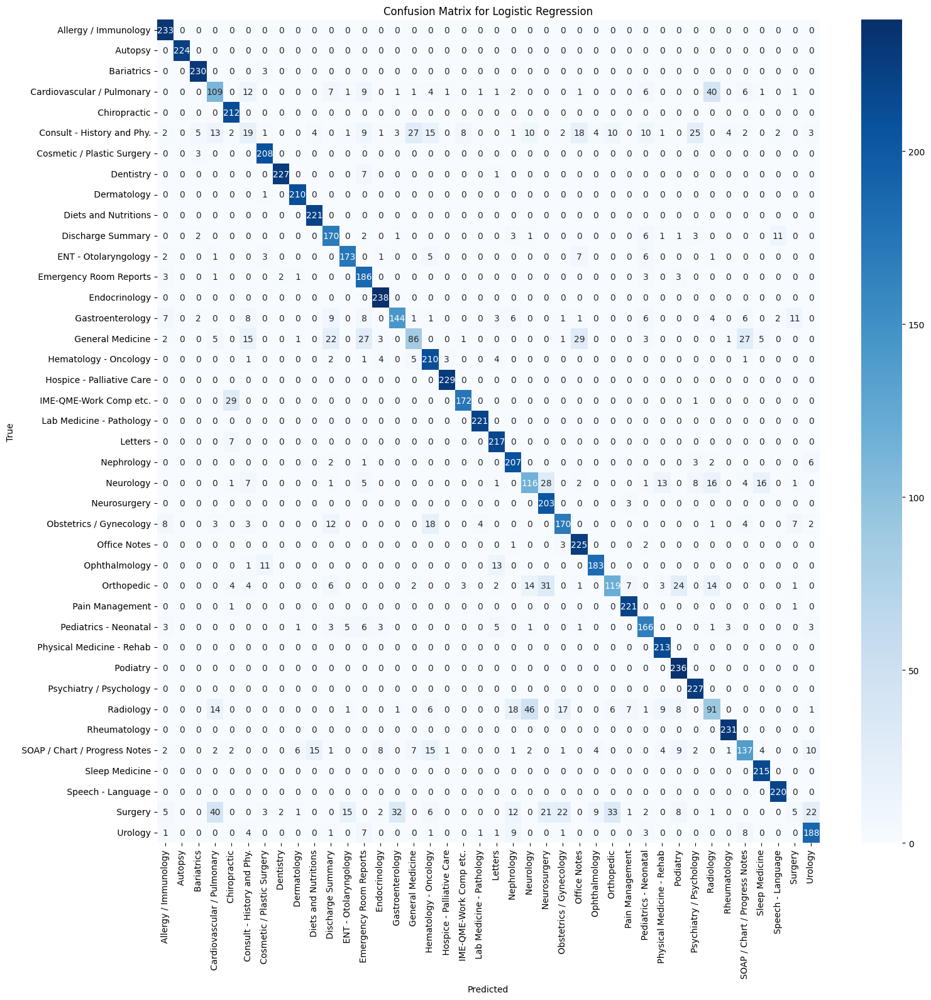

True Positives (TP): 224
True Negatives (TN): 233
False Positives (FP): 0
False Negatives (FN): 0
True Positive Rate (TPR): 1.0
False Positive Rate (FPR): 0.0


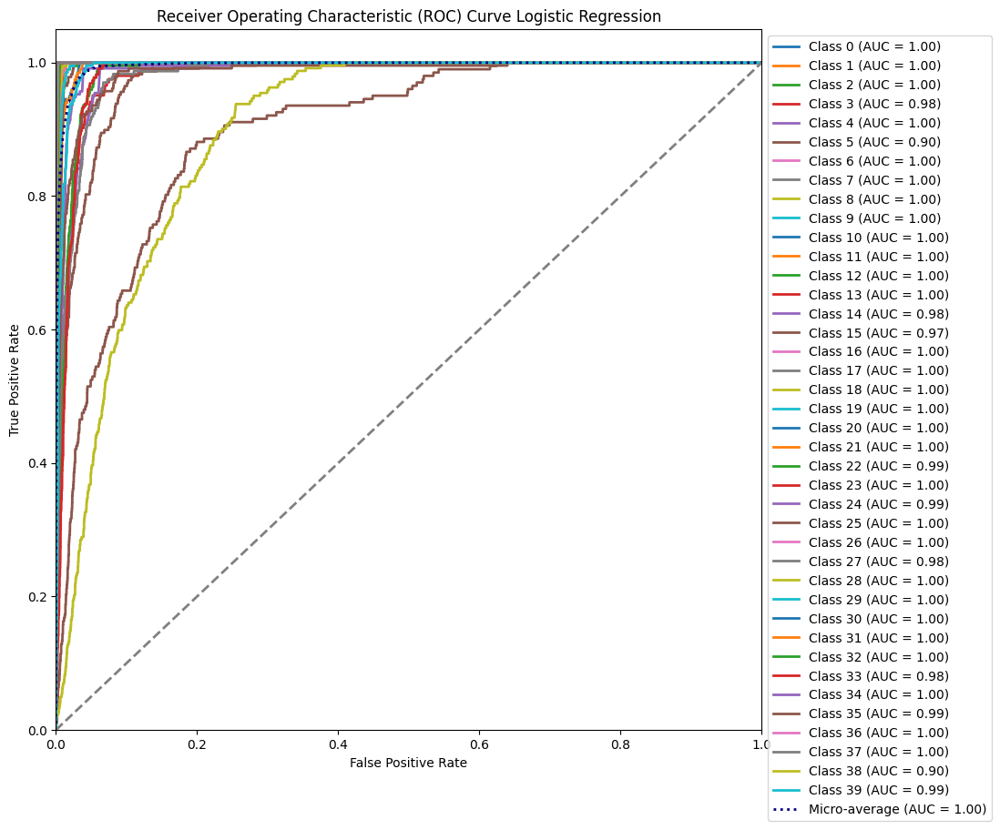

Class 0 AUC: 1.00
Class 1 AUC: 1.00
Class 2 AUC: 1.00
Class 3 AUC: 0.98
Class 4 AUC: 1.00
Class 5 AUC: 0.90
Class 6 AUC: 1.00
Class 7 AUC: 1.00
Class 8 AUC: 1.00
Class 9 AUC: 1.00
Class 10 AUC: 1.00
Class 11 AUC: 1.00
Class 12 AUC: 1.00
Class 13 AUC: 1.00
Class 14 AUC: 0.98
Class 15 AUC: 0.97
Class 16 AUC: 1.00
Class 17 AUC: 1.00
Class 18 AUC: 1.00
Class 19 AUC: 1.00
Class 20 AUC: 1.00
Class 21 AUC: 1.00
Class 22 AUC: 0.99
Class 23 AUC: 1.00
Class 24 AUC: 0.99
Class 25 AUC: 1.00
Class 26 AUC: 1.00
Class 27 AUC: 0.98
Class 28 AUC: 1.00
Class 29 AUC: 1.00
Class 30 AUC: 1.00
Class 31 AUC: 1.00
Class 32 AUC: 1.00
Class 33 AUC: 0.98
Class 34 AUC: 1.00
Class 35 AUC: 0.99
Class 36 AUC: 1.00
Class 37 AUC: 1.00
Class 38 AUC: 0.90
Class 39 AUC: 0.99
Micro-average AUC: 1.00


In [25]:
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.model_selection import RandomizedSearchCV, cross_validate
from sklearn.linear_model import LogisticRegression

# Logistic Regression classification model (13-12-24)
classifier = LogisticRegression()

# Define the parameter distribution for hyperparameter tuning
param_dist = {
    'C': [0.1, 1, 10],  # Regularization strength
    'solver': ['liblinear', 'lbfgs', 'saga'],  # Solver to use for optimization
    'max_iter': [100, 250, 500, 1000],  # Maximum number of iterations for the solvers
    'penalty': ['l2', 'l1', 'elasticnet'],  # Regularization penalty
    'multi_class': ['auto', 'ovr', 'multinomial'],  # Multi-class strategy
    'fit_intercept': [True, False],  # Whether to include the intercept term
    'class_weight': [None, 'balanced'],  # Weigh classes differently in imbalanced datasets
    'tol': [1e-5, 1e-3],  # Tolerance for stopping criteria
}

# Set up RandomizedSearchCV for hyperparameter tuning with cross-validation
random_search = RandomizedSearchCV(estimator=classifier, param_distributions=param_dist, 
                                   n_iter=10, cv=2, n_jobs=-1, verbose=1, scoring='accuracy', random_state=42)

# Train the model with RandomizedSearchCV
random_search.fit(x_train, y_train)

# Print the best parameters and the best score found by RandomizedSearchCV
print(f"Best parameters from RandomizedSearchCV: {random_search.best_params_}")
print(f"Best cross-validation score: {random_search.best_score_}")

# Use the best estimator found by RandomizedSearchCV
best_classifier = random_search.best_estimator_

# Cross-validation results with the best model (2-fold cross-validation)
cv_results = cross_validate(best_classifier, x_train, y_train, cv=2)

# Print cross-validation results (accuracy, fit time, score time)
print("Cross-validation results: ", cv_results)

# Logistic Regression classification report using the best model
prediction = best_classifier.predict(x_val)

# Print classification report (with the correct order for y_true and y_pred)
print('Classification report for Logistic Regression: \n', classification_report(y_val, prediction, target_names=list(le.classes_), digits=4))

# Confusion Matrix Logistic Regression
conf_matrix = confusion_matrix(y_val, prediction)

# Plotting the confusion matrix
plt.figure(figsize=(17, 17))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=le.classes_, yticklabels=le.classes_)
plt.title('Confusion Matrix for Logistic Regression')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# Compute TP, TN, FP, FN for a binary classification example (choose one class)
TP = conf_matrix[1, 1]  # True Positive
TN = conf_matrix[0, 0]  # True Negative
FP = conf_matrix[0, 1]  # False Positive
FN = conf_matrix[1, 0]  # False Negative

# Print TP, TN, FP, FN
print(f"True Positives (TP): {TP}")
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")

# Calculate True Positive Rate (TPR) and False Positive Rate (FPR)
TPR = TP / (TP + FN)  # Sensitivity, Recall
FPR = FP / (FP + TN)  # 1 - Specificity

# Print TPR and FPR
print(f"True Positive Rate (TPR): {TPR}")
print(f"False Positive Rate (FPR): {FPR}")

# Binarize the true labels for multi-class ROC calculation
y_val_bin = label_binarize(y_val, classes=np.unique(y_val))  # Binarize true labels
y_score = best_classifier.predict_proba(x_val)  # Predicted probabilities

# Number of classes
n_classes = y_score.shape[1]

# Compute ROC curve and AUC for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_val_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and AUC
fpr["micro"], tpr["micro"], _ = roc_curve(y_val_bin.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Plot all ROC curves
plt.figure(figsize=(10, 10))

# Plot ROC curve for each class
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], lw=2, label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

# Plot micro-average ROC curve
plt.plot(fpr["micro"], tpr["micro"], color='navy', lw=2, linestyle=':', label=f'Micro-average (AUC = {roc_auc["micro"]:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve Logistic Regression')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.show()

# Optionally, print AUC for each class and the micro-average AUC
for i in range(n_classes):
    print(f'Class {i} AUC: {roc_auc[i]:.2f}')
print(f'Micro-average AUC: {roc_auc["micro"]:.2f}')

Fitting 2 folds for each of 10 candidates, totalling 20 fits
Best parameters from RandomizedSearchCV: {'tol': 1e-05, 'solver': 'liblinear', 'penalty': 'l2', 'multi_class': 'ovr', 'max_iter': 500, 'fit_intercept': False, 'class_weight': 'balanced', 'C': 1}
Best cross-validation score: 0.8181663644605621
Cross-validation results:  {'fit_time': array([76.90417504, 77.76593423]), 'score_time': array([0.34419394, 0.34805393]), 'test_score': array([0.81992294, 0.81640979])}
Classification report for Logistic Regression: 
                                 precision    recall  f1-score   support

          Allergy / Immunology     0.8694    1.0000    0.9301       233
                       Autopsy     1.0000    1.0000    1.0000       224
                    Bariatrics     0.9187    0.9700    0.9436       233
    Cardiovascular / Pulmonary     0.6250    0.6373    0.6311       204
                  Chiropractic     0.7786    0.9623    0.8608       212
    Consult - History and Phy.     0.3214    

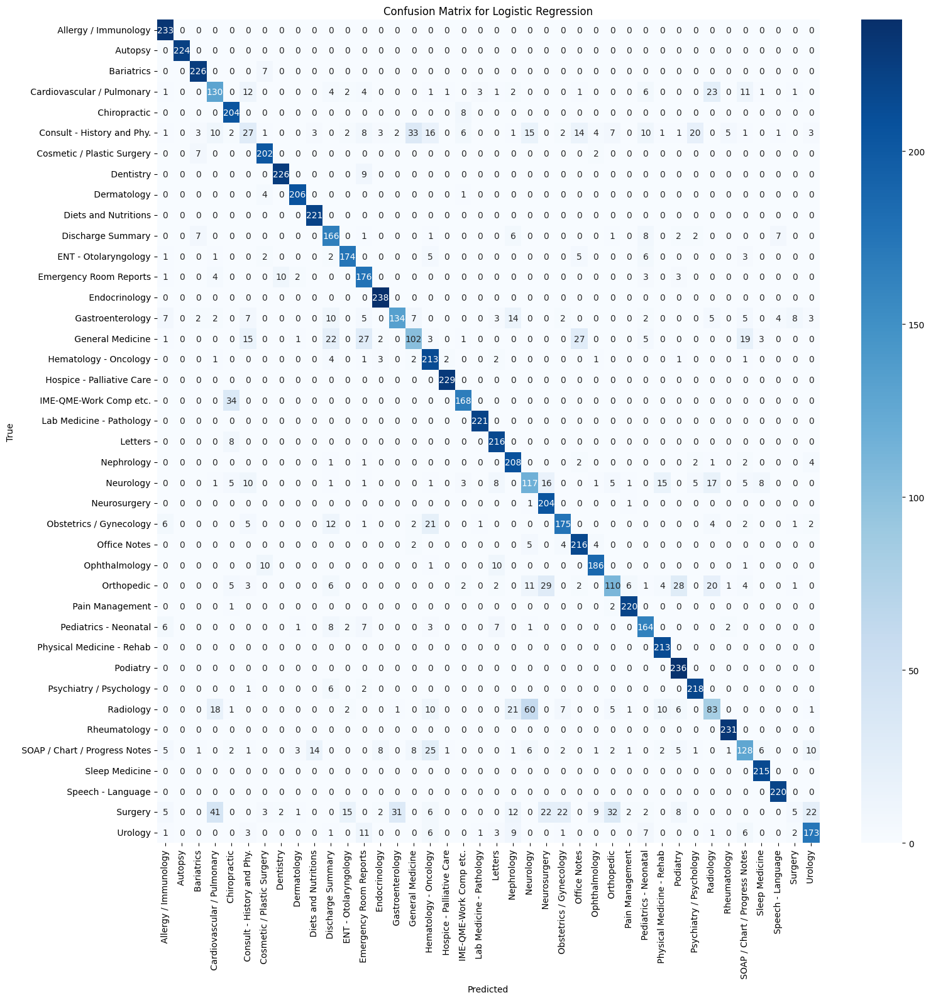

True Positives (TP): 224
True Negatives (TN): 233
False Positives (FP): 0
False Negatives (FN): 0
True Positive Rate (TPR): 1.0
False Positive Rate (FPR): 0.0


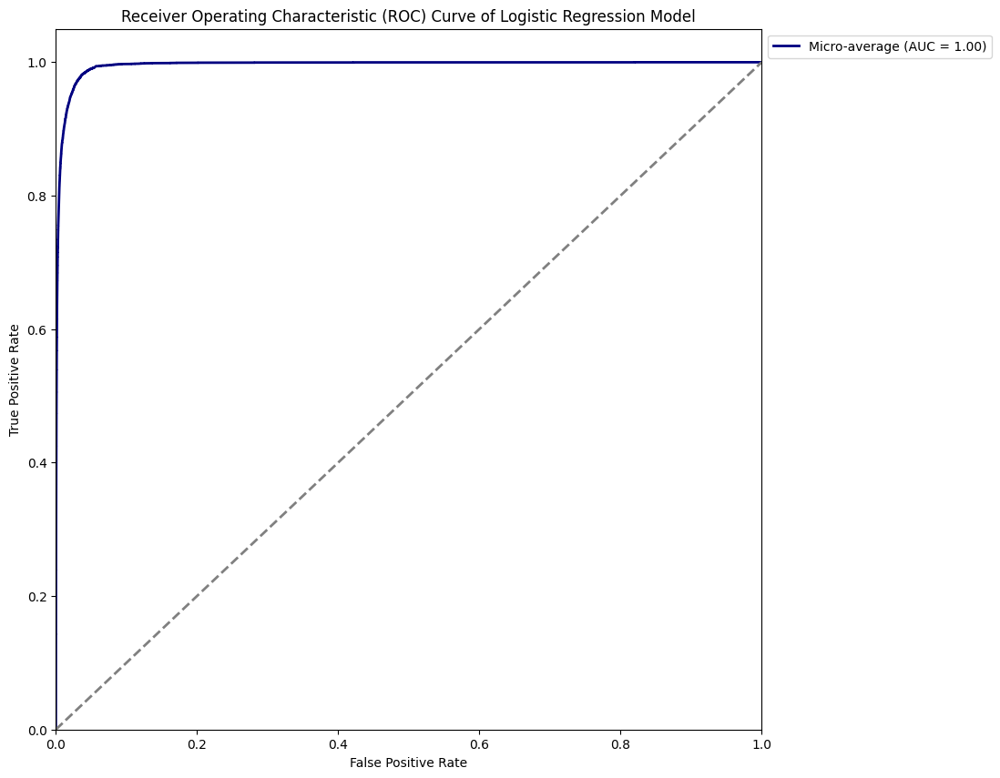

Micro-average AUC: 1.00


In [25]:
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.model_selection import RandomizedSearchCV, cross_validate
from sklearn.linear_model import LogisticRegression

# Logistic Regression classification model
classifier = LogisticRegression()

# Define the parameter distribution for hyperparameter tuning
param_dist = {
    'C': [0.1, 1, 10],  # Regularization strength
    'solver': ['liblinear', 'lbfgs', 'saga'],  # Solver to use for optimization
    'max_iter': [100, 250, 500, 1000],  # Maximum number of iterations for the solvers
    'penalty': ['l2', 'l1', 'elasticnet'],  # Regularization penalty
    'multi_class': ['auto', 'ovr', 'multinomial'],  # Multi-class strategy
    'fit_intercept': [True, False],  # Whether to include the intercept term
    'class_weight': [None, 'balanced'],  # Weigh classes differently in imbalanced datasets
    'tol': [1e-5, 1e-3],  # Tolerance for stopping criteria
}

# Set up RandomizedSearchCV for hyperparameter tuning with cross-validation
random_search = RandomizedSearchCV(estimator=classifier, param_distributions=param_dist, 
                                   n_iter=10, cv=2, n_jobs=-1, verbose=1, scoring='accuracy', random_state=42)

# Train the model with RandomizedSearchCV
random_search.fit(x_train, y_train)

# Print the best parameters and the best score found by RandomizedSearchCV
print(f"Best parameters from RandomizedSearchCV: {random_search.best_params_}")
print(f"Best cross-validation score: {random_search.best_score_}")

# Use the best estimator found by RandomizedSearchCV
best_classifier = random_search.best_estimator_

# Cross-validation results with the best model (2-fold cross-validation)
cv_results = cross_validate(best_classifier, x_train, y_train, cv=2)

# Print cross-validation results (accuracy, fit time, score time)
print("Cross-validation results: ", cv_results)

# Logistic Regression classification report using the best model
prediction = best_classifier.predict(x_val)

# Print classification report (with the correct order for y_true and y_pred)
print('Classification report for Logistic Regression: \n', classification_report(y_val, prediction, target_names=list(le.classes_), digits=4))

# Confusion Matrix Logistic Regression
conf_matrix = confusion_matrix(y_val, prediction)

# Plotting the confusion matrix
plt.figure(figsize=(17, 17))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=le.classes_, yticklabels=le.classes_)
plt.title('Confusion Matrix for Logistic Regression')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# Compute TP, TN, FP, FN for a binary classification example (choose one class)
TP = conf_matrix[1, 1]  # True Positive
TN = conf_matrix[0, 0]  # True Negative
FP = conf_matrix[0, 1]  # False Positive
FN = conf_matrix[1, 0]  # False Negative

# Print TP, TN, FP, FN
print(f"True Positives (TP): {TP}")
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")

# Calculate True Positive Rate (TPR) and False Positive Rate (FPR)
TPR = TP / (TP + FN)  # Sensitivity, Recall
FPR = FP / (FP + TN)  # 1 - Specificity

# Print TPR and FPR
print(f"True Positive Rate (TPR): {TPR}")
print(f"False Positive Rate (FPR): {FPR}")

# Binarize the true labels for multi-class ROC calculation
y_val_bin = label_binarize(y_val, classes=np.unique(y_val))  # Binarize true labels
y_score = best_classifier.predict_proba(x_val)  # Predicted probabilities

# Compute micro-average ROC curve and AUC
fpr, tpr, _ = roc_curve(y_val_bin.ravel(), y_score.ravel())
roc_auc = auc(fpr, tpr)

# Plot the ROC curve for micro-average
plt.figure(figsize=(10, 10))

# Plot micro-average ROC curve
plt.plot(fpr, tpr, color='navy', lw=2, linestyle='-', label=f'Micro-average (AUC = {roc_auc:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve of Logistic Regression Model')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.show()

# Print micro-average AUC
print(f'Micro-average AUC: {roc_auc:.2f}')

Fitting 2 folds for each of 10 candidates, totalling 20 fits
Best hyperparameters from RandomizedSearchCV:  {'random_state': 42, 'n_jobs': -1, 'n_estimators': 300, 'min_samples_split': 5, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'max_depth': 30, 'class_weight': 'balanced', 'bootstrap': True}
Best cross-validation score:  0.8243710335448776
Cross-validation results:  {'fit_time': array([44.15459609, 43.88830352]), 'score_time': array([1.44394755, 1.38387012]), 'test_score': array([0.82473935, 0.82400272])}
Classification report for Random Forest with RandomizedSearchCV: 
                                 precision    recall  f1-score   support

          Allergy / Immunology     0.9871    0.9871    0.9871       233
                       Autopsy     1.0000    1.0000    1.0000       224
                    Bariatrics     0.9547    0.9957    0.9748       233
    Cardiovascular / Pulmonary     0.6104    0.4608    0.5251       204
                  Chiropractic     0.8690    0.9387    

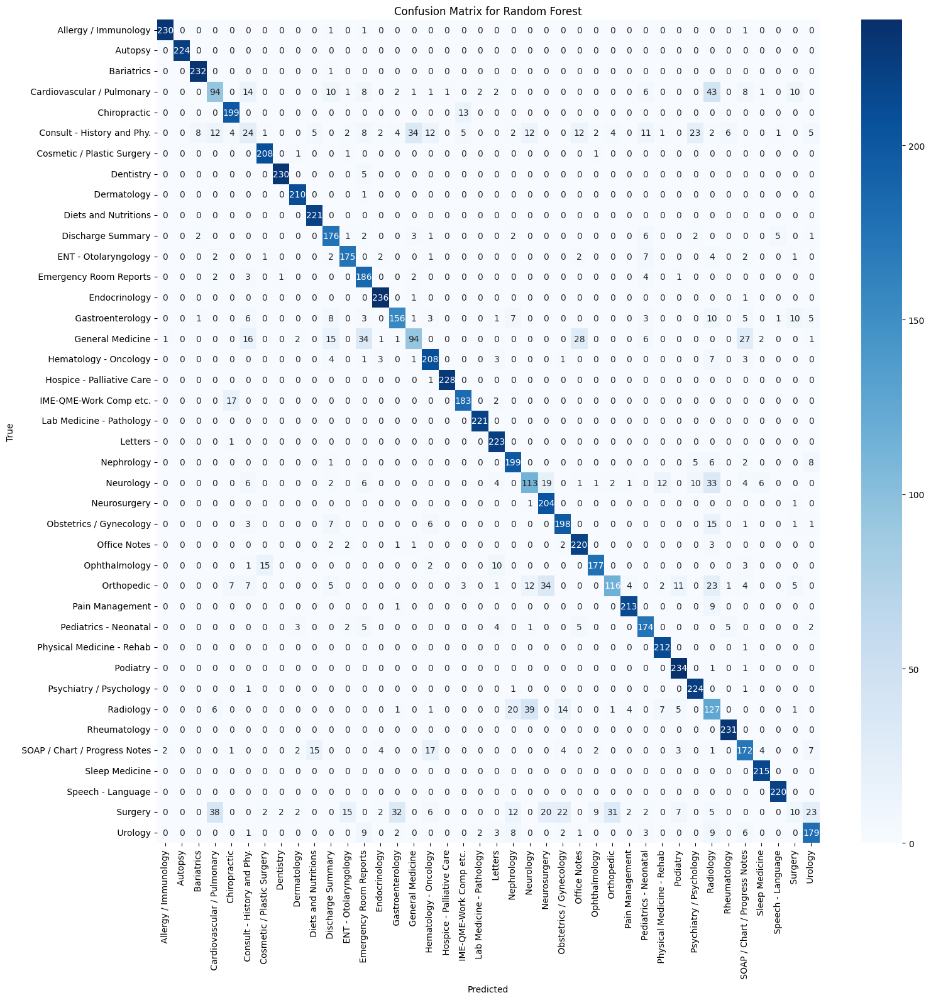

True Positives (TP): 224
True Negatives (TN): 230
False Positives (FP): 0
False Negatives (FN): 0
True Positive Rate (TPR): 1.0
False Positive Rate (FPR): 0.0


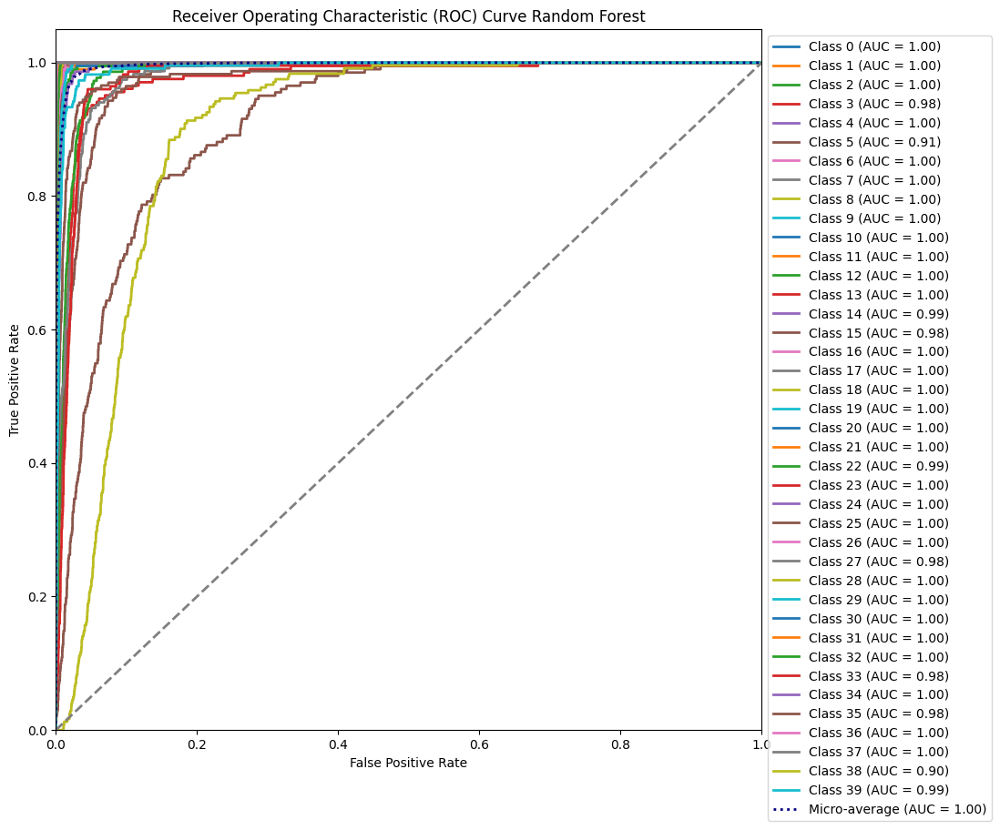

Class 0 AUC: 1.00
Class 1 AUC: 1.00
Class 2 AUC: 1.00
Class 3 AUC: 0.98
Class 4 AUC: 1.00
Class 5 AUC: 0.91
Class 6 AUC: 1.00
Class 7 AUC: 1.00
Class 8 AUC: 1.00
Class 9 AUC: 1.00
Class 10 AUC: 1.00
Class 11 AUC: 1.00
Class 12 AUC: 1.00
Class 13 AUC: 1.00
Class 14 AUC: 0.99
Class 15 AUC: 0.98
Class 16 AUC: 1.00
Class 17 AUC: 1.00
Class 18 AUC: 1.00
Class 19 AUC: 1.00
Class 20 AUC: 1.00
Class 21 AUC: 1.00
Class 22 AUC: 0.99
Class 23 AUC: 1.00
Class 24 AUC: 1.00
Class 25 AUC: 1.00
Class 26 AUC: 1.00
Class 27 AUC: 0.98
Class 28 AUC: 1.00
Class 29 AUC: 1.00
Class 30 AUC: 1.00
Class 31 AUC: 1.00
Class 32 AUC: 1.00
Class 33 AUC: 0.98
Class 34 AUC: 1.00
Class 35 AUC: 0.98
Class 36 AUC: 1.00
Class 37 AUC: 1.00
Class 38 AUC: 0.90
Class 39 AUC: 0.99
Micro-average AUC: 1.00


In [22]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.model_selection import RandomizedSearchCV, cross_validate
from sklearn.model_selection import train_test_split

# Define the RandomForestClassifier
classifier = RandomForestClassifier()

# Define the parameter distribution for RandomizedSearchCV
param_dist = {
    'n_estimators': [100, 200, 300],  # Number of trees in the forest
    'max_depth': [10, 20, 30],         # Maximum depth of the tree
    'min_samples_split': [5, 10, 20],  # Minimum number of samples to split an internal node
    'min_samples_leaf': [5, 15, 25],   # Minimum number of samples at a leaf node
    'max_features': ['auto', 'sqrt'],  # Number of features to consider at each split
    'bootstrap': [True, False],        # Bootstrap sampling for tree construction
    'class_weight': ['balanced'],      # Class weighting for imbalanced datasets
    'n_jobs': [-1],                    # Use all available processors
    'random_state': [42]               # Random state for reproducibility
}

# RandomizedSearchCV for hyperparameter tuning with 2-fold cross-validation
random_search = RandomizedSearchCV(
    estimator=classifier, 
    param_distributions=param_dist,
    n_iter=10,  # Number of random parameter combinations to try
    cv=2,       # 2-fold cross-validation
    verbose=1,  # Verbosity to track progress
    random_state=42,
    n_jobs=-1   # Use all available processors
)

# Train the model with RandomizedSearchCV
random_search.fit(x_train, y_train)

# Print the best parameters and the best score from RandomizedSearchCV
print("Best hyperparameters from RandomizedSearchCV: ", random_search.best_params_)
print("Best cross-validation score: ", random_search.best_score_)

# Use the best estimator for prediction
best_classifier = random_search.best_estimator_

# Cross-validation with 2 folds (using the best model)
cv_results = cross_validate(best_classifier, x_train, y_train, cv=2)

# Print cross-validation results
print("Cross-validation results: ", cv_results)

# Predictions using the best classifier
prediction = best_classifier.predict(x_val)

# Print the classification report for the Random Forest model
print("Classification report for Random Forest with RandomizedSearchCV: \n", 
      classification_report(y_val, prediction, target_names=list(le.classes_), digits=4))

# Confusion Matrix for Random Forest model
conf_matrix = confusion_matrix(y_val, prediction)

# Plotting the confusion matrix
plt.figure(figsize=(17, 17))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=le.classes_, yticklabels=le.classes_)
plt.title('Confusion Matrix for Random Forest')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# Compute TP, TN, FP, FN for a binary classification example (choose one class)
TP = conf_matrix[1, 1]  # True Positive
TN = conf_matrix[0, 0]  # True Negative
FP = conf_matrix[0, 1]  # False Positive
FN = conf_matrix[1, 0]  # False Negative

# Print TP, TN, FP, FN
print(f"True Positives (TP): {TP}")
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")

# Calculate True Positive Rate (TPR) and False Positive Rate (FPR)
TPR = TP / (TP + FN)  # Sensitivity, Recall
FPR = FP / (FP + TN)  # 1 - Specificity

# Print TPR and FPR
print(f"True Positive Rate (TPR): {TPR}")
print(f"False Positive Rate (FPR): {FPR}")

# Binarize the true labels for multi-class ROC calculation
y_val_bin = label_binarize(y_val, classes=np.unique(y_val))  # Binarize true labels
y_score = best_classifier.predict_proba(x_val)  # Predicted probabilities

# Number of classes
n_classes = y_score.shape[1]

# Compute ROC curve and AUC for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_val_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and AUC
fpr["micro"], tpr["micro"], _ = roc_curve(y_val_bin.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Plot all ROC curves
plt.figure(figsize=(10, 10))

# Plot ROC curve for each class
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], lw=2, label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

# Plot micro-average ROC curve
plt.plot(fpr["micro"], tpr["micro"], color='navy', lw=2, linestyle=':', label=f'Micro-average (AUC = {roc_auc["micro"]:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve Random Forest')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.show()

# Optionally, print AUC for each class and the micro-average AUC
for i in range(n_classes):
    print(f'Class {i} AUC: {roc_auc[i]:.2f}')
print(f'Micro-average AUC: {roc_auc["micro"]:.2f}')

Fitting 2 folds for each of 10 candidates, totalling 20 fits
Best hyperparameters from RandomizedSearchCV:  {'random_state': 42, 'n_jobs': -1, 'n_estimators': 300, 'min_samples_split': 5, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'max_depth': 30, 'class_weight': 'balanced', 'bootstrap': True}
Best cross-validation score:  0.8262975974614688
Cross-validation results:  {'fit_time': array([50.81260657, 52.46656346]), 'score_time': array([2.11227942, 2.10753465]), 'test_score': array([0.82796917, 0.82462602])}
Classification report for Random Forest with RandomizedSearchCV: 
                                 precision    recall  f1-score   support

          Allergy / Immunology     0.9830    0.9914    0.9872       233
                       Autopsy     1.0000    1.0000    1.0000       224
                    Bariatrics     0.9388    0.9871    0.9623       233
    Cardiovascular / Pulmonary     0.6433    0.4951    0.5596       204
                  Chiropractic     0.8498    0.9340    

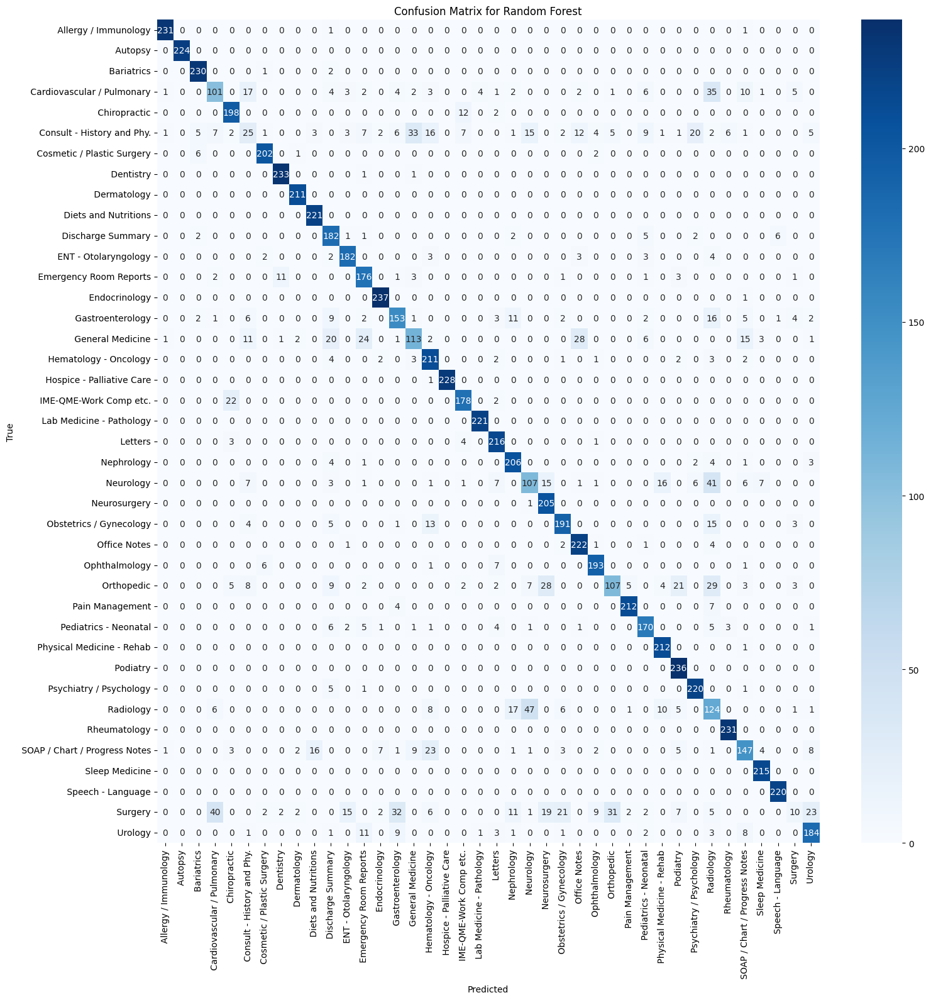

True Positives (TP): 224
True Negatives (TN): 231
False Positives (FP): 0
False Negatives (FN): 0
True Positive Rate (TPR): 1.0
False Positive Rate (FPR): 0.0


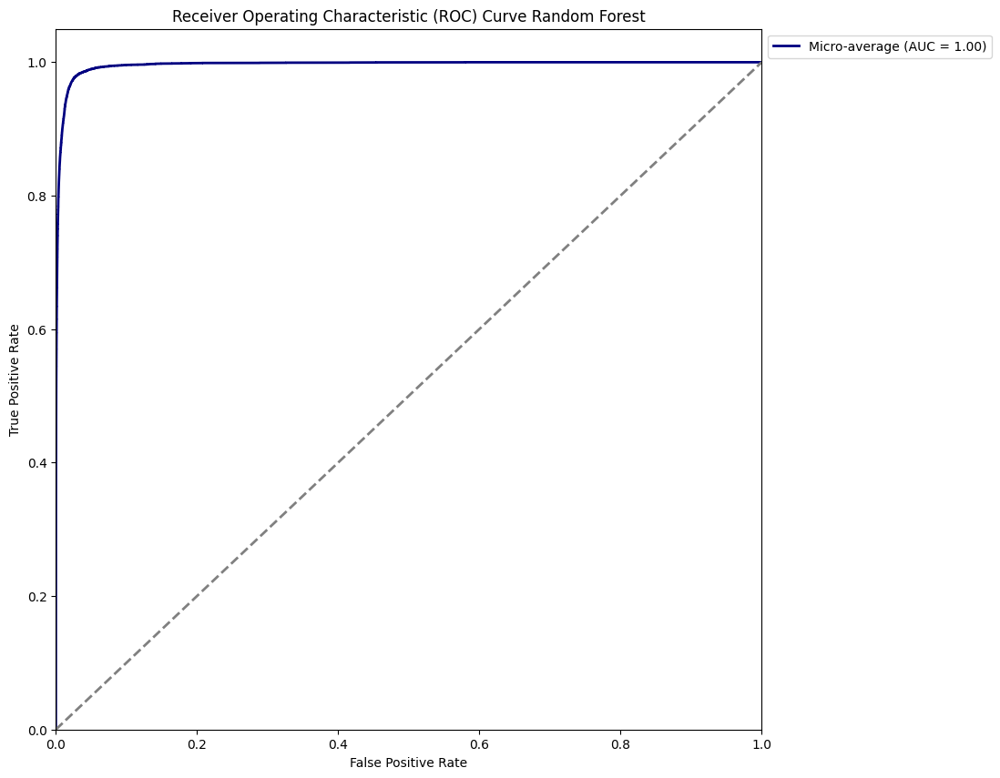

Micro-average AUC: 1.00


In [26]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.model_selection import RandomizedSearchCV, cross_validate
from sklearn.model_selection import train_test_split

# Define the RandomForestClassifier
classifier = RandomForestClassifier()

# Define the parameter distribution for RandomizedSearchCV
param_dist = {
    'n_estimators': [100, 200, 300],  # Number of trees in the forest
    'max_depth': [10, 20, 30],         # Maximum depth of the tree
    'min_samples_split': [5, 10, 20],  # Minimum number of samples to split an internal node
    'min_samples_leaf': [5, 15, 25],   # Minimum number of samples at a leaf node
    'max_features': ['auto', 'sqrt'],  # Number of features to consider at each split
    'bootstrap': [True, False],        # Bootstrap sampling for tree construction
    'class_weight': ['balanced'],      # Class weighting for imbalanced datasets
    'n_jobs': [-1],                    # Use all available processors
    'random_state': [42]               # Random state for reproducibility
}

# RandomizedSearchCV for hyperparameter tuning with 2-fold cross-validation
random_search = RandomizedSearchCV(
    estimator=classifier, 
    param_distributions=param_dist,
    n_iter=10,  # Number of random parameter combinations to try
    cv=2,       # 2-fold cross-validation
    verbose=1,  # Verbosity to track progress
    random_state=42,
    n_jobs=-1   # Use all available processors
)

# Train the model with RandomizedSearchCV
random_search.fit(x_train, y_train)

# Print the best parameters and the best score from RandomizedSearchCV
print("Best hyperparameters from RandomizedSearchCV: ", random_search.best_params_)
print("Best cross-validation score: ", random_search.best_score_)

# Use the best estimator for prediction
best_classifier = random_search.best_estimator_

# Cross-validation with 2 folds (using the best model)
cv_results = cross_validate(best_classifier, x_train, y_train, cv=2)

# Print cross-validation results
print("Cross-validation results: ", cv_results)

# Predictions using the best classifier
prediction = best_classifier.predict(x_val)

# Print the classification report for the Random Forest model
print("Classification report for Random Forest with RandomizedSearchCV: \n", 
      classification_report(y_val, prediction, target_names=list(le.classes_), digits=4))

# Confusion Matrix for Random Forest model
conf_matrix = confusion_matrix(y_val, prediction)

# Plotting the confusion matrix
plt.figure(figsize=(17, 17))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=le.classes_, yticklabels=le.classes_)
plt.title('Confusion Matrix for Random Forest')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# Compute TP, TN, FP, FN for a binary classification example (choose one class)
TP = conf_matrix[1, 1]  # True Positive
TN = conf_matrix[0, 0]  # True Negative
FP = conf_matrix[0, 1]  # False Positive
FN = conf_matrix[1, 0]  # False Negative

# Print TP, TN, FP, FN
print(f"True Positives (TP): {TP}")
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")

# Calculate True Positive Rate (TPR) and False Positive Rate (FPR)
TPR = TP / (TP + FN)  # Sensitivity, Recall
FPR = FP / (FP + TN)  # 1 - Specificity

# Print TPR and FPR
print(f"True Positive Rate (TPR): {TPR}")
print(f"False Positive Rate (FPR): {FPR}")

# Binarize the true labels for multi-class ROC calculation
y_val_bin = label_binarize(y_val, classes=np.unique(y_val))  # Binarize true labels
y_score = best_classifier.predict_proba(x_val)  # Predicted probabilities

# Compute micro-average ROC curve and AUC
fpr, tpr, _ = roc_curve(y_val_bin.ravel(), y_score.ravel())
roc_auc = auc(fpr, tpr)

# Plot the ROC curve for micro-average
plt.figure(figsize=(10, 10))

plt.plot(fpr, tpr, color='navy', lw=2, linestyle='-', label=f'Micro-average (AUC = {roc_auc:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve Random Forest')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.show()

# Print micro-average AUC
print(f'Micro-average AUC: {roc_auc:.2f}')

Fitting 2 folds for each of 10 candidates, totalling 20 fits
Best hyperparameters from RandomizedSearchCV:  {'validation_fraction': 0.2, 'solver': 'adam', 'n_iter_no_change': 10, 'max_iter': 100, 'learning_rate_init': 0.001, 'learning_rate': 'constant', 'hidden_layer_sizes': (100,), 'early_stopping': False, 'batch_size': 'auto', 'alpha': 0.001, 'activation': 'relu'}
Best cross-validation score:  0.8356470988213962
Cross-validation results (2-fold):  [0.8355621  0.83573209]
Mean accuracy from cross-validation: 0.8356
Classification report for Multi-Layer Perceptron with RandomizedSearchCV: 
                                 precision    recall  f1-score   support

          Allergy / Immunology     0.9708    1.0000    0.9852       233
                       Autopsy     1.0000    1.0000    1.0000       224
                    Bariatrics     0.9588    1.0000    0.9790       233
    Cardiovascular / Pulmonary     0.5850    0.5735    0.5792       204
                  Chiropractic     0.8995

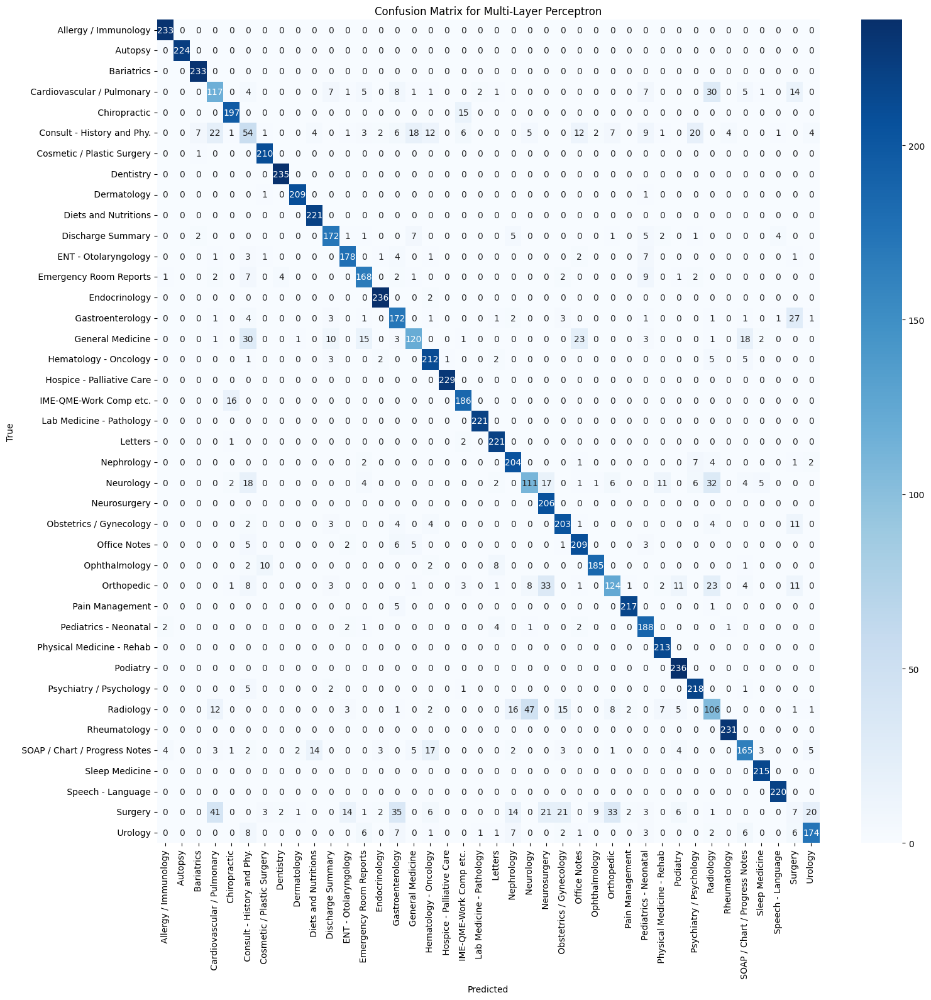

True Positives (TP): 224
True Negatives (TN): 233
False Positives (FP): 0
False Negatives (FN): 0
True Positive Rate (TPR): 1.0
False Positive Rate (FPR): 0.0


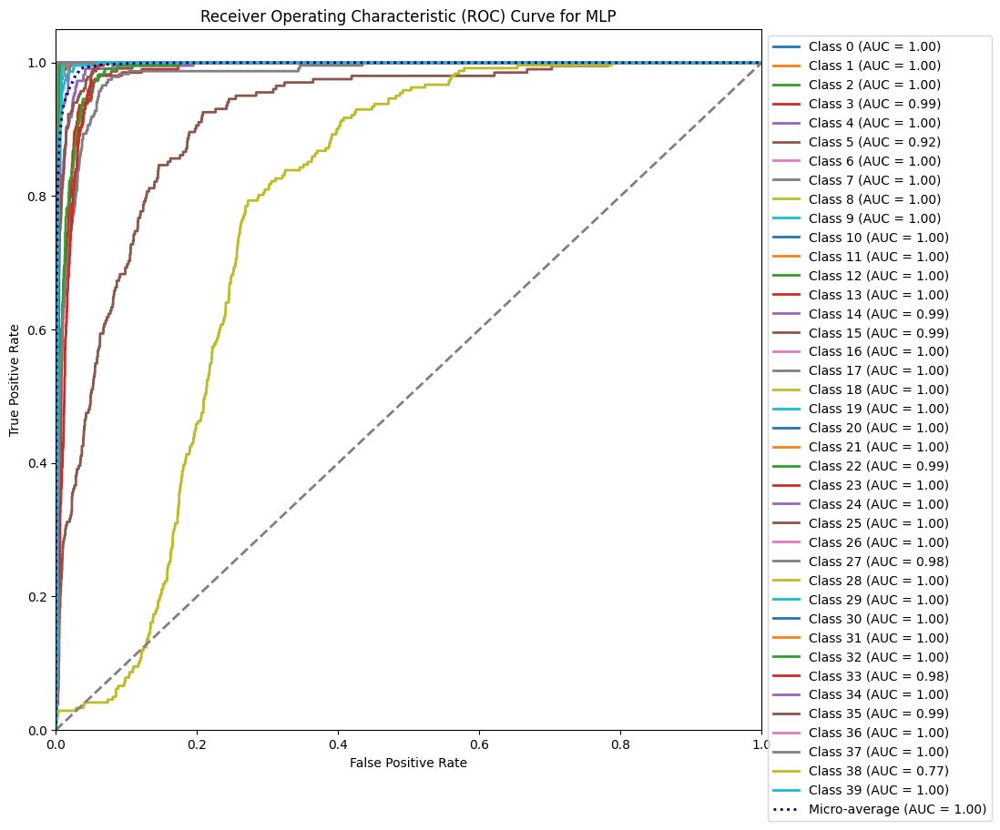

Class 0 AUC: 1.00
Class 1 AUC: 1.00
Class 2 AUC: 1.00
Class 3 AUC: 0.99
Class 4 AUC: 1.00
Class 5 AUC: 0.92
Class 6 AUC: 1.00
Class 7 AUC: 1.00
Class 8 AUC: 1.00
Class 9 AUC: 1.00
Class 10 AUC: 1.00
Class 11 AUC: 1.00
Class 12 AUC: 1.00
Class 13 AUC: 1.00
Class 14 AUC: 0.99
Class 15 AUC: 0.99
Class 16 AUC: 1.00
Class 17 AUC: 1.00
Class 18 AUC: 1.00
Class 19 AUC: 1.00
Class 20 AUC: 1.00
Class 21 AUC: 1.00
Class 22 AUC: 0.99
Class 23 AUC: 1.00
Class 24 AUC: 1.00
Class 25 AUC: 1.00
Class 26 AUC: 1.00
Class 27 AUC: 0.98
Class 28 AUC: 1.00
Class 29 AUC: 1.00
Class 30 AUC: 1.00
Class 31 AUC: 1.00
Class 32 AUC: 1.00
Class 33 AUC: 0.98
Class 34 AUC: 1.00
Class 35 AUC: 0.99
Class 36 AUC: 1.00
Class 37 AUC: 1.00
Class 38 AUC: 0.77
Class 39 AUC: 1.00
Micro-average AUC: 1.00


In [23]:
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.model_selection import RandomizedSearchCV, cross_val_score
from sklearn.neural_network import MLPClassifier

# Initialize the MLPClassifier (without specifying hyperparameters, so RandomizedSearchCV will handle that)
classifier = MLPClassifier(random_state=42)

# Define the parameter distribution for RandomizedSearchCV
param_dist = {
    'hidden_layer_sizes': [(50,), (100,), (50, 50), (100, 100)],  # Different architectures (single and multi-layer)
    'activation': ['relu', 'tanh', 'logistic'],  # Activation function
    'solver': ['adam', 'sgd'],  # Optimization solver
    'alpha': [0.0001, 0.001, 0.01],  # L2 penalty (regularization)
    'learning_rate': ['constant', 'invscaling', 'adaptive'],  # Learning rate schedule
    'learning_rate_init': [0.001, 0.01, 0.1],  # Initial learning rate
    'batch_size': ['auto', 32, 64],  # Batch size for the SGD solver
    'max_iter': [100, 250, 500],  # Maximum number of iterations for training
    'early_stopping': [True, False],  # Whether to use early stopping to avoid overfitting
    'validation_fraction': [0.1, 0.2],  # Proportion of training data to set aside for early stopping
    'n_iter_no_change': [10, 20],  # Number of iterations with no improvement after which training will stop
}

# RandomizedSearchCV for hyperparameter tuning
random_search = RandomizedSearchCV(
    estimator=classifier,
    param_distributions=param_dist,
    n_iter=10,  # Number of random combinations to try
    cv=2,  # 2-fold cross-validation
    verbose=1,  # Verbosity to track progress
    random_state=42,
    n_jobs=-1  # Use all available cores
)

# Train the model using RandomizedSearchCV
random_search.fit(x_train, y_train)

# Print the best parameters and the best score from RandomizedSearchCV
print("Best hyperparameters from RandomizedSearchCV: ", random_search.best_params_)
print("Best cross-validation score: ", random_search.best_score_)

# Use the best estimator (MLP with the best hyperparameters) to make predictions
best_classifier = random_search.best_estimator_

# Cross-validation with 2 folds (using the best model found from RandomizedSearchCV)
cv_results = cross_val_score(best_classifier, x_train, y_train, cv=2)

# Print cross-validation results (accuracy scores)
print("Cross-validation results (2-fold): ", cv_results)
print(f"Mean accuracy from cross-validation: {np.mean(cv_results):.4f}")

# Predictions using the best classifier
prediction = best_classifier.predict(x_val)

# Print the classification report
print("Classification report for Multi-Layer Perceptron with RandomizedSearchCV: \n", 
      classification_report(y_val, prediction, target_names=list(le.classes_), digits=4))

# Confusion Matrix for MLP
conf_matrix = confusion_matrix(y_val, prediction)

# Plotting the confusion matrix
plt.figure(figsize=(17, 17))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=le.classes_, yticklabels=le.classes_)
plt.title('Confusion Matrix for Multi-Layer Perceptron')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# Compute TP, TN, FP, FN for a binary classification example (choose one class)
TP = conf_matrix[1, 1]  # True Positive
TN = conf_matrix[0, 0]  # True Negative
FP = conf_matrix[0, 1]  # False Positive
FN = conf_matrix[1, 0]  # False Negative

# Print TP, TN, FP, FN
print(f"True Positives (TP): {TP}")
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")

# Calculate True Positive Rate (TPR) and False Positive Rate (FPR)
TPR = TP / (TP + FN)  # Sensitivity, Recall
FPR = FP / (FP + TN)  # 1 - Specificity

# Print TPR and FPR
print(f"True Positive Rate (TPR): {TPR}")
print(f"False Positive Rate (FPR): {FPR}")

# Binarize the true labels for multi-class ROC calculation
y_val_bin = label_binarize(y_val, classes=np.unique(y_val))  # Binarize true labels
y_score = best_classifier.predict_proba(x_val)  # Predicted probabilities

# Number of classes
n_classes = y_score.shape[1]

# Compute ROC curve and AUC for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_val_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and AUC
fpr["micro"], tpr["micro"], _ = roc_curve(y_val_bin.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Plot all ROC curves
plt.figure(figsize=(10, 10))

# Plot ROC curve for each class
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], lw=2, label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

# Plot micro-average ROC curve
plt.plot(fpr["micro"], tpr["micro"], color='navy', lw=2, linestyle=':', label=f'Micro-average (AUC = {roc_auc["micro"]:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve for MLP')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.show()

# Optionally, print AUC for each class and the micro-average AUC
for i in range(n_classes):
    print(f'Class {i} AUC: {roc_auc[i]:.2f}')
print(f'Micro-average AUC: {roc_auc["micro"]:.2f}')

Fitting 2 folds for each of 10 candidates, totalling 20 fits
Best hyperparameters from RandomizedSearchCV:  {'validation_fraction': 0.2, 'solver': 'adam', 'n_iter_no_change': 10, 'max_iter': 100, 'learning_rate_init': 0.001, 'learning_rate': 'constant', 'hidden_layer_sizes': (100,), 'early_stopping': False, 'batch_size': 'auto', 'alpha': 0.001, 'activation': 'relu'}
Best cross-validation score:  0.8374603354487761
Cross-validation results (2-fold):  [0.83850861 0.83641206]
Mean accuracy from cross-validation: 0.8375
Classification report for Multi-Layer Perceptron with RandomizedSearchCV: 
                                 precision    recall  f1-score   support

          Allergy / Immunology     0.9790    1.0000    0.9894       233
                       Autopsy     1.0000    1.0000    1.0000       224
                    Bariatrics     0.9431    0.9957    0.9687       233
    Cardiovascular / Pulmonary     0.6372    0.6716    0.6539       204
                  Chiropractic     0.8646

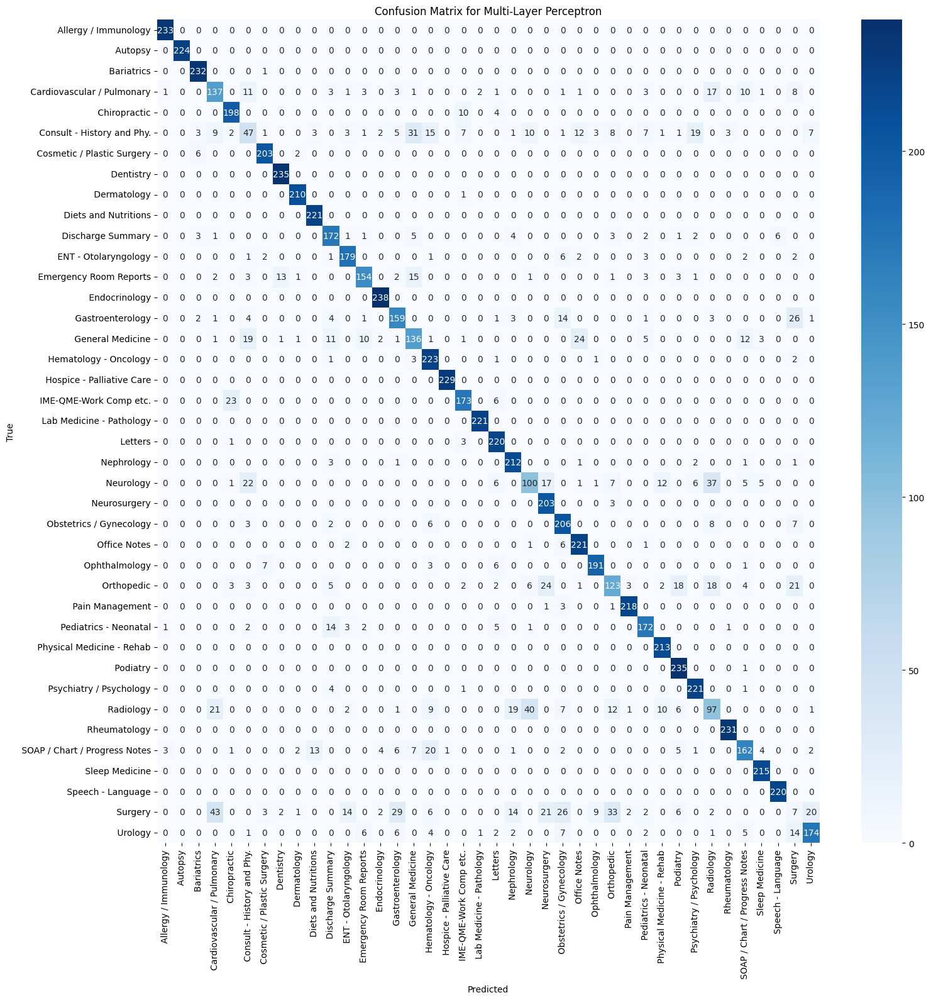

True Positives (TP): 224
True Negatives (TN): 233
False Positives (FP): 0
False Negatives (FN): 0
True Positive Rate (TPR): 1.0
False Positive Rate (FPR): 0.0


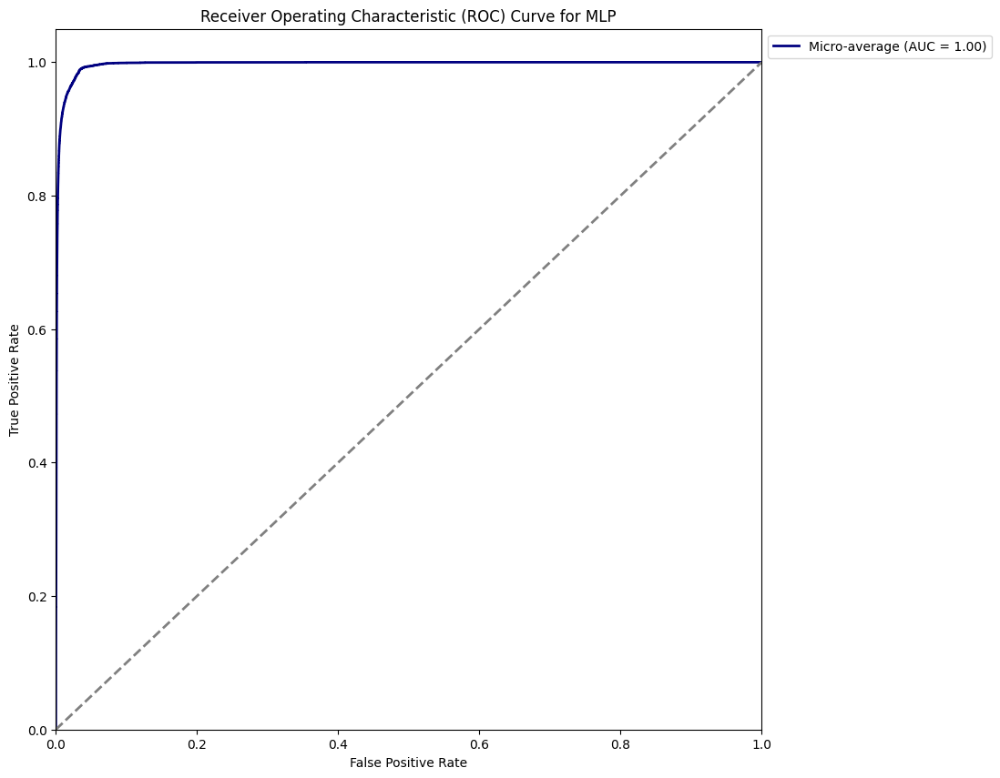

Micro-average AUC: 1.00


In [27]:
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.model_selection import RandomizedSearchCV, cross_val_score
from sklearn.neural_network import MLPClassifier 

# Initialize the MLPClassifier (without specifying hyperparameters, so RandomizedSearchCV will handle that)
classifier = MLPClassifier(random_state=42)

# Define the parameter distribution for RandomizedSearchCV
param_dist = {
    'hidden_layer_sizes': [(50,), (100,), (50, 50), (100, 100)],  # Different architectures (single and multi-layer)
    'activation': ['relu', 'tanh', 'logistic'],  # Activation function
    'solver': ['adam', 'sgd'],  # Optimization solver
    'alpha': [0.0001, 0.001, 0.01],  # L2 penalty (regularization)
    'learning_rate': ['constant', 'invscaling', 'adaptive'],  # Learning rate schedule
    'learning_rate_init': [0.001, 0.01, 0.1],  # Initial learning rate
    'batch_size': ['auto', 32, 64],  # Batch size for the SGD solver
    'max_iter': [100, 250, 500],  # Maximum number of iterations for training
    'early_stopping': [True, False],  # Whether to use early stopping to avoid overfitting
    'validation_fraction': [0.1, 0.2],  # Proportion of training data to set aside for early stopping
    'n_iter_no_change': [10, 20],  # Number of iterations with no improvement after which training will stop
}

# RandomizedSearchCV for hyperparameter tuning
random_search = RandomizedSearchCV(
    estimator=classifier,
    param_distributions=param_dist,
    n_iter=10,  # Number of random combinations to try
    cv=2,  # 2-fold cross-validation
    verbose=1,  # Verbosity to track progress
    random_state=42,
    n_jobs=-1  # Use all available cores
)

# Train the model using RandomizedSearchCV
random_search.fit(x_train, y_train)

# Print the best parameters and the best score from RandomizedSearchCV
print("Best hyperparameters from RandomizedSearchCV: ", random_search.best_params_)
print("Best cross-validation score: ", random_search.best_score_)

# Use the best estimator (MLP with the best hyperparameters) to make predictions
best_classifier = random_search.best_estimator_

# Cross-validation with 2 folds (using the best model found from RandomizedSearchCV)
cv_results = cross_val_score(best_classifier, x_train, y_train, cv=2)

# Print cross-validation results (accuracy scores)
print("Cross-validation results (2-fold): ", cv_results)
print(f"Mean accuracy from cross-validation: {np.mean(cv_results):.4f}")

# Predictions using the best classifier
prediction = best_classifier.predict(x_val)

# Print the classification report
print("Classification report for Multi-Layer Perceptron with RandomizedSearchCV: \n", 
      classification_report(y_val, prediction, target_names=list(le.classes_), digits=4))

# Confusion Matrix for MLP
conf_matrix = confusion_matrix(y_val, prediction)

# Plotting the confusion matrix
plt.figure(figsize=(17, 17))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=le.classes_, yticklabels=le.classes_)
plt.title('Confusion Matrix for Multi-Layer Perceptron')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# Compute TP, TN, FP, FN for a binary classification example (choose one class)
TP = conf_matrix[1, 1]  # True Positive
TN = conf_matrix[0, 0]  # True Negative
FP = conf_matrix[0, 1]  # False Positive
FN = conf_matrix[1, 0]  # False Negative

# Print TP, TN, FP, FN
print(f"True Positives (TP): {TP}")
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")

# Calculate True Positive Rate (TPR) and False Positive Rate (FPR)
TPR = TP / (TP + FN)  # Sensitivity, Recall
FPR = FP / (FP + TN)  # 1 - Specificity

# Print TPR and FPR
print(f"True Positive Rate (TPR): {TPR}")
print(f"False Positive Rate (FPR): {FPR}")

# Binarize the true labels for multi-class ROC calculation
y_val_bin = label_binarize(y_val, classes=np.unique(y_val))  # Binarize true labels
y_score = best_classifier.predict_proba(x_val)  # Predicted probabilities

# Compute micro-average ROC curve and AUC
fpr, tpr, _ = roc_curve(y_val_bin.ravel(), y_score.ravel())
roc_auc = auc(fpr, tpr)

# Plot the micro-average ROC curve
plt.figure(figsize=(10, 10))

plt.plot(fpr, tpr, color='navy', lw=2, linestyle='-', label=f'Micro-average (AUC = {roc_auc:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve for MLP')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.show()

# Print the micro-average AUC
print(f'Micro-average AUC: {roc_auc:.2f}')

Fitting 2 folds for each of 50 candidates, totalling 100 fits
Best parameters from RandomizedSearchCV: {'var_smoothing': 1e-08}
Best cross-validation score: 0.8528161831368993
Cross-validation results:  {'fit_time': array([1.62242413, 1.61514306]), 'score_time': array([24.59420991, 24.88118434]), 'test_score': array([0.85273119, 0.85290118])}
Classification report for Naive Bayes: 
                                 precision    recall  f1-score   support

          Allergy / Immunology     0.9749    1.0000    0.9873       233
                       Autopsy     1.0000    1.0000    1.0000       224
                    Bariatrics     0.9588    1.0000    0.9790       233
    Cardiovascular / Pulmonary     0.7063    0.4951    0.5821       204
                  Chiropractic     0.8760    1.0000    0.9339       212
    Consult - History and Phy.     0.5982    0.3317    0.4268       202
    Cosmetic / Plastic Surgery     0.9336    1.0000    0.9657       211
                     Dentistry     0.

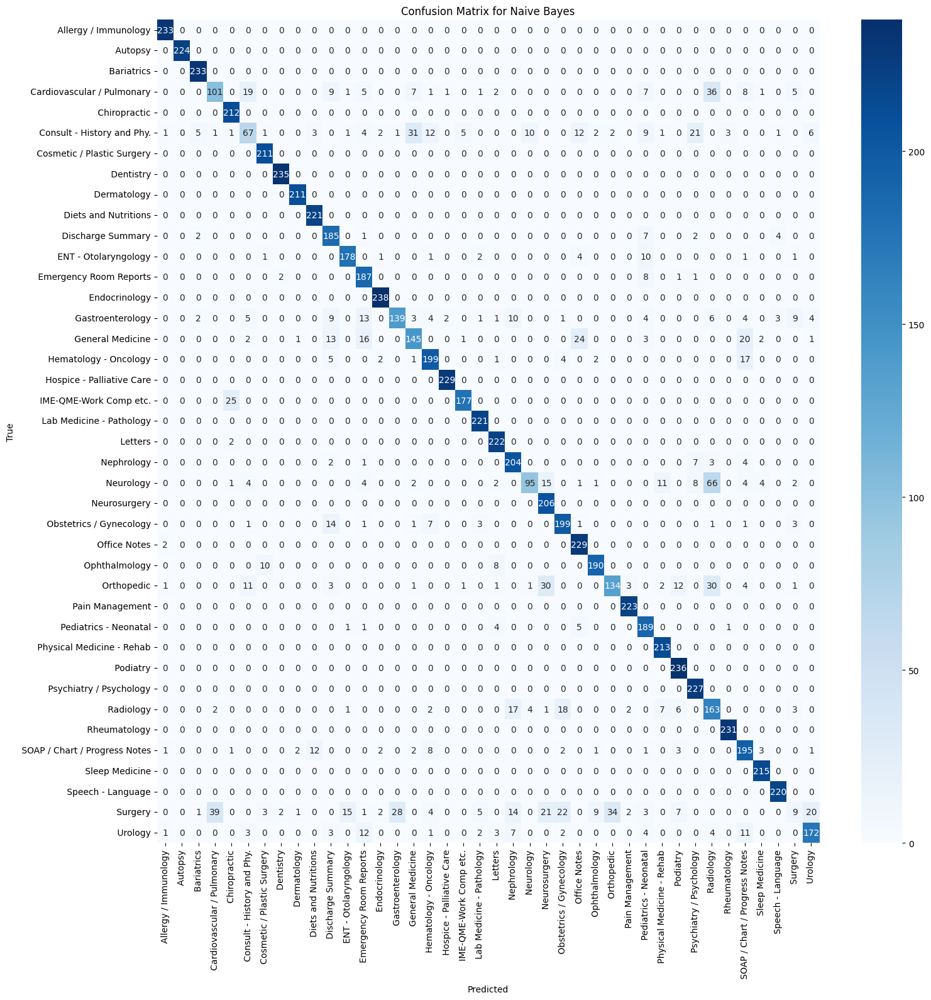

True Positives (TP): 224
True Negatives (TN): 233
False Positives (FP): 0
False Negatives (FN): 0
True Positive Rate (TPR): 1.0
False Positive Rate (FPR): 0.0


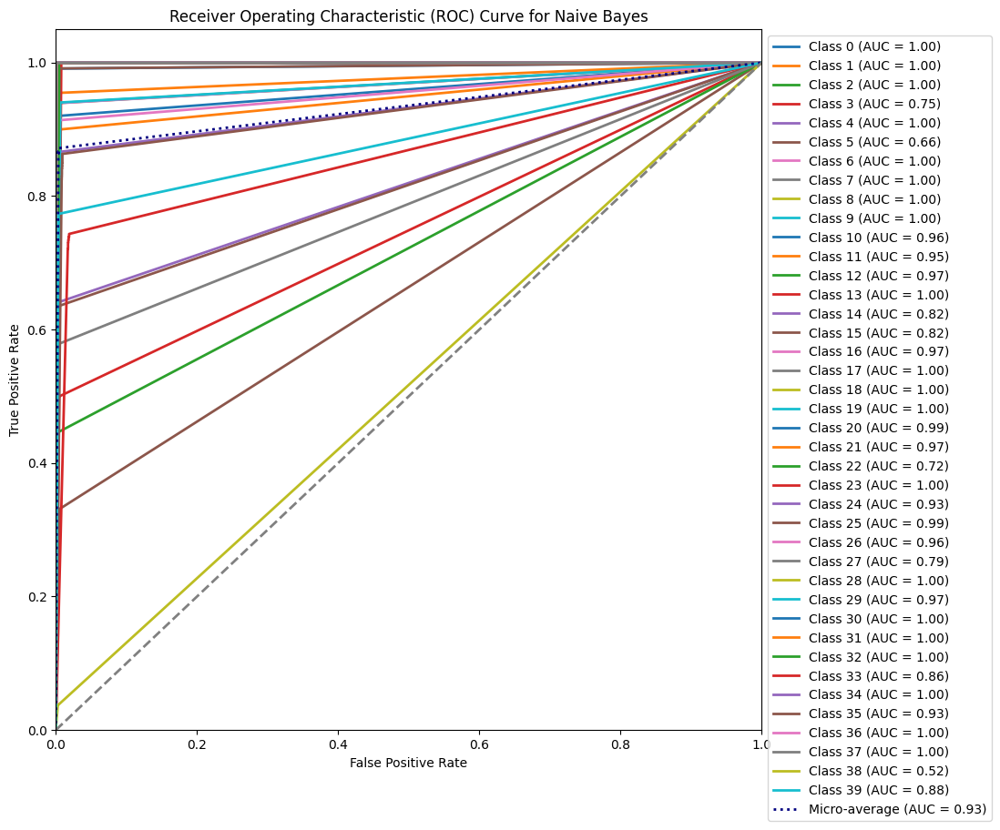

Class 0 AUC: 1.00
Class 1 AUC: 1.00
Class 2 AUC: 1.00
Class 3 AUC: 0.75
Class 4 AUC: 1.00
Class 5 AUC: 0.66
Class 6 AUC: 1.00
Class 7 AUC: 1.00
Class 8 AUC: 1.00
Class 9 AUC: 1.00
Class 10 AUC: 0.96
Class 11 AUC: 0.95
Class 12 AUC: 0.97
Class 13 AUC: 1.00
Class 14 AUC: 0.82
Class 15 AUC: 0.82
Class 16 AUC: 0.97
Class 17 AUC: 1.00
Class 18 AUC: 1.00
Class 19 AUC: 1.00
Class 20 AUC: 0.99
Class 21 AUC: 0.97
Class 22 AUC: 0.72
Class 23 AUC: 1.00
Class 24 AUC: 0.93
Class 25 AUC: 0.99
Class 26 AUC: 0.96
Class 27 AUC: 0.79
Class 28 AUC: 1.00
Class 29 AUC: 0.97
Class 30 AUC: 1.00
Class 31 AUC: 1.00
Class 32 AUC: 1.00
Class 33 AUC: 0.86
Class 34 AUC: 1.00
Class 35 AUC: 0.93
Class 36 AUC: 1.00
Class 37 AUC: 1.00
Class 38 AUC: 0.52
Class 39 AUC: 0.88
Micro-average AUC: 0.93


In [25]:
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.model_selection import RandomizedSearchCV, cross_validate
from sklearn.naive_bayes import GaussianNB

# Initialize the Gaussian Naive Bayes classifier
classifier = GaussianNB()

# Define the parameter distribution for RandomizedSearchCV
param_dist = {
    'var_smoothing': np.logspace(0, -9, 100)  # range of possible smoothing values, from 1 to 1e-9
}

# Set up RandomizedSearchCV for hyperparameter tuning with cross-validation
random_search = RandomizedSearchCV(estimator=classifier, param_distributions=param_dist, 
                                   n_iter=50, cv=2, n_jobs=-1, verbose=1, random_state=42)

# Train the Naive Bayes model with RandomizedSearchCV
random_search.fit(x_train, y_train)

# Print the best parameters and the best score found by RandomizedSearchCV
print(f"Best parameters from RandomizedSearchCV: {random_search.best_params_}")
print(f"Best cross-validation score: {random_search.best_score_}")

# Use the best estimator found by RandomizedSearchCV
best_classifier = random_search.best_estimator_

# Cross-validation results with the best model (2-fold cross-validation)
cv_results = cross_validate(best_classifier, x_train, y_train, cv=2)

# Print cross-validation results (accuracy, fit time, score time)
print("Cross-validation results: ", cv_results)

# Predictions using the best classifier
prediction = best_classifier.predict(x_val)

# Print classification report
print('Classification report for Naive Bayes: \n', classification_report(y_val, prediction, target_names=list(le.classes_), digits=4))

# Confusion Matrix for Naive Bayes
conf_matrix = confusion_matrix(y_val, prediction)

# Plotting the confusion matrix
plt.figure(figsize=(17, 17))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=le.classes_, yticklabels=le.classes_)
plt.title('Confusion Matrix for Naive Bayes')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# Compute TP, TN, FP, FN for a binary classification example (choose one class)
TP = conf_matrix[1, 1]  # True Positive
TN = conf_matrix[0, 0]  # True Negative
FP = conf_matrix[0, 1]  # False Positive
FN = conf_matrix[1, 0]  # False Negative

# Print TP, TN, FP, FN
print(f"True Positives (TP): {TP}")
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")

# Calculate True Positive Rate (TPR) and False Positive Rate (FPR)
TPR = TP / (TP + FN)  # Sensitivity, Recall
FPR = FP / (FP + TN)  # 1 - Specificity

# Print TPR and FPR
print(f"True Positive Rate (TPR): {TPR}")
print(f"False Positive Rate (FPR): {FPR}")

# Binarize the true labels for multi-class ROC calculation
y_val_bin = label_binarize(y_val, classes=np.unique(y_val))  # Binarize true labels
y_score = best_classifier.predict_proba(x_val)  # Predicted probabilities

# Number of classes
n_classes = y_score.shape[1]

# Compute ROC curve and AUC for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_val_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and AUC
fpr["micro"], tpr["micro"], _ = roc_curve(y_val_bin.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Plot all ROC curves
plt.figure(figsize=(10, 10))

# Plot ROC curve for each class
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], lw=2, label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

# Plot micro-average ROC curve
plt.plot(fpr["micro"], tpr["micro"], color='navy', lw=2, linestyle=':', label=f'Micro-average (AUC = {roc_auc["micro"]:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve for Naive Bayes')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.show()

# Optionally, print AUC for each class and the micro-average AUC
for i in range(n_classes):
    print(f'Class {i} AUC: {roc_auc[i]:.2f}')
print(f'Micro-average AUC: {roc_auc["micro"]:.2f}')

Fitting 2 folds for each of 50 candidates, totalling 100 fits
Best parameters from RandomizedSearchCV: {'var_smoothing': 2.310129700083158e-09}
Best cross-validation score: 0.8575475974614688
Cross-validation results:  {'fit_time': array([3.04826689, 2.83425188]), 'score_time': array([46.89434981, 42.49393368]), 'test_score': array([0.8581709, 0.8569243])}
Classification report for Naive Bayes: 
                                 precision    recall  f1-score   support

          Allergy / Immunology     0.9749    1.0000    0.9873       233
                       Autopsy     0.9956    1.0000    0.9978       224
                    Bariatrics     0.9472    1.0000    0.9729       233
    Cardiovascular / Pulmonary     0.7260    0.5196    0.6057       204
                  Chiropractic     0.8249    1.0000    0.9041       212
    Consult - History and Phy.     0.5310    0.2970    0.3810       202
    Cosmetic / Plastic Surgery     0.9318    0.9716    0.9513       211
                     De

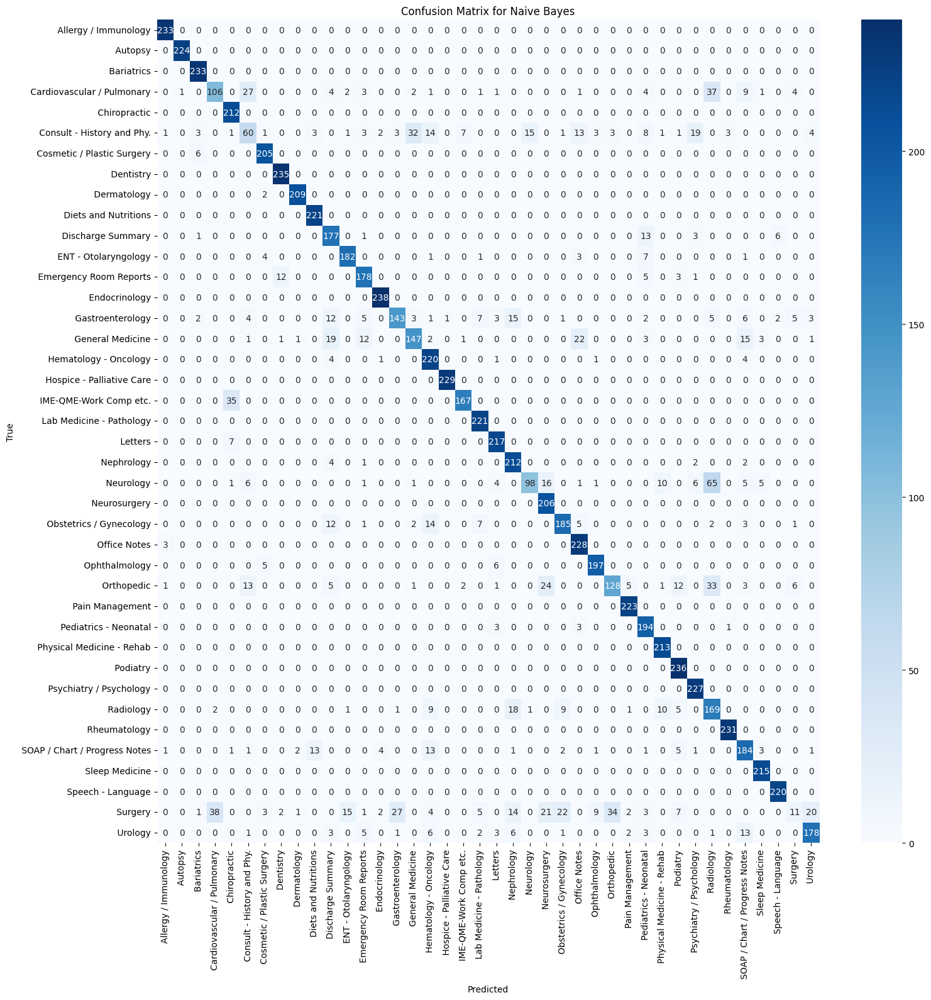

True Positives (TP): 224
True Negatives (TN): 233
False Positives (FP): 0
False Negatives (FN): 0
True Positive Rate (TPR): 1.0
False Positive Rate (FPR): 0.0


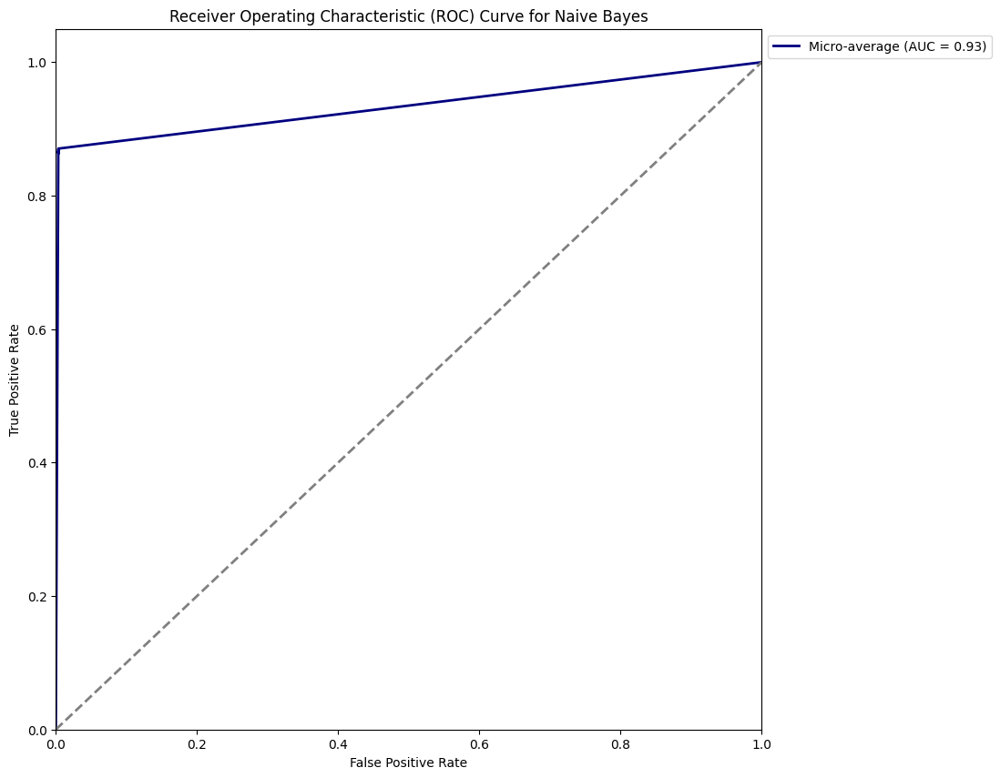

Micro-average AUC: 0.93


In [28]:
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.model_selection import RandomizedSearchCV, cross_validate
from sklearn.naive_bayes import GaussianNB

# Initialize the Gaussian Naive Bayes classifier
classifier = GaussianNB()

# Define the parameter distribution for RandomizedSearchCV
param_dist = {
    'var_smoothing': np.logspace(0, -9, 100)  # range of possible smoothing values, from 1 to 1e-9
}

# Set up RandomizedSearchCV for hyperparameter tuning with cross-validation
random_search = RandomizedSearchCV(estimator=classifier, param_distributions=param_dist, 
                                   n_iter=50, cv=2, n_jobs=-1, verbose=1, random_state=42)

# Train the Naive Bayes model with RandomizedSearchCV
random_search.fit(x_train, y_train)

# Print the best parameters and the best score found by RandomizedSearchCV
print(f"Best parameters from RandomizedSearchCV: {random_search.best_params_}")
print(f"Best cross-validation score: {random_search.best_score_}")

# Use the best estimator found by RandomizedSearchCV
best_classifier = random_search.best_estimator_

# Cross-validation results with the best model (2-fold cross-validation)
cv_results = cross_validate(best_classifier, x_train, y_train, cv=2)

# Print cross-validation results (accuracy, fit time, score time)
print("Cross-validation results: ", cv_results)

# Predictions using the best classifier
prediction = best_classifier.predict(x_val)

# Print classification report for Naive Bayes
print('Classification report for Naive Bayes: \n', classification_report(y_val, prediction, target_names=list(le.classes_), digits=4))

# Confusion Matrix for Naive Bayes
conf_matrix = confusion_matrix(y_val, prediction)

# Plotting the confusion matrix
plt.figure(figsize=(17, 17))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=le.classes_, yticklabels=le.classes_)
plt.title('Confusion Matrix for Naive Bayes')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# Compute TP, TN, FP, FN for a binary classification example (choose one class)
TP = conf_matrix[1, 1]  # True Positive
TN = conf_matrix[0, 0]  # True Negative
FP = conf_matrix[0, 1]  # False Positive
FN = conf_matrix[1, 0]  # False Negative

# Print TP, TN, FP, FN
print(f"True Positives (TP): {TP}")
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")

# Calculate True Positive Rate (TPR) and False Positive Rate (FPR)
TPR = TP / (TP + FN)  # Sensitivity, Recall
FPR = FP / (FP + TN)  # 1 - Specificity

# Print TPR and FPR
print(f"True Positive Rate (TPR): {TPR}")
print(f"False Positive Rate (FPR): {FPR}")

# Binarize the true labels for multi-class ROC calculation
y_val_bin = label_binarize(y_val, classes=np.unique(y_val))  # Binarize true labels
y_score = best_classifier.predict_proba(x_val)  # Predicted probabilities

# Compute ROC curve and AUC for the micro-average
fpr_micro, tpr_micro, _ = roc_curve(y_val_bin.ravel(), y_score.ravel())
roc_auc_micro = auc(fpr_micro, tpr_micro)

# Plot the ROC curve for the micro-average
plt.figure(figsize=(10, 10))

# Plot ROC curve for the micro-average
plt.plot(fpr_micro, tpr_micro, color='navy', lw=2, linestyle='-', label=f'Micro-average (AUC = {roc_auc_micro:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve for Naive Bayes')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.show()

# Print the micro-average AUC
print(f'Micro-average AUC: {roc_auc_micro:.2f}')

Fitting 2 folds for each of 50 candidates, totalling 100 fits
Best parameters from RandomizedSearchCV: {'splitter': 'best', 'random_state': 42, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': None, 'max_depth': None, 'criterion': 'entropy', 'class_weight': None}
Best cross-validation score: 0.7550430643699002
Cross-validation results:  {'fit_time': array([40.94961858, 40.69535804]), 'score_time': array([0.22104716, 0.20982766]), 'test_score': array([0.75266319, 0.75742294])}
Classification report for Decision Tree: 
                                 precision    recall  f1-score   support

          Allergy / Immunology     0.9830    0.9914    0.9872       233
                       Autopsy     0.9955    0.9955    0.9955       224
                    Bariatrics     0.9538    0.9742    0.9639       233
    Cardiovascular / Pulmonary     0.3862    0.4657    0.4222       204
                  Chiropractic     0.9083    0.9340    0.9209       212
    Consult - History and Phy

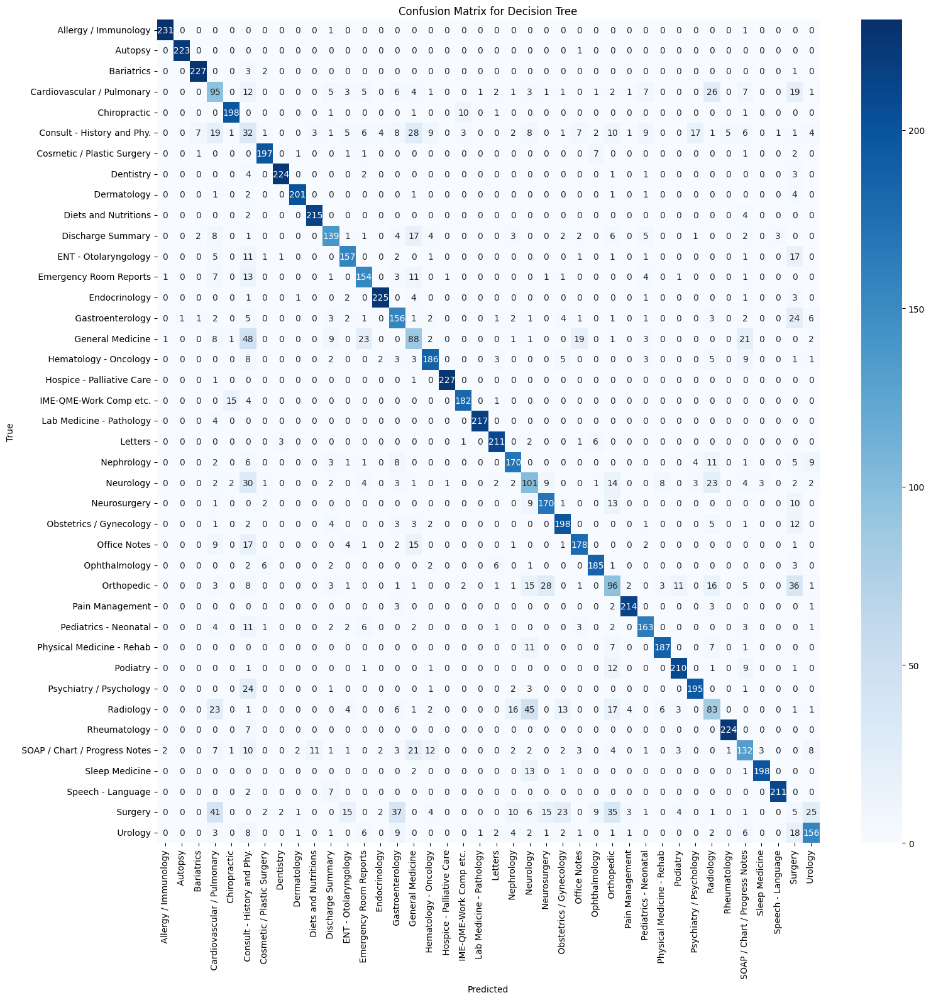

True Positives (TP): 223
True Negatives (TN): 231
False Positives (FP): 0
False Negatives (FN): 0
True Positive Rate (TPR): 1.0
False Positive Rate (FPR): 0.0


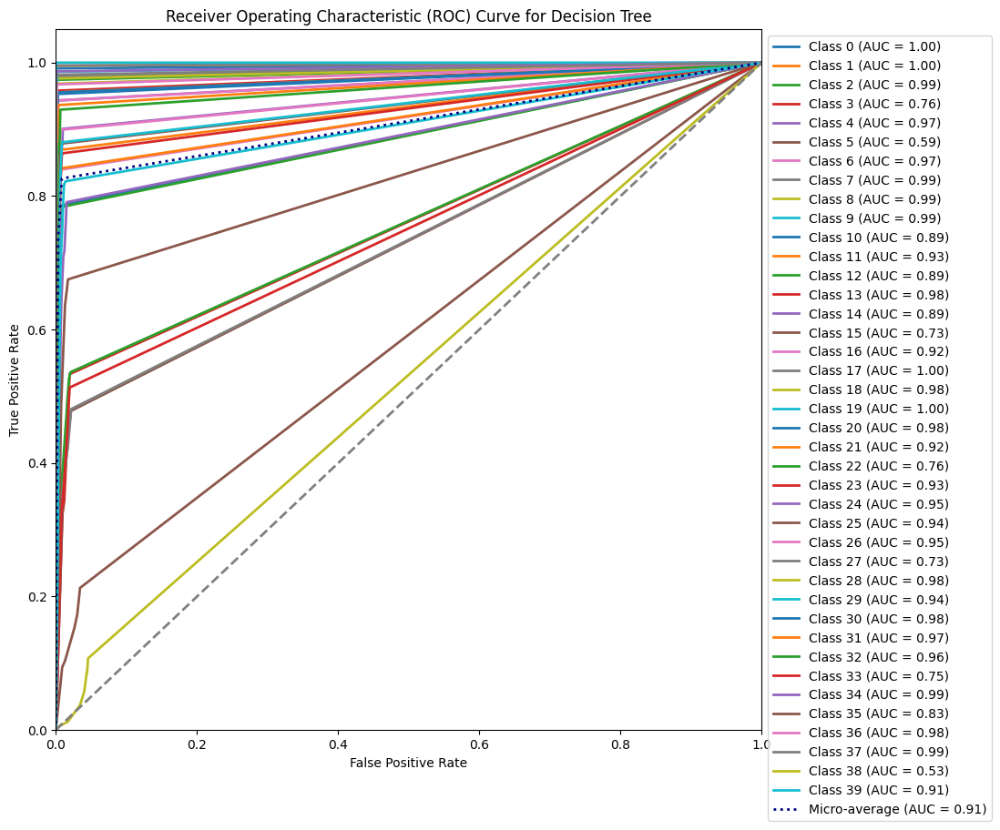

Class 0 AUC: 1.00
Class 1 AUC: 1.00
Class 2 AUC: 0.99
Class 3 AUC: 0.76
Class 4 AUC: 0.97
Class 5 AUC: 0.59
Class 6 AUC: 0.97
Class 7 AUC: 0.99
Class 8 AUC: 0.99
Class 9 AUC: 0.99
Class 10 AUC: 0.89
Class 11 AUC: 0.93
Class 12 AUC: 0.89
Class 13 AUC: 0.98
Class 14 AUC: 0.89
Class 15 AUC: 0.73
Class 16 AUC: 0.92
Class 17 AUC: 1.00
Class 18 AUC: 0.98
Class 19 AUC: 1.00
Class 20 AUC: 0.98
Class 21 AUC: 0.92
Class 22 AUC: 0.76
Class 23 AUC: 0.93
Class 24 AUC: 0.95
Class 25 AUC: 0.94
Class 26 AUC: 0.95
Class 27 AUC: 0.73
Class 28 AUC: 0.98
Class 29 AUC: 0.94
Class 30 AUC: 0.98
Class 31 AUC: 0.97
Class 32 AUC: 0.96
Class 33 AUC: 0.75
Class 34 AUC: 0.99
Class 35 AUC: 0.83
Class 36 AUC: 0.98
Class 37 AUC: 0.99
Class 38 AUC: 0.53
Class 39 AUC: 0.91
Micro-average AUC: 0.91


In [26]:
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.model_selection import RandomizedSearchCV, cross_validate
from sklearn.tree import DecisionTreeClassifier

# Define the parameter distribution for RandomizedSearchCV
param_dist = {
    'criterion': ['gini', 'entropy'],  # Split quality criterion
    'max_depth': [None, 10, 20, 30, 40],  # Max depth of tree (None means expand until leaves are pure)
    'min_samples_split': [2, 5, 10, 20],  # Min samples required to split a node
    'min_samples_leaf': [1, 2, 4, 10],    # Min samples required at a leaf node
    'max_features': ['auto', 'sqrt', 'log2', None],  # Number of features to consider for splits
    'splitter': ['best', 'random'],      # Strategy used to split at each node
    'class_weight': [None, 'balanced'],  # Use 'balanced' for class weighting in imbalanced datasets
    'random_state': [42],  # Ensures reproducibility
}

# Initialize the DecisionTreeClassifier
classifier = DecisionTreeClassifier()

# Set up RandomizedSearchCV for hyperparameter tuning with cross-validation
random_search = RandomizedSearchCV(estimator=classifier, param_distributions=param_dist, 
                                   n_iter=50, cv=2, n_jobs=-1, verbose=1, random_state=42)

# Train the Decision Tree model with RandomizedSearchCV
random_search.fit(x_train, y_train)

# Print the best parameters and the best score found by RandomizedSearchCV
print(f"Best parameters from RandomizedSearchCV: {random_search.best_params_}")
print(f"Best cross-validation score: {random_search.best_score_}")

# Use the best estimator found by RandomizedSearchCV
best_classifier = random_search.best_estimator_

# Cross-validation results with the best model (2-fold cross-validation)
cv_results = cross_validate(best_classifier, x_train, y_train, cv=2)

# Print cross-validation results (accuracy, fit time, score time)
print("Cross-validation results: ", cv_results)

# Predictions using the best classifier
prediction = best_classifier.predict(x_val)

# Print classification report
print('Classification report for Decision Tree: \n', classification_report(y_val, prediction, target_names=list(le.classes_), digits=4))

# Confusion Matrix for Decision Tree
conf_matrix = confusion_matrix(y_val, prediction)

# Plotting the confusion matrix
plt.figure(figsize=(17, 17))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=le.classes_, yticklabels=le.classes_)
plt.title('Confusion Matrix for Decision Tree')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# Compute TP, TN, FP, FN for a binary classification example (choose one class)
TP = conf_matrix[1, 1]  # True Positive
TN = conf_matrix[0, 0]  # True Negative
FP = conf_matrix[0, 1]  # False Positive
FN = conf_matrix[1, 0]  # False Negative

# Print TP, TN, FP, FN
print(f"True Positives (TP): {TP}")
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")

# Calculate True Positive Rate (TPR) and False Positive Rate (FPR)
TPR = TP / (TP + FN)  # Sensitivity, Recall
FPR = FP / (FP + TN)  # 1 - Specificity

# Print TPR and FPR
print(f"True Positive Rate (TPR): {TPR}")
print(f"False Positive Rate (FPR): {FPR}")

# Binarize the true labels for multi-class ROC calculation
y_val_bin = label_binarize(y_val, classes=np.unique(y_val))  # Binarize true labels
y_score = best_classifier.predict_proba(x_val)  # Predicted probabilities

# Number of classes
n_classes = y_score.shape[1]

# Compute ROC curve and AUC for each class
fpr = dict()
tpr = dict()
roc_auc = dict()

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_val_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Compute micro-average ROC curve and AUC
fpr["micro"], tpr["micro"], _ = roc_curve(y_val_bin.ravel(), y_score.ravel())
roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])

# Plot all ROC curves
plt.figure(figsize=(10, 10))

# Plot ROC curve for each class
for i in range(n_classes):
    plt.plot(fpr[i], tpr[i], lw=2, label=f'Class {i} (AUC = {roc_auc[i]:.2f})')

# Plot micro-average ROC curve
plt.plot(fpr["micro"], tpr["micro"], color='navy', lw=2, linestyle=':', label=f'Micro-average (AUC = {roc_auc["micro"]:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve for Decision Tree')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.show()

# Optionally, print AUC for each class and the micro-average AUC
for i in range(n_classes):
    print(f'Class {i} AUC: {roc_auc[i]:.2f}')
print(f'Micro-average AUC: {roc_auc["micro"]:.2f}')

Fitting 2 folds for each of 50 candidates, totalling 100 fits
Best parameters from RandomizedSearchCV: {'splitter': 'best', 'random_state': 42, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': None, 'max_depth': None, 'criterion': 'entropy', 'class_weight': None}
Best cross-validation score: 0.751954895738894
Cross-validation results:  {'fit_time': array([56.71545291, 55.98842192]), 'score_time': array([0.36286926, 0.3582294 ]), 'test_score': array([0.7512466 , 0.75266319])}
Classification report for Decision Tree: 
                                 precision    recall  f1-score   support

          Allergy / Immunology     0.9786    0.9828    0.9807       233
                       Autopsy     1.0000    0.9955    0.9978       224
                    Bariatrics     0.9576    0.9700    0.9638       233
    Cardiovascular / Pulmonary     0.3857    0.4216    0.4028       204
                  Chiropractic     0.8821    0.9528    0.9161       212
    Consult - History and Phy.

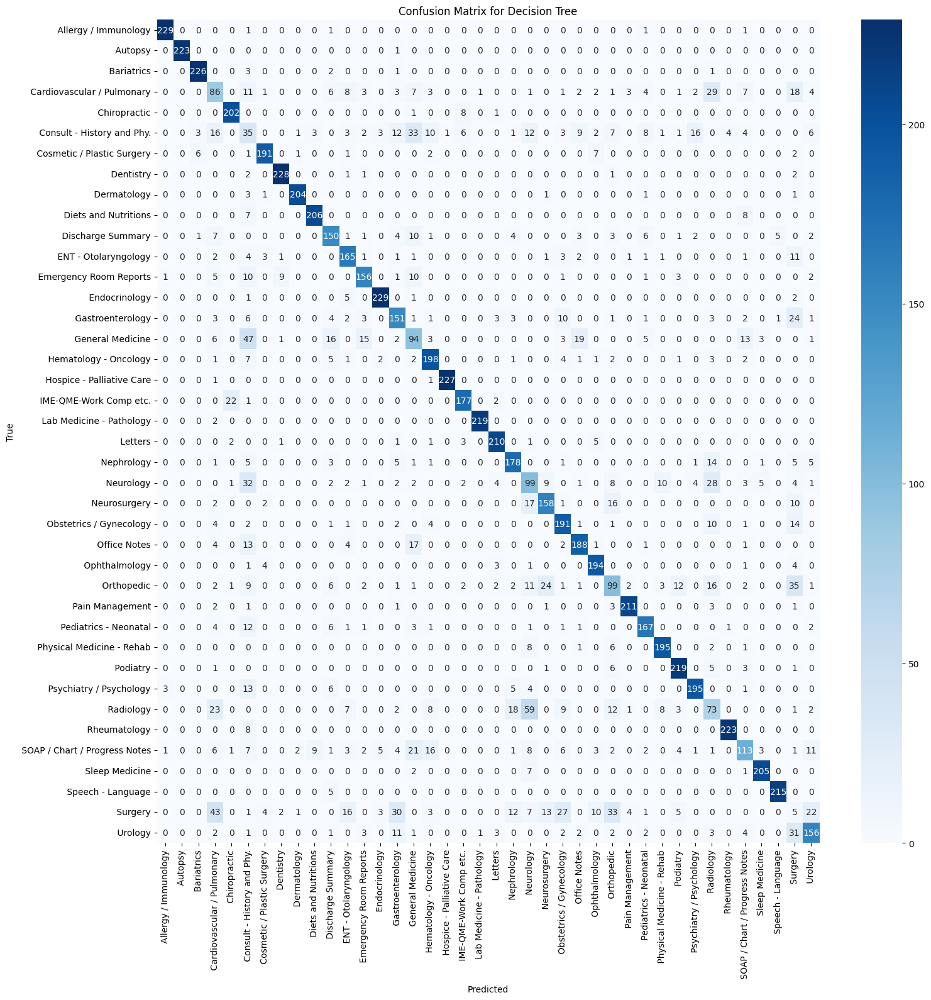

True Positives (TP): 223
True Negatives (TN): 229
False Positives (FP): 0
False Negatives (FN): 0
True Positive Rate (TPR): 1.0
False Positive Rate (FPR): 0.0


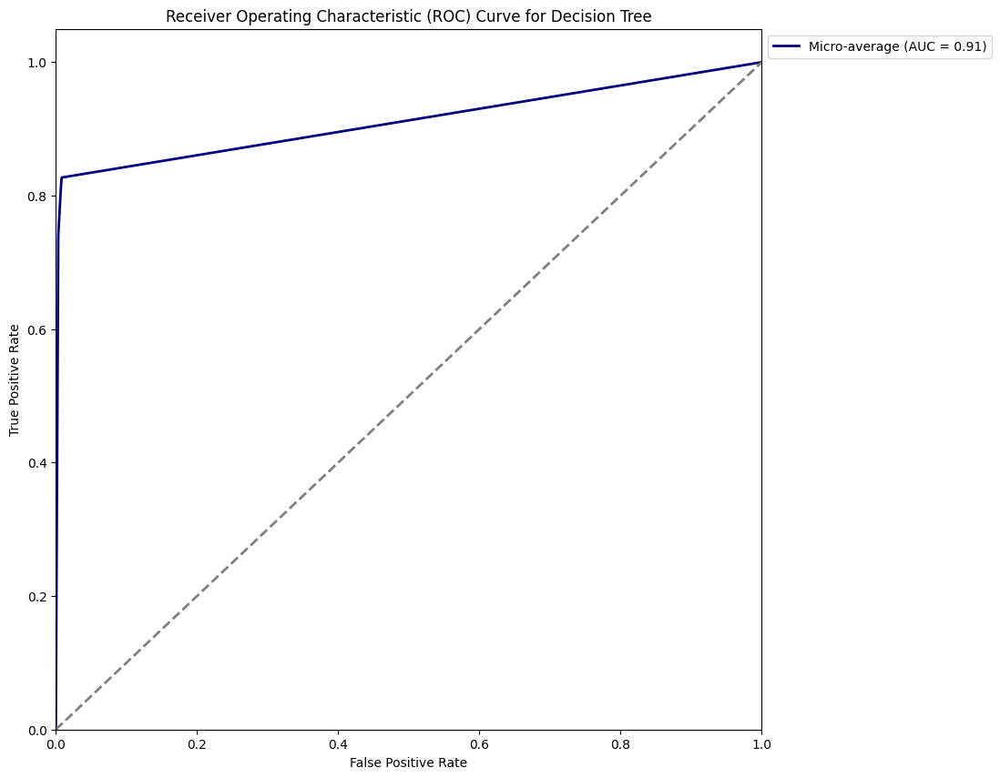

Micro-average AUC: 0.91


In [29]:
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.model_selection import RandomizedSearchCV, cross_validate
from sklearn.tree import DecisionTreeClassifier

# Define the parameter distribution for RandomizedSearchCV
param_dist = {
    'criterion': ['gini', 'entropy'],  # Split quality criterion
    'max_depth': [None, 10, 20, 30, 40],  # Max depth of tree (None means expand until leaves are pure)
    'min_samples_split': [2, 5, 10, 20],  # Min samples required to split a node
    'min_samples_leaf': [1, 2, 4, 10],    # Min samples required at a leaf node
    'max_features': ['auto', 'sqrt', 'log2', None],  # Number of features to consider for splits
    'splitter': ['best', 'random'],      # Strategy used to split at each node
    'class_weight': [None, 'balanced'],  # Use 'balanced' for class weighting in imbalanced datasets
    'random_state': [42],  # Ensures reproducibility
}

# Initialize the DecisionTreeClassifier
classifier = DecisionTreeClassifier()

# Set up RandomizedSearchCV for hyperparameter tuning with cross-validation
random_search = RandomizedSearchCV(estimator=classifier, param_distributions=param_dist, 
                                   n_iter=50, cv=2, n_jobs=-1, verbose=1, random_state=42)

# Train the Decision Tree model with RandomizedSearchCV
random_search.fit(x_train, y_train)

# Print the best parameters and the best score found by RandomizedSearchCV
print(f"Best parameters from RandomizedSearchCV: {random_search.best_params_}")
print(f"Best cross-validation score: {random_search.best_score_}")

# Use the best estimator found by RandomizedSearchCV
best_classifier = random_search.best_estimator_

# Cross-validation results with the best model (2-fold cross-validation)
cv_results = cross_validate(best_classifier, x_train, y_train, cv=2)

# Print cross-validation results (accuracy, fit time, score time)
print("Cross-validation results: ", cv_results)

# Predictions using the best classifier
prediction = best_classifier.predict(x_val)

# Print classification report
print('Classification report for Decision Tree: \n', classification_report(y_val, prediction, target_names=list(le.classes_), digits=4))

# Confusion Matrix for Decision Tree
conf_matrix = confusion_matrix(y_val, prediction)

# Plotting the confusion matrix
plt.figure(figsize=(17, 17))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=le.classes_, yticklabels=le.classes_)
plt.title('Confusion Matrix for Decision Tree')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

# Compute TP, TN, FP, FN for a binary classification example (choose one class)
TP = conf_matrix[1, 1]  # True Positive
TN = conf_matrix[0, 0]  # True Negative
FP = conf_matrix[0, 1]  # False Positive
FN = conf_matrix[1, 0]  # False Negative

# Print TP, TN, FP, FN
print(f"True Positives (TP): {TP}")
print(f"True Negatives (TN): {TN}")
print(f"False Positives (FP): {FP}")
print(f"False Negatives (FN): {FN}")

# Calculate True Positive Rate (TPR) and False Positive Rate (FPR)
TPR = TP / (TP + FN)  # Sensitivity, Recall
FPR = FP / (FP + TN)  # 1 - Specificity

# Print TPR and FPR
print(f"True Positive Rate (TPR): {TPR}")
print(f"False Positive Rate (FPR): {FPR}")

# Binarize the true labels for multi-class ROC calculation
y_val_bin = label_binarize(y_val, classes=np.unique(y_val))  # Binarize true labels
y_score = best_classifier.predict_proba(x_val)  # Predicted probabilities

# Compute ROC curve and AUC for the micro-average
fpr_micro, tpr_micro, _ = roc_curve(y_val_bin.ravel(), y_score.ravel())
roc_auc_micro = auc(fpr_micro, tpr_micro)

# Plot the ROC curve for the micro-average
plt.figure(figsize=(10, 10))

# Plot ROC curve for the micro-average
plt.plot(fpr_micro, tpr_micro, color='navy', lw=2, linestyle='-', label=f'Micro-average (AUC = {roc_auc_micro:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve for Decision Tree')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.show()

# Print the micro-average AUC
print(f'Micro-average AUC: {roc_auc_micro:.2f}')

In [ ]:
###SVMROC
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.model_selection import RandomizedSearchCV, cross_validate
from sklearn.svm import SVC

# Define the Support Vector Machine model
classifier = SVC(probability=True)  # Set probability=True to use predict_proba for ROC curve

# Define the parameter distribution for hyperparameter tuning
param_dist = {
    'C': [0.01, 0.1, 1],                # Regularization parameter
    'kernel': ['linear', 'rbf'],         # Type of kernel to use for SVM
    'gamma': ['scale', 'auto'],         # Kernel coefficient
    'tol': [1e-1, 1e-2],                # Tolerance for stopping criteria
    'class_weight': ['None', 'balanced'], # Adjust class weights
}

# Set up RandomizedSearchCV for hyperparameter tuning with 2-fold cross-validation
random_search = RandomizedSearchCV(estimator=classifier, param_distributions=param_dist, 
                                   n_iter=10, cv=2, n_jobs=-1, verbose=1, scoring='accuracy', random_state=42)

# Train the model with RandomizedSearchCV
random_search.fit(x_train, y_train)

# Get the best classifier from the RandomizedSearchCV
best_classifier = random_search.best_estimator_

# Binarize the true labels for multi-class ROC calculation
y_val_bin = label_binarize(y_val, classes=np.unique(y_val))  # Binarize true labels
y_score = best_classifier.predict_proba(x_val)  # Predicted probabilities

# Compute micro-average ROC curve and AUC
fpr, tpr, _ = roc_curve(y_val_bin.ravel(), y_score.ravel())
roc_auc = auc(fpr, tpr)

# Plot the ROC curve for the micro-average
plt.figure(figsize=(10, 10))
plt.plot(fpr, tpr, color='navy', lw=2, linestyle='-', label=f'Micro-average (AUC = {roc_auc:.2f})')
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')  # Diagonal line for random classifier

plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve for SVM (Micro-average)')
plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
plt.show()

# Print the micro-average AUC
print(f'Micro-average AUC: {roc_auc:.2f}')

Fitting 2 folds for each of 10 candidates, totalling 20 fits


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

# Define the confusion matrix
conf_matrix = np.array([
    [233, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 224, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 223, 0, 0, 0, 10, 0, 0, 0, 0, 2, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1],
    [0, 0, 0, 97, 0, 8, 0, 0, 0, 0, 6, 3, 8, 0, 14, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 1, 0, 0, 0, 3, 0, 0, 0, 41, 0, 10, 1, 0, 6, 0],
    [0, 0, 0, 0, 204, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 4, 17, 1, 22, 1, 0, 0, 3, 0, 2, 10, 1, 5, 30, 13, 0, 7, 0, 0, 4, 15, 0, 2, 14, 2, 9, 0, 7, 1, 1, 16, 0, 4, 0, 0, 0, 1, 10],
    [0, 0, 0, 0, 0, 0, 206, 0, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 228, 0, 0, 0, 0, 7, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 1, 0, 206, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 221, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 1, 8, 0, 0, 0, 0, 0, 0, 154, 0, 1, 0, 0, 2, 3, 0, 0, 0, 0, 5, 0, 0, 3, 0, 0, 0, 0, 12, 1, 0, 3, 0, 0, 0, 0, 9, 0, 0],
    [0, 0, 0, 2, 0, 0, 6, 0, 0, 0, 2, 154, 0, 3, 18, 0, 3, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 7, 0, 0, 0, 1, 0, 2, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 8, 3, 0, 0, 0, 170, 0, 0, 1, 2, 0, 0, 0, 0, 1, 7, 0, 0, 0, 0, 0, 0, 3, 0, 3, 1, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 238, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 1, 0, 0, 6, 0, 0, 0, 0, 4, 0, 4, 0, 177, 1, 1, 0, 0, 0, 2, 6, 0, 0, 2, 0, 0, 0, 0, 3, 0, 0, 0, 1, 0, 0, 0, 1, 9, 2],
    [1, 0, 0, 0, 0, 15, 0, 0, 1, 0, 16, 0, 28, 2, 1, 97, 0, 0, 1, 0, 0, 1, 0, 0, 2, 23, 0, 0, 0, 4, 0, 0, 0, 0, 0, 33, 2, 0, 0, 1],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 220, 2, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 2, 0, 0, 0, 2],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 229, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 31, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 171, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 221, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 12, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 212, 0, 1, 0, 0, 1, 0, 2, 1, 0, 3, 0, 4, 3, 0, 0, 2, 2, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 206, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 3, 3, 0, 0, 0, 0, 1, 2],
    [0, 0, 0, 0, 1, 5, 0, 0, 0, 0, 0, 0, 2, 0, 0, 1, 0, 0, 0, 0, 6, 0, 104, 21, 0, 2, 1, 1, 0, 0, 15, 0, 9, 27, 0, 7, 18, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 200, 0, 0, 0, 2, 3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 2, 0, 2, 0, 0, 0, 0, 5, 0, 1, 0, 29, 0, 5, 0, 0, 0, 0, 0, 0, 0, 175, 1, 0, 0, 0, 0, 0, 0, 0, 8, 0, 1, 0, 0, 3, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 11, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 213, 1, 0, 0, 5, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 10, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 9, 0, 0, 0, 0, 1, 186, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 2, 10, 0, 0, 0, 0, 6, 0, 0, 0, 0, 1, 0, 0, 2, 0, 3, 0, 11, 26, 0, 2, 0, 117, 6, 0, 5, 13, 0, 23, 1, 1, 0, 0, 6, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 12, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 211, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [3, 0, 0, 0, 0, 0, 0, 0, 0, 0, 4, 0, 3, 1, 0, 0, 0, 0, 0, 0, 3, 0, 3, 0, 0, 0, 0, 0, 0, 179, 0, 0, 0, 1, 3, 0, 0, 0, 0, 1],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 213, 0, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 236, 0, 0, 0, 0, 0, 0, 0, 0],
    [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 3, 0, 0, 2, 0, 1, 1, 2, 0, 0, 0, 0, 0, 0, 0, 0, 1, 219, 1, 1, 1, 1, 0, 0, 0],
    [0, 0, 0, 1, 0, 3, 1, 1, 0, 0, 0, 1, 1, 0, 0, 2, 2, 1, 0, 2, 0, 2, 0, 0, 2, 2, 0, 0, 0, 2, 3, 2, 2, 107, 0, 2, 1, 2, 0, 1],
    [0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 231, 0, 1, 0, 0, 1]
    [0, 0, 0, 1, 0, 3, 1, 1, 0, 0, 0, 1, 1, 0, 0, 2, 2, 1, 0, 2, 0, 2, 0, 0, 2, 2, 0, 0, 0, 2, 3, 2, 2, 107, 0, 129, 1, 2, 0, 1],
    [0, 0, 0, 1, 0, 3, 1, 1, 0, 0, 0, 1, 1, 0, 0, 2, 2, 1, 0, 2, 0, 2, 0, 0, 2, 2, 0, 0, 0, 2, 3, 2, 2, 107, 0, 2, 215, 2, 0, 1],
    [0, 0, 0, 1, 0, 3, 1, 1, 0, 0, 0, 1, 1, 0, 0, 2, 2, 1, 0, 2, 0, 2, 0, 0, 2, 2, 0, 0, 0, 2, 3, 2, 2, 107, 0, 2, 1, 220, 0, 1],
    [0, 0, 0, 1, 0, 3, 1, 1, 0, 0, 0, 1, 1, 0, 0, 2, 2, 1, 0, 2, 0, 2, 0, 0, 2, 2, 0, 0, 0, 2, 3, 2, 2, 107, 0, 2, 1, 2, 7, 1],
    [0, 0, 0, 1, 0, 3, 1, 1, 0, 0, 0, 1, 1, 0, 0, 2, 2, 1, 0, 2, 0, 2, 0, 0, 2, 2, 0, 0, 0, 2, 3, 2, 2, 107, 0, 2, 1, 2, 0, 170]
])

# Get true and predicted labels from confusion matrix
true_labels = np.repeat(np.arange(conf_matrix.shape[0]), conf_matrix.sum(axis=1))
predicted_labels = np.array([np.repeat(np.arange(conf_matrix.shape[1]), row) for row in conf_matrix]).flatten()

# Binarize the true labels for multi-class ROC
y_true_bin = label_binarize(true_labels, classes=np.arange(conf_matrix.shape[0]))

# Binarize the predicted labels for multi-class ROC
y_pred_bin = label_binarize(predicted_labels, classes=np.arange(conf_matrix.shape[1]))

# Calculate ROC curve and AUC for each class
fpr, tpr, thresholds = roc_curve(y_true_bin.ravel(), y_pred_bin.ravel())
roc_auc = auc(fpr, tpr)

# Plot the ROC curve
plt.figure()
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multi-class ROC Curve')
plt.legend(loc="lower right")
plt.show()


Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1, Loss: 2.97
Validation Loss: 2.53
Validation loss improved. Saving model...


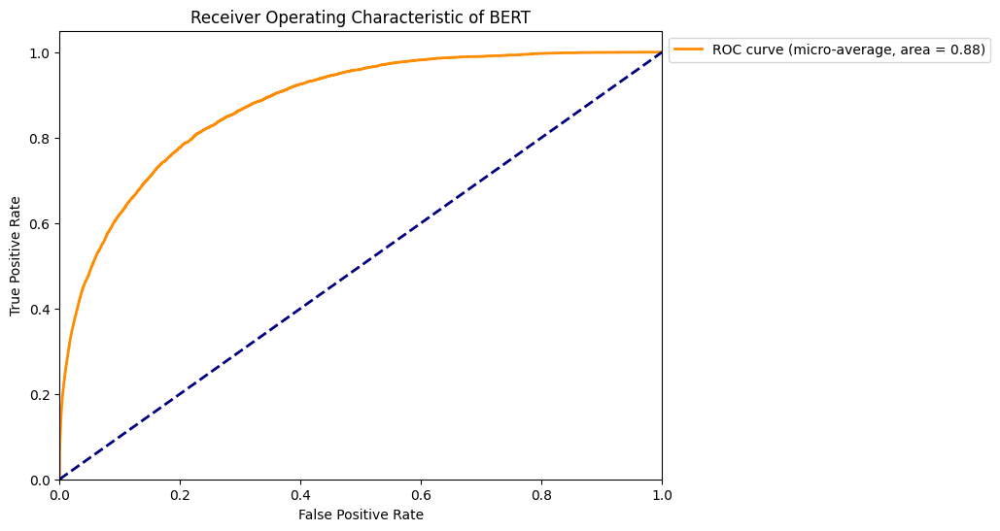

Epoch 2, Loss: 2.12
Validation Loss: 1.93
Validation loss improved. Saving model...


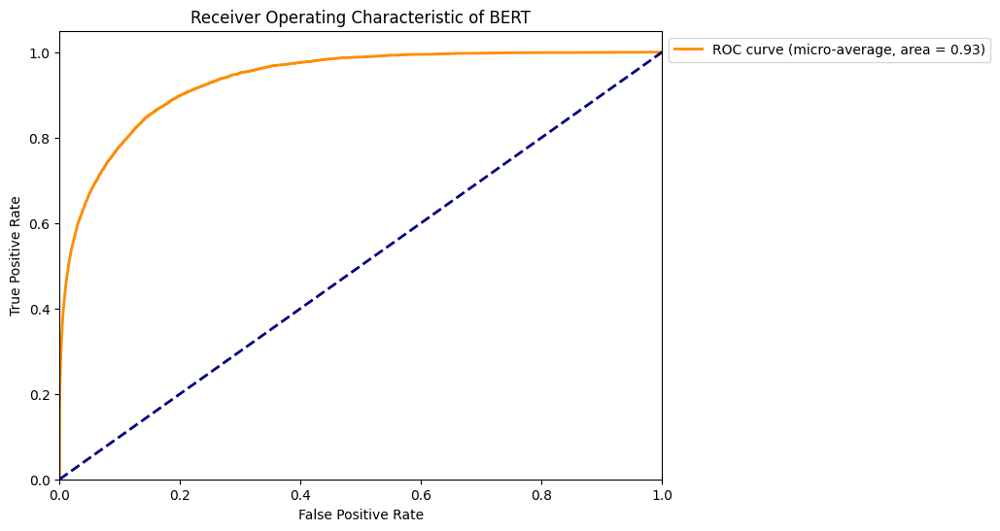

Epoch 3, Loss: 1.52
Validation Loss: 1.51
Validation loss improved. Saving model...


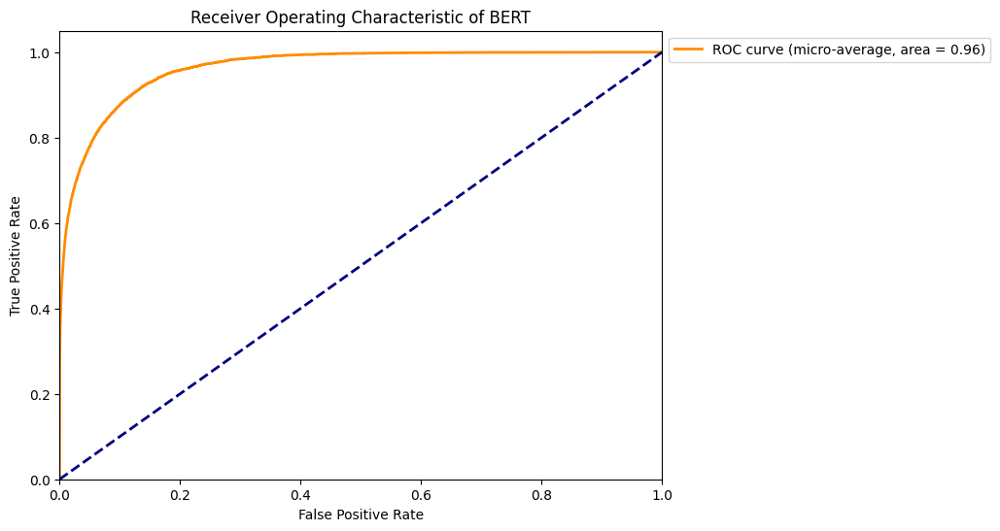

Epoch 4, Loss: 1.08
Validation Loss: 1.39
Validation loss improved. Saving model...


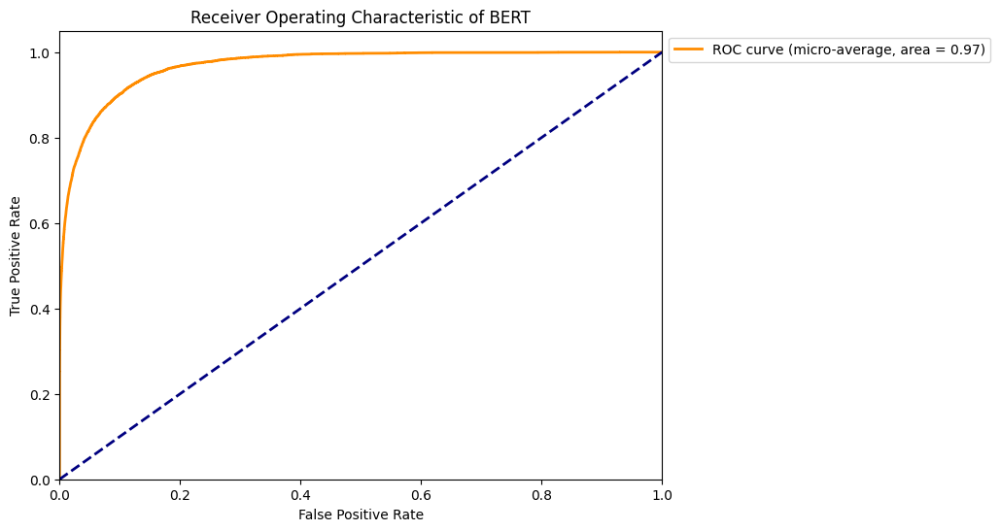

Epoch 5, Loss: 0.79
Validation Loss: 1.47
Validation loss did not improve for 1 epoch(s).


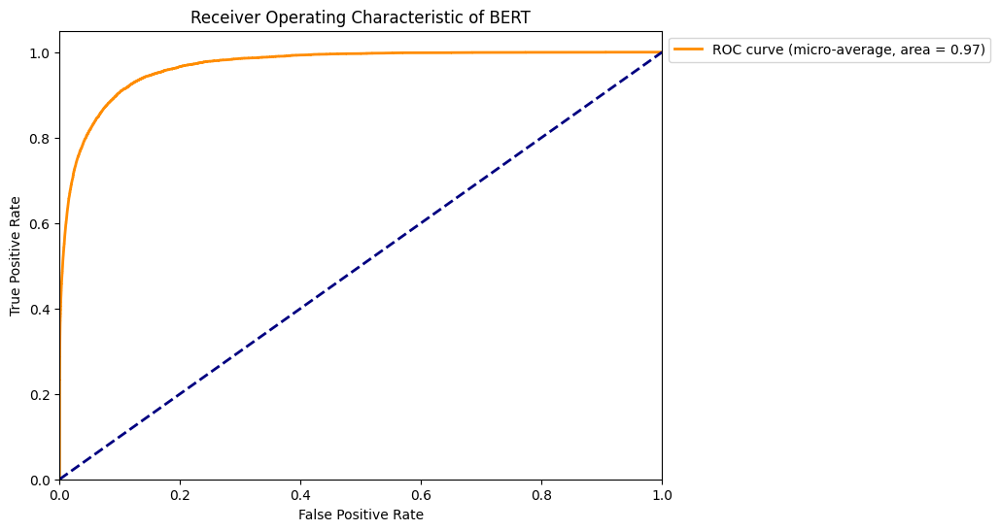

Epoch 6, Loss: 0.59
Validation Loss: 1.46
Validation loss did not improve for 2 epoch(s).
Early stopping triggered.


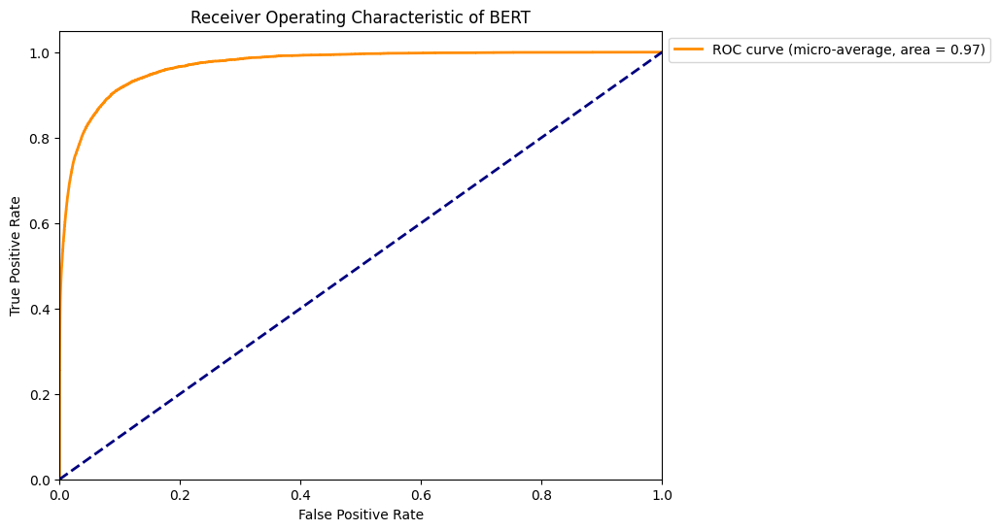

Early stopping triggered.
Training complete


In [4]:
import pandas as pd
import re
import numpy as np
import torch
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc
import seaborn as sns
import matplotlib.pyplot as plt
from transformers import BertTokenizer, BertForSequenceClassification, AdamW
from imblearn.over_sampling import SMOTE
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import label_binarize

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

# Load BERT model and tokenizer for classification
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = BertForSequenceClassification.from_pretrained('bert-base-uncased', num_labels=40)

# Enable gradient checkpointing to reduce memory usage
model.gradient_checkpointing_enable()

# Function to preprocess text
def preprocess_text(text):
    text = str(text).lower()
    text = re.sub(r'\([^)]*\)', '', text)
    text = re.sub('"', '', text)
    text = re.sub(r"'s\b", "", text)
    text = re.sub("[^a-zA-Z]", " ", text)
    return text.strip()

# Load data
data = pd.read_csv('/kaggle/input/medicaltranscriptions/mtsamples.csv')
data.drop('Unnamed: 0', axis=1, inplace=True)

# Clean transcription
data['cleaned_transcription'] = data['transcription'].apply(preprocess_text)

# Tokenize and encode the texts
def encode_texts(texts):
    inputs = tokenizer(texts.tolist(), return_tensors='pt', padding=True, truncation=True, max_length=64)
    return inputs['input_ids'], inputs['attention_mask']

# Create embeddings for transcripts
input_ids, attention_masks = encode_texts(data.cleaned_transcription)

# Label encode our categorical target variable
le = LabelEncoder()
Y = le.fit_transform(data.medical_specialty.values)

# Applying SMOTE to balance classes
sm = SMOTE()
X_res, Y_res = sm.fit_resample(input_ids.numpy(), Y)

# Splitting data into train:test
X_train, X_val, Y_train, Y_val = train_test_split(X_res, Y_res, test_size=0.2, random_state=42)

# Convert to tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.long)  # Use long for indices
Y_train_tensor = torch.tensor(Y_train, dtype=torch.long)
X_val_tensor = torch.tensor(X_val, dtype=torch.long)
Y_val_tensor = torch.tensor(Y_val, dtype=torch.long)

train_dataset = TensorDataset(X_train_tensor, Y_train_tensor)
val_dataset = TensorDataset(X_val_tensor, Y_val_tensor)

train_dataloader = DataLoader(train_dataset, batch_size=16, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=16, shuffle=False)

# Training function with Early Stopping
def train_model_with_early_stopping(model, train_dataloader, val_dataloader, num_epochs=20, patience=2):
    optimizer = AdamW(model.parameters(), lr=5e-5)
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)

    best_val_loss = float('inf')  # Start with a very high value
    epochs_without_improvement = 0  # Counter for early stopping
    early_stop = False  # Flag to check if early stopping is triggered

    for epoch in range(num_epochs):
        if early_stop:
            print("Early stopping triggered.")
            break

        model.train()
        total_loss = 0

        # Training loop
        for batch in train_dataloader:
            optimizer.zero_grad()
            inputs, labels = batch
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model(input_ids=inputs, labels=labels)
            loss = outputs.loss
            total_loss += loss.item()
            loss.backward()
            optimizer.step()

        avg_loss = total_loss / len(train_dataloader)
        print(f"Epoch {epoch + 1}, Loss: {avg_loss:.2f}")

        # Validation
        model.eval()
        val_loss = 0.0
        val_preds, val_labels = [], []
        with torch.no_grad():
            for batch in val_dataloader:
                inputs, labels = batch
                inputs = inputs.to(device)
                labels = labels.to(device)
                outputs = model(input_ids=inputs, labels=labels)
                val_loss += outputs.loss.item()
                val_preds.append(torch.softmax(outputs.logits, dim=1).cpu().numpy())  # Use softmax for probabilities
                val_labels.append(labels.cpu().numpy())

        avg_val_loss = val_loss / len(val_dataloader)
        print(f"Validation Loss: {avg_val_loss:.2f}")

        # Check for improvement in validation loss
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            epochs_without_improvement = 0  # Reset counter
            print("Validation loss improved. Saving model...")
            torch.save(model.state_dict(), 'best_model.pth')  # Save the best model
        else:
            epochs_without_improvement += 1
            print(f"Validation loss did not improve for {epochs_without_improvement} epoch(s).")

        # Early stopping condition
        if epochs_without_improvement >= patience:
            early_stop = True
            print("Early stopping triggered.")

        # Evaluation metrics after each epoch
        val_preds = np.concatenate(val_preds)
        val_labels = np.concatenate(val_labels)

        # Compute multiclass ROC AUC (micro average)
        # Binarize the labels for multi-class ROC AUC computation
        val_labels_bin = label_binarize(val_labels, classes=np.arange(len(le.classes_)))

        # Compute ROC curve and ROC AUC for the entire model (micro-averaged)
        fpr, tpr, _ = roc_curve(val_labels_bin.ravel(), val_preds.ravel())  # Flatten to get micro-average
        roc_auc = auc(fpr, tpr)

        # Plot ROC curve for the entire model (micro-averaged)
        plt.figure(figsize=(8, 6))
        plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (micro-average, area = {roc_auc:.2f})')
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('Receiver Operating Characteristic of BERT')
        plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
        plt.show()

    print("Training complete") 

# Train the model with early stopping
train_model_with_early_stopping(model, train_dataloader, val_dataloader, num_epochs=25, patience=2)

Some weights of DistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight', 'pre_classifier.bias', 'pre_classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1, Loss: 2.78
Validation Loss: 2.07
Validation loss improved. Saving model...


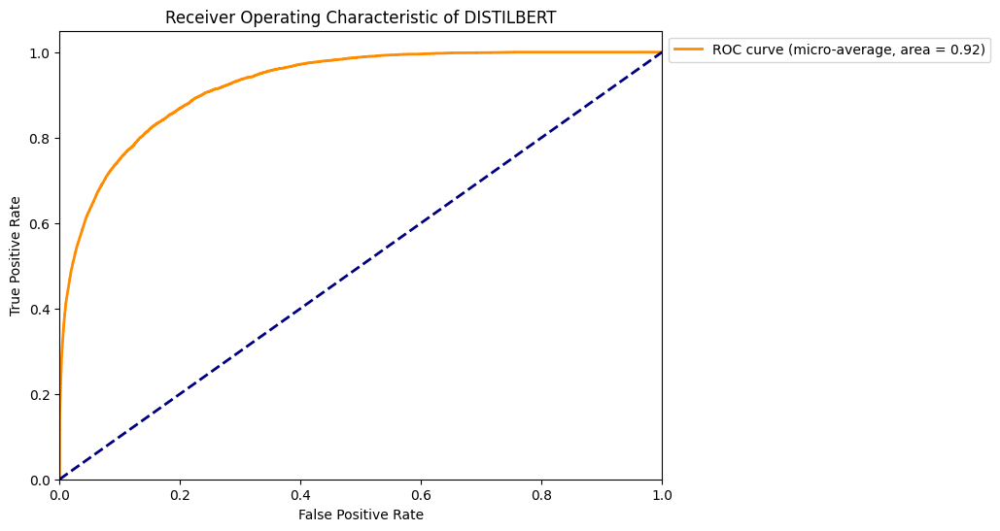

Epoch 2, Loss: 1.78
Validation Loss: 1.60
Validation loss improved. Saving model...


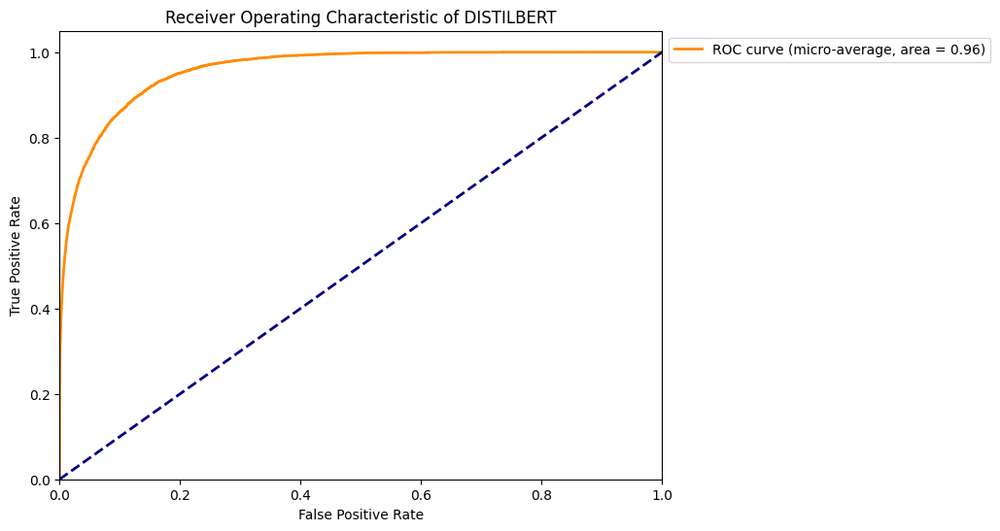

Epoch 3, Loss: 1.25
Validation Loss: 1.41
Validation loss improved. Saving model...


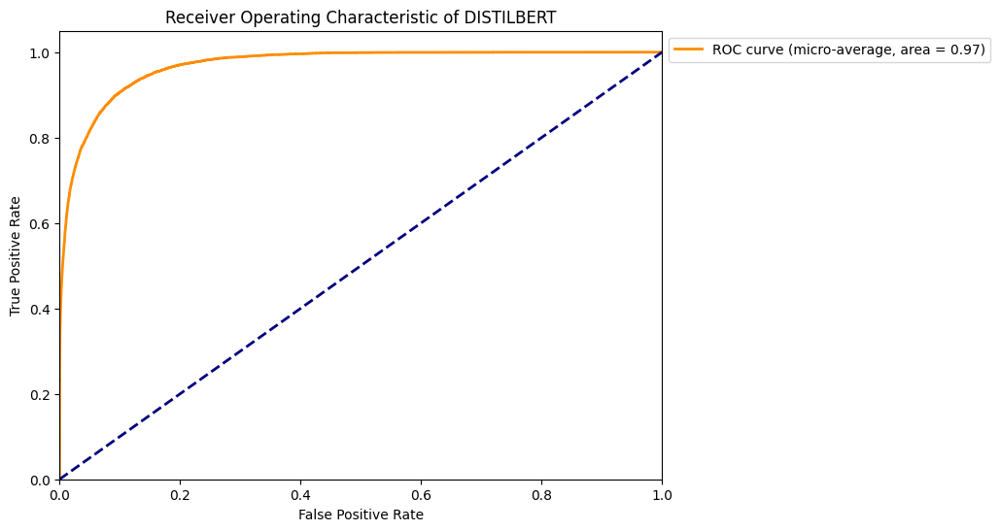

Epoch 4, Loss: 0.89
Validation Loss: 1.41
Validation loss improved. Saving model...


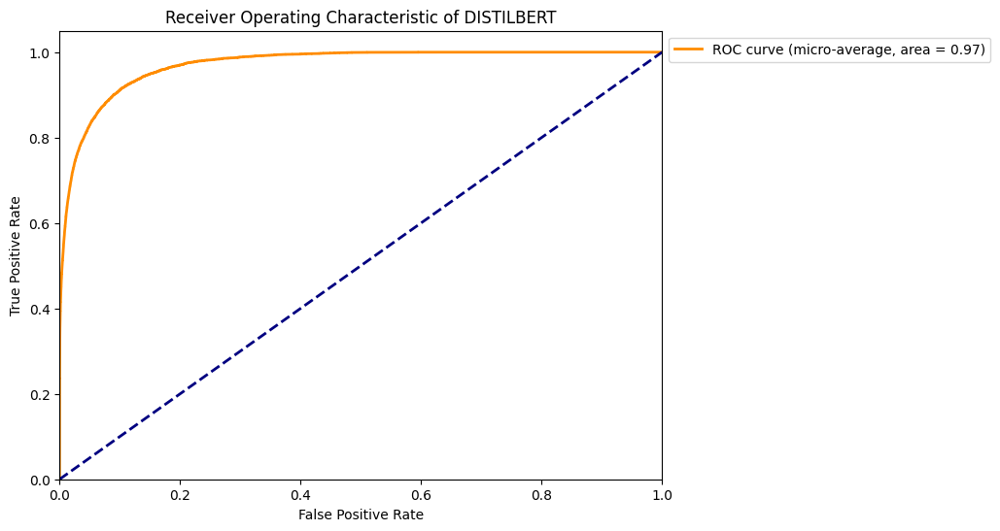

Epoch 5, Loss: 0.63
Validation Loss: 1.53
Validation loss did not improve for 1 epoch(s).


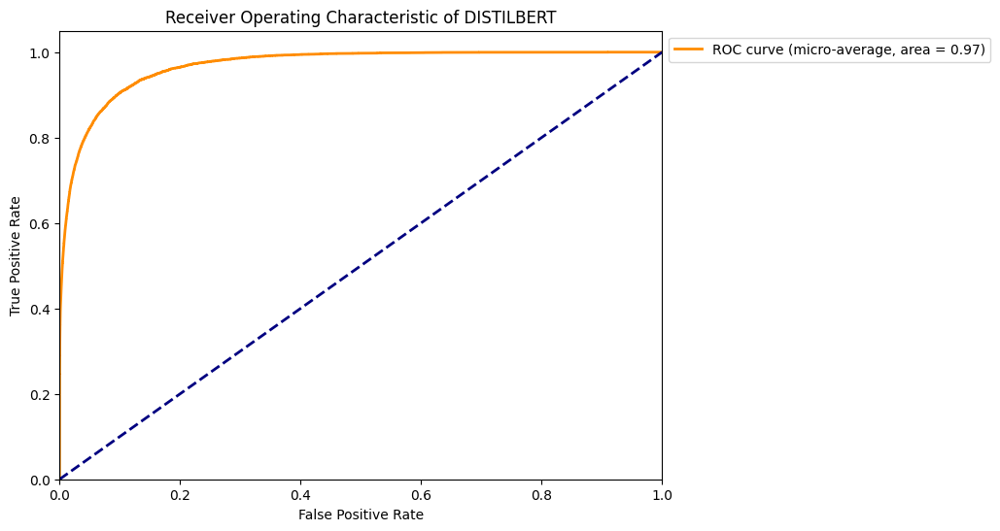

Epoch 6, Loss: 0.46
Validation Loss: 1.60
Validation loss did not improve for 2 epoch(s).
Early stopping triggered.


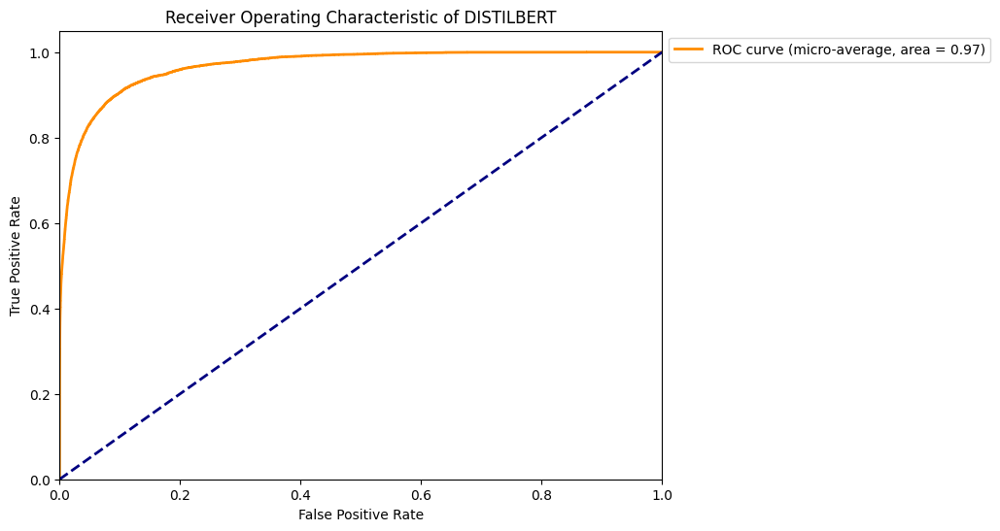

Early stopping triggered.
Training complete


In [7]:
import pandas as pd
import re
import numpy as np
import torch
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc
import seaborn as sns
import matplotlib.pyplot as plt
from transformers import BertTokenizer, BertForSequenceClassification, AdamW
from transformers import DistilBertTokenizer, DistilBertForSequenceClassification, AdamW
from imblearn.over_sampling import SMOTE
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import label_binarize

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

# Load DistilBERT model and tokenizer for classification
model = DistilBertForSequenceClassification.from_pretrained('distilbert-base-uncased', num_labels=40)
tokenizer = DistilBertTokenizer.from_pretrained('distilbert-base-uncased')

# Enable gradient checkpointing to reduce memory usage
model.gradient_checkpointing_enable()

# Function to preprocess text
def preprocess_text(text):
    text = str(text).lower()
    text = re.sub(r'\([^)]*\)', '', text)
    text = re.sub('"', '', text)
    text = re.sub(r"'s\b", "", text)
    text = re.sub("[^a-zA-Z]", " ", text)
    return text.strip()

# Load data
data = pd.read_csv('/kaggle/input/medicaltranscriptions/mtsamples.csv')
data.drop('Unnamed: 0', axis=1, inplace=True)

# Clean transcription
data['cleaned_transcription'] = data['transcription'].apply(preprocess_text)

# Tokenize and encode the texts
def encode_texts(texts):
    inputs = tokenizer(texts.tolist(), return_tensors='pt', padding=True, truncation=True, max_length=64)
    return inputs['input_ids'], inputs['attention_mask']

# Create embeddings for transcripts
input_ids, attention_masks = encode_texts(data.cleaned_transcription)

# Label encode our categorical target variable
le = LabelEncoder()
Y = le.fit_transform(data.medical_specialty.values)

# Applying SMOTE to balance classes
sm = SMOTE()
X_res, Y_res = sm.fit_resample(input_ids.numpy(), Y)

# Splitting data into train:test
X_train, X_val, Y_train, Y_val = train_test_split(X_res, Y_res, test_size=0.2, random_state=42)

# Convert to tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.long)  # Use long for indices
Y_train_tensor = torch.tensor(Y_train, dtype=torch.long)
X_val_tensor = torch.tensor(X_val, dtype=torch.long)
Y_val_tensor = torch.tensor(Y_val, dtype=torch.long)

train_dataset = TensorDataset(X_train_tensor, Y_train_tensor)
val_dataset = TensorDataset(X_val_tensor, Y_val_tensor)

train_dataloader = DataLoader(train_dataset, batch_size=16, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=16, shuffle=False)

# Training function with Early Stopping
def train_model_with_early_stopping(model, train_dataloader, val_dataloader, num_epochs=20, patience=2):
    optimizer = AdamW(model.parameters(), lr=5e-5)
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)

    best_val_loss = float('inf')  # Start with a very high value
    epochs_without_improvement = 0  # Counter for early stopping
    early_stop = False  # Flag to check if early stopping is triggered

    for epoch in range(num_epochs):
        if early_stop:
            print("Early stopping triggered.")
            break

        model.train()
        total_loss = 0

        # Training loop
        for batch in train_dataloader:
            optimizer.zero_grad()
            inputs, labels = batch
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model(input_ids=inputs, labels=labels)
            loss = outputs.loss
            total_loss += loss.item()
            loss.backward()
            optimizer.step()

        avg_loss = total_loss / len(train_dataloader)
        print(f"Epoch {epoch + 1}, Loss: {avg_loss:.2f}")

        # Validation
        model.eval()
        val_loss = 0.0
        val_preds, val_labels = [], []
        with torch.no_grad():
            for batch in val_dataloader:
                inputs, labels = batch
                inputs = inputs.to(device)
                labels = labels.to(device)
                outputs = model(input_ids=inputs, labels=labels)
                val_loss += outputs.loss.item()
                val_preds.append(torch.softmax(outputs.logits, dim=1).cpu().numpy())  # Use softmax for probabilities
                val_labels.append(labels.cpu().numpy())

        avg_val_loss = val_loss / len(val_dataloader)
        print(f"Validation Loss: {avg_val_loss:.2f}")

        # Check for improvement in validation loss
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            epochs_without_improvement = 0  # Reset counter
            print("Validation loss improved. Saving model...")
            torch.save(model.state_dict(), 'best_model.pth')  # Save the best model
        else:
            epochs_without_improvement += 1
            print(f"Validation loss did not improve for {epochs_without_improvement} epoch(s).")

        # Early stopping condition
        if epochs_without_improvement >= patience:
            early_stop = True
            print("Early stopping triggered.")

        # Evaluation metrics after each epoch
        val_preds = np.concatenate(val_preds)
        val_labels = np.concatenate(val_labels)

        # Compute multiclass ROC AUC (micro average)
        # Binarize the labels for multi-class ROC AUC computation
        val_labels_bin = label_binarize(val_labels, classes=np.arange(len(le.classes_)))

        # Compute ROC curve and ROC AUC for the entire model (micro-averaged)
        fpr, tpr, _ = roc_curve(val_labels_bin.ravel(), val_preds.ravel())  # Flatten to get micro-average
        roc_auc = auc(fpr, tpr)

        # Plot ROC curve for the entire model (micro-averaged)
        plt.figure(figsize=(8, 6))
        plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (micro-average, area = {roc_auc:.2f})')
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('Receiver Operating Characteristic of DISTILBERT')
        plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
        plt.show()

    print("Training complete") 

# Train the model with early stopping
train_model_with_early_stopping(model, train_dataloader, val_dataloader, num_epochs=25, patience=2)

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at dmis-lab/biobert-v1.1 and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


Epoch 1, Loss: 2.93
Validation Loss: 2.37
Validation loss improved. Saving model...


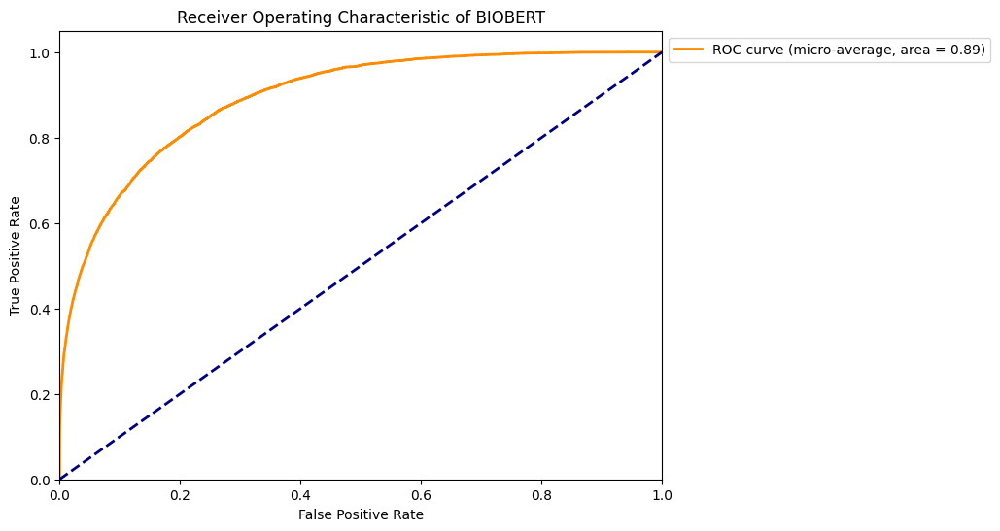

Epoch 2, Loss: 2.08
Validation Loss: 1.78
Validation loss improved. Saving model...


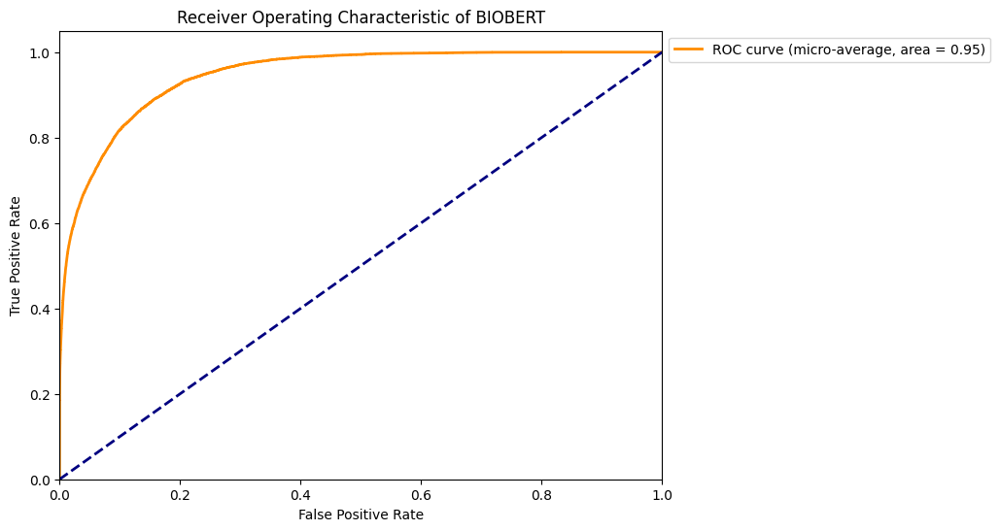

Epoch 3, Loss: 1.51
Validation Loss: 1.54
Validation loss improved. Saving model...


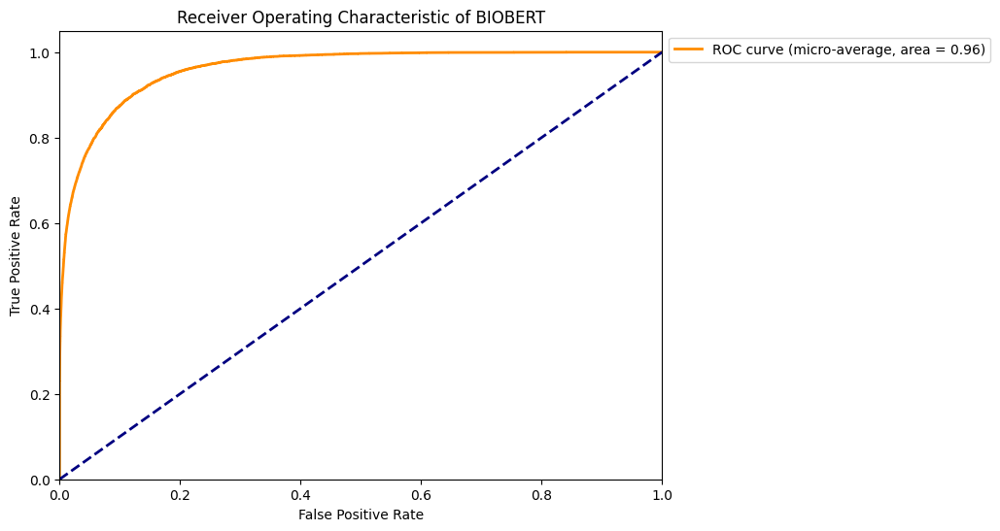

Epoch 4, Loss: 1.12
Validation Loss: 1.44
Validation loss improved. Saving model...


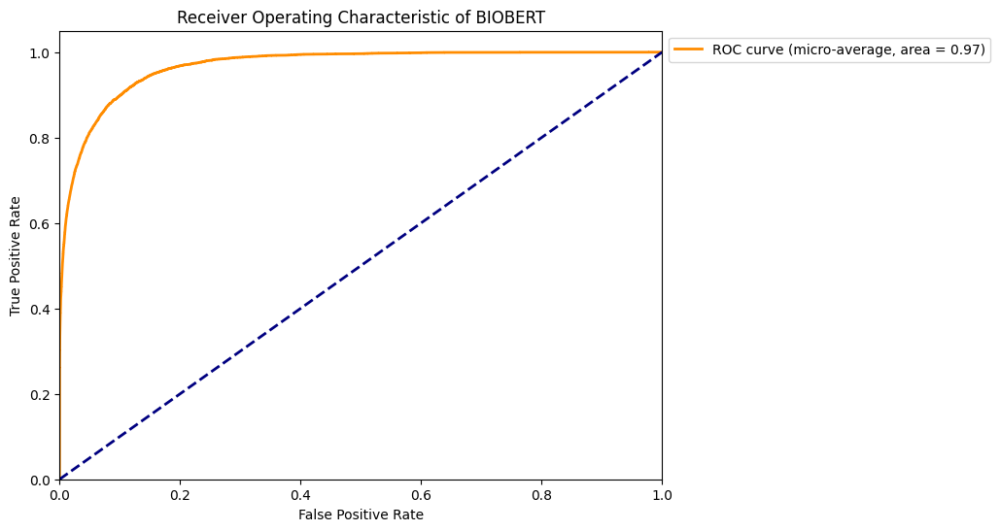

Epoch 5, Loss: 0.84
Validation Loss: 1.42
Validation loss improved. Saving model...


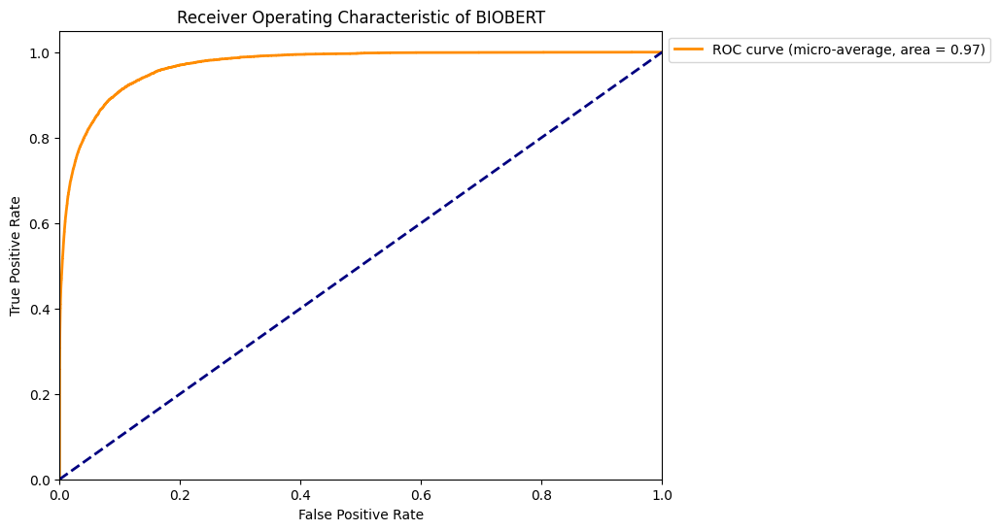

Epoch 6, Loss: 0.63
Validation Loss: 1.47
Validation loss did not improve for 1 epoch(s).


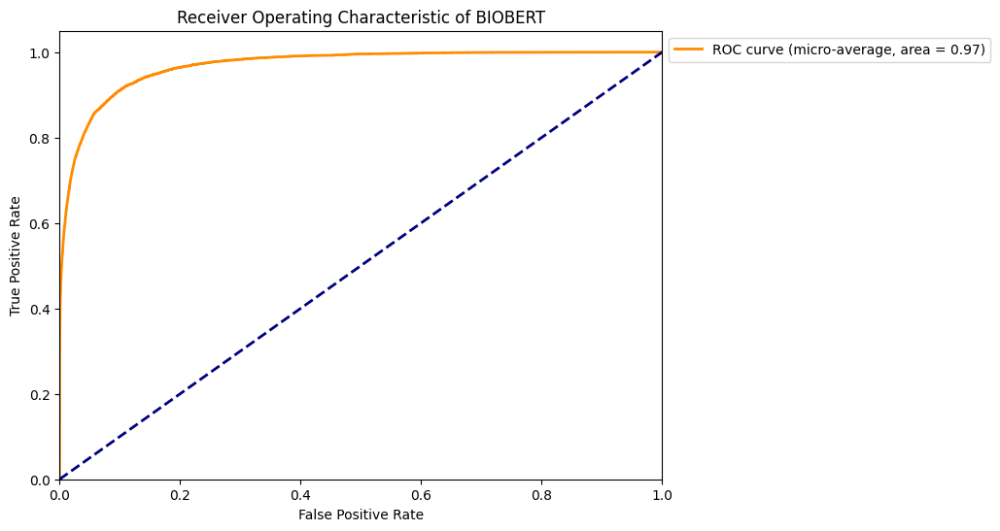

Epoch 7, Loss: 0.48
Validation Loss: 1.57
Validation loss did not improve for 2 epoch(s).
Early stopping triggered.


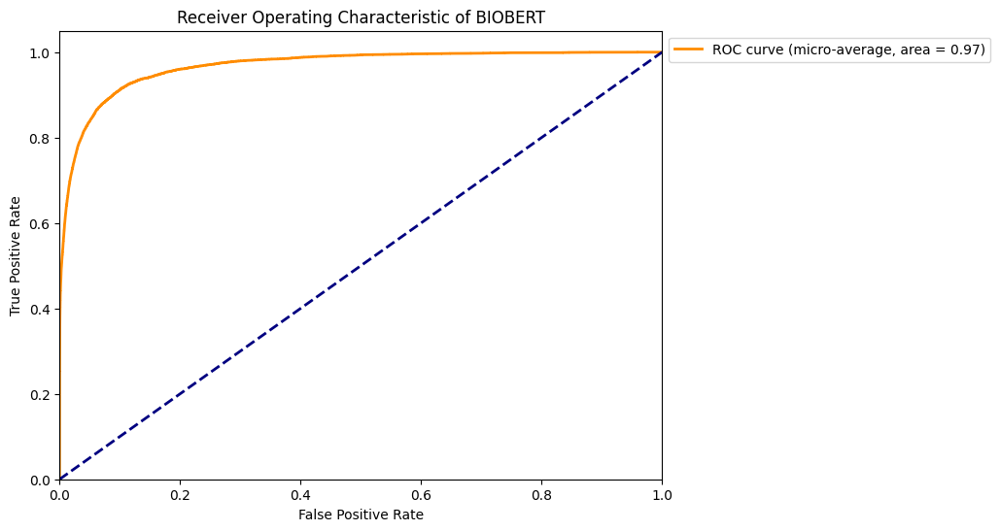

Early stopping triggered.
Training complete


In [9]:
import pandas as pd
import re
import numpy as np
import torch
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_curve, auc
import seaborn as sns
import matplotlib.pyplot as plt
from transformers import BertTokenizer, BertForSequenceClassification, AdamW
from transformers import DistilBertTokenizer, DistilBertForSequenceClassification, AdamW
from imblearn.over_sampling import SMOTE
from torch.utils.data import DataLoader, TensorDataset
from sklearn.preprocessing import label_binarize

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

# Load BERT model and tokenizer for classification
tokenizer = BertTokenizer.from_pretrained('dmis-lab/biobert-v1.1')
model = BertForSequenceClassification.from_pretrained('dmis-lab/biobert-v1.1', num_labels=40)

# Enable gradient checkpointing to reduce memory usage
model.gradient_checkpointing_enable()

# Function to preprocess text
def preprocess_text(text):
    text = str(text).lower()
    text = re.sub(r'\([^)]*\)', '', text)
    text = re.sub('"', '', text)
    text = re.sub(r"'s\b", "", text)
    text = re.sub("[^a-zA-Z]", " ", text)
    return text.strip()

# Load data
data = pd.read_csv('/kaggle/input/medicaltranscriptions/mtsamples.csv')
data.drop('Unnamed: 0', axis=1, inplace=True)

# Clean transcription
data['cleaned_transcription'] = data['transcription'].apply(preprocess_text)

# Tokenize and encode the texts
def encode_texts(texts):
    inputs = tokenizer(texts.tolist(), return_tensors='pt', padding=True, truncation=True, max_length=64)
    return inputs['input_ids'], inputs['attention_mask']

# Create embeddings for transcripts
input_ids, attention_masks = encode_texts(data.cleaned_transcription)

# Label encode our categorical target variable
le = LabelEncoder()
Y = le.fit_transform(data.medical_specialty.values)

# Applying SMOTE to balance classes
sm = SMOTE()
X_res, Y_res = sm.fit_resample(input_ids.numpy(), Y)

# Splitting data into train:test
X_train, X_val, Y_train, Y_val = train_test_split(X_res, Y_res, test_size=0.2, random_state=42)

# Convert to tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.long)  # Use long for indices
Y_train_tensor = torch.tensor(Y_train, dtype=torch.long)
X_val_tensor = torch.tensor(X_val, dtype=torch.long)
Y_val_tensor = torch.tensor(Y_val, dtype=torch.long)

train_dataset = TensorDataset(X_train_tensor, Y_train_tensor)
val_dataset = TensorDataset(X_val_tensor, Y_val_tensor)

train_dataloader = DataLoader(train_dataset, batch_size=16, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=16, shuffle=False)

# Training function with Early Stopping
def train_model_with_early_stopping(model, train_dataloader, val_dataloader, num_epochs=20, patience=2):
    optimizer = AdamW(model.parameters(), lr=5e-5)
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)

    best_val_loss = float('inf')  # Start with a very high value
    epochs_without_improvement = 0  # Counter for early stopping
    early_stop = False  # Flag to check if early stopping is triggered

    for epoch in range(num_epochs):
        if early_stop:
            print("Early stopping triggered.")
            break

        model.train()
        total_loss = 0

        # Training loop
        for batch in train_dataloader:
            optimizer.zero_grad()
            inputs, labels = batch
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model(input_ids=inputs, labels=labels)
            loss = outputs.loss
            total_loss += loss.item()
            loss.backward()
            optimizer.step()

        avg_loss = total_loss / len(train_dataloader)
        print(f"Epoch {epoch + 1}, Loss: {avg_loss:.2f}")

        # Validation
        model.eval()
        val_loss = 0.0
        val_preds, val_labels = [], []
        with torch.no_grad():
            for batch in val_dataloader:
                inputs, labels = batch
                inputs = inputs.to(device)
                labels = labels.to(device)
                outputs = model(input_ids=inputs, labels=labels)
                val_loss += outputs.loss.item()
                val_preds.append(torch.softmax(outputs.logits, dim=1).cpu().numpy())  # Use softmax for probabilities
                val_labels.append(labels.cpu().numpy())

        avg_val_loss = val_loss / len(val_dataloader)
        print(f"Validation Loss: {avg_val_loss:.2f}")

        # Check for improvement in validation loss
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            epochs_without_improvement = 0  # Reset counter
            print("Validation loss improved. Saving model...")
            torch.save(model.state_dict(), 'best_model.pth')  # Save the best model
        else:
            epochs_without_improvement += 1
            print(f"Validation loss did not improve for {epochs_without_improvement} epoch(s).")

        # Early stopping condition
        if epochs_without_improvement >= patience:
            early_stop = True
            print("Early stopping triggered.")

        # Evaluation metrics after each epoch
        val_preds = np.concatenate(val_preds)
        val_labels = np.concatenate(val_labels)

        # Compute multiclass ROC AUC (micro average)
        # Binarize the labels for multi-class ROC AUC computation
        val_labels_bin = label_binarize(val_labels, classes=np.arange(len(le.classes_)))

        # Compute ROC curve and ROC AUC for the entire model (micro-averaged)
        fpr, tpr, _ = roc_curve(val_labels_bin.ravel(), val_preds.ravel())  # Flatten to get micro-average
        roc_auc = auc(fpr, tpr)

        # Plot ROC curve for the entire model (micro-averaged)
        plt.figure(figsize=(8, 6))
        plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (micro-average, area = {roc_auc:.2f})')
        plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
        plt.xlim([0.0, 1.0])
        plt.ylim([0.0, 1.05])
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('Receiver Operating Characteristic of BIOBERT')
        plt.legend(loc='upper left', bbox_to_anchor=(1, 1))
        plt.show()

    print("Training complete") 

# Train the model with early stopping
train_model_with_early_stopping(model, train_dataloader, val_dataloader, num_epochs=25, patience=2)

## Classifiers with Hyper parameters tuning & RandomizedSearchCV

In [25]:
# Logistic Regression classification model (13-12-24)
classifier = LogisticRegression()

# Define the parameter distribution for hyperparameter tuning (you can adjust these based on your needs)
param_dist = {
    'C': [0.1, 1, 10],  # Regularization strength (log scale for more exploration)
    'solver': ['liblinear', 'lbfgs', 'saga'],  # Solver to use for optimization
    'max_iter': [100, 250, 500, 1000],  # Maximum number of iterations for the solvers
    'penalty': ['l2', 'l1', 'elasticnet'],  # Regularization penalty
    'multi_class': ['auto', 'ovr', 'multinomial'],  # Multi-class strategy
    'fit_intercept': [True, False],  # Whether to include the intercept term in the model
    'class_weight': [None, 'balanced'],  # Weigh classes differently in imbalanced datasets
    'tol': [1e-5, 1e-3],  # Tolerance for stopping criteria
}

# Set up RandomizedSearchCV for hyperparameter tuning with cross-validation
random_search = RandomizedSearchCV(estimator=classifier, param_distributions=param_dist, 
                                   n_iter=10, cv=2, n_jobs=-1, verbose=1, scoring='accuracy', random_state=42)

# Train the model with RandomizedSearchCV (this will automatically handle cross-validation and hyperparameter tuning)
random_search.fit(x_train, y_train)

# Print the best parameters and the best score found by RandomizedSearchCV
print(f"Best parameters from RandomizedSearchCV: {random_search.best_params_}")
print(f"Best cross-validation score: {random_search.best_score_}")

# Use the best estimator found by RandomizedSearchCV
best_classifier = random_search.best_estimator_

# Cross-validation results with the best model (2-fold cross-validation)
cv_results = cross_validate(best_classifier, x_train, y_train, cv=2)

# Print cross-validation results (accuracy, fit time, score time)
print("Cross-validation results: ", cv_results)

# Logistic Regression classification report using the best model
prediction = best_classifier.predict(x_val)

# Print classification report (with the correct order for y_true and y_pred)
print('Classification report for Logistic Regression: \n', classification_report(y_val, prediction, target_names=list(le.classes_), digits=4))

Fitting 2 folds for each of 10 candidates, totalling 20 fits
Best parameters from RandomizedSearchCV: {'tol': 1e-05, 'solver': 'liblinear', 'penalty': 'l2', 'multi_class': 'ovr', 'max_iter': 500, 'fit_intercept': False, 'class_weight': 'balanced', 'C': 1}
Best cross-validation score: 0.8174864007252947
Cross-validation results:  {'fit_time': array([37.5048008 , 36.92687988]), 'score_time': array([0.24698043, 0.23552418]), 'test_score': array([0.81759973, 0.81737307])}
Classification report for Logistic Regression: 
                                 precision    recall  f1-score   support

          Allergy / Immunology     0.8727    1.0000    0.9320       233
                       Autopsy     1.0000    1.0000    1.0000       224
                    Bariatrics     0.9177    0.9571    0.9370       233
    Cardiovascular / Pulmonary     0.5990    0.5784    0.5885       204
                  Chiropractic     0.8211    0.9528    0.8821       212
    Consult - History and Phy.     0.2558    

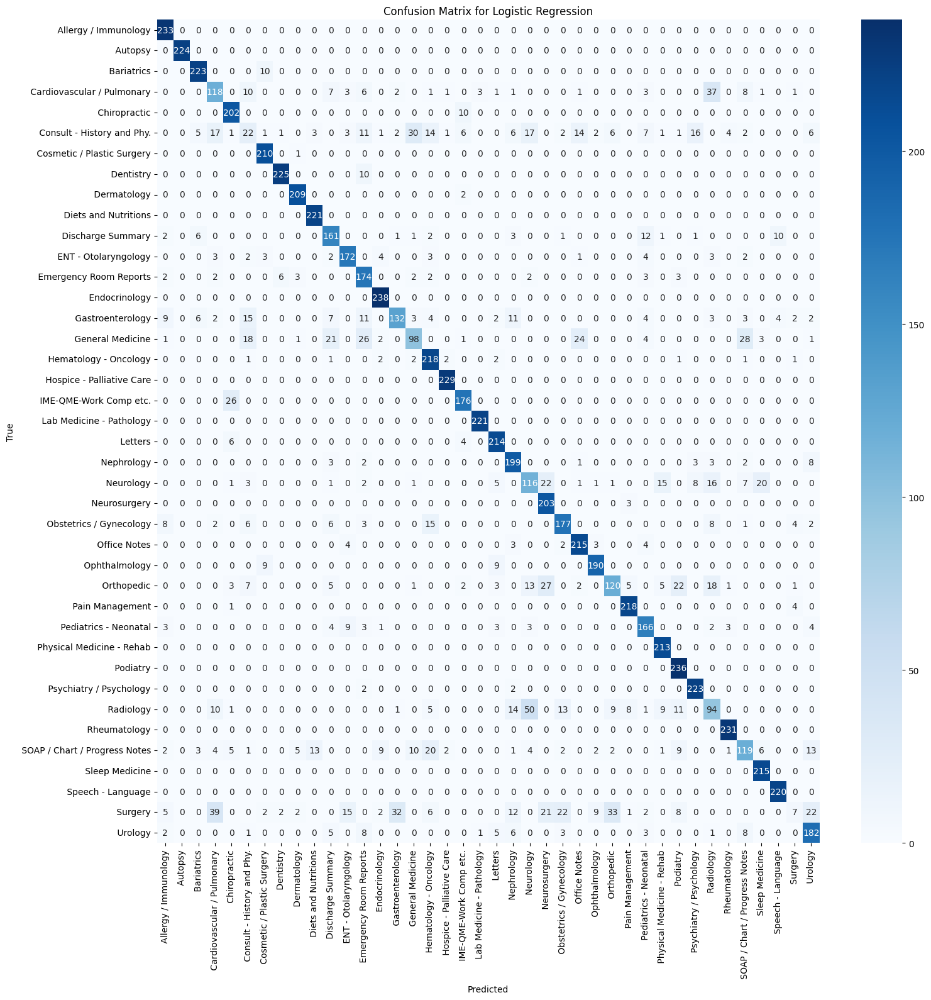

In [26]:
# Confusion Matrix Logistic Regression
conf_matrix = confusion_matrix(y_val, prediction)

# Plotting the confusion matrix
plt.figure(figsize=(17, 17))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=le.classes_, yticklabels=le.classes_)
plt.title('Confusion Matrix for Logistic Regression')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

In [27]:
# Random Forest classification model
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV, cross_val_score
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
import numpy as np

# Define your RandomForestClassifier
classifier = RandomForestClassifier()

# Optimistic hyperparameter settings for large dataset (you can adjust the ranges based on your needs)
param_dist = {
    'n_estimators': [100, 200, 300],  # Number of trees in the forest
    'max_depth': [10, 20, 30],         # Maximum depth of the tree
    'min_samples_split': [5, 10, 20],         # Minimum number of samples required to split an internal node
    'min_samples_leaf': [5, 15, 25],           # Minimum number of samples required to be at a leaf node
    'max_features': ['auto', 'sqrt'],  # Number of features to consider when looking for the best split
    'bootstrap': [True, False],               # Whether bootstrap samples are used when building trees
    'class_weight': ['balanced'],      # Class weights for imbalanced datasets
    'n_jobs': [-1],                           # Use all available processors
    'random_state': [42]                     # Ensure reproducibility
}

# RandomizedSearchCV for hyperparameter tuning
random_search = RandomizedSearchCV(
    estimator=classifier, 
    param_distributions=param_dist,
    n_iter=10,  # Number of random combinations to try
    cv=2,       # 2-fold cross-validation
    verbose=1,  # Verbosity to track progress
    random_state=42,
    n_jobs=-1   # Use all available cores
)

# Train the model using RandomizedSearchCV
random_search.fit(x_train, y_train)

# Print the best parameters and the best score from RandomizedSearchCV
print("Best hyperparameters from RandomizedSearchCV: ", random_search.best_params_)
print("Best cross-validation score: ", random_search.best_score_)

# Use the best estimator to make predictions
best_classifier = random_search.best_estimator_

# Cross-validation with 2 folds (using the best model found from RandomizedSearchCV)
cv_results = cross_val_score(best_classifier, x_train, y_train, cv=2)

# Print cross-validation results (accuracy scores)
print("Cross-validation results (2-fold): ", cv_results)
print(f"Mean accuracy from cross-validation: {np.mean(cv_results):.4f}")

# Predictions using the best classifier
prediction = best_classifier.predict(x_val)

# Print the classification report
print("Classification report for Random Forest with RandomizedSearchCV: \n", 
      classification_report(y_val, prediction, target_names=list(le.classes_), digits=4))

Fitting 2 folds for each of 10 candidates, totalling 20 fits


/opt/conda/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/opt/conda/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomForestClassifiers and ExtraTreesClassifiers.
  warn(
/opt/conda/lib/python3.10/site-packages/sklearn/ensemble/_forest.py:424: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'` or remove this parameter as it is also the default value for RandomFor

Best hyperparameters from RandomizedSearchCV:  {'random_state': 42, 'n_jobs': -1, 'n_estimators': 300, 'min_samples_split': 5, 'min_samples_leaf': 5, 'max_features': 'sqrt', 'max_depth': 30, 'class_weight': 'balanced', 'bootstrap': True}
Best cross-validation score:  0.8288191296464189
Cross-validation results (2-fold):  [0.82768586 0.8299524 ]
Mean accuracy from cross-validation: 0.8288
Classification report for Random Forest with RandomizedSearchCV: 
                                 precision    recall  f1-score   support

          Allergy / Immunology     0.9788    0.9914    0.9851       233
                       Autopsy     1.0000    1.0000    1.0000       224
                    Bariatrics     0.9472    1.0000    0.9729       233
    Cardiovascular / Pulmonary     0.6392    0.4951    0.5580       204
                  Chiropractic     0.8376    0.9245    0.8789       212
    Consult - History and Phy.     0.3049    0.1238    0.1761       202
    Cosmetic / Plastic Surgery     0.

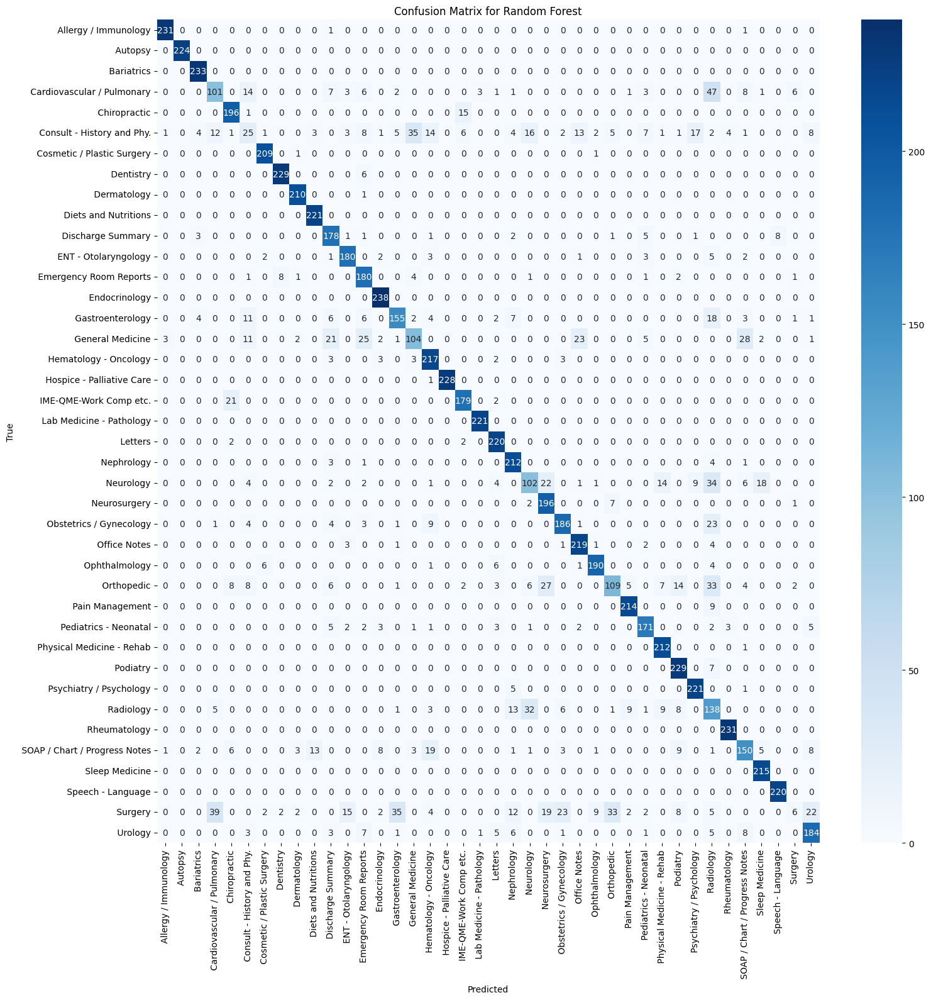

In [28]:
# Confusion Matrix RF
conf_matrix = confusion_matrix(y_val, prediction)

# Plotting the confusion matrix
plt.figure(figsize=(17, 17))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=le.classes_, yticklabels=le.classes_)
plt.title('Confusion Matrix for Random Forest')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

In [29]:
# Multi-Layer Perceptron Classification model
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import RandomizedSearchCV, cross_val_score
from sklearn.metrics import classification_report
import numpy as np

# Initialize the MLPClassifier (without specifying hyperparameters, so RandomizedSearchCV will handle that)
classifier = MLPClassifier(random_state=42)

# Define the parameter distribution for RandomizedSearchCV
param_dist = {
    'hidden_layer_sizes': [(50,), (100,), (50, 50), (100, 100)],  # Different architectures (single and multi-layer)
    'activation': ['relu', 'tanh', 'logistic'],  # Activation function
    'solver': ['adam', 'sgd'],  # Optimization solver
    'alpha': [0.0001, 0.001, 0.01],  # L2 penalty (regularization)
    'learning_rate': ['constant', 'invscaling', 'adaptive'],  # Learning rate schedule
    'learning_rate_init': [0.001, 0.01, 0.1],  # Initial learning rate
    'batch_size': ['auto', 32, 64],  # Batch size for the SGD solver
    'max_iter': [100, 250, 500],  # Maximum number of iterations for training
    'early_stopping': [True, False],  # Whether to use early stopping to avoid overfitting
    'validation_fraction': [0.1, 0.2],  # Proportion of training data to set aside for early stopping
    'n_iter_no_change': [10, 20],  # Number of iterations with no improvement after which training will stop
    
}

# RandomizedSearchCV for hyperparameter tuning
random_search = RandomizedSearchCV(
    estimator=classifier,
    param_distributions=param_dist,
    n_iter=10,  # Number of random combinations to try
    cv=2,  # 2-fold cross-validation
    verbose=1,  # Verbosity to track progress
    random_state=42,
    n_jobs=-1  # Use all available cores
)

# Train the model using RandomizedSearchCV
random_search.fit(x_train, y_train)

# Print the best parameters and the best score from RandomizedSearchCV
print("Best hyperparameters from RandomizedSearchCV: ", random_search.best_params_)
print("Best cross-validation score: ", random_search.best_score_)

# Use the best estimator (MLP with the best hyperparameters) to make predictions
best_classifier = random_search.best_estimator_

# Cross-validation with 2 folds (using the best model found from RandomizedSearchCV)
cv_results = cross_val_score(best_classifier, x_train, y_train, cv=2)

# Print cross-validation results (accuracy scores)
print("Cross-validation results (2-fold): ", cv_results)
print(f"Mean accuracy from cross-validation: {np.mean(cv_results):.4f}")

# Predictions using the best classifier
prediction = best_classifier.predict(x_val)

# Print the classification report
print("Classification report for Multi-Layer Perceptron with RandomizedSearchCV: \n", 
      classification_report(y_val, prediction, target_names=list(le.classes_), digits=4))

Fitting 2 folds for each of 10 candidates, totalling 20 fits


/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:686: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (100) reached and the optimization hasn't converged yet.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptro

Best hyperparameters from RandomizedSearchCV:  {'validation_fraction': 0.2, 'solver': 'adam', 'n_iter_no_change': 10, 'max_iter': 100, 'learning_rate_init': 0.001, 'learning_rate': 'constant', 'hidden_layer_sizes': (100,), 'early_stopping': False, 'batch_size': 'auto', 'alpha': 0.001, 'activation': 'relu'}
Best cross-validation score:  0.836582048957389
Cross-validation results (2-fold):  [0.83425884 0.83890526]
Mean accuracy from cross-validation: 0.8366
Classification report for Multi-Layer Perceptron with RandomizedSearchCV: 
                                 precision    recall  f1-score   support

          Allergy / Immunology     0.9873    1.0000    0.9936       233
                       Autopsy     1.0000    1.0000    1.0000       224
                    Bariatrics     0.9662    0.9828    0.9745       233
    Cardiovascular / Pulmonary     0.6070    0.5980    0.6025       204
                  Chiropractic     0.8864    0.9198    0.9028       212
    Consult - History and Phy. 

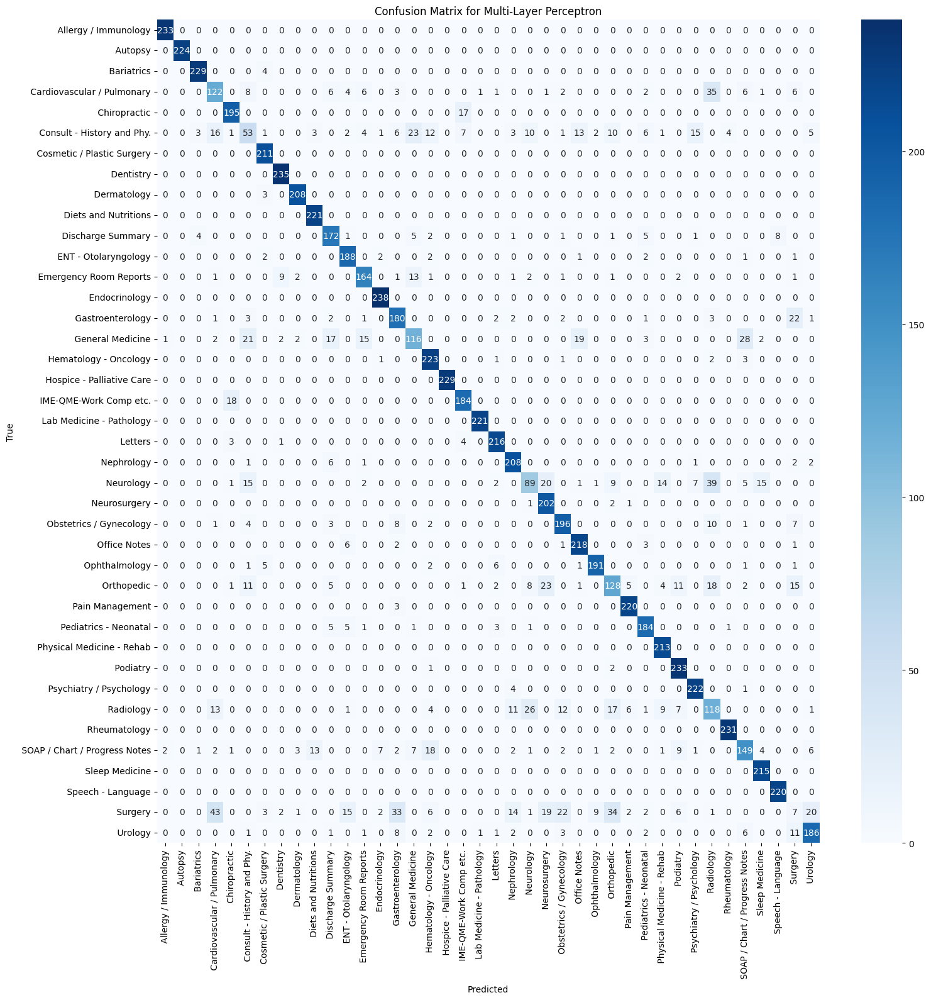

In [30]:
# Confusion Matrix Multi-Layer Perceptron 
conf_matrix = confusion_matrix(y_val, prediction)

# Plotting the confusion matrix
plt.figure(figsize=(17, 17))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=le.classes_, yticklabels=le.classes_)
plt.title('Confusion Matrix for Multi-Layer Perceptron')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show() 

In [31]:
# Naive Bayes Classification model
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import RandomizedSearchCV, cross_validate
from sklearn.metrics import classification_report
import numpy as np

# Define the parameter distribution for RandomizedSearchCV
param_dist = {
    'var_smoothing': np.logspace(0, -9, 100)  # range of possible smoothing values, from 1 to 1e-9
}

# Initialize the GaussianNB classifier
classifier = GaussianNB()

# Apply RandomizedSearchCV with 2-fold cross-validation
random_search = RandomizedSearchCV(classifier, param_distributions=param_dist, n_iter=50, cv=2, verbose=1, random_state=42, n_jobs=-1)

# Train the Naive Bayes model with RandomizedSearchCV
random_search.fit(x_train, y_train)

# Get the best parameters found by RandomizedSearchCV
print(f"Best parameters found: {random_search.best_params_}")

# Cross-validation with 2 folds using the best found model
cv_results = cross_validate(random_search.best_estimator_, x_train, y_train, cv=2)

# Print cross-validation results (accuracy, fit time, score time)
print("Cross-validation results: ", cv_results)

# Predictions using the best model from RandomizedSearchCV
prediction = random_search.best_estimator_.predict(x_val)

# Print classification report
print('Classification report for Naive Bayes with RandomizedSearchCV: \n', classification_report(y_val, prediction, target_names=list(le.classes_), digits=4)) 

Fitting 2 folds for each of 50 candidates, totalling 100 fits
Best parameters found: {'var_smoothing': 1.873817422860387e-09}
Cross-validation results:  {'fit_time': array([1.61817217, 1.62896872]), 'score_time': array([28.66883016, 28.66757393]), 'test_score': array([0.85749093, 0.85686763])}
Classification report for Naive Bayes with RandomizedSearchCV: 
                                 precision    recall  f1-score   support

          Allergy / Immunology     0.9708    1.0000    0.9852       233
                       Autopsy     1.0000    1.0000    1.0000       224
                    Bariatrics     0.9628    1.0000    0.9811       233
    Cardiovascular / Pulmonary     0.7241    0.5147    0.6017       204
                  Chiropractic     0.8413    1.0000    0.9138       212
    Consult - History and Phy.     0.5652    0.3218    0.4101       202
    Cosmetic / Plastic Surgery     0.9462    1.0000    0.9724       211
                     Dentistry     0.9592    1.0000    0.9792  

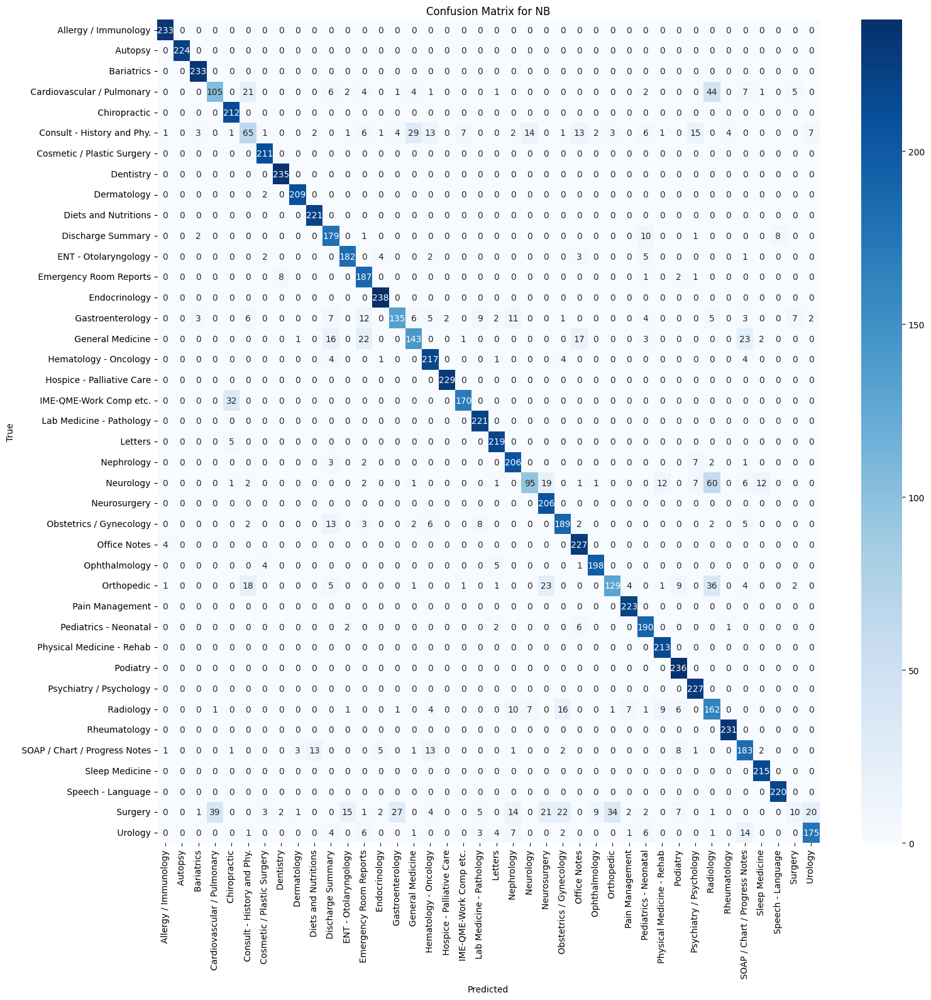

In [32]:
# Confusion Matrix Naive Bayes
conf_matrix = confusion_matrix(y_val, prediction)

# Plotting the confusion matrix
plt.figure(figsize=(17, 17))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=le.classes_, yticklabels=le.classes_)
plt.title('Confusion Matrix for NB')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

In [38]:
! pip install nltk
import nltk
from nltk.corpus import stopwords

# Download the stopwords dataset if not already downloaded
nltk.download('stopwords')

# Use the stopwords
stop_words = set(stopwords.words('english'))

#EDA
data = pd.read_csv('/kaggle/input/medicaltranscriptions/mtsamples.csv')
print(data.columns)
#data.head(5)

data.drop('Unnamed: 0',axis=1,inplace=True)

data.columns

# a function to preprocess the data
def Preprocessing(text):
    text = str(text)
    text = text.lower()
    text = re.sub(r'\([^)]*\)', '', text)
    text = re.sub('"','', text) 
    text = re.sub(r"'s\b","",text)
    text = re.sub("[^a-zA-Z]", " ", text) 
    tokens = [w for w in text.split() if not w in stop_words]
    long_words = [i for i in tokens if len(i)>=3]
    return (" ".join(long_words)).strip()

data['cleaned_transcription'] = data['transcription'].apply(Preprocessing)

print(data.columns)

# creating feature vectors and target vector
transcripts = data.cleaned_transcription.values
Y = data.medical_specialty.values

# label encode our categorical target variable
le = LabelEncoder()
Y = le.fit_transform(Y)

print(Y)

# function to create document-term matrix
def create_vec(strings):
  #tf = TfidfVectorizer(analyzer="char_wb", ngram_range=(1,3))
  tf = TfidfVectorizer(max_features = 6000, ngram_range=(1,3), min_df=5, max_df=0.9)
  tf.fit(strings)
  X = tf.fit_transform(strings)
  return X
vecs = create_vec(transcripts)# a function to preprocess the data

print(vecs)

df = pd.DataFrame({"class":list(y_res)})
df.head()

df['class'].value_counts()

# Splitting data into train:test by 80:20
x_train, x_val, y_train, y_val = train_test_split(x_res, y_res, test_size=0.2, random_state = 42)

# applying SMOTE oversampling method to upsample minority class labels
sm = SMOTE()
x_res, y_res = sm.fit_resample(vecs,Y)

x_train = x_train.toarray()
print('\nTraining features shape: ',x_train.shape)

x_val =x_val.toarray()
print('Test features shape:     ',x_val.shape)

# a function to train and evaluate model
def train_model(model, x_train,x_test,y_train,y_test):
  model.fit(x_train,y_train)
  prediction = model.predict(x_test)
  print('Accuracy',round(accuracy_score(prediction, y_test)*100, 0),'%')
  return model

[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
Index(['Unnamed: 0', 'description', 'medical_specialty', 'sample_name',
       'transcription', 'keywords'],
      dtype='object')
Index(['description', 'medical_specialty', 'sample_name', 'transcription',
       'keywords', 'cleaned_transcription'],
      dtype='object')
[0 2 2 ... 0 0 0]
  (0, 3314)	0.09403042310250295
  (0, 908)	0.10238291501134683
  (0, 4064)	0.10735828324847223
  (0, 3528)	0.091052388350128
  (0, 5987)	0.07621250555094665
  (0, 5176)	0.1047122232206365
  (0, 5408)	0.10566288771279468
  (0, 149)	0.11042100614514046
  (0, 2991)	0.06482340517448347
  (0, 5920)	0.10599037032882767
  (0, 5229)	0.09315652072007759
  (0, 3313)	0.06423350875032413
  (0, 907)	0.09820037674998712
  (0, 5455)	0.1047122232206365
  (0, 3296)	0.10440537031218039
  (0, 573)	0.05168030582444491
  (0, 4063)	0.10735828324847223
  (0, 5861)	0.0747634135990948
  (0, 151)	0.07360

In [39]:
# Naive Bayes Classification model
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import RandomizedSearchCV, cross_validate
from sklearn.metrics import classification_report
import numpy as np

# Define the parameter distribution for RandomizedSearchCV
param_dist = {
    'var_smoothing': np.logspace(0, -9, 100)  # range of possible smoothing values, from 1 to 1e-9
}

# Initialize the GaussianNB classifier
classifier = GaussianNB()

# Apply RandomizedSearchCV with 2-fold cross-validation
random_search = RandomizedSearchCV(classifier, param_distributions=param_dist, n_iter=50, cv=5, verbose=1, random_state=42, n_jobs=-1)

# Train the Naive Bayes model with RandomizedSearchCV
random_search.fit(x_train, y_train)

# Get the best parameters found by RandomizedSearchCV
print(f"Best parameters found: {random_search.best_params_}")

# Cross-validation with 2 folds using the best found model
cv_results = cross_validate(random_search.best_estimator_, x_train, y_train, cv=2)

# Print cross-validation results (accuracy, fit time, score time)
print("Cross-validation results: ", cv_results)

# Predictions using the best model from RandomizedSearchCV
prediction = random_search.best_estimator_.predict(x_val)

# Print classification report
print('Classification report for Naive Bayes with RandomizedSearchCV: \n', classification_report(y_val, prediction, target_names=list(le.classes_), digits=4)) 

Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best parameters found: {'var_smoothing': 1.873817422860387e-09}
Cross-validation results:  {'fit_time': array([1.95416617, 1.94556236]), 'score_time': array([31.15334225, 30.97458649]), 'test_score': array([0.85647099, 0.85686763])}
Classification report for Naive Bayes with RandomizedSearchCV: 
                                 precision    recall  f1-score   support

          Allergy / Immunology     0.9708    1.0000    0.9852       233
                       Autopsy     1.0000    1.0000    1.0000       224
                    Bariatrics     0.9510    1.0000    0.9749       233
    Cardiovascular / Pulmonary     0.7092    0.4902    0.5797       204
                  Chiropractic     0.8480    1.0000    0.9177       212
    Consult - History and Phy.     0.5669    0.3564    0.4377       202
    Cosmetic / Plastic Surgery     0.9372    0.9905    0.9631       211
                     Dentistry     0.9711    1.0000    0.9853  

In [ ]:
# Confusion Matrix Naive Bayes
conf_matrix = confusion_matrix(y_val, prediction)

# Plotting the confusion matrix
plt.figure(figsize=(17, 17))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=le.classes_, yticklabels=le.classes_)
plt.title('Confusion Matrix for NB')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

In [33]:
# Decision Tree Classification model
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import RandomizedSearchCV, cross_validate
from sklearn.metrics import classification_report
import numpy as np

# Define the parameter distribution for RandomizedSearchCV
param_dist = {
    'criterion': ['gini', 'entropy'],  # Split quality criterion
    'max_depth': [None, 10, 20, 30, 40],  # Max depth of tree (None means expand until leaves are pure)
    'min_samples_split': [2, 5, 10, 20],  # Min samples required to split a node
    'min_samples_leaf': [1, 2, 4, 10],    # Min samples required at a leaf node
    'max_features': ['auto', 'sqrt', 'log2', None],  # Number of features to consider for splits
    'splitter': ['best', 'random'],      # Strategy used to split at each node
    'class_weight': [None, 'balanced'],  # Use 'balanced' for class weighting in imbalanced datasets
    'random_state': [42],  # Ensures reproducibility
}

# Initialize the DecisionTreeClassifier
classifier = DecisionTreeClassifier()

# Apply RandomizedSearchCV with 2-fold cross-validation
random_search = RandomizedSearchCV(classifier, param_distributions=param_dist, n_iter=50, cv=2, verbose=1, random_state=42, n_jobs=-1)

# Train the Decision Tree model with RandomizedSearchCV
random_search.fit(x_train, y_train)

# Get the best parameters found by RandomizedSearchCV
print(f"Best parameters found: {random_search.best_params_}")

# Cross-validation with 2 folds using the best found model
cv_results = cross_validate(random_search.best_estimator_, x_train, y_train, cv=2)

# Print cross-validation results (accuracy, fit time, score time)
print("Cross-validation results: ", cv_results)

# Predictions using the best model from RandomizedSearchCV
prediction = random_search.best_estimator_.predict(x_val)

# Print classification report
print('Classification report for Decision Tree with RandomizedSearchCV: \n', classification_report(y_val, prediction, target_names=list(le.classes_), digits=4))

Fitting 2 folds for each of 50 candidates, totalling 100 fits


/opt/conda/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/sklearn/tree/_classes.py:269: FutureWarning: `max_features='auto'` has been deprecated in 1.1 and will be removed in 1.3. To keep the past behaviour, explicitly set `max_features='sqrt'`.
  warnings.warn(
/opt/conda/lib/pytho

Best parameters found: {'splitter': 'best', 'random_state': 42, 'min_samples_split': 5, 'min_samples_leaf': 2, 'max_features': None, 'max_depth': None, 'criterion': 'entropy', 'class_weight': None}
Cross-validation results:  {'fit_time': array([40.27084279, 41.29575706]), 'score_time': array([0.19956779, 0.20529771]), 'test_score': array([0.75135993, 0.75577969])}
Classification report for Decision Tree with RandomizedSearchCV: 
                                 precision    recall  f1-score   support

          Allergy / Immunology     0.9871    0.9828    0.9849       233
                       Autopsy     0.9956    1.0000    0.9978       224
                    Bariatrics     0.9538    0.9742    0.9639       233
    Cardiovascular / Pulmonary     0.4000    0.4902    0.4405       204
                  Chiropractic     0.8475    0.9434    0.8929       212
    Consult - History and Phy.     0.1166    0.1634    0.1361       202
    Cosmetic / Plastic Surgery     0.9384    0.9384    0.9384

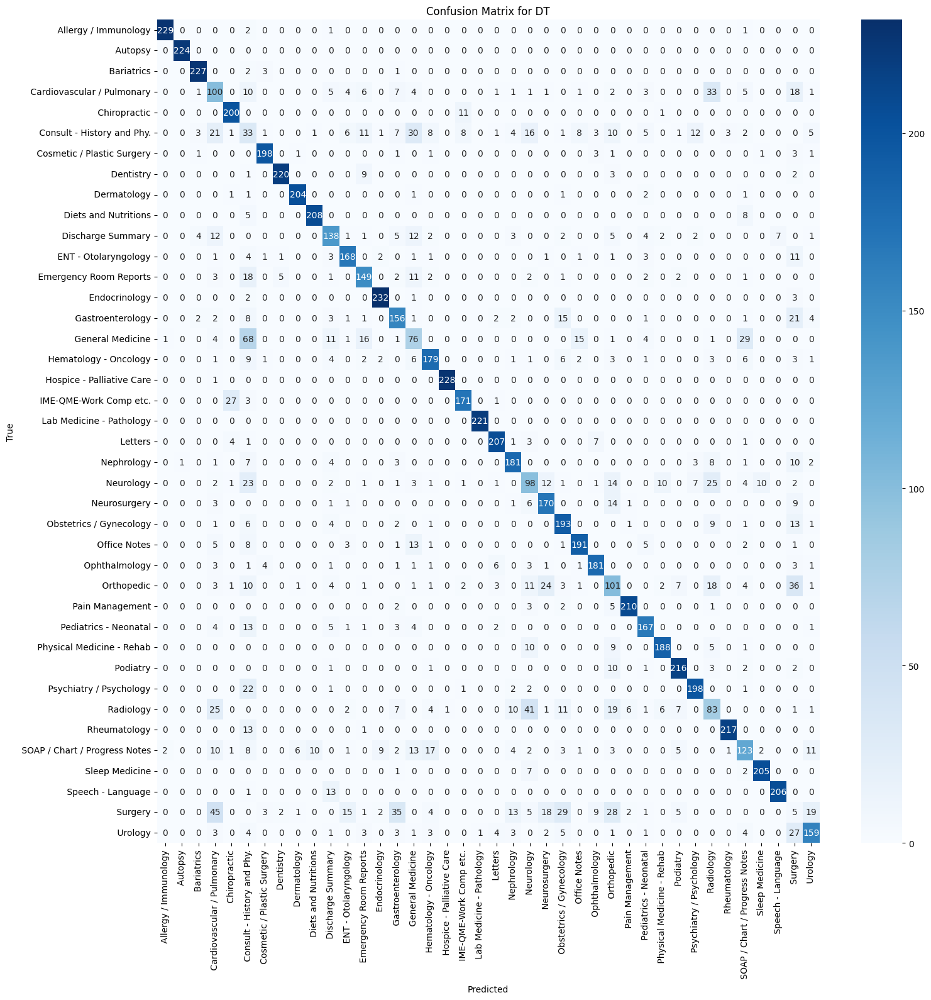

In [34]:
# Confusion Matrix Decision Tree
conf_matrix = confusion_matrix(y_val, prediction)

# Plotting the confusion matrix
plt.figure(figsize=(17, 17))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=le.classes_, yticklabels=le.classes_)
plt.title('Confusion Matrix for DT')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show()

In [35]:
# Define the Support Vector Machine model for finding best parameter setting
classifier = SVC()

# Define the parameter distribution for hyperparameter tuning (you can adjust these based on your needs)
param_dist = {
    'C': [0.01, 0.1, 1],                # Regularization parameter (penalty for misclassification)
    'kernel': ['linear', 'rbf'],                  # Type of kernel to use for SVM
    'gamma': ['scale', 'auto'],                   # Kernel coefficient (affects 'rbf', 'poly', and 'sigmoid' kernels)
    'tol': [1e-1, 1e-2],                    # Tolerance for stopping criteria
    'class_weight': ['None','balanced'],           # Adjust class weights in case of imbalanced classes
    'shrinking': [True],                   # Whether to use shrinking heuristics
    #'degree': [3, 4, 5],                          # Degree of polynomial kernel (only used if kernel='poly')
    #'coef0': [0.0, 0.1, 1.0]                     # Independent term in kernel function (only used if kernel='poly' or 'sigmoid')
}

# Set up RandomizedSearchCV for hyperparameter tuning with 2-fold cross-validation
random_search = RandomizedSearchCV(estimator=classifier, param_distributions=param_dist, 
                                   n_iter=10, cv=2, n_jobs=-1, verbose=1, scoring='accuracy', random_state=42)

# Train the model with RandomizedSearchCV (this will automatically handle 2-fold cross-validation)
random_search.fit(x_train, y_train)

# Print the best parameters and the best score found by RandomizedSearchCV
print(f"Best parameters from RandomizedSearchCV: {random_search.best_params_}")
print(f"Best cross-validation score: {random_search.best_score_}")

# Use the best estimator found by RandomizedSearchCV
best_classifier = random_search.best_estimator_

# Cross-validation results with the best model (2-fold cross-validation)
cv_results = cross_validate(best_classifier, x_train, y_train, cv=2)

# Print cross-validation results (accuracy, fit time, score time)
print("Cross-validation results: ", cv_results)

# SVM classification report using the best model
prediction = best_classifier.predict(x_val)

# Print classification report (with the correct order for y_true and y_pred)
print('Classification report for Support Vector Machine: \n', classification_report(y_val, prediction, target_names=list(le.classes_), digits=4)) 

Fitting 2 folds for each of 10 candidates, totalling 20 fits
Best parameters from RandomizedSearchCV: {'tol': 0.01, 'shrinking': True, 'kernel': 'rbf', 'gamma': 'scale', 'class_weight': 'balanced', 'C': 1}
Best cross-validation score: 0.8153615140525838
Cross-validation results:  {'fit_time': array([392.51187325, 399.73136759]), 'score_time': array([1067.68122101, 1072.25808215]), 'test_score': array([0.81402992, 0.81669311])}
Classification report for Support Vector Machine: 
                                 precision    recall  f1-score   support

          Allergy / Immunology     0.9668    1.0000    0.9831       233
                       Autopsy     1.0000    1.0000    1.0000       224
                    Bariatrics     0.9370    0.9571    0.9469       233
    Cardiovascular / Pulmonary     0.5843    0.4755    0.5243       204
                  Chiropractic     0.7969    0.9623    0.8718       212
    Consult - History and Phy.     0.3143    0.1089    0.1618       202
    Cosmetic

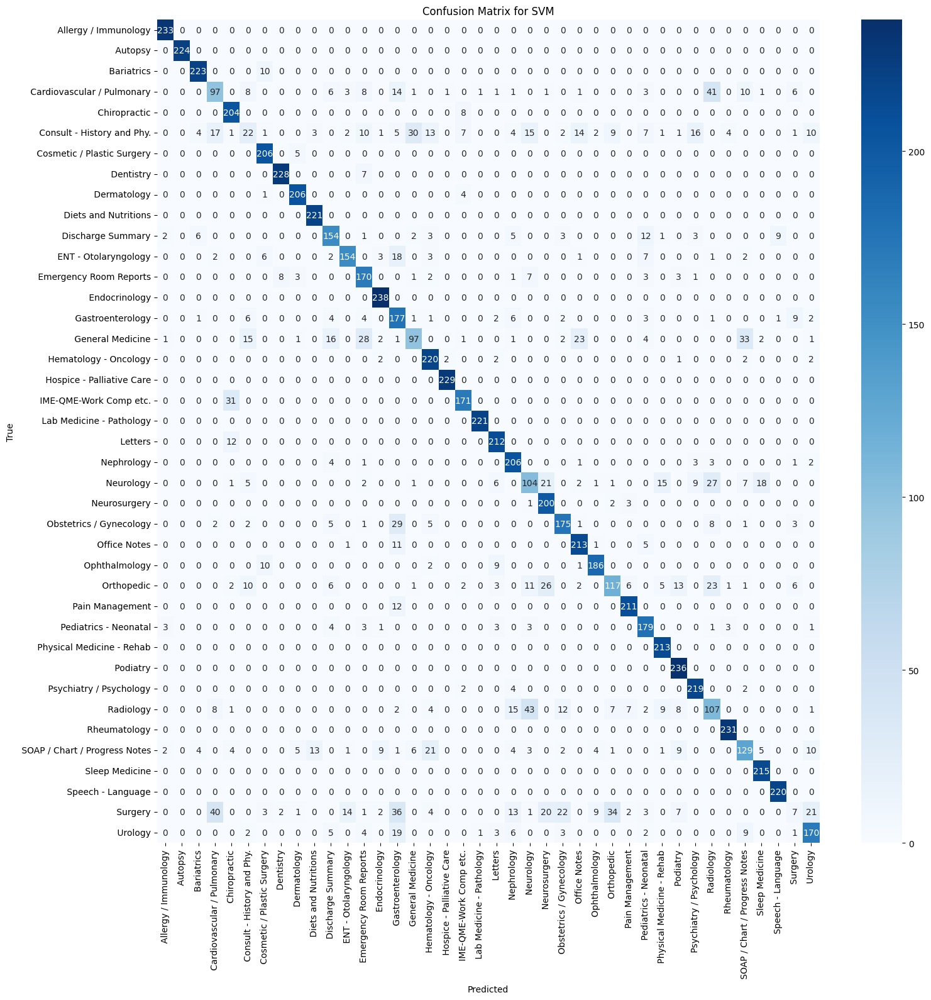

In [36]:
# Confusion Matrix SVM
conf_matrix = confusion_matrix(y_val, prediction)

# Plotting the confusion matrix
plt.figure(figsize=(17, 17))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=le.classes_, yticklabels=le.classes_)
plt.title('Confusion Matrix for SVM')
plt.xlabel('Predicted')
plt.ylabel('True')
plt.show() 


Training features shape:  (35296, 64)
Validation features shape:  (8824, 64)
Epoch 1, Loss: 3.20
Validation Loss: 2.68
Validation loss improved. Saving model...
Validation Accuracy: 26.55%
                                precision    recall  f1-score   support

          Allergy / Immunology     0.4696    0.5966    0.5255       233
                       Autopsy     0.4134    0.3304    0.3672       224
                    Bariatrics     0.2080    0.4893    0.2919       233
    Cardiovascular / Pulmonary     0.3056    0.0539    0.0917       204
                  Chiropractic     0.1333    0.1415    0.1373       212
    Consult - History and Phy.     0.2274    0.4356    0.2988       202
    Cosmetic / Plastic Surgery     0.1489    0.6825    0.2445       211
                     Dentistry     0.2642    0.0596    0.0972       235
                   Dermatology     0.5000    0.0047    0.0094       211
          Diets and Nutritions     0.6128    0.9955    0.7586       221
             Disc

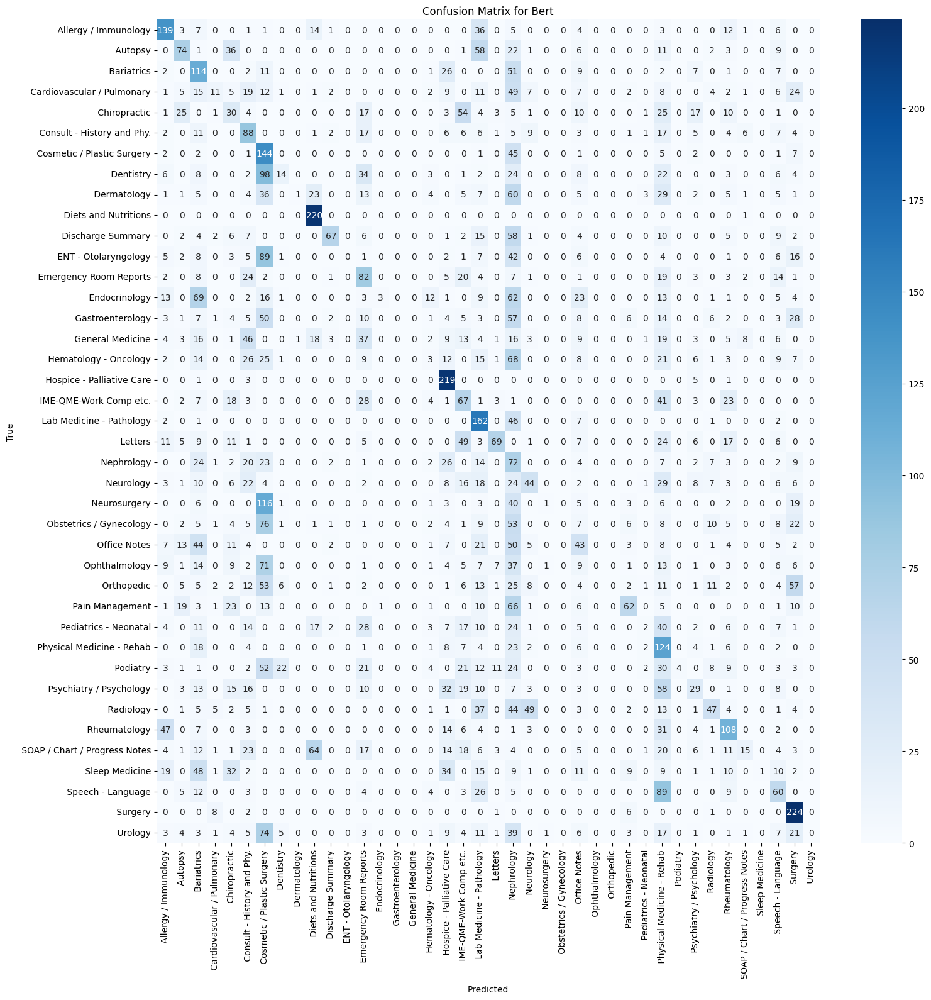

Epoch 2, Loss: 2.32
Validation Loss: 1.95
Validation loss improved. Saving model...
Validation Accuracy: 45.64%
                                precision    recall  f1-score   support

          Allergy / Immunology     0.6871    0.9142    0.7845       233
                       Autopsy     0.8607    0.7723    0.8141       224
                    Bariatrics     0.5121    0.7253    0.6004       233
    Cardiovascular / Pulmonary     0.3077    0.1961    0.2395       204
                  Chiropractic     0.3254    0.7783    0.4590       212
    Consult - History and Phy.     0.3066    0.2079    0.2478       202
    Cosmetic / Plastic Surgery     0.2572    0.4218    0.3196       211
                     Dentistry     0.2931    0.7234    0.4172       235
                   Dermatology     0.3768    0.1232    0.1857       211
          Diets and Nutritions     0.8165    0.9864    0.8934       221
             Discharge Summary     0.4194    0.5174    0.4633       201
          ENT - Otolary

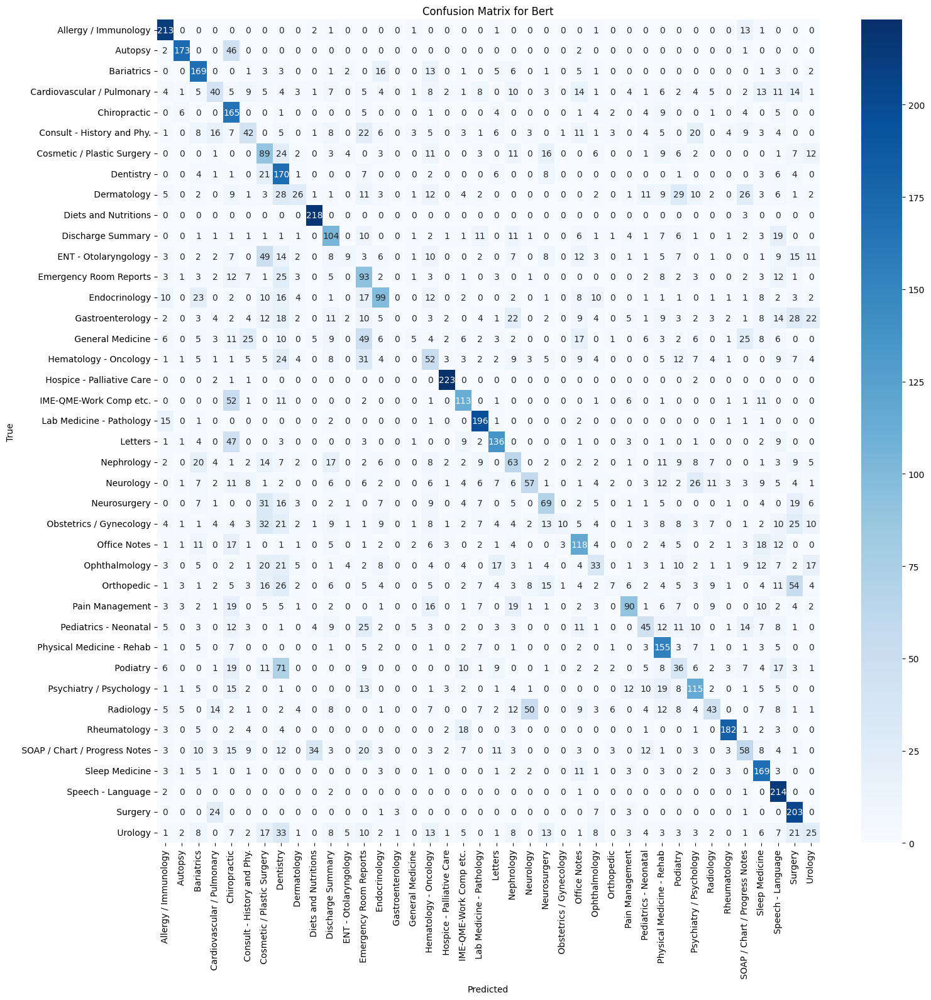

Epoch 3, Loss: 1.64
Validation Loss: 1.57
Validation loss improved. Saving model...
Validation Accuracy: 54.35%
                                precision    recall  f1-score   support

          Allergy / Immunology     0.8669    0.9785    0.9194       233
                       Autopsy     0.7865    0.9866    0.8752       224
                    Bariatrics     0.6765    0.8884    0.7681       233
    Cardiovascular / Pulmonary     0.2952    0.1520    0.2006       204
                  Chiropractic     0.6272    0.8255    0.7128       212
    Consult - History and Phy.     0.2634    0.2673    0.2654       202
    Cosmetic / Plastic Surgery     0.4007    0.5450    0.4618       211
                     Dentistry     0.8306    0.4383    0.5738       235
                   Dermatology     0.4706    0.7204    0.5693       211
          Diets and Nutritions     0.9022    0.9186    0.9103       221
             Discharge Summary     0.5644    0.4577    0.5055       201
          ENT - Otolary

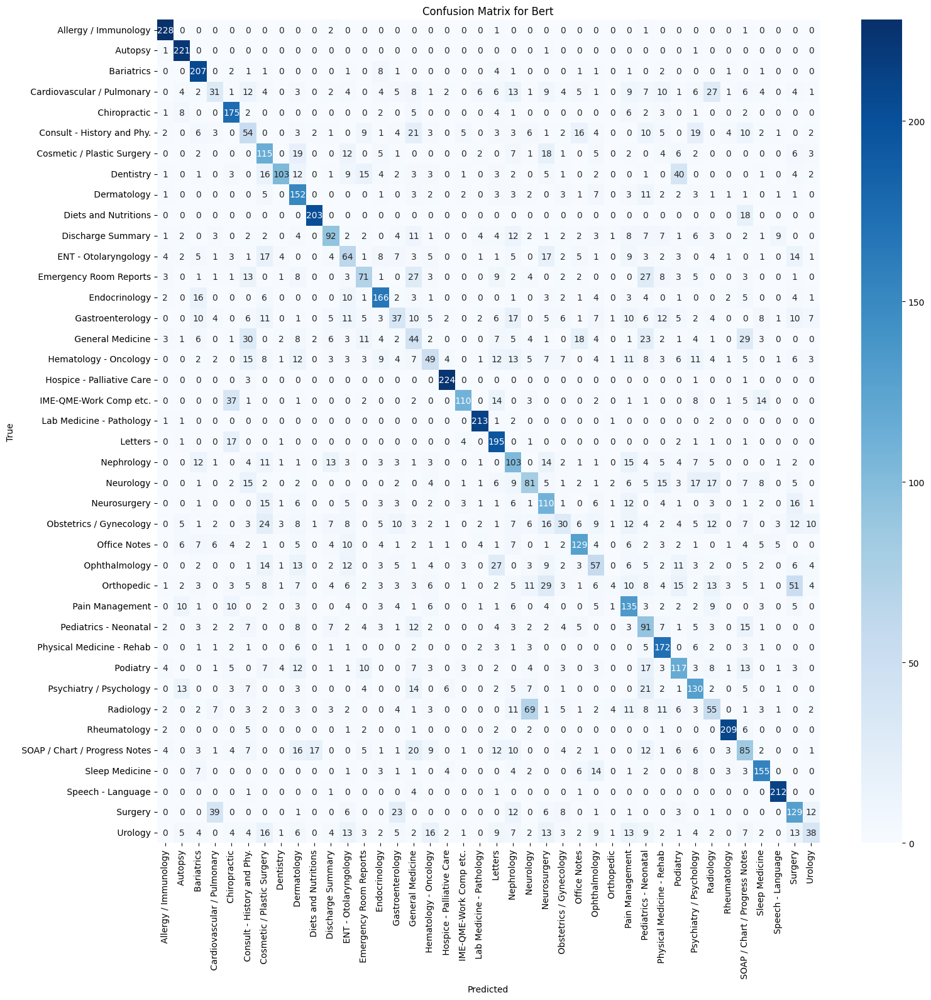

Epoch 4, Loss: 1.18
Validation Loss: 1.36
Validation loss improved. Saving model...
Validation Accuracy: 59.88%
                                precision    recall  f1-score   support

          Allergy / Immunology     0.9300    0.9700    0.9496       233
                       Autopsy     0.8984    0.9866    0.9404       224
                    Bariatrics     0.6814    0.9270    0.7855       233
    Cardiovascular / Pulmonary     0.2357    0.1814    0.2050       204
                  Chiropractic     0.5655    0.8962    0.6934       212
    Consult - History and Phy.     0.2430    0.1287    0.1683       202
    Cosmetic / Plastic Surgery     0.6096    0.7251    0.6623       211
                     Dentistry     0.7120    0.7574    0.7340       235
                   Dermatology     0.7042    0.7109    0.7075       211
          Diets and Nutritions     0.9301    0.9638    0.9467       221
             Discharge Summary     0.4637    0.5721    0.5122       201
          ENT - Otolary

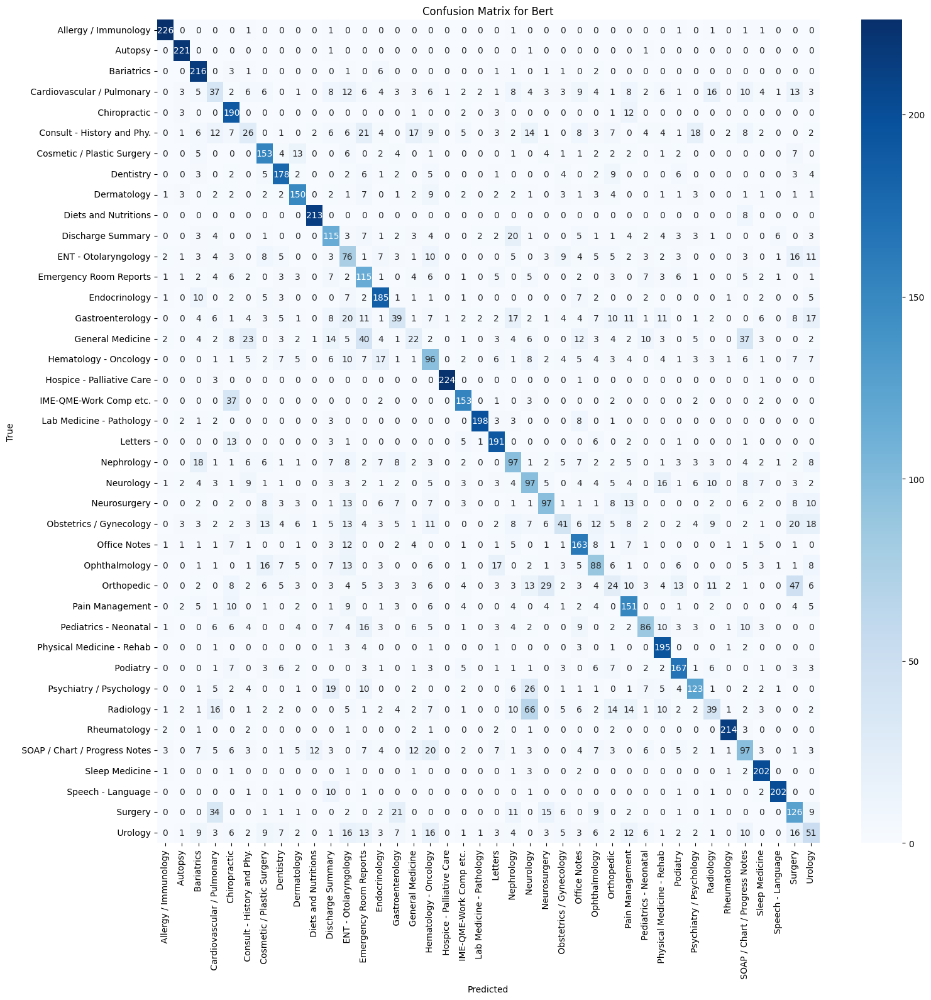

Epoch 5, Loss: 0.86
Validation Loss: 1.32
Validation loss improved. Saving model...
Validation Accuracy: 61.82%
                                precision    recall  f1-score   support

          Allergy / Immunology     0.9234    0.9828    0.9522       233
                       Autopsy     0.9024    0.9911    0.9447       224
                    Bariatrics     0.9324    0.8884    0.9099       233
    Cardiovascular / Pulmonary     0.2500    0.1225    0.1645       204
                  Chiropractic     0.7708    0.8726    0.8186       212
    Consult - History and Phy.     0.2258    0.3119    0.2620       202
    Cosmetic / Plastic Surgery     0.7396    0.6730    0.7047       211
                     Dentistry     0.6642    0.7745    0.7151       235
                   Dermatology     0.6842    0.8009    0.7380       211
          Diets and Nutritions     0.8661    0.9955    0.9263       221
             Discharge Summary     0.6490    0.4876    0.5568       201
          ENT - Otolary

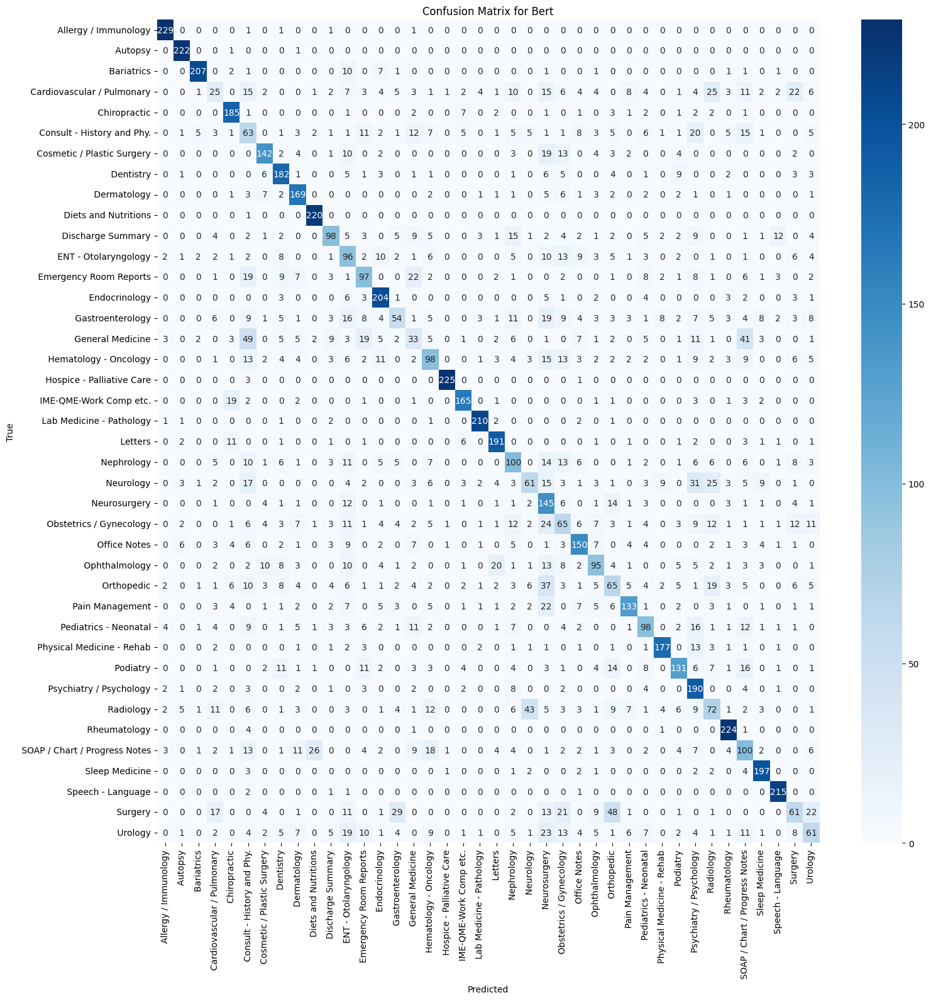

Epoch 6, Loss: 0.64
Validation Loss: 1.44
Validation loss did not improve for 1 epoch(s).
Validation Accuracy: 60.52%
                                precision    recall  f1-score   support

          Allergy / Immunology     0.9744    0.9785    0.9764       233
                       Autopsy     0.9864    0.9732    0.9798       224
                    Bariatrics     0.9372    0.8326    0.8818       233
    Cardiovascular / Pulmonary     0.2632    0.1471    0.1887       204
                  Chiropractic     0.7180    0.9009    0.7992       212
    Consult - History and Phy.     0.1435    0.1485    0.1460       202
    Cosmetic / Plastic Surgery     0.7962    0.5924    0.6793       211
                     Dentistry     0.7023    0.7830    0.7404       235
                   Dermatology     0.7833    0.6682    0.7212       211
          Diets and Nutritions     0.9355    0.9186    0.9269       221
             Discharge Summary     0.5507    0.5672    0.5588       201
          ENT - O

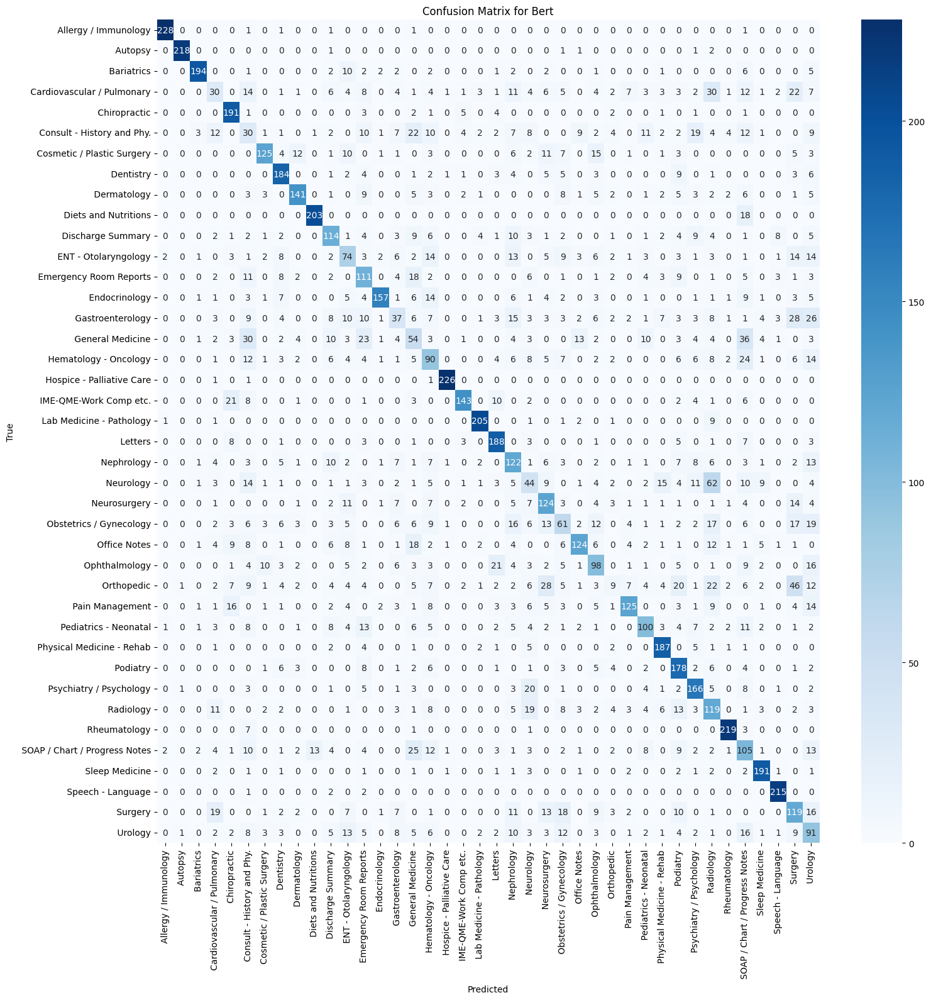

Epoch 7, Loss: 0.50
Validation Loss: 1.38
Validation loss did not improve for 2 epoch(s).
Early stopping triggered.
Validation Accuracy: 63.00%
                                precision    recall  f1-score   support

          Allergy / Immunology     0.9463    0.9828    0.9642       233
                       Autopsy     0.9910    0.9821    0.9865       224
                    Bariatrics     0.9012    0.9399    0.9202       233
    Cardiovascular / Pulmonary     0.2517    0.1765    0.2075       204
                  Chiropractic     0.8610    0.7594    0.8070       212
    Consult - History and Phy.     0.2186    0.1980    0.2078       202
    Cosmetic / Plastic Surgery     0.6749    0.7773    0.7225       211
                     Dentistry     0.8290    0.6809    0.7477       235
                   Dermatology     0.6631    0.8863    0.7586       211
          Diets and Nutritions     0.8627    0.9955    0.9244       221
             Discharge Summary     0.5311    0.5522    0.5415  

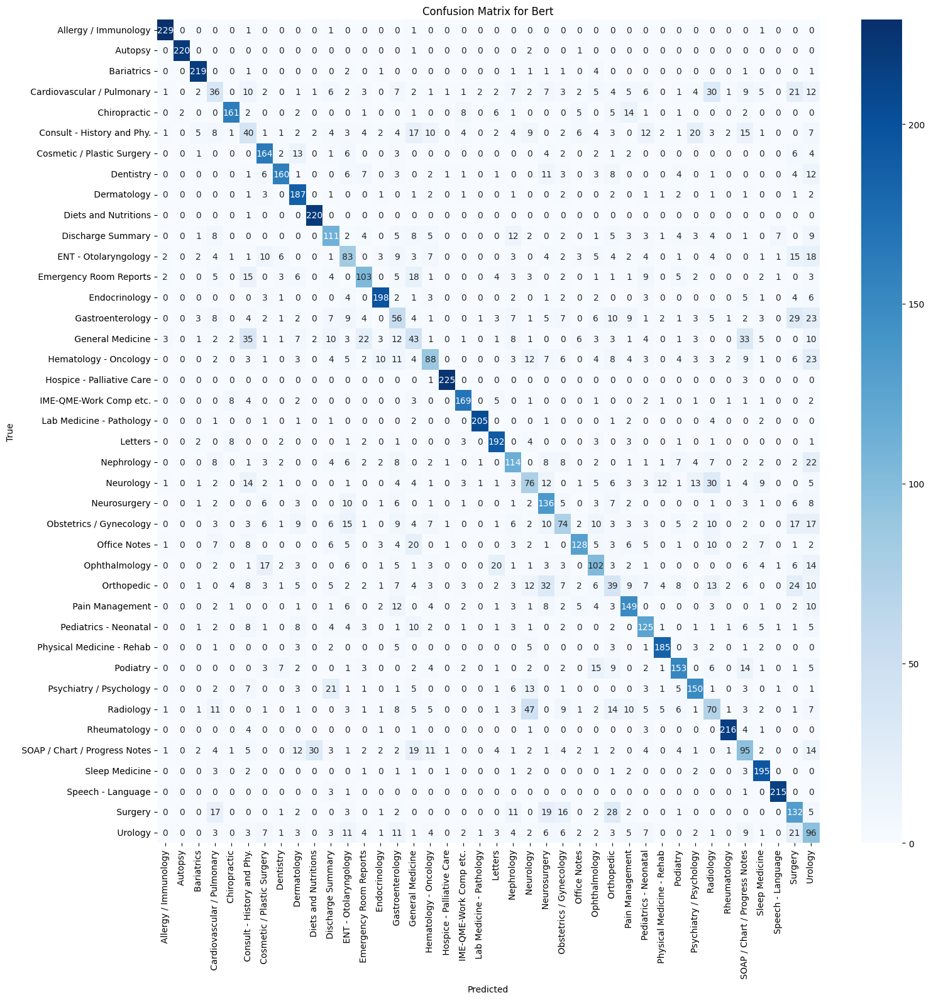

Early stopping triggered.
Training complete


In [56]:
# BERT Classification 25-Epochs and early stopping parameter setting with pateience 2

import pandas as pd
import re
import numpy as np
import torch
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
from transformers import BertTokenizer, BertForSequenceClassification
from imblearn.over_sampling import SMOTE
from torch.utils.data import DataLoader, TensorDataset
from transformers import AdamW

import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

# Load BERT model and tokenizer for classification
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')
model = BertForSequenceClassification.from_pretrained('bert-base-uncased', num_labels=40)

# Function to preprocess text
def preprocess_text(text):
    text = str(text).lower()
    text = re.sub(r'\([^)]*\)', '', text)
    text = re.sub('"', '', text)
    text = re.sub(r"'s\b", "", text)
    text = re.sub("[^a-zA-Z]", " ", text)
    return text.strip()

# Load data
data = pd.read_csv('/kaggle/input/medicaltranscriptions/mtsamples.csv')
data.drop('Unnamed: 0', axis=1, inplace=True)

# Clean transcription
data['cleaned_transcription'] = data['transcription'].apply(preprocess_text)

# Tokenize and encode the texts
def encode_texts(texts):
    inputs = tokenizer(texts.tolist(), return_tensors='pt', padding=True, truncation=True, max_length=64)
    return inputs['input_ids'], inputs['attention_mask']

# Create embeddings for transcripts
input_ids, attention_masks = encode_texts(data.cleaned_transcription)

# Label encode our categorical target variable
le = LabelEncoder()
Y = le.fit_transform(data.medical_specialty.values)

# Applying SMOTE to balance classes
sm = SMOTE()
X_res, Y_res = sm.fit_resample(input_ids.numpy(), Y)

# Splitting data into train:test
X_train, X_val, Y_train, Y_val = train_test_split(X_res, Y_res, test_size=0.2, random_state=42)

print('\nTraining features shape: ', X_train.shape)
print('Validation features shape: ', X_val.shape)

# Convert to tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.long)  # Use long for indices
Y_train_tensor = torch.tensor(Y_train, dtype=torch.long)
X_val_tensor = torch.tensor(X_val, dtype=torch.long)
Y_val_tensor = torch.tensor(Y_val, dtype=torch.long)

train_dataset = TensorDataset(X_train_tensor, Y_train_tensor)
val_dataset = TensorDataset(X_val_tensor, Y_val_tensor)

train_dataloader = DataLoader(train_dataset, batch_size=16, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=16, shuffle=False)

# Training function with Early Stopping
def train_model_with_early_stopping(model, train_dataloader, val_dataloader, num_epochs=20, accumulation_steps=2, patience=2):
    optimizer = AdamW(model.parameters(), lr=5e-5)
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)

    best_val_loss = float('inf')  # Start with a very high value
    epochs_without_improvement = 0  # Counter for early stopping
    early_stop = False  # Flag to check if early stopping is triggered

    for epoch in range(num_epochs):
        if early_stop:
            print("Early stopping triggered.")
            break

        model.train()
        total_loss = 0

        # Training loop
        for batch in train_dataloader:
            optimizer.zero_grad()
            inputs, labels = batch
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model(input_ids=inputs, labels=labels)
            loss = outputs.loss
            total_loss += loss.item()
            loss.backward()
            optimizer.step()

        avg_loss = total_loss / len(train_dataloader)
        print(f"Epoch {epoch + 1}, Loss: {avg_loss:.2f}")

        # Validation
        model.eval()
        val_loss = 0.0
        val_preds, val_labels = [], []
        with torch.no_grad():
            for batch in val_dataloader:
                inputs, labels = batch
                inputs = inputs.to(device)
                labels = labels.to(device)
                outputs = model(input_ids=inputs, labels=labels)
                val_loss += outputs.loss.item()
                val_preds.append(outputs.logits.argmax(dim=1).cpu().numpy())
                val_labels.append(labels.cpu().numpy())

        avg_val_loss = val_loss / len(val_dataloader)
        print(f"Validation Loss: {avg_val_loss:.2f}")

        # Check for improvement in validation loss
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            epochs_without_improvement = 0  # Reset counter
            print("Validation loss improved. Saving model...")
            torch.save(model.state_dict(), 'best_model.pth')  # Save the best model
        else:
            epochs_without_improvement += 1
            print(f"Validation loss did not improve for {epochs_without_improvement} epoch(s).")

        # Early stopping condition
        if epochs_without_improvement >= patience:
            early_stop = True
            print("Early stopping triggered.")

        # Evaluation metrics after each epoch
        val_preds = np.concatenate(val_preds)
        val_labels = np.concatenate(val_labels)

        accuracy = accuracy_score(val_labels, val_preds)
        print(f"Validation Accuracy: {accuracy * 100:.2f}%")
        print(classification_report(val_labels, val_preds, target_names=le.classes_, digits=4, zero_division=0))

        # Confusion Matrix
        conf_matrix = confusion_matrix(val_labels, val_preds)

        # Plotting the confusion matrix as a heatmap
        plt.figure(figsize=(17, 17))
        sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=le.classes_, yticklabels=le.classes_)
        plt.title('Confusion Matrix for Bert')
        plt.xlabel('Predicted')
        plt.ylabel('True')
        plt.xticks(rotation=90)
        plt.yticks(rotation=0)
        plt.show() 

    print("Training complete") 

# Train the model with early stopping 
train_model_with_early_stopping(model, train_dataloader, val_dataloader, num_epochs=25, patience=2) 


Training features shape:  (35296, 64)
Validation features shape:  (8824, 64)
Epoch 1, Loss: 2.79
Validation Loss: 2.15
Validation loss improved. Saving model...
Validation Accuracy: 40.07%
                                precision    recall  f1-score   support

          Allergy / Immunology     0.7970    0.9099    0.8497       233
                       Autopsy     0.7688    0.6384    0.6976       224
                    Bariatrics     0.4674    0.3691    0.4125       233
    Cardiovascular / Pulmonary     0.3333    0.1176    0.1739       204
                  Chiropractic     0.3615    0.6651    0.4684       212
    Consult - History and Phy.     0.3013    0.3564    0.3265       202
    Cosmetic / Plastic Surgery     0.1958    0.3981    0.2625       211
                     Dentistry     0.3184    0.3021    0.3100       235
                   Dermatology     0.2000    0.0521    0.0827       211
          Diets and Nutritions     0.8037    0.9819    0.8839       221
             Disc

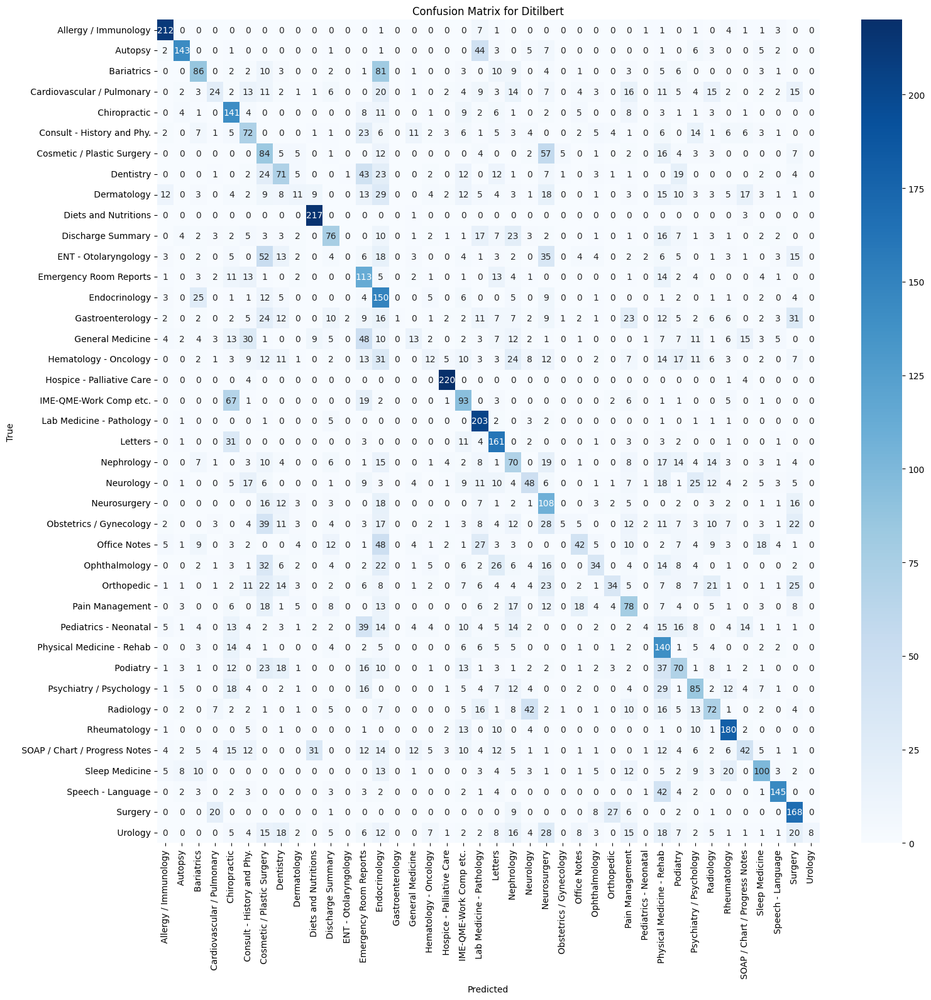

Epoch 2, Loss: 1.79
Validation Loss: 1.62
Validation loss improved. Saving model...
Validation Accuracy: 52.28%
                                precision    recall  f1-score   support

          Allergy / Immunology     0.9200    0.9871    0.9524       233
                       Autopsy     0.8308    0.9866    0.9020       224
                    Bariatrics     0.6206    0.6738    0.6461       233
    Cardiovascular / Pulmonary     0.2778    0.0735    0.1163       204
                  Chiropractic     0.7281    0.7453    0.7366       212
    Consult - History and Phy.     0.2458    0.1436    0.1812       202
    Cosmetic / Plastic Surgery     0.3589    0.3555    0.3571       211
                     Dentistry     0.6321    0.5702    0.5996       235
                   Dermatology     0.7214    0.4787    0.5755       211
          Diets and Nutritions     0.8423    0.9910    0.9106       221
             Discharge Summary     0.5852    0.3930    0.4702       201
          ENT - Otolary

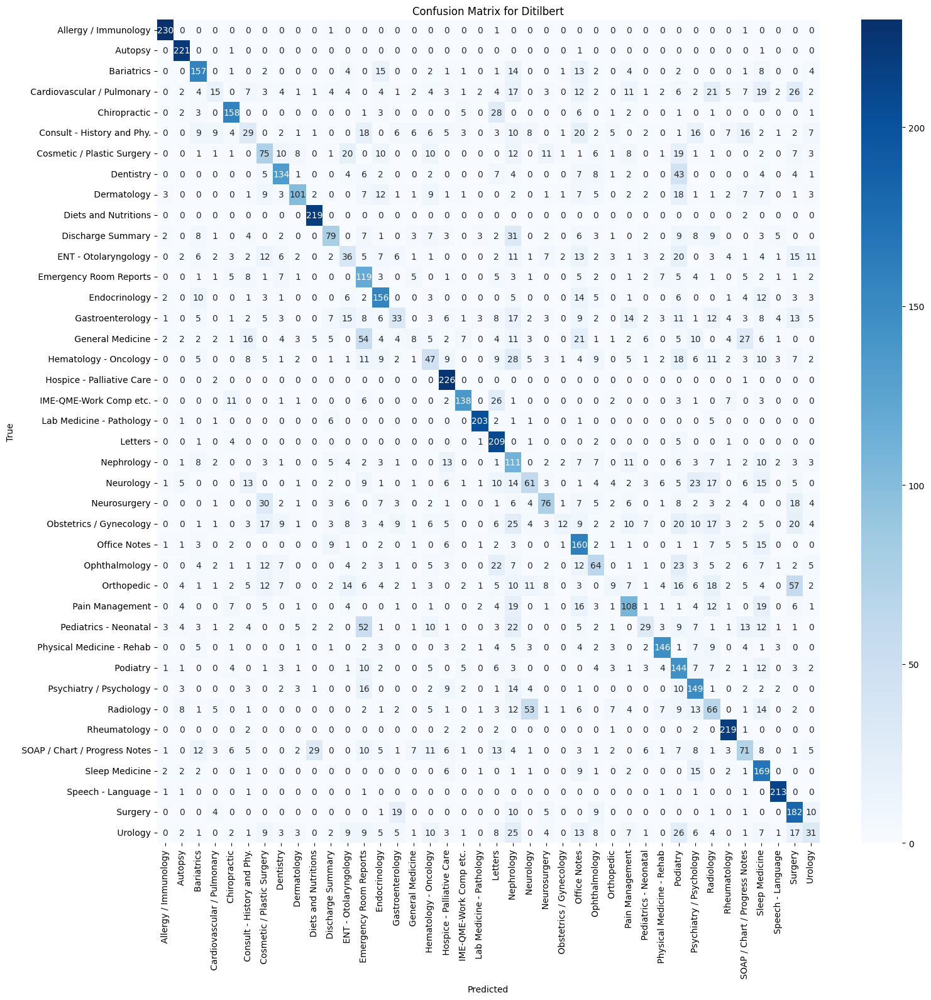

Epoch 3, Loss: 1.23
Validation Loss: 1.40
Validation loss improved. Saving model...
Validation Accuracy: 57.41%
                                precision    recall  f1-score   support

          Allergy / Immunology     0.9012    0.9785    0.9383       233
                       Autopsy     0.9690    0.9777    0.9733       224
                    Bariatrics     0.6957    0.8240    0.7544       233
    Cardiovascular / Pulmonary     0.2312    0.1961    0.2122       204
                  Chiropractic     0.8088    0.7783    0.7933       212
    Consult - History and Phy.     0.2266    0.1436    0.1758       202
    Cosmetic / Plastic Surgery     0.3853    0.7962    0.5193       211
                     Dentistry     0.6396    0.7702    0.6988       235
                   Dermatology     0.7477    0.7583    0.7529       211
          Diets and Nutritions     0.9552    0.8688    0.9100       221
             Discharge Summary     0.4462    0.4328    0.4394       201
          ENT - Otolary

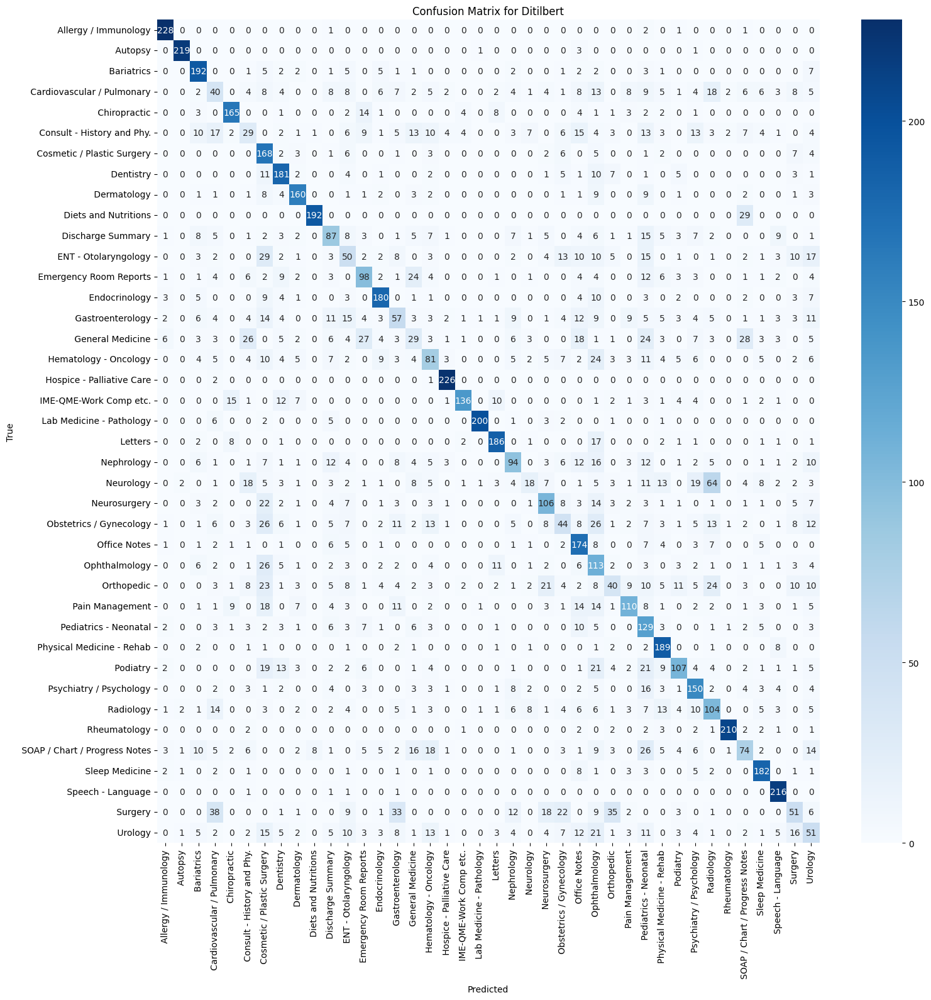

Epoch 4, Loss: 0.86
Validation Loss: 1.38
Validation loss improved. Saving model...
Validation Accuracy: 59.30%
                                precision    recall  f1-score   support

          Allergy / Immunology     0.9583    0.9871    0.9725       233
                       Autopsy     0.9356    0.9732    0.9540       224
                    Bariatrics     0.8241    0.7639    0.7929       233
    Cardiovascular / Pulmonary     0.1849    0.1078    0.1362       204
                  Chiropractic     0.7830    0.8679    0.8233       212
    Consult - History and Phy.     0.1644    0.1782    0.1710       202
    Cosmetic / Plastic Surgery     0.4941    0.7915    0.6084       211
                     Dentistry     0.8958    0.5489    0.6807       235
                   Dermatology     0.8129    0.6588    0.7277       211
          Diets and Nutritions     0.9322    0.9955    0.9628       221
             Discharge Summary     0.4268    0.5224    0.4698       201
          ENT - Otolary

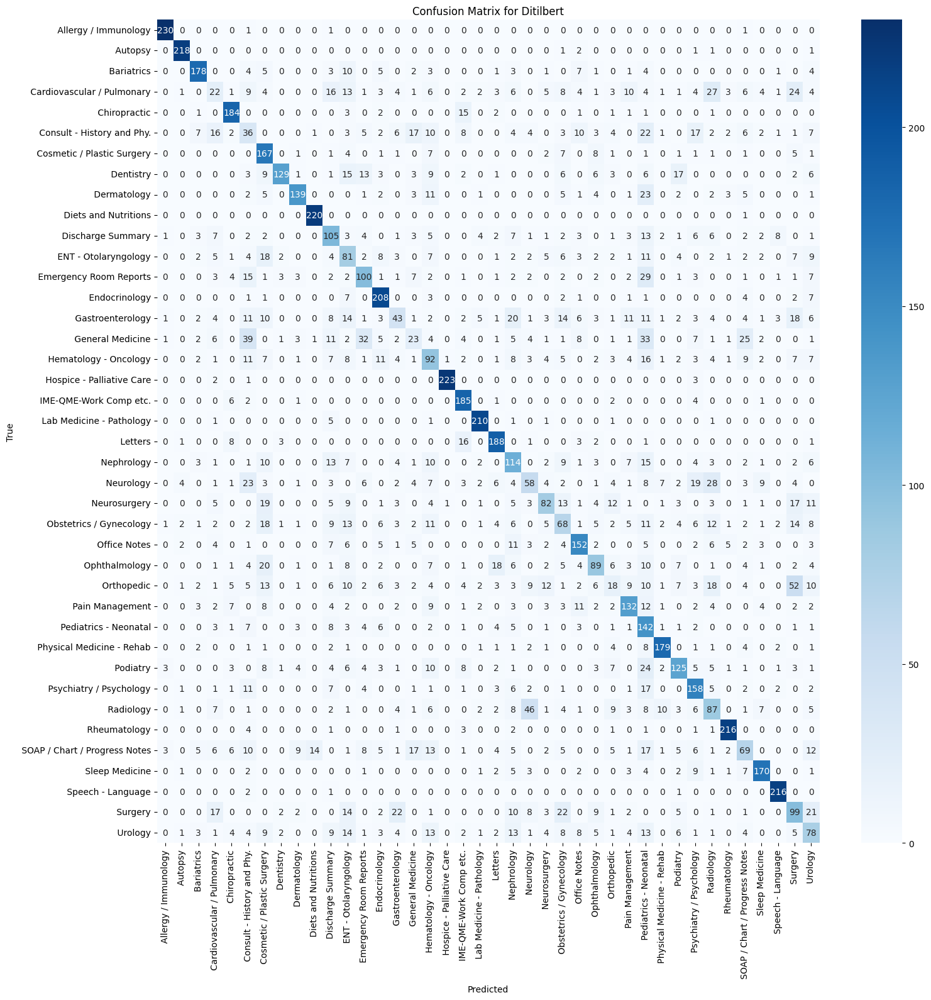

Epoch 5, Loss: 0.60
Validation Loss: 1.44
Validation loss did not improve for 1 epoch(s).
Validation Accuracy: 59.90%
                                precision    recall  f1-score   support

          Allergy / Immunology     0.9828    0.9828    0.9828       233
                       Autopsy     0.8911    0.9866    0.9364       224
                    Bariatrics     0.8650    0.7425    0.7991       233
    Cardiovascular / Pulmonary     0.2050    0.2010    0.2030       204
                  Chiropractic     0.8279    0.8396    0.8337       212
    Consult - History and Phy.     0.1554    0.1931    0.1722       202
    Cosmetic / Plastic Surgery     0.6419    0.6540    0.6479       211
                     Dentistry     0.8135    0.6681    0.7336       235
                   Dermatology     0.8146    0.6872    0.7455       211
          Diets and Nutritions     0.9241    0.9910    0.9563       221
             Discharge Summary     0.4701    0.5473    0.5057       201
          ENT - O

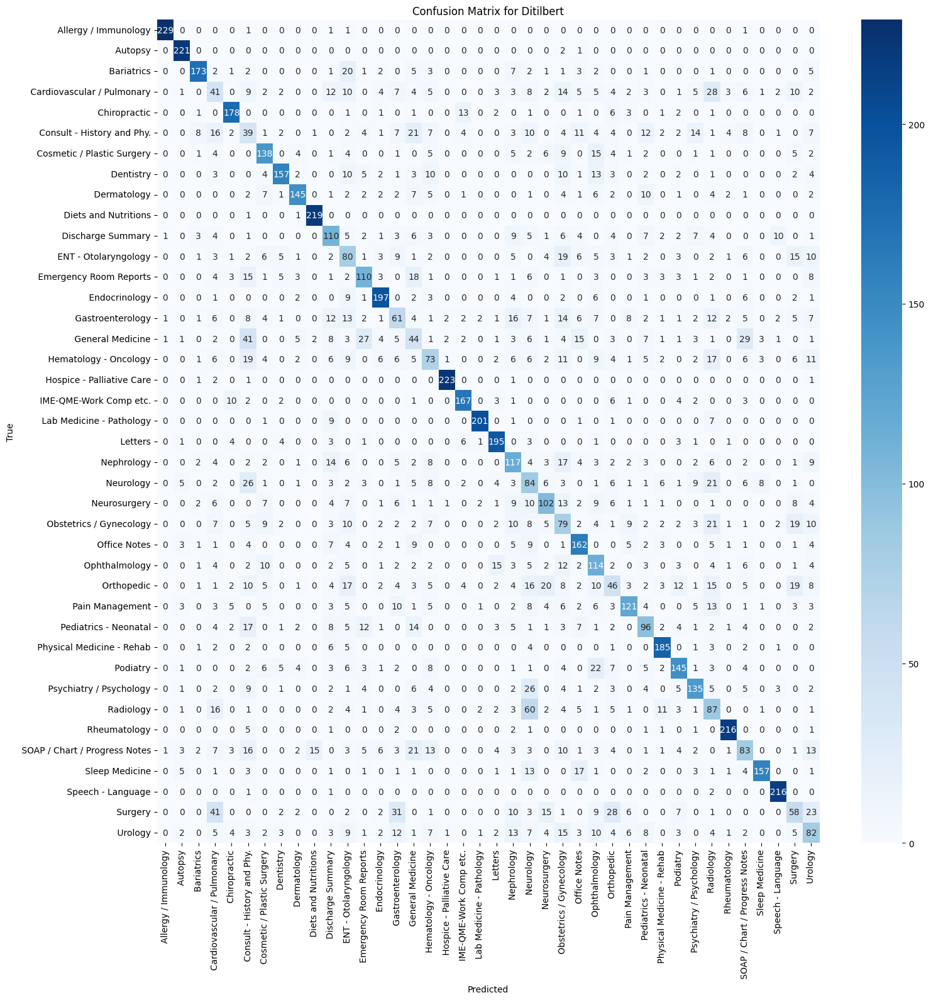

Epoch 6, Loss: 0.43
Validation Loss: 1.55
Validation loss did not improve for 2 epoch(s).
Validation Accuracy: 59.00%
                                precision    recall  f1-score   support

          Allergy / Immunology     0.9696    0.9571    0.9633       233
                       Autopsy     0.9812    0.9330    0.9565       224
                    Bariatrics     0.7581    0.8069    0.7817       233
    Cardiovascular / Pulmonary     0.1475    0.2647    0.1895       204
                  Chiropractic     0.8457    0.7500    0.7950       212
    Consult - History and Phy.     0.1689    0.1881    0.1780       202
    Cosmetic / Plastic Surgery     0.6891    0.6303    0.6584       211
                     Dentistry     0.8757    0.6596    0.7524       235
                   Dermatology     0.7736    0.7773    0.7754       211
          Diets and Nutritions     0.9304    0.9683    0.9490       221
             Discharge Summary     0.4789    0.5075    0.4928       201
          ENT - O

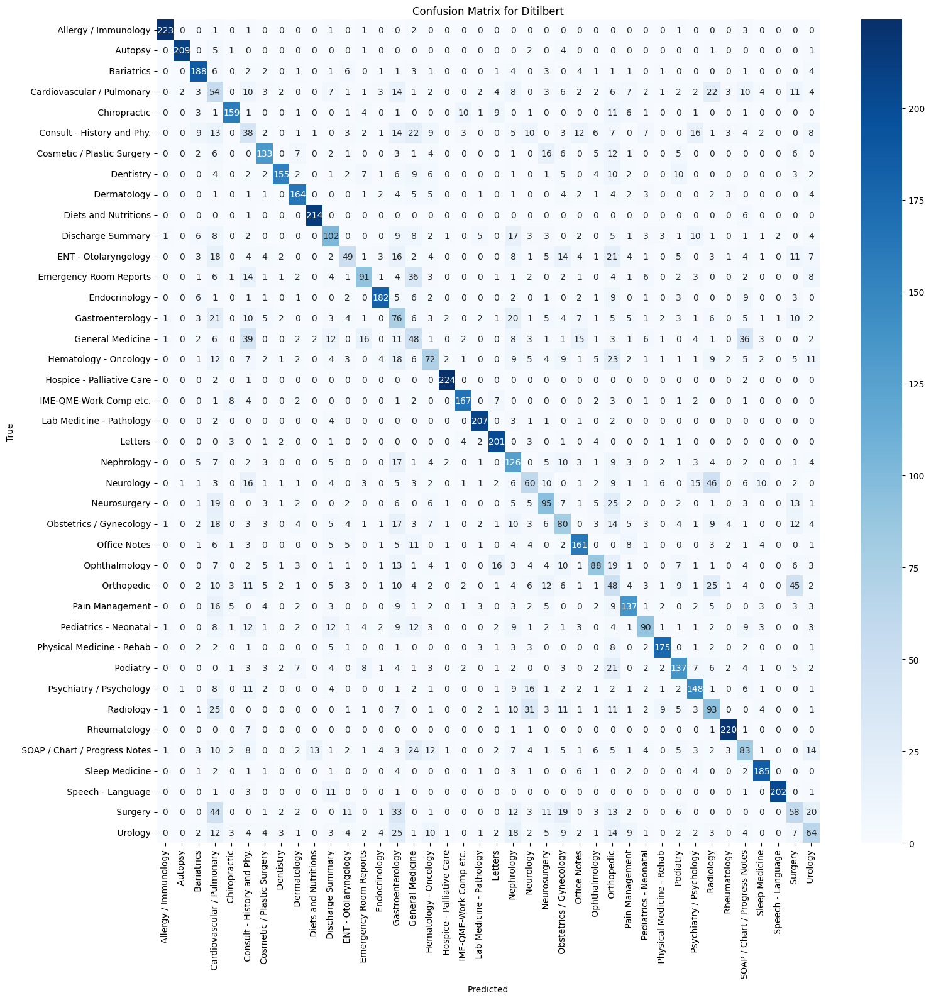

Epoch 7, Loss: 0.34
Validation Loss: 1.67
Validation loss did not improve for 3 epoch(s).
Early stopping triggered.
Validation Accuracy: 59.42%
                                precision    recall  f1-score   support

          Allergy / Immunology     0.9867    0.9571    0.9717       233
                       Autopsy     0.9404    0.9866    0.9630       224
                    Bariatrics     0.7463    0.8584    0.7984       233
    Cardiovascular / Pulmonary     0.1572    0.1225    0.1377       204
                  Chiropractic     0.7741    0.8726    0.8204       212
    Consult - History and Phy.     0.1314    0.0891    0.1062       202
    Cosmetic / Plastic Surgery     0.6591    0.6872    0.6729       211
                     Dentistry     0.8283    0.6979    0.7575       235
                   Dermatology     0.7707    0.7488    0.7596       211
          Diets and Nutritions     0.9167    0.9955    0.9544       221
             Discharge Summary     0.5353    0.4527    0.4906  

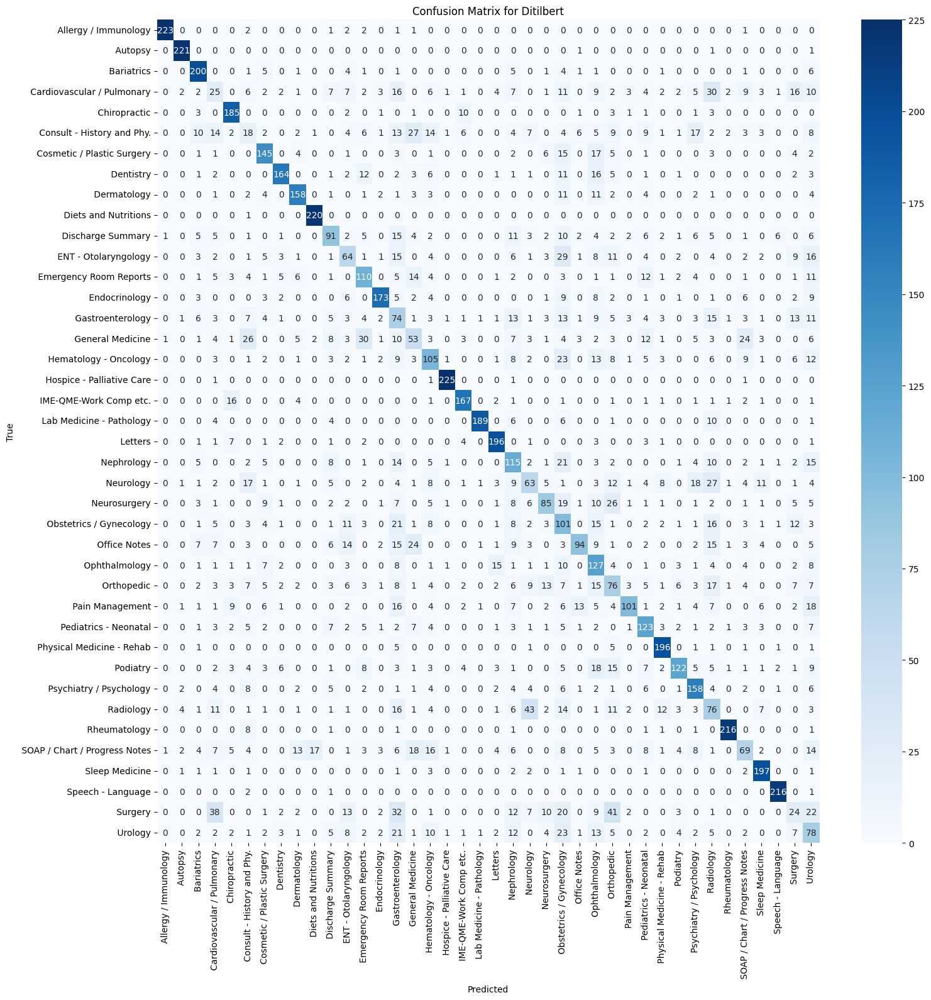

Early stopping triggered.
Training complete


In [57]:
# DISTILBERT Classification 25-Epochs and early stopping parameter setting with patience 3 

import pandas as pd
import re
import numpy as np
import torch
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, classification_report
from transformers import DistilBertTokenizer, DistilBertForSequenceClassification, AdamW
from imblearn.over_sampling import SMOTE
from torch.utils.data import DataLoader, TensorDataset
from sklearn.metrics import confusion_matrix

import warnings 
warnings.filterwarnings("ignore", category=FutureWarning)

# Load DistilBERT model and tokenizer for classification
model = DistilBertForSequenceClassification.from_pretrained('distilbert-base-uncased', num_labels=40)
tokenizer = DistilBertTokenizer.from_pretrained('distilbert-base-uncased')

# Function to preprocess text
def preprocess_text(text):
    text = str(text).lower()
    text = re.sub(r'\([^)]*\)', '', text)
    text = re.sub('"', '', text)
    text = re.sub(r"'s\b", "", text)
    text = re.sub("[^a-zA-Z]", " ", text)
    return text.strip()

# Load data
data = pd.read_csv('/kaggle/input/medicaltranscriptions/mtsamples.csv')
data.drop('Unnamed: 0', axis=1, inplace=True)

# Clean transcription
data['cleaned_transcription'] = data['transcription'].apply(preprocess_text)

# Tokenize and encode the texts
def encode_texts(texts):
    inputs = tokenizer(texts.tolist(), return_tensors='pt', padding=True, truncation=True, max_length=64)
    return inputs['input_ids'], inputs['attention_mask']

# Create embeddings for transcripts
input_ids, attention_masks = encode_texts(data.cleaned_transcription)

# Label encode our categorical target variable
le = LabelEncoder()
Y = le.fit_transform(data.medical_specialty.values)

# Applying SMOTE to balance classes
sm = SMOTE()
X_res, Y_res = sm.fit_resample(input_ids.numpy(), Y)

# Splitting data into train:test
X_train, X_val, Y_train, Y_val = train_test_split(X_res, Y_res, test_size=0.2, random_state=42)

print('\nTraining features shape: ', X_train.shape)
print('Validation features shape: ', X_val.shape)

# Convert to tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.long)  # Use long for indices
Y_train_tensor = torch.tensor(Y_train, dtype=torch.long)
X_val_tensor = torch.tensor(X_val, dtype=torch.long)
Y_val_tensor = torch.tensor(Y_val, dtype=torch.long)

train_dataset = TensorDataset(X_train_tensor, Y_train_tensor)
val_dataset = TensorDataset(X_val_tensor, Y_val_tensor)

train_dataloader = DataLoader(train_dataset, batch_size=16, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=16, shuffle=False)

# Training function with Early Stopping
def train_model_with_early_stopping(model, train_dataloader, val_dataloader, num_epochs=20, accumulation_steps=2, patience=3):
    optimizer = AdamW(model.parameters(), lr=5e-5)
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)

    best_val_loss = float('inf')  # Start with a very high value
    epochs_without_improvement = 0  # Counter for early stopping
    early_stop = False  # Flag to check if early stopping is triggered

    for epoch in range(num_epochs):
        if early_stop:
            print("Early stopping triggered.")
            break

        model.train()
        total_loss = 0

        # Training loop
        for batch in train_dataloader:
            optimizer.zero_grad()
            inputs, labels = batch
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model(input_ids=inputs, labels=labels)
            loss = outputs.loss
            total_loss += loss.item()
            loss.backward()
            optimizer.step()

        avg_loss = total_loss / len(train_dataloader)
        print(f"Epoch {epoch + 1}, Loss: {avg_loss:.2f}")

        # Validation
        model.eval()
        val_loss = 0.0
        val_preds, val_labels = [], []
        with torch.no_grad():
            for batch in val_dataloader:
                inputs, labels = batch
                inputs = inputs.to(device)
                labels = labels.to(device)
                outputs = model(input_ids=inputs, labels=labels)
                val_loss += outputs.loss.item()
                val_preds.append(outputs.logits.argmax(dim=1).cpu().numpy())
                val_labels.append(labels.cpu().numpy())

        avg_val_loss = val_loss / len(val_dataloader)
        print(f"Validation Loss: {avg_val_loss:.2f}")

        # Check for improvement in validation loss
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            epochs_without_improvement = 0  # Reset counter
            print("Validation loss improved. Saving model...")
            torch.save(model.state_dict(), 'best_model.pth')  # Save the best model
        else:
            epochs_without_improvement += 1
            print(f"Validation loss did not improve for {epochs_without_improvement} epoch(s).")

        # Early stopping condition
        if epochs_without_improvement >= patience:
            early_stop = True
            print("Early stopping triggered.")

        # Evaluation metrics after each epoch
        val_preds = np.concatenate(val_preds)
        val_labels = np.concatenate(val_labels)

        accuracy = accuracy_score(val_labels, val_preds)
        print(f"Validation Accuracy: {accuracy * 100:.2f}%")
        print(classification_report(val_labels, val_preds, target_names=le.classes_, digits=4, zero_division=0))

        # Confusion Matrix
        conf_matrix = confusion_matrix(val_labels, val_preds)

        # Plotting the confusion matrix as a heatmap
        plt.figure(figsize=(17, 17))
        sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=le.classes_, yticklabels=le.classes_)
        plt.title('Confusion Matrix for Ditilbert')
        plt.xlabel('Predicted')
        plt.ylabel('True')
        plt.xticks(rotation=90)
        plt.yticks(rotation=0)
        plt.show() 

    print("Training complete") 

# Train the model with early stopping 
train_model_with_early_stopping(model, train_dataloader, val_dataloader, num_epochs=25, patience=3)


Training features shape:  (35296, 64)
Validation features shape:  (8824, 64)
Epoch 1, Loss: 2.92
Validation Loss: 2.35
Validation loss improved. Saving model...
Validation Accuracy: 34.83%
                                precision    recall  f1-score   support

          Allergy / Immunology     0.8033    0.8412    0.8218       233
                       Autopsy     0.7444    0.4420    0.5546       224
                    Bariatrics     0.5872    0.2747    0.3743       233
    Cardiovascular / Pulmonary     0.3358    0.2206    0.2663       204
                  Chiropractic     0.2843    0.1368    0.1847       212
    Consult - History and Phy.     0.2636    0.1436    0.1859       202
    Cosmetic / Plastic Surgery     0.1779    0.5118    0.2641       211
                     Dentistry     0.5352    0.1617    0.2484       235
                   Dermatology     0.1443    0.0664    0.0909       211
          Diets and Nutritions     0.7993    0.9910    0.8848       221
             Disc

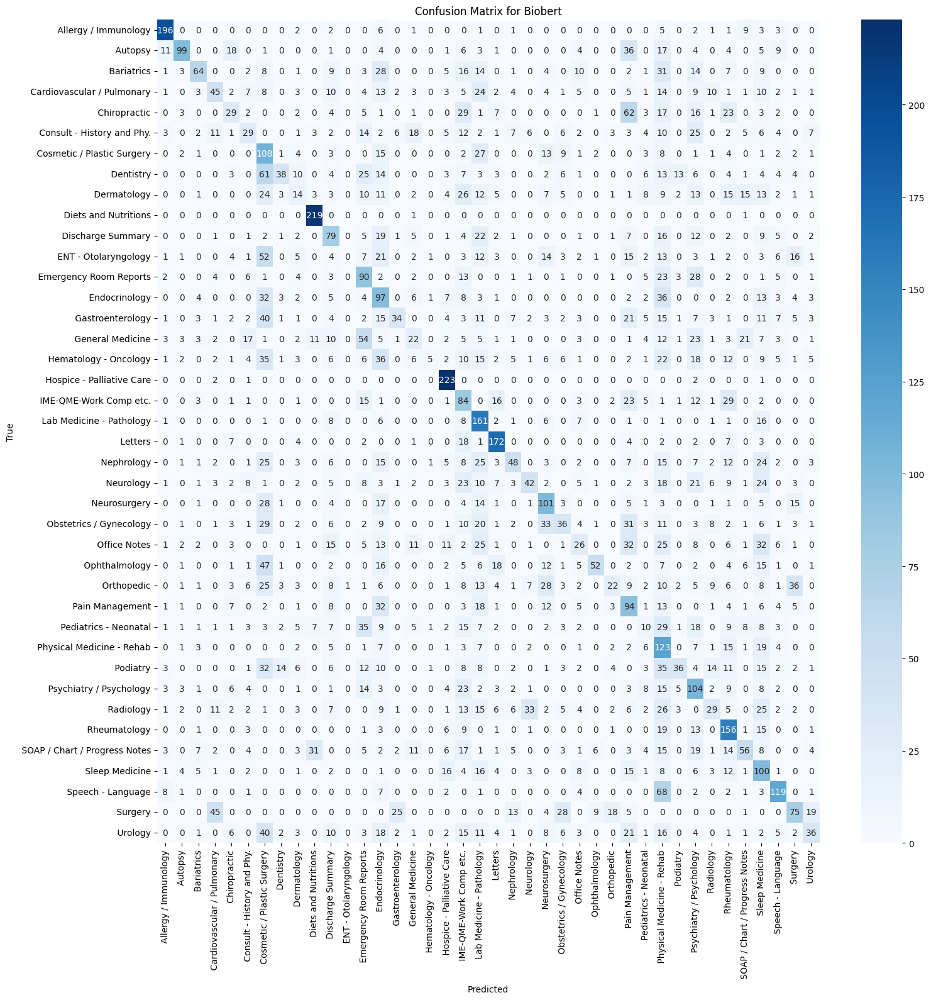

Epoch 2, Loss: 2.05
Validation Loss: 1.81
Validation loss improved. Saving model...
Validation Accuracy: 48.07%
                                precision    recall  f1-score   support

          Allergy / Immunology     0.8145    0.9614    0.8819       233
                       Autopsy     0.8063    0.7991    0.8027       224
                    Bariatrics     0.4897    0.8155    0.6119       233
    Cardiovascular / Pulmonary     0.1446    0.0588    0.0836       204
                  Chiropractic     0.3158    0.5377    0.3979       212
    Consult - History and Phy.     0.2387    0.2871    0.2607       202
    Cosmetic / Plastic Surgery     0.2875    0.4360    0.3465       211
                     Dentistry     0.6235    0.4298    0.5088       235
                   Dermatology     0.5276    0.4976    0.5122       211
          Diets and Nutritions     0.8696    0.9955    0.9283       221
             Discharge Summary     0.4751    0.4279    0.4503       201
          ENT - Otolary

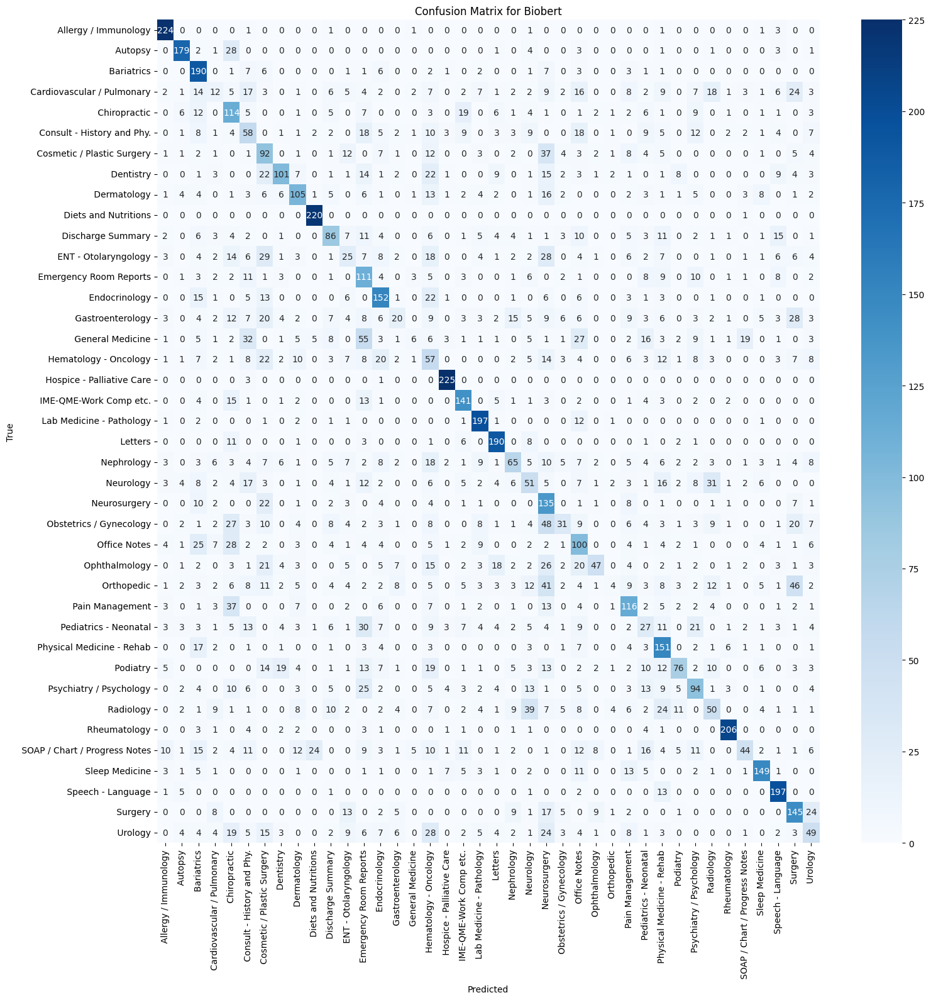

Epoch 3, Loss: 1.49
Validation Loss: 1.54
Validation loss improved. Saving model...
Validation Accuracy: 54.45%
                                precision    recall  f1-score   support

          Allergy / Immunology     0.9277    0.9356    0.9316       233
                       Autopsy     0.8377    0.9911    0.9080       224
                    Bariatrics     0.7586    0.8498    0.8016       233
    Cardiovascular / Pulmonary     0.2184    0.0931    0.1306       204
                  Chiropractic     0.4467    0.6321    0.5234       212
    Consult - History and Phy.     0.2568    0.1881    0.2171       202
    Cosmetic / Plastic Surgery     0.4301    0.5687    0.4898       211
                     Dentistry     0.6179    0.5574    0.5861       235
                   Dermatology     0.7500    0.4976    0.5983       211
          Diets and Nutritions     0.8958    0.9729    0.9328       221
             Discharge Summary     0.2866    0.6816    0.4035       201
          ENT - Otolary

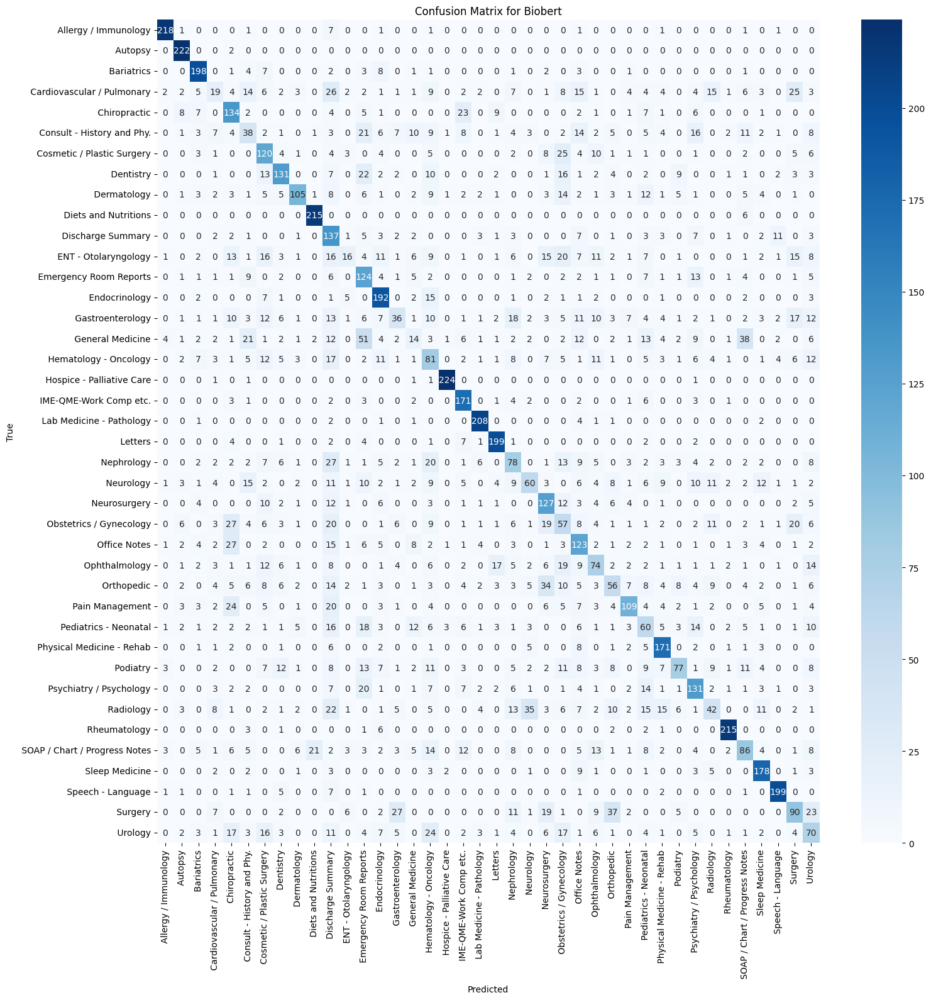

Epoch 4, Loss: 1.10
Validation Loss: 1.44
Validation loss improved. Saving model...
Validation Accuracy: 58.00%
                                precision    recall  f1-score   support

          Allergy / Immunology     0.9620    0.9785    0.9702       233
                       Autopsy     0.8840    0.9866    0.9325       224
                    Bariatrics     0.8485    0.8412    0.8448       233
    Cardiovascular / Pulmonary     0.2039    0.2059    0.2049       204
                  Chiropractic     0.5857    0.6934    0.6350       212
    Consult - History and Phy.     0.2279    0.3069    0.2616       202
    Cosmetic / Plastic Surgery     0.4535    0.7630    0.5689       211
                     Dentistry     0.6227    0.7234    0.6693       235
                   Dermatology     0.7528    0.6351    0.6889       211
          Diets and Nutritions     0.8826    0.9864    0.9316       221
             Discharge Summary     0.6490    0.4876    0.5568       201
          ENT - Otolary

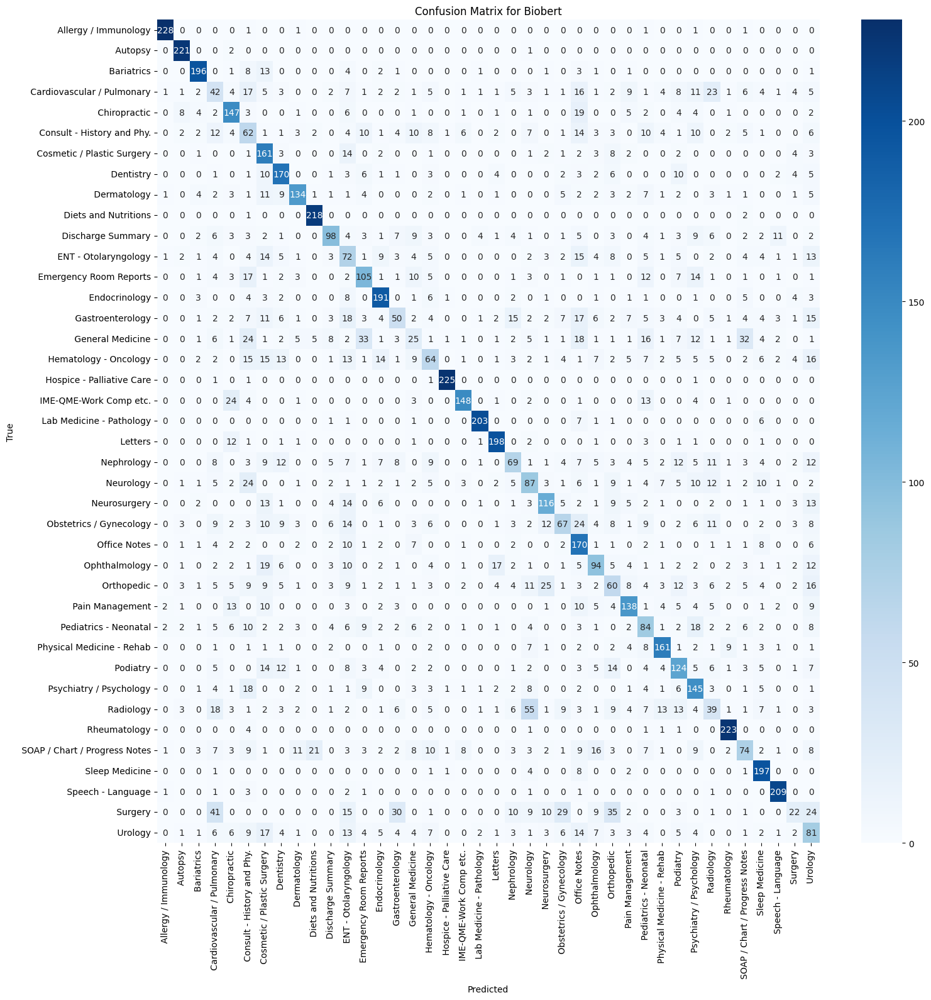

Epoch 5, Loss: 0.80
Validation Loss: 1.53
Validation loss did not improve for 1 epoch(s).
Validation Accuracy: 57.37%
                                precision    recall  f1-score   support

          Allergy / Immunology     0.9693    0.9485    0.9588       233
                       Autopsy     0.9633    0.9375    0.9502       224
                    Bariatrics     0.7545    0.8970    0.8196       233
    Cardiovascular / Pulmonary     0.1505    0.1373    0.1436       204
                  Chiropractic     0.5452    0.7689    0.6380       212
    Consult - History and Phy.     0.2304    0.2178    0.2239       202
    Cosmetic / Plastic Surgery     0.4543    0.7299    0.5600       211
                     Dentistry     0.7938    0.6553    0.7179       235
                   Dermatology     0.6192    0.7014    0.6578       211
          Diets and Nutritions     0.8893    0.9819    0.9333       221
             Discharge Summary     0.6149    0.5323    0.5707       201
          ENT - O

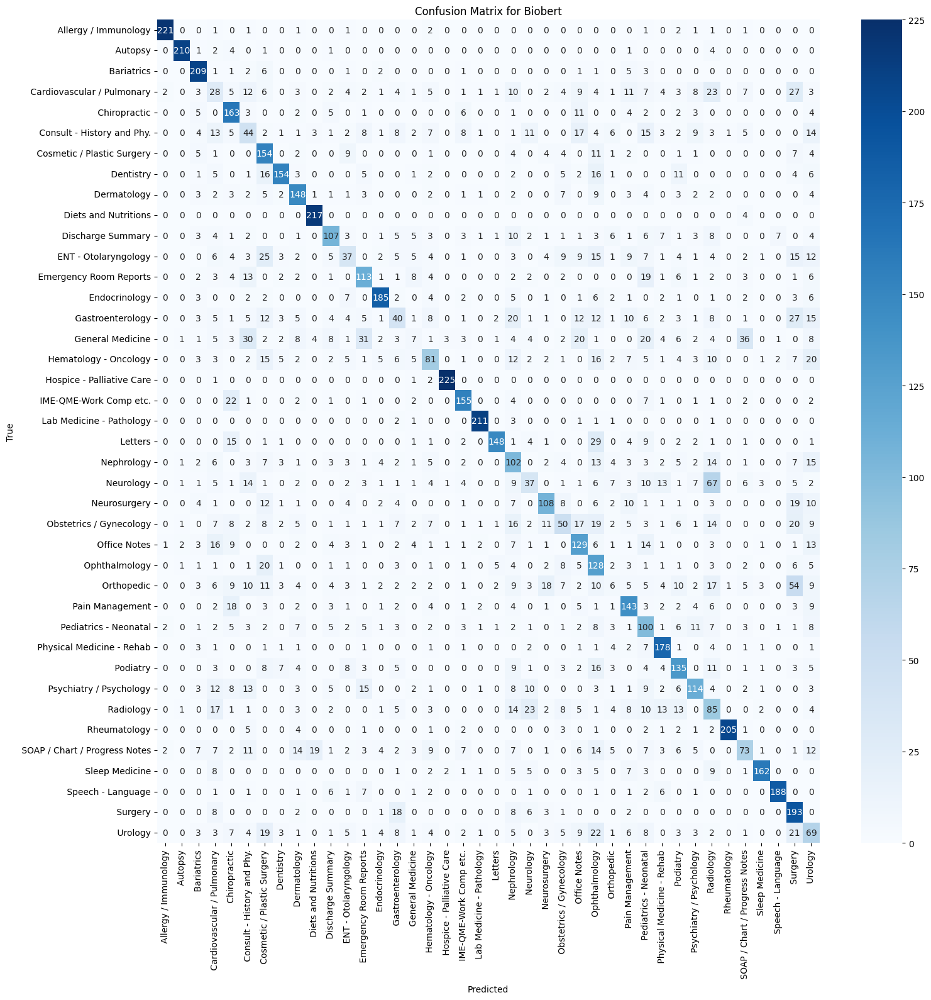

Epoch 6, Loss: 0.61
Validation Loss: 1.65
Validation loss did not improve for 2 epoch(s).
Validation Accuracy: 56.43%
                                precision    recall  f1-score   support

          Allergy / Immunology     0.9265    0.9742    0.9498       233
                       Autopsy     0.9722    0.9375    0.9545       224
                    Bariatrics     0.8016    0.8670    0.8330       233
    Cardiovascular / Pulmonary     0.2143    0.1912    0.2021       204
                  Chiropractic     0.6288    0.7830    0.6975       212
    Consult - History and Phy.     0.1061    0.1040    0.1050       202
    Cosmetic / Plastic Surgery     0.6642    0.4218    0.5159       211
                     Dentistry     0.6766    0.6766    0.6766       235
                   Dermatology     0.6757    0.7109    0.6928       211
          Diets and Nutritions     0.8782    0.9457    0.9107       221
             Discharge Summary     0.5131    0.4876    0.5000       201
          ENT - O

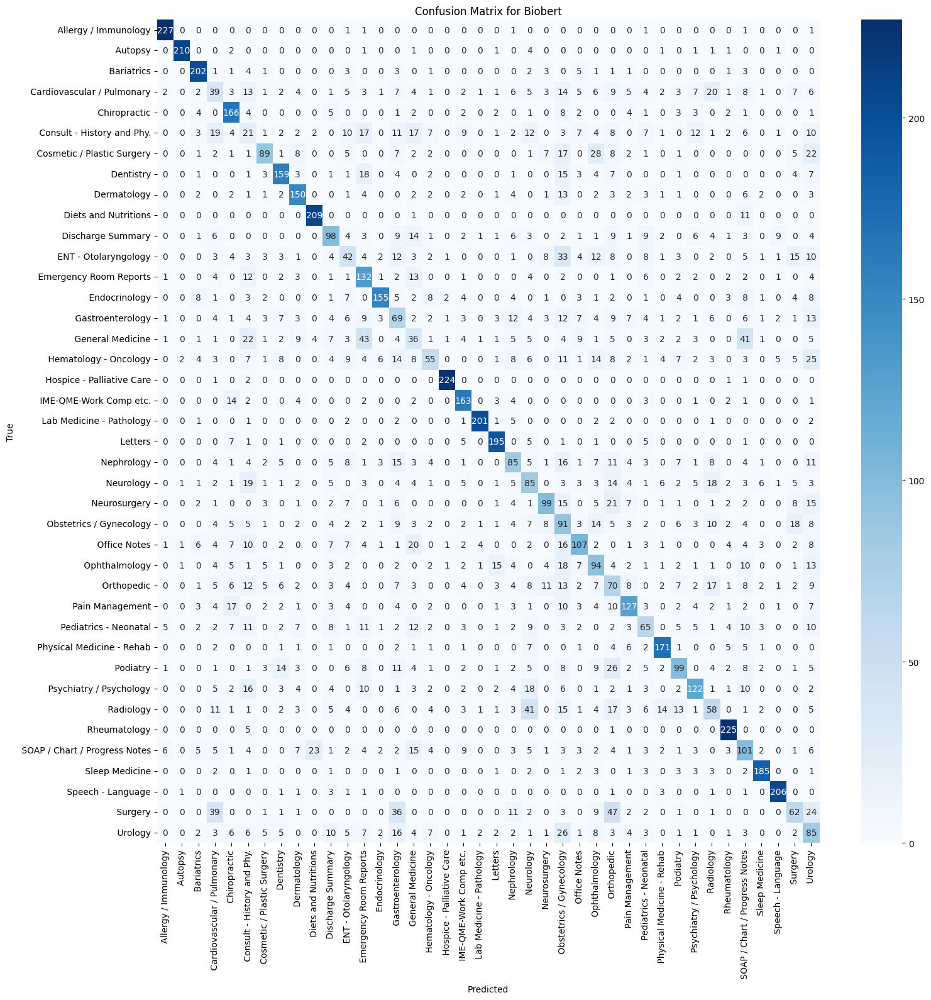

Epoch 7, Loss: 0.46
Validation Loss: 1.70
Validation loss did not improve for 3 epoch(s).
Early stopping triggered.
Validation Accuracy: 57.22%
                                precision    recall  f1-score   support

          Allergy / Immunology     0.9698    0.9657    0.9677       233
                       Autopsy     0.9806    0.9018    0.9395       224
                    Bariatrics     0.8804    0.7897    0.8326       233
    Cardiovascular / Pulmonary     0.1731    0.2647    0.2093       204
                  Chiropractic     0.6381    0.8066    0.7125       212
    Consult - History and Phy.     0.1322    0.1139    0.1223       202
    Cosmetic / Plastic Surgery     0.6062    0.5545    0.5792       211
                     Dentistry     0.8650    0.6000    0.7085       235
                   Dermatology     0.8057    0.6682    0.7306       211
          Diets and Nutritions     0.9174    0.9548    0.9357       221
             Discharge Summary     0.4260    0.5871    0.4937  

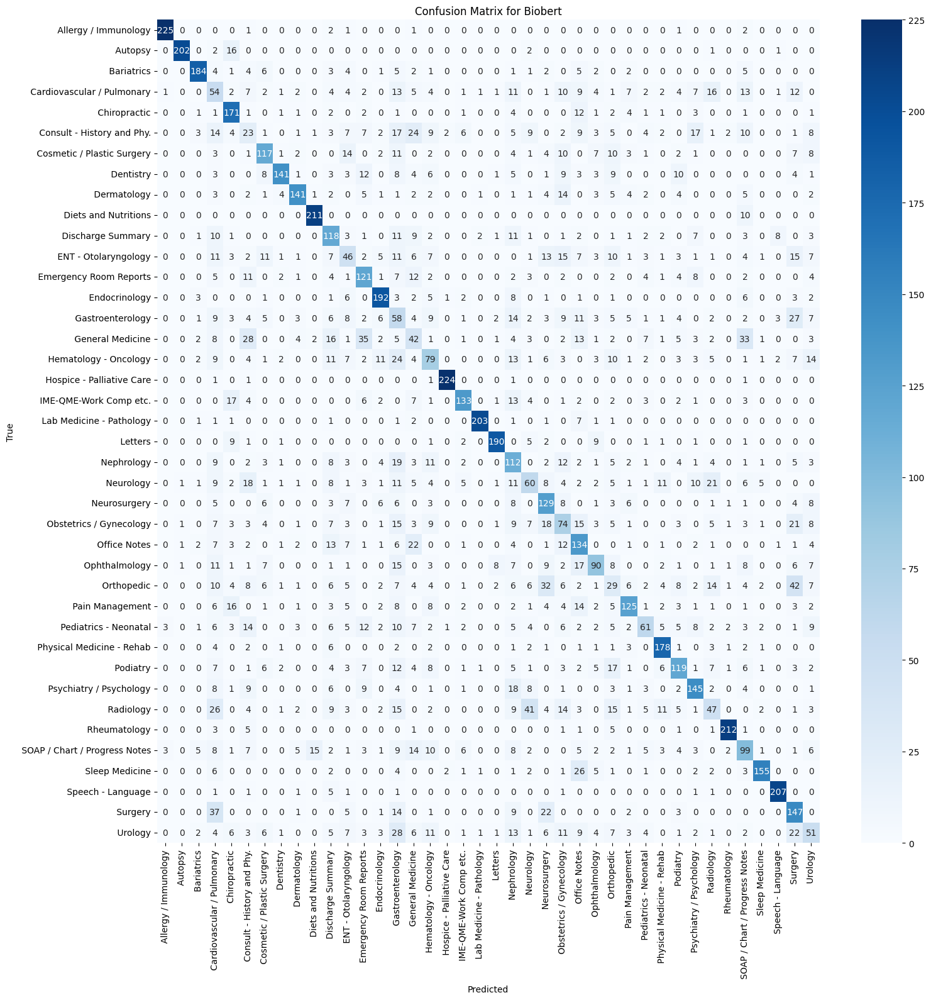

Early stopping triggered.
Training complete


In [59]:
# BIOBERT Classification 25-Epochs and early stopping parameter setting with patience 3

import pandas as pd
import re
import numpy as np 
import torch
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score, classification_report
from transformers import BertTokenizer, BertForSequenceClassification
from imblearn.over_sampling import SMOTE
from torch.utils.data import DataLoader, TensorDataset
from transformers import AdamW
from torch.optim import AdamW
from sklearn.metrics import confusion_matrix


import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

# Load BERT model and tokenizer for classification
tokenizer = BertTokenizer.from_pretrained('dmis-lab/biobert-v1.1')
model = BertForSequenceClassification.from_pretrained('dmis-lab/biobert-v1.1', num_labels=40)

# Function to preprocess text
def preprocess_text(text):
    text = str(text).lower()
    text = re.sub(r'\([^)]*\)', '', text)
    text = re.sub('"', '', text)
    text = re.sub(r"'s\b", "", text)
    text = re.sub("[^a-zA-Z]", " ", text)
    return text.strip()

# Load data
data = pd.read_csv('/kaggle/input/medicaltranscriptions/mtsamples.csv')
data.drop('Unnamed: 0', axis=1, inplace=True)

# Clean transcription
data['cleaned_transcription'] = data['transcription'].apply(preprocess_text)

# Tokenize and encode the texts
def encode_texts(texts):
    inputs = tokenizer(texts.tolist(), return_tensors='pt', padding=True, truncation=True, max_length=64)
    return inputs['input_ids'], inputs['attention_mask']

# Create embeddings for transcripts
input_ids, attention_masks = encode_texts(data.cleaned_transcription)

# Label encode our categorical target variable
le = LabelEncoder()
Y = le.fit_transform(data.medical_specialty.values)

# Applying SMOTE to balance classes
sm = SMOTE()
X_res, Y_res = sm.fit_resample(input_ids.numpy(), Y)

# Splitting data into train:test
X_train, X_val, Y_train, Y_val = train_test_split(X_res, Y_res, test_size=0.2, random_state=42)

print('\nTraining features shape: ', X_train.shape)
print('Validation features shape: ', X_val.shape)

# Convert to tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.long)  # Use long for indices
Y_train_tensor = torch.tensor(Y_train, dtype=torch.long)
X_val_tensor = torch.tensor(X_val, dtype=torch.long)
Y_val_tensor = torch.tensor(Y_val, dtype=torch.long)

train_dataset = TensorDataset(X_train_tensor, Y_train_tensor)
val_dataset = TensorDataset(X_val_tensor, Y_val_tensor)

train_dataloader = DataLoader(train_dataset, batch_size=16, shuffle=True)
val_dataloader = DataLoader(val_dataset, batch_size=16, shuffle=False)

# Training function with Early Stopping
def train_model_with_early_stopping(model, train_dataloader, val_dataloader, num_epochs=20, accumulation_steps=2, patience=3):
    optimizer = AdamW(model.parameters(), lr=5e-5)
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)

    best_val_loss = float('inf')  # Start with a very high value
    epochs_without_improvement = 0  # Counter for early stopping
    early_stop = False  # Flag to check if early stopping is triggered

    for epoch in range(num_epochs):
        if early_stop:
            print("Early stopping triggered.")
            break

        model.train()
        total_loss = 0

        # Training loop
        for batch in train_dataloader:
            optimizer.zero_grad()
            inputs, labels = batch
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model(input_ids=inputs, labels=labels)
            loss = outputs.loss
            total_loss += loss.item()
            loss.backward()
            optimizer.step()

        avg_loss = total_loss / len(train_dataloader)
        print(f"Epoch {epoch + 1}, Loss: {avg_loss:.2f}")

        # Validation
        model.eval()
        val_loss = 0.0
        val_preds, val_labels = [], []
        with torch.no_grad():
            for batch in val_dataloader:
                inputs, labels = batch
                inputs = inputs.to(device)
                labels = labels.to(device)
                outputs = model(input_ids=inputs, labels=labels)
                val_loss += outputs.loss.item()
                val_preds.append(outputs.logits.argmax(dim=1).cpu().numpy())
                val_labels.append(labels.cpu().numpy())

        avg_val_loss = val_loss / len(val_dataloader)
        print(f"Validation Loss: {avg_val_loss:.2f}")

        # Check for improvement in validation loss
        if avg_val_loss < best_val_loss:
            best_val_loss = avg_val_loss
            epochs_without_improvement = 0  # Reset counter
            print("Validation loss improved. Saving model...")
            torch.save(model.state_dict(), 'best_model.pth')  # Save the best model
        else:
            epochs_without_improvement += 1
            print(f"Validation loss did not improve for {epochs_without_improvement} epoch(s).")

        # Early stopping condition
        if epochs_without_improvement >= patience:
            early_stop = True
            print("Early stopping triggered.")

        # Evaluation metrics after each epoch
        val_preds = np.concatenate(val_preds)
        val_labels = np.concatenate(val_labels)

        accuracy = accuracy_score(val_labels, val_preds)
        print(f"Validation Accuracy: {accuracy * 100:.2f}%")
        print(classification_report(val_labels, val_preds, target_names=le.classes_, digits=4, zero_division=0))

        # Confusion Matrix
        conf_matrix = confusion_matrix(val_labels, val_preds)

        # Plotting the confusion matrix as a heatmap
        plt.figure(figsize=(17, 17))
        sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=le.classes_, yticklabels=le.classes_)
        plt.title('Confusion Matrix for Biobert')
        plt.xlabel('Predicted')
        plt.ylabel('True')
        plt.xticks(rotation=90)
        plt.yticks(rotation=0)
        plt.show() 

    print("Training complete") 

# Train the model with early stopping 
train_model_with_early_stopping(model, train_dataloader, val_dataloader, num_epochs=25, patience=3)

# Few shot learning

In [ ]:
from transformers import GPT2Tokenizer, GPT2LMHeadModel
import torch
from nltk.translate.bleu_score import sentence_bleu 
from rouge_score import rouge_scorer

# Load the GPT-2 model and tokenizer 
model_name = "gpt2"
tokenizer = GPT2Tokenizer.from_pretrained(model_name, padding_side='left')
tokenizer.pad_token = tokenizer.eos_token
model = GPT2LMHeadModel.from_pretrained(model_name)

# Define a few-shot prompt with multiple examples

few_shot_prompt = (
    'Question: A 23-year-old white female presents with complaint of allergies? '
    'Context: SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but does not require daily medication for this and does not think it is flaring up. MEDICATIONS: Her only medication currently is Ortho Tri-Cyclen and the Allegra. ALLERGIES: She has no known medicine allergies. OBJECTIVE: Vitals: Weight was 130 pounds and blood pressure 124/78. HEENT: Her throat was mildly erythematous without exudate. Nasal mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear. Neck: Supple without adenopathy. Lungs: Clear. ASSESSMENT: Allergic rhinitis. PLAN: She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription was written as well. ' 
    'Answer: The answer to the question given the context is allergic rhinitis. '
    'Question: What are the symptoms of laparoscopic gastric bypass? '
    'Context: PAST MEDICAL HISTORY: He has difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, and lifting objects off the floor. He exercises three times a week at home and does cardio. He has difficulty walking two blocks or five flights of stairs. Difficulty with snoring. He has muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling. He has gastroesophageal reflux disease. PAST SURGICAL HISTORY: Includes reconstructive surgery on his right hand 13 years ago. SOCIAL HISTORY: He is currently single. He has about ten drinks a year. He had smoked significantly up until several months ago. He now smokes less than three cigarettes a day. FAMILY HISTORY: Heart disease in both grandfathers, grandmother with stroke, and a grandmother with diabetes. Denies obesity and hypertension in other family members. CURRENT MEDICATIONS: None. ALLERGIES: He is allergic to Penicillin. '
    'Answer: The answer to the question given the context is difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, lifting objects off the floor, difficulty walking two blocks or five flights of stairs, difficulty with snoring, muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling, gastroesophageal reflux disease. '
)

# few_shot_prompt = """ 
# Question: A 23-year-old white female presents with complaint of allergies?
# Context: SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but does not require daily medication for this and does not think it is flaring up. MEDICATIONS: Her only medication currently is Ortho Tri-Cyclen and the Allegra. ALLERGIES: She has no known medicine allergies. OBJECTIVE: Vitals: Weight was 130 pounds and blood pressure 124/78. HEENT: Her throat was mildly erythematous without exudate. Nasal mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear. Neck: Supple without adenopathy. Lungs: Clear. ASSESSMENT: Allergic rhinitis. PLAN: She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription was written as well.
# Answer: The answer to the question given the context is allergic rhinitis.
                      
# Question: What are the symptoms of laparoscopic gastric bypass?
# Context: PAST MEDICAL HISTORY: He has difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, and lifting objects off the floor. He exercises three times a week at home and does cardio. He has difficulty walking two blocks or five flights of stairs. Difficulty with snoring. He has muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling. He has gastroesophageal reflux disease. PAST SURGICAL HISTORY: Includes reconstructive surgery on his right hand 13 years ago. SOCIAL HISTORY: He is currently single. He has about ten drinks a year. He had smoked significantly up until several months ago. He now smokes less than three cigarettes a day. FAMILY HISTORY: Heart disease in both grandfathers, grandmother with stroke, and a grandmother with diabetes. Denies obesity and hypertension in other family members. CURRENT MEDICATIONS: None. ALLERGIES: He is allergic to Penicillin
# Answer: The answer to the question given the context is difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, lifting objects off the floor, difficulty walking two blocks or five flights of stairs, difficulty with snoring, muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling, gastroesophageal reflux disease.
# """ (Working)

# few_shot_prompt = """
# Question: A 23-year-old white female presents with complaint of allergies?
# Context: SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but does not require daily medication for this and does not think it is flaring up. MEDICATIONS: Her only medication currently is Ortho Tri-Cyclen and the Allegra. ALLERGIES: She has no known medicine allergies. OBJECTIVE: Vitals: Weight was 130 pounds and blood pressure 124/78. HEENT: Her throat was mildly erythematous without exudate. Nasal mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear. Neck: Supple without adenopathy. Lungs: Clear. ASSESSMENT: Allergic rhinitis. PLAN: She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription was written as well.
# Answer: The answer to the question given the context is .

# Question: What are the symptoms of laparoscopic gastric bypass?
# Context: PAST MEDICAL HISTORY: He has difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, and lifting objects off the floor. He exercises three times a week at home and does cardio. He has difficulty walking two blocks or five flights of stairs. Difficulty with snoring. He has muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling. He has gastroesophageal reflux disease. PAST SURGICAL HISTORY: Includes reconstructive surgery on his right hand 13 years ago. SOCIAL HISTORY: He is currently single. He has about ten drinks a year. He had smoked significantly up until several months ago. He now smokes less than three cigarettes a day. FAMILY HISTORY: Heart disease in both grandfathers, grandmother with stroke, and a grandmother with diabetes. Denies obesity and hypertension in other family members. CURRENT MEDICATIONS: None. ALLERGIES: He is allergic to Penicillin
# Answer: The answer to the given question given the context is .
# """ (Working)

# Function to generate text based on a prompt
def generate_text(prompt, max_length=675, temperature=0.7):
    input_ids = tokenizer.encode(prompt, return_tensors="pt")
    output_sequences = model.generate(
        input_ids=input_ids,
        max_length=max_length,
        temperature=temperature,
        top_p=0.9,
        num_return_sequences=1,
        pad_token_id=tokenizer.eos_token_id
    )
    return tokenizer.decode(output_sequences[0], skip_special_tokens=True)

# Generate text for few-shot learning
generated_text_few_shot = generate_text(few_shot_prompt)
print("Few-Shot Learning Output:")
print(generated_text_few_shot)

# Function to calculate perplexity based on a given prompt and the generated text 
def calculate_perplexity(text):
    input_ids = tokenizer.encode(text, return_tensors='pt')
    with torch.no_grad():
        outputs = model(input_ids, labels=input_ids)
        loss = outputs.loss
    perplexity = torch.exp(loss)
    return perplexity.item()

# Calculate perplexity of the generated text
perplexity = calculate_perplexity(generated_text_few_shot)

# Print the results
print(f'Perplexity: {perplexity}')

# Function to calculate the BLEU score 
def calculate_bleu(reference, candidate):
    reference = [reference.split()]  # Tokenize the reference text
    candidate = candidate.split()    # Tokenize the candidate text (generated text)
    score = sentence_bleu(reference, candidate)  # Calculate the BLEU score
    return score

# Define the reference text (expected answer)
reference_text = "The answer to the question given the context is allergic rhinitis."

# Calculate the BLEU score
bleu_score = calculate_bleu(reference_text, generated_text_few_shot)

# Print the generated text and the BLEU scores
print(f'BLEU Score: {bleu_score}')

# Function to calculate ROUGE scores
def calculate_rouge(reference, candidate):
    scorer = rouge_scorer.RougeScorer(['rouge1', 'rouge2', 'rougeL'], use_stemmer=True)
    scores = scorer.score(reference, candidate)
    return scores

# Calculate the ROUGE scores
rouge_scores = calculate_rouge(reference_text, generated_text_few_shot)

# Print the ROUGE scores
print(f'ROUGE Scores: {rouge_scores}')

# Function to calculate distinct-n for diversity
def calculate_diversity(text, n=1):
    words = text.split()
    n_grams = [tuple(words[i:i+n]) for i in range(len(words)-n+1)]
    unique_n_grams = set(n_grams)
    diversity_score = len(unique_n_grams) / len(n_grams) if n_grams else 0
    return diversity_score

# Calculate diversity (distinct-1 and distinct-2)
distinct_1 = calculate_diversity(generated_text_few_shot, n=1)
distinct_2 = calculate_diversity(generated_text_few_shot, n=2)

# Print the diversity scores
print(f'Distinct-1 Score (Unigrams): {distinct_1}')
print(f'Distinct-2 Score (Bigrams): {distinct_2}')

# Human evaluation criteria
print("\nPlease evaluate the generated text based on the following criteria:")
print("1. Relevance (1-5): How relevant is the generated answer to the context and question?")
print("2. Coherence (1-5): How logically consistent and easy to follow is the generated answer?")
print("3. Fluency (1-5): How natural and fluent is the language used in the generated answer?")
print("4. Informativeness (1-5): How much useful information does the generated answer provide?")

# Collecting human evaluation scores
relevance = int(input("Relevance (1-5): "))
coherence = int(input("Coherence (1-5): "))
fluency = int(input("Fluency (1-5): "))
informativeness = int(input("Informativeness (1-5): "))

# Displaying the collected scores
print("\nHuman Evaluation Scores:")
print(f"Relevance: {relevance}")
print(f"Coherence: {coherence}")
print(f"Fluency: {fluency}")
print(f"Informativeness: {informativeness}")

# Optional: Calculate the average score for a general assessment
average_score = (relevance + coherence + fluency + informativeness) / 4
print(f"\nAverage Score: {average_score:.2f}")

In [ ]:
#GPT-2 Q&A
from transformers import GPT2Tokenizer, GPT2LMHeadModel

model_name = "gpt2"
tokenizer = GPT2Tokenizer.from_pretrained(model_name)
model = GPT2LMHeadModel.from_pretrained(model_name)

# Few-shot learning example with medical transcription data
few_shot_examples = [
    {
        "question": "A 23-year-old white female presents with complaint of allergies?",
        "context": "SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but does not require daily medication for this and does not think it is flaring up.,MEDICATIONS:, Her only medication currently is Ortho Tri-Cyclen and the Allegra.,ALLERGIES: , She has no known medicine allergies.,OBJECTIVE:, Vitals: Weight was 130 pounds and blood pressure 124/78., HEENT: Her throat was mildly erythematous without exudate. Nasal mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear.,Neck: Supple without adenopathy.,Lungs: Clear.,ASSESSMENT:, Allergic rhinitis.,PLAN:,1. She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper.,2. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription was written as well.",
        "answer": "The answer to the question given the context is allergic rhinitis."
    },
    {
        "question": "What are the symptoms of laparoscopic gastric bypass?",
        "context": "PAST MEDICAL HISTORY: He has difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, and lifting objects off the floor. He exercises three times a week at home and does cardio. He has difficulty walking two blocks or five flights of stairs. Difficulty with snoring. He has muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling. He has gastroesophageal reflux disease.,PAST SURGICAL HISTORY:, Includes reconstructive surgery on his right hand 13 years ago.,SOCIAL HISTORY:, He is currently single. He has about ten drinks a year. He had smoked significantly up until several months ago. He now smokes less than three cigarettes a day.,FAMILY HISTORY:, Heart disease in both grandfathers, grandmother with stroke, and a grandmother with diabetes. Denies obesity and hypertension in other family members.,CURRENT MEDICATIONS:,None.,ALLERGIES:, He is allergic to Penicillin.,MISCELLANEOUS/EATING HISTORY:, He has been going to support groups for seven months with Lynn Holmberg in Greenwich and he is from Eastchester, New York and he feels that we are the appropriate program. He had a poor experience with the Greenwich program. Eating history, he is not an emotional eater. Does not like sweets. He likes big portions and carbohydrates. He likes chicken and not steak. He currently weighs 312 pounds. Ideal body weight would be 170 pounds. He is 142 pounds overweight. If he lost 60% of his excess body weight that would be 84 pounds and he should weigh about 228.,REVIEW OF SYSTEMS:, Negative for head, neck, heart, lungs, GI, GU, orthopedic, and skin. Specifically denies chest pain, heart attack, coronary artery disease, congestive heart failure, arrhythmia, atrial fibrillation, pacemaker, high cholesterol, pulmonary embolism, high blood pressure, CVA, venous insufficiency, thrombophlebitis, asthma, shortness of breath, COPD, emphysema, sleep apnea, diabetes, leg and foot swelling, osteoarthritis, rheumatoid arthritis, hiatal hernia, peptic ulcer disease, gallstones, infected gallbladder, pancreatitis, fatty liver, hepatitis, hemorrhoids, rectal bleeding, polyps, incontinence of stool, urinary stress incontinence, or cancer. Denies cellulitis, pseudotumor cerebri, meningitis, or encephalitis.,PHYSICAL EXAMINATION:, He is alert and oriented x 3. Cranial nerves II-XII are intact. Afebrile. Vital Signs are stable.",
        "answer": "The answer to the question given the context is difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, lifting objects off the floor, difficulty walking two blocks or five flights of stairs, difficulty with snoring, muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling, gastroesophageal reflux disease."
    },
    {
        #"question": "What are the details and considerations for a laparoscopic antecolic antegastric Roux-en-Y gastric bypass with EEA anastomosis in a 30-year-old female patient with morbid obesity who has struggled with weight loss despite trying various diets?",
        #"context": "PREOPERATIVE DIAGNOSIS: , Morbid obesity.,POSTOPERATIVE DIAGNOSIS: ,Morbid obesity.,PROCEDURE: , Laparoscopic antecolic antegastric Roux-en-Y gastric bypass with EEA anastomosis.,ANESTHESIA: , General with endotracheal intubation.,INDICATION FOR PROCEDURE: , This is a 30-year-old female, who has been overweight for many years. She has tried many different diets, but is unsuccessful. She has been to our Bariatric Surgery Seminar, received some handouts, and signed the consent. The risks and benefits of the procedure have been explained to the patient.,PROCEDURE IN DETAIL: ,The patient was taken to the operating room and placed supine on the operating room table. All pressure points were carefully padded. She was given general anesthesia with endotracheal intubation. SCD stockings were placed on both legs. Foley catheter was placed for bladder decompression. The abdomen was then prepped and draped in standard sterile surgical fashion. Marcaine was then injected through umbilicus. A small incision was made. A Veress needle was introduced into the abdomen. CO2 insufflation was done to a maximum pressure of 15 mmHg. A 12-mm VersaStep port was placed through the umbilicus. I then placed a 5-mm port just anterior to the midaxillary line and just subcostal on the right side. I placed another 5-mm port in the midclavicular line just subcostal on the right side, a few centimeters below and medial to that, I placed a 12-mm VersaStep port. On the left side, just anterior to the midaxillary line and just subcostal, I placed a 5-mm port. A few centimeters below and medial to that, I placed a 15-mm port. I began by lifting up the omentum and identifying the transverse colon and lifting that up and thereby identifying my ligament of Treitz. I ran the small bowel down approximately 40 cm and divided the small bowel with a white load GIA stapler. I then divided the mesentery all the way down to the base of the mesentery with a LigaSure device. I then ran the distal bowel down, approximately 100 cm, and at 100 cm, I made a hole at the antimesenteric portion of the Roux limb and a hole in the antimesenteric portion of the duodenogastric limb, and I passed a 45 white load stapler and fired a stapler creating a side-to-side anastomosis. I reapproximated the edges of the defect. I lifted it up and stapled across it with another white load stapler. I then closed the mesenteric defect with interrupted Surgidac sutures. I divided the omentum all the way down to the colon in order to create a passageway for my small bowel to go antecolic. I then put the patient in reverse Trendelenburg. I placed a liver retractor, identified, and dissected the angle of His. I then dissected on the lesser curve, approximately 2.5 cm below the gastroesophageal junction, and got into a lesser space. I fired transversely across the stomach with a 45 blue load stapler. I then used two fires of the 60 blue load with SeamGuard to go up into my angle of His, thereby creating my gastric pouch. I then made a hole at the base of the gastric pouch and had Anesthesia remove the bougie and place the OG tube connected to the anvil. I pulled the anvil into place, and I then opened up my 15-mm port site and passed my EEA stapler. I passed that in the end of my Roux limb and had the spike come out antimesenteric. I joined the spike with the anvil and fired a stapler creating an end-to-side anastomosis, then divided across the redundant portion of my Roux limb with a white load GI stapler, and removed it with an Endocatch bag. I put some additional 2-0 Vicryl sutures in the anastomosis for further security. I then placed a bowel clamp across the bowel. I went above and passed an EGD scope into the mouth down to the esophagus and into the gastric pouch. I distended gastric pouch with air. There was no air leak seen. I could pass the scope easily through the anastomosis. There was no bleeding seen through the scope. We closed the 15-mm port site with interrupted 0 Vicryl suture utilizing Carter-Thomason. I copiously irrigated out that incision with about 2 L of saline. I then closed the skin of all incisions with running Monocryl. Sponge, instrument, and needle counts were correct at the end of the case. The patient tolerated the procedure well without any complications.",
        #"answer": "The answer to the question given the context is details of the laparoscopic antecolic antegastric Roux-en-Y gastric bypass procedure with EEA anastomosis, including the anesthesia used, the preoperative and postoperative diagnoses, the surgical steps performed, and the patient's history and considerations for the surgery."
    }
]


# Function to generate text
def generate_text(prompt, max_length=191, temperature=0.9):
    input_ids = tokenizer.encode(prompt, return_tensors="pt")
    output_sequences = model.generate(
        input_ids=input_ids,
        max_length=max_length,
        temperature=temperature,
        top_p=0.9,
        num_return_sequences=1,
        pad_token_id=tokenizer.eos_token_id
    )
    return tokenizer.decode(output_sequences[0], skip_special_tokens=True)

# Define a prompt based on the few-shot examples
prompt = "Question: What are the symptoms of laparoscopic gastric bypass?\nContext: PAST MEDICAL HISTORY: He has difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, and lifting objects off the floor. He exercises three times a week at home and does cardio. He has difficulty walking two blocks or five flights of stairs. Difficulty with snoring. He has muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling. He has gastroesophageal reflux disease.\nAnswer:"

# Generate text
generated_text = generate_text(prompt)

# Print the generated text
print(generated_text)

In [ ]:
#Gpt2-medium text generation
from transformers import GPT2Tokenizer, GPT2LMHeadModel
import torch
from nltk.translate.bleu_score import sentence_bleu 
from rouge_score import rouge_scorer

# Load the GPT-2 model and tokenizer 
model_name = "gpt2-medium"
tokenizer = GPT2Tokenizer.from_pretrained(model_name, padding_side='left')
tokenizer.pad_token = tokenizer.eos_token
model = GPT2LMHeadModel.from_pretrained(model_name)

# Define a few-shot prompt with multiple examples

few_shot_prompt = (
    'Question: A 23-year-old white female presents with complaint of allergies? '
    'Context: SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but does not require daily medication for this and does not think it is flaring up. MEDICATIONS: Her only medication currently is Ortho Tri-Cyclen and the Allegra. ALLERGIES: She has no known medicine allergies. OBJECTIVE: Vitals: Weight was 130 pounds and blood pressure 124/78. HEENT: Her throat was mildly erythematous without exudate. Nasal mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear. Neck: Supple without adenopathy. Lungs: Clear. ASSESSMENT: Allergic rhinitis. PLAN: She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription was written as well. ' 
    'Answer: The answer to the question given the context is allergic rhinitis. '
    'Question: What are the symptoms of laparoscopic gastric bypass? '
    'Context: PAST MEDICAL HISTORY: He has difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, and lifting objects off the floor. He exercises three times a week at home and does cardio. He has difficulty walking two blocks or five flights of stairs. Difficulty with snoring. He has muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling. He has gastroesophageal reflux disease. PAST SURGICAL HISTORY: Includes reconstructive surgery on his right hand 13 years ago. SOCIAL HISTORY: He is currently single. He has about ten drinks a year. He had smoked significantly up until several months ago. He now smokes less than three cigarettes a day. FAMILY HISTORY: Heart disease in both grandfathers, grandmother with stroke, and a grandmother with diabetes. Denies obesity and hypertension in other family members. CURRENT MEDICATIONS: None. ALLERGIES: He is allergic to Penicillin. '
    'Answer: The answer to the question given the context is difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, lifting objects off the floor, difficulty walking two blocks or five flights of stairs, difficulty with snoring, muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling, gastroesophageal reflux disease. '
)

# few_shot_prompt = """ 
# Question: A 23-year-old white female presents with complaint of allergies?
# Context: SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but does not require daily medication for this and does not think it is flaring up. MEDICATIONS: Her only medication currently is Ortho Tri-Cyclen and the Allegra. ALLERGIES: She has no known medicine allergies. OBJECTIVE: Vitals: Weight was 130 pounds and blood pressure 124/78. HEENT: Her throat was mildly erythematous without exudate. Nasal mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear. Neck: Supple without adenopathy. Lungs: Clear. ASSESSMENT: Allergic rhinitis. PLAN: She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription was written as well.
# Answer: The answer to the question given the context is allergic rhinitis.
                      
# Question: What are the symptoms of laparoscopic gastric bypass?
# Context: PAST MEDICAL HISTORY: He has difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, and lifting objects off the floor. He exercises three times a week at home and does cardio. He has difficulty walking two blocks or five flights of stairs. Difficulty with snoring. He has muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling. He has gastroesophageal reflux disease. PAST SURGICAL HISTORY: Includes reconstructive surgery on his right hand 13 years ago. SOCIAL HISTORY: He is currently single. He has about ten drinks a year. He had smoked significantly up until several months ago. He now smokes less than three cigarettes a day. FAMILY HISTORY: Heart disease in both grandfathers, grandmother with stroke, and a grandmother with diabetes. Denies obesity and hypertension in other family members. CURRENT MEDICATIONS: None. ALLERGIES: He is allergic to Penicillin
# Answer: The answer to the question given the context is difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, lifting objects off the floor, difficulty walking two blocks or five flights of stairs, difficulty with snoring, muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling, gastroesophageal reflux disease.
# """ (Working)

# few_shot_prompt = """
# Question: A 23-year-old white female presents with complaint of allergies?
# Context: SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but does not require daily medication for this and does not think it is flaring up. MEDICATIONS: Her only medication currently is Ortho Tri-Cyclen and the Allegra. ALLERGIES: She has no known medicine allergies. OBJECTIVE: Vitals: Weight was 130 pounds and blood pressure 124/78. HEENT: Her throat was mildly erythematous without exudate. Nasal mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear. Neck: Supple without adenopathy. Lungs: Clear. ASSESSMENT: Allergic rhinitis. PLAN: She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription was written as well.
# Answer: The answer to the question given the context is .

# Question: What are the symptoms of laparoscopic gastric bypass?
# Context: PAST MEDICAL HISTORY: He has difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, and lifting objects off the floor. He exercises three times a week at home and does cardio. He has difficulty walking two blocks or five flights of stairs. Difficulty with snoring. He has muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling. He has gastroesophageal reflux disease. PAST SURGICAL HISTORY: Includes reconstructive surgery on his right hand 13 years ago. SOCIAL HISTORY: He is currently single. He has about ten drinks a year. He had smoked significantly up until several months ago. He now smokes less than three cigarettes a day. FAMILY HISTORY: Heart disease in both grandfathers, grandmother with stroke, and a grandmother with diabetes. Denies obesity and hypertension in other family members. CURRENT MEDICATIONS: None. ALLERGIES: He is allergic to Penicillin
# Answer: The answer to the given question given the context is .
# """ (Working)

# Function to generate text based on a prompt
def generate_text(prompt, max_length=675, temperature=0.7):
    input_ids = tokenizer.encode(prompt, return_tensors="pt")
    output_sequences = model.generate(
        input_ids=input_ids,
        max_length=max_length,
        temperature=temperature,
        top_p=0.9,
        num_return_sequences=1,
        pad_token_id=tokenizer.eos_token_id
    )
    return tokenizer.decode(output_sequences[0], skip_special_tokens=True)

# Generate text for few-shot learning
generated_text_few_shot = generate_text(few_shot_prompt)
print("Few-Shot Learning Output:")
print(generated_text_few_shot)

# Function to calculate perplexity based on a given prompt and the generated text 
def calculate_perplexity(text):
    input_ids = tokenizer.encode(text, return_tensors='pt')
    with torch.no_grad():
        outputs = model(input_ids, labels=input_ids)
        loss = outputs.loss
    perplexity = torch.exp(loss)
    return perplexity.item()

# Calculate perplexity of the generated text
perplexity = calculate_perplexity(generated_text_few_shot)

# Print the results
print(f'Perplexity: {perplexity}')

# Function to calculate the BLEU score 
def calculate_bleu(reference, candidate):
    reference = [reference.split()]  # Tokenize the reference text
    candidate = candidate.split()    # Tokenize the candidate text (generated text)
    score = sentence_bleu(reference, candidate)  # Calculate the BLEU score
    return score

# Define the reference text (expected answer)
reference_text = "The answer to the question given the context is allergic rhinitis."

# Calculate the BLEU score
bleu_score = calculate_bleu(reference_text, generated_text_few_shot)

# Print the generated text and the BLEU scores
print(f'BLEU Score: {bleu_score}')

# Function to calculate ROUGE scores
def calculate_rouge(reference, candidate):
    scorer = rouge_scorer.RougeScorer(['rouge1', 'rouge2', 'rougeL'], use_stemmer=True)
    scores = scorer.score(reference, candidate)
    return scores

# Calculate the ROUGE scores
rouge_scores = calculate_rouge(reference_text, generated_text_few_shot)

# Print the ROUGE scores
print(f'ROUGE Scores: {rouge_scores}')

# Function to calculate distinct-n for diversity
def calculate_diversity(text, n=1):
    words = text.split()
    n_grams = [tuple(words[i:i+n]) for i in range(len(words)-n+1)]
    unique_n_grams = set(n_grams)
    diversity_score = len(unique_n_grams) / len(n_grams) if n_grams else 0
    return diversity_score

# Calculate diversity (distinct-1 and distinct-2)
distinct_1 = calculate_diversity(generated_text_few_shot, n=1)
distinct_2 = calculate_diversity(generated_text_few_shot, n=2)

# Print the diversity scores
print(f'Distinct-1 Score (Unigrams): {distinct_1}')
print(f'Distinct-2 Score (Bigrams): {distinct_2}')

# Human evaluation criteria
print("\nPlease evaluate the generated text based on the following criteria:")
print("1. Relevance (1-5): How relevant is the generated answer to the context and question?")
print("2. Coherence (1-5): How logically consistent and easy to follow is the generated answer?")
print("3. Fluency (1-5): How natural and fluent is the language used in the generated answer?")
print("4. Informativeness (1-5): How much useful information does the generated answer provide?")

# Collecting human evaluation scores
relevance = int(input("Relevance (1-5): "))
coherence = int(input("Coherence (1-5): "))
fluency = int(input("Fluency (1-5): "))
informativeness = int(input("Informativeness (1-5): "))

# Displaying the collected scores
print("\nHuman Evaluation Scores:")
print(f"Relevance: {relevance}")
print(f"Coherence: {coherence}")
print(f"Fluency: {fluency}")
print(f"Informativeness: {informativeness}")

# Optional: Calculate the average score for a general assessment
average_score = (relevance + coherence + fluency + informativeness) / 4
print(f"\nAverage Score: {average_score:.2f}")

In [ ]:
#"gpt2-medium" Q&A
model_name = "gpt2-medium"
tokenizer = GPT2Tokenizer.from_pretrained(model_name)
model = GPT2LMHeadModel.from_pretrained(model_name)

# Few-shot learning example with medical transcription data
few_shot_examples = [
    {
        "question": "A 23-year-old white female presents with complaint of allergies?",
        "context": "SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but does not require daily medication for this and does not think it is flaring up.,MEDICATIONS:, Her only medication currently is Ortho Tri-Cyclen and the Allegra.,ALLERGIES: , She has no known medicine allergies.,OBJECTIVE:, Vitals: Weight was 130 pounds and blood pressure 124/78., HEENT: Her throat was mildly erythematous without exudate. Nasal mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear.,Neck: Supple without adenopathy.,Lungs: Clear.,ASSESSMENT:, Allergic rhinitis.,PLAN:,1. She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper.,2. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription was written as well.",
        "answer": "The answer to the question given the context is allergic rhinitis."
    },
    {
        "question": "What are the symptoms of laparoscopic gastric bypass?",
        "context": "PAST MEDICAL HISTORY: He has difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, and lifting objects off the floor. He exercises three times a week at home and does cardio. He has difficulty walking two blocks or five flights of stairs. Difficulty with snoring. He has muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling. He has gastroesophageal reflux disease.,PAST SURGICAL HISTORY:, Includes reconstructive surgery on his right hand 13 years ago.,SOCIAL HISTORY:, He is currently single. He has about ten drinks a year. He had smoked significantly up until several months ago. He now smokes less than three cigarettes a day.,FAMILY HISTORY:, Heart disease in both grandfathers, grandmother with stroke, and a grandmother with diabetes. Denies obesity and hypertension in other family members.,CURRENT MEDICATIONS:,None.,ALLERGIES:, He is allergic to Penicillin.,MISCELLANEOUS/EATING HISTORY:, He has been going to support groups for seven months with Lynn Holmberg in Greenwich and he is from Eastchester, New York and he feels that we are the appropriate program. He had a poor experience with the Greenwich program. Eating history, he is not an emotional eater. Does not like sweets. He likes big portions and carbohydrates. He likes chicken and not steak. He currently weighs 312 pounds. Ideal body weight would be 170 pounds. He is 142 pounds overweight. If he lost 60% of his excess body weight that would be 84 pounds and he should weigh about 228.,REVIEW OF SYSTEMS:, Negative for head, neck, heart, lungs, GI, GU, orthopedic, and skin. Specifically denies chest pain, heart attack, coronary artery disease, congestive heart failure, arrhythmia, atrial fibrillation, pacemaker, high cholesterol, pulmonary embolism, high blood pressure, CVA, venous insufficiency, thrombophlebitis, asthma, shortness of breath, COPD, emphysema, sleep apnea, diabetes, leg and foot swelling, osteoarthritis, rheumatoid arthritis, hiatal hernia, peptic ulcer disease, gallstones, infected gallbladder, pancreatitis, fatty liver, hepatitis, hemorrhoids, rectal bleeding, polyps, incontinence of stool, urinary stress incontinence, or cancer. Denies cellulitis, pseudotumor cerebri, meningitis, or encephalitis.,PHYSICAL EXAMINATION:, He is alert and oriented x 3. Cranial nerves II-XII are intact. Afebrile. Vital Signs are stable.",
        "answer": "The answer to the question given the context is difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, lifting objects off the floor, difficulty walking two blocks or five flights of stairs, difficulty with snoring, muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling, gastroesophageal reflux disease."
    },
    {
        "question": "What are the details and considerations for a laparoscopic antecolic antegastric Roux-en-Y gastric bypass with EEA anastomosis in a 30-year-old female patient with morbid obesity who has struggled with weight loss despite trying various diets?",
        "context": "PREOPERATIVE DIAGNOSIS: , Morbid obesity.,POSTOPERATIVE DIAGNOSIS: ,Morbid obesity.,PROCEDURE: , Laparoscopic antecolic antegastric Roux-en-Y gastric bypass with EEA anastomosis.,ANESTHESIA: , General with endotracheal intubation.,INDICATION FOR PROCEDURE: , This is a 30-year-old female, who has been overweight for many years. She has tried many different diets, but is unsuccessful. She has been to our Bariatric Surgery Seminar, received some handouts, and signed the consent. The risks and benefits of the procedure have been explained to the patient.,PROCEDURE IN DETAIL: ,The patient was taken to the operating room and placed supine on the operating room table. All pressure points were carefully padded. She was given general anesthesia with endotracheal intubation. SCD stockings were placed on both legs. Foley catheter was placed for bladder decompression. The abdomen was then prepped and draped in standard sterile surgical fashion. Marcaine was then injected through umbilicus. A small incision was made. A Veress needle was introduced into the abdomen. CO2 insufflation was done to a maximum pressure of 15 mmHg. A 12-mm VersaStep port was placed through the umbilicus. I then placed a 5-mm port just anterior to the midaxillary line and just subcostal on the right side. I placed another 5-mm port in the midclavicular line just subcostal on the right side, a few centimeters below and medial to that, I placed a 12-mm VersaStep port. On the left side, just anterior to the midaxillary line and just subcostal, I placed a 5-mm port. A few centimeters below and medial to that, I placed a 15-mm port. I began by lifting up the omentum and identifying the transverse colon and lifting that up and thereby identifying my ligament of Treitz. I ran the small bowel down approximately 40 cm and divided the small bowel with a white load GIA stapler. I then divided the mesentery all the way down to the base of the mesentery with a LigaSure device. I then ran the distal bowel down, approximately 100 cm, and at 100 cm, I made a hole at the antimesenteric portion of the Roux limb and a hole in the antimesenteric portion of the duodenogastric limb, and I passed a 45 white load stapler and fired a stapler creating a side-to-side anastomosis. I reapproximated the edges of the defect. I lifted it up and stapled across it with another white load stapler. I then closed the mesenteric defect with interrupted Surgidac sutures. I divided the omentum all the way down to the colon in order to create a passageway for my small bowel to go antecolic. I then put the patient in reverse Trendelenburg. I placed a liver retractor, identified, and dissected the angle of His. I then dissected on the lesser curve, approximately 2.5 cm below the gastroesophageal junction, and got into a lesser space. I fired transversely across the stomach with a 45 blue load stapler. I then used two fires of the 60 blue load with SeamGuard to go up into my angle of His, thereby creating my gastric pouch. I then made a hole at the base of the gastric pouch and had Anesthesia remove the bougie and place the OG tube connected to the anvil. I pulled the anvil into place, and I then opened up my 15-mm port site and passed my EEA stapler. I passed that in the end of my Roux limb and had the spike come out antimesenteric. I joined the spike with the anvil and fired a stapler creating an end-to-side anastomosis, then divided across the redundant portion of my Roux limb with a white load GI stapler, and removed it with an Endocatch bag. I put some additional 2-0 Vicryl sutures in the anastomosis for further security. I then placed a bowel clamp across the bowel. I went above and passed an EGD scope into the mouth down to the esophagus and into the gastric pouch. I distended gastric pouch with air. There was no air leak seen. I could pass the scope easily through the anastomosis. There was no bleeding seen through the scope. We closed the 15-mm port site with interrupted 0 Vicryl suture utilizing Carter-Thomason. I copiously irrigated out that incision with about 2 L of saline. I then closed the skin of all incisions with running Monocryl. Sponge, instrument, and needle counts were correct at the end of the case. The patient tolerated the procedure well without any complications.",
        "answer": "The answer to the question given the context is details of the laparoscopic antecolic antegastric Roux-en-Y gastric bypass procedure with EEA anastomosis, including the anesthesia used, the preoperative and postoperative diagnoses, the surgical steps performed, and the patient's history and considerations for the surgery."
    }
]


# Function to generate text
def generate_text(prompt, max_length=200, temperature=0.9):
    input_ids = tokenizer.encode(prompt, return_tensors="pt")
    output_sequences = model.generate(
        input_ids=input_ids,
        max_length=max_length,
        temperature=temperature,
        top_p=0.9,
        num_return_sequences=1,
        pad_token_id=tokenizer.eos_token_id
    )
    return tokenizer.decode(output_sequences[0], skip_special_tokens=True)

# Define a prompt based on the few-shot examples
prompt = "Question: What are the symptoms of laparoscopic gastric bypass?\nContext: PAST MEDICAL HISTORY: He has difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, and lifting objects off the floor. He exercises three times a week at home and does cardio. He has difficulty walking two blocks or five flights of stairs. Difficulty with snoring. He has muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling. He has gastroesophageal reflux disease.\nAnswer:"

# Generate text
generated_text = generate_text(prompt)

# Print the generated text
print(generated_text)

In [ ]:
# Gpt2-large text generation
from transformers import GPT2Tokenizer, GPT2LMHeadModel
import torch
from nltk.translate.bleu_score import sentence_bleu 
from rouge_score import rouge_scorer

# Load the GPT-2 model and tokenizer 
model_name = "gpt2-large"
tokenizer = GPT2Tokenizer.from_pretrained(model_name, padding_side='left')
tokenizer.pad_token = tokenizer.eos_token
model = GPT2LMHeadModel.from_pretrained(model_name)

# Define a few-shot prompt with multiple examples

few_shot_prompt = (
    'Question: A 23-year-old white female presents with complaint of allergies? '
    'Context: SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but does not require daily medication for this and does not think it is flaring up. MEDICATIONS: Her only medication currently is Ortho Tri-Cyclen and the Allegra. ALLERGIES: She has no known medicine allergies. OBJECTIVE: Vitals: Weight was 130 pounds and blood pressure 124/78. HEENT: Her throat was mildly erythematous without exudate. Nasal mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear. Neck: Supple without adenopathy. Lungs: Clear. ASSESSMENT: Allergic rhinitis. PLAN: She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription was written as well. ' 
    'Answer: The answer to the question given the context is allergic rhinitis. '
    'Question: What are the symptoms of laparoscopic gastric bypass? '
    'Context: PAST MEDICAL HISTORY: He has difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, and lifting objects off the floor. He exercises three times a week at home and does cardio. He has difficulty walking two blocks or five flights of stairs. Difficulty with snoring. He has muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling. He has gastroesophageal reflux disease. PAST SURGICAL HISTORY: Includes reconstructive surgery on his right hand 13 years ago. SOCIAL HISTORY: He is currently single. He has about ten drinks a year. He had smoked significantly up until several months ago. He now smokes less than three cigarettes a day. FAMILY HISTORY: Heart disease in both grandfathers, grandmother with stroke, and a grandmother with diabetes. Denies obesity and hypertension in other family members. CURRENT MEDICATIONS: None. ALLERGIES: He is allergic to Penicillin. '
    'Answer: The answer to the question given the context is difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, lifting objects off the floor, difficulty walking two blocks or five flights of stairs, difficulty with snoring, muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling, gastroesophageal reflux disease. '
)

# few_shot_prompt = """ 
# Question: A 23-year-old white female presents with complaint of allergies?
# Context: SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but does not require daily medication for this and does not think it is flaring up. MEDICATIONS: Her only medication currently is Ortho Tri-Cyclen and the Allegra. ALLERGIES: She has no known medicine allergies. OBJECTIVE: Vitals: Weight was 130 pounds and blood pressure 124/78. HEENT: Her throat was mildly erythematous without exudate. Nasal mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear. Neck: Supple without adenopathy. Lungs: Clear. ASSESSMENT: Allergic rhinitis. PLAN: She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription was written as well.
# Answer: The answer to the question given the context is allergic rhinitis.
                      
# Question: What are the symptoms of laparoscopic gastric bypass?
# Context: PAST MEDICAL HISTORY: He has difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, and lifting objects off the floor. He exercises three times a week at home and does cardio. He has difficulty walking two blocks or five flights of stairs. Difficulty with snoring. He has muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling. He has gastroesophageal reflux disease. PAST SURGICAL HISTORY: Includes reconstructive surgery on his right hand 13 years ago. SOCIAL HISTORY: He is currently single. He has about ten drinks a year. He had smoked significantly up until several months ago. He now smokes less than three cigarettes a day. FAMILY HISTORY: Heart disease in both grandfathers, grandmother with stroke, and a grandmother with diabetes. Denies obesity and hypertension in other family members. CURRENT MEDICATIONS: None. ALLERGIES: He is allergic to Penicillin
# Answer: The answer to the question given the context is difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, lifting objects off the floor, difficulty walking two blocks or five flights of stairs, difficulty with snoring, muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling, gastroesophageal reflux disease.
# """ (Working)

# few_shot_prompt = """
# Question: A 23-year-old white female presents with complaint of allergies?
# Context: SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but does not require daily medication for this and does not think it is flaring up. MEDICATIONS: Her only medication currently is Ortho Tri-Cyclen and the Allegra. ALLERGIES: She has no known medicine allergies. OBJECTIVE: Vitals: Weight was 130 pounds and blood pressure 124/78. HEENT: Her throat was mildly erythematous without exudate. Nasal mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear. Neck: Supple without adenopathy. Lungs: Clear. ASSESSMENT: Allergic rhinitis. PLAN: She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription was written as well.
# Answer: The answer to the question given the context is .

# Question: What are the symptoms of laparoscopic gastric bypass?
# Context: PAST MEDICAL HISTORY: He has difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, and lifting objects off the floor. He exercises three times a week at home and does cardio. He has difficulty walking two blocks or five flights of stairs. Difficulty with snoring. He has muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling. He has gastroesophageal reflux disease. PAST SURGICAL HISTORY: Includes reconstructive surgery on his right hand 13 years ago. SOCIAL HISTORY: He is currently single. He has about ten drinks a year. He had smoked significantly up until several months ago. He now smokes less than three cigarettes a day. FAMILY HISTORY: Heart disease in both grandfathers, grandmother with stroke, and a grandmother with diabetes. Denies obesity and hypertension in other family members. CURRENT MEDICATIONS: None. ALLERGIES: He is allergic to Penicillin
# Answer: The answer to the given question given the context is .
# """ (Working)

# Function to generate text based on a prompt
def generate_text(prompt, max_length=675, temperature=0.7):
    input_ids = tokenizer.encode(prompt, return_tensors="pt")
    output_sequences = model.generate(
        input_ids=input_ids,
        max_length=max_length,
        temperature=temperature,
        top_p=0.9,
        num_return_sequences=1,
        pad_token_id=tokenizer.eos_token_id
    )
    return tokenizer.decode(output_sequences[0], skip_special_tokens=True)

# Generate text for few-shot learning
generated_text_few_shot = generate_text(few_shot_prompt)
print("Few-Shot Learning Output:")
print(generated_text_few_shot)

# Function to calculate perplexity based on a given prompt and the generated text 
def calculate_perplexity(text):
    input_ids = tokenizer.encode(text, return_tensors='pt')
    with torch.no_grad():
        outputs = model(input_ids, labels=input_ids)
        loss = outputs.loss
    perplexity = torch.exp(loss)
    return perplexity.item()

# Calculate perplexity of the generated text
perplexity = calculate_perplexity(generated_text_few_shot)

# Print the results
print(f'Perplexity: {perplexity}')

# Function to calculate the BLEU score 
def calculate_bleu(reference, candidate):
    reference = [reference.split()]  # Tokenize the reference text
    candidate = candidate.split()    # Tokenize the candidate text (generated text)
    score = sentence_bleu(reference, candidate)  # Calculate the BLEU score
    return score

# Define the reference text (expected answer)
reference_text = "The answer to the question given the context is allergic rhinitis."

# Calculate the BLEU score
bleu_score = calculate_bleu(reference_text, generated_text_few_shot)

# Print the generated text and the BLEU scores
print(f'BLEU Score: {bleu_score}')

# Function to calculate ROUGE scores
def calculate_rouge(reference, candidate):
    scorer = rouge_scorer.RougeScorer(['rouge1', 'rouge2', 'rougeL'], use_stemmer=True)
    scores = scorer.score(reference, candidate)
    return scores

# Calculate the ROUGE scores
rouge_scores = calculate_rouge(reference_text, generated_text_few_shot)

# Print the ROUGE scores
print(f'ROUGE Scores: {rouge_scores}')

# Function to calculate distinct-n for diversity
def calculate_diversity(text, n=1):
    words = text.split()
    n_grams = [tuple(words[i:i+n]) for i in range(len(words)-n+1)]
    unique_n_grams = set(n_grams)
    diversity_score = len(unique_n_grams) / len(n_grams) if n_grams else 0
    return diversity_score

# Calculate diversity (distinct-1 and distinct-2)
distinct_1 = calculate_diversity(generated_text_few_shot, n=1)
distinct_2 = calculate_diversity(generated_text_few_shot, n=2)

# Print the diversity scores
print(f'Distinct-1 Score (Unigrams): {distinct_1}')
print(f'Distinct-2 Score (Bigrams): {distinct_2}')

# Human evaluation criteria
print("\nPlease evaluate the generated text based on the following criteria:")
print("1. Relevance (1-5): How relevant is the generated answer to the context and question?")
print("2. Coherence (1-5): How logically consistent and easy to follow is the generated answer?")
print("3. Fluency (1-5): How natural and fluent is the language used in the generated answer?")
print("4. Informativeness (1-5): How much useful information does the generated answer provide?")

# Collecting human evaluation scores
relevance = int(input("Relevance (1-5): "))
coherence = int(input("Coherence (1-5): "))
fluency = int(input("Fluency (1-5): "))
informativeness = int(input("Informativeness (1-5): "))

# Displaying the collected scores
print("\nHuman Evaluation Scores:")
print(f"Relevance: {relevance}")
print(f"Coherence: {coherence}")
print(f"Fluency: {fluency}")
print(f"Informativeness: {informativeness}")

# Optional: Calculate the average score for a general assessment
average_score = (relevance + coherence + fluency + informativeness) / 4
print(f"\nAverage Score: {average_score:.2f}")

In [ ]:
# Gpt2-xl text generation
from transformers import GPT2Tokenizer, GPT2LMHeadModel
import torch
from nltk.translate.bleu_score import sentence_bleu 
from rouge_score import rouge_scorer

# Load the GPT-2 model and tokenizer 
model_name = "gpt2-xl"
tokenizer = GPT2Tokenizer.from_pretrained(model_name, padding_side='left')
tokenizer.pad_token = tokenizer.eos_token
model = GPT2LMHeadModel.from_pretrained(model_name)

# Define a few-shot prompt with multiple examples

few_shot_prompt = (
    'Question: A 23-year-old white female presents with complaint of allergies? '
    'Context: SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but does not require daily medication for this and does not think it is flaring up. MEDICATIONS: Her only medication currently is Ortho Tri-Cyclen and the Allegra. ALLERGIES: She has no known medicine allergies. OBJECTIVE: Vitals: Weight was 130 pounds and blood pressure 124/78. HEENT: Her throat was mildly erythematous without exudate. Nasal mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear. Neck: Supple without adenopathy. Lungs: Clear. ASSESSMENT: Allergic rhinitis. PLAN: She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription was written as well. ' 
    'Answer: The answer to the question given the context is allergic rhinitis. '
    'Question: What are the symptoms of laparoscopic gastric bypass? '
    'Context: PAST MEDICAL HISTORY: He has difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, and lifting objects off the floor. He exercises three times a week at home and does cardio. He has difficulty walking two blocks or five flights of stairs. Difficulty with snoring. He has muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling. He has gastroesophageal reflux disease. PAST SURGICAL HISTORY: Includes reconstructive surgery on his right hand 13 years ago. SOCIAL HISTORY: He is currently single. He has about ten drinks a year. He had smoked significantly up until several months ago. He now smokes less than three cigarettes a day. FAMILY HISTORY: Heart disease in both grandfathers, grandmother with stroke, and a grandmother with diabetes. Denies obesity and hypertension in other family members. CURRENT MEDICATIONS: None. ALLERGIES: He is allergic to Penicillin. '
    'Answer: The answer to the question given the context is difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, lifting objects off the floor, difficulty walking two blocks or five flights of stairs, difficulty with snoring, muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling, gastroesophageal reflux disease. '
)

# few_shot_prompt = """ 
# Question: A 23-year-old white female presents with complaint of allergies?
# Context: SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but does not require daily medication for this and does not think it is flaring up. MEDICATIONS: Her only medication currently is Ortho Tri-Cyclen and the Allegra. ALLERGIES: She has no known medicine allergies. OBJECTIVE: Vitals: Weight was 130 pounds and blood pressure 124/78. HEENT: Her throat was mildly erythematous without exudate. Nasal mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear. Neck: Supple without adenopathy. Lungs: Clear. ASSESSMENT: Allergic rhinitis. PLAN: She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription was written as well.
# Answer: The answer to the question given the context is allergic rhinitis.
                      
# Question: What are the symptoms of laparoscopic gastric bypass?
# Context: PAST MEDICAL HISTORY: He has difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, and lifting objects off the floor. He exercises three times a week at home and does cardio. He has difficulty walking two blocks or five flights of stairs. Difficulty with snoring. He has muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling. He has gastroesophageal reflux disease. PAST SURGICAL HISTORY: Includes reconstructive surgery on his right hand 13 years ago. SOCIAL HISTORY: He is currently single. He has about ten drinks a year. He had smoked significantly up until several months ago. He now smokes less than three cigarettes a day. FAMILY HISTORY: Heart disease in both grandfathers, grandmother with stroke, and a grandmother with diabetes. Denies obesity and hypertension in other family members. CURRENT MEDICATIONS: None. ALLERGIES: He is allergic to Penicillin
# Answer: The answer to the question given the context is difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, lifting objects off the floor, difficulty walking two blocks or five flights of stairs, difficulty with snoring, muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling, gastroesophageal reflux disease.
# """ (Working)

# few_shot_prompt = """
# Question: A 23-year-old white female presents with complaint of allergies?
# Context: SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but does not require daily medication for this and does not think it is flaring up. MEDICATIONS: Her only medication currently is Ortho Tri-Cyclen and the Allegra. ALLERGIES: She has no known medicine allergies. OBJECTIVE: Vitals: Weight was 130 pounds and blood pressure 124/78. HEENT: Her throat was mildly erythematous without exudate. Nasal mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear. Neck: Supple without adenopathy. Lungs: Clear. ASSESSMENT: Allergic rhinitis. PLAN: She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription was written as well.
# Answer: The answer to the question given the context is .

# Question: What are the symptoms of laparoscopic gastric bypass?
# Context: PAST MEDICAL HISTORY: He has difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, and lifting objects off the floor. He exercises three times a week at home and does cardio. He has difficulty walking two blocks or five flights of stairs. Difficulty with snoring. He has muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling. He has gastroesophageal reflux disease. PAST SURGICAL HISTORY: Includes reconstructive surgery on his right hand 13 years ago. SOCIAL HISTORY: He is currently single. He has about ten drinks a year. He had smoked significantly up until several months ago. He now smokes less than three cigarettes a day. FAMILY HISTORY: Heart disease in both grandfathers, grandmother with stroke, and a grandmother with diabetes. Denies obesity and hypertension in other family members. CURRENT MEDICATIONS: None. ALLERGIES: He is allergic to Penicillin
# Answer: The answer to the given question given the context is .
# """ (Working)

# Function to generate text based on a prompt
def generate_text(prompt, max_length=675, temperature=0.7):
    input_ids = tokenizer.encode(prompt, return_tensors="pt")
    output_sequences = model.generate(
        input_ids=input_ids,
        max_length=max_length,
        temperature=temperature,
        top_p=0.9,
        num_return_sequences=1,
        pad_token_id=tokenizer.eos_token_id
    )
    return tokenizer.decode(output_sequences[0], skip_special_tokens=True)

# Generate text for few-shot learning
generated_text_few_shot = generate_text(few_shot_prompt)
print("Few-Shot Learning Output:")
print(generated_text_few_shot)

# Function to calculate perplexity based on a given prompt and the generated text 
def calculate_perplexity(text):
    input_ids = tokenizer.encode(text, return_tensors='pt')
    with torch.no_grad():
        outputs = model(input_ids, labels=input_ids)
        loss = outputs.loss
    perplexity = torch.exp(loss)
    return perplexity.item()

# Calculate perplexity of the generated text
perplexity = calculate_perplexity(generated_text_few_shot)

# Print the results
print(f'Perplexity: {perplexity}')

# Function to calculate the BLEU score 
def calculate_bleu(reference, candidate):
    reference = [reference.split()]  # Tokenize the reference text
    candidate = candidate.split()    # Tokenize the candidate text (generated text)
    score = sentence_bleu(reference, candidate)  # Calculate the BLEU score
    return score

# Define the reference text (expected answer)
reference_text = "The answer to the question given the context is allergic rhinitis."

# Calculate the BLEU score
bleu_score = calculate_bleu(reference_text, generated_text_few_shot)

# Print the generated text and the BLEU scores
print(f'BLEU Score: {bleu_score}')

# Function to calculate ROUGE scores
def calculate_rouge(reference, candidate):
    scorer = rouge_scorer.RougeScorer(['rouge1', 'rouge2', 'rougeL'], use_stemmer=True)
    scores = scorer.score(reference, candidate)
    return scores

# Calculate the ROUGE scores
rouge_scores = calculate_rouge(reference_text, generated_text_few_shot)

# Print the ROUGE scores
print(f'ROUGE Scores: {rouge_scores}')

# Function to calculate distinct-n for diversity
def calculate_diversity(text, n=1):
    words = text.split()
    n_grams = [tuple(words[i:i+n]) for i in range(len(words)-n+1)]
    unique_n_grams = set(n_grams)
    diversity_score = len(unique_n_grams) / len(n_grams) if n_grams else 0
    return diversity_score

# Calculate diversity (distinct-1 and distinct-2)
distinct_1 = calculate_diversity(generated_text_few_shot, n=1)
distinct_2 = calculate_diversity(generated_text_few_shot, n=2)

# Print the diversity scores
print(f'Distinct-1 Score (Unigrams): {distinct_1}')
print(f'Distinct-2 Score (Bigrams): {distinct_2}')

# Human evaluation criteria
print("\nPlease evaluate the generated text based on the following criteria:")
print("1. Relevance (1-5): How relevant is the generated answer to the context and question?")
print("2. Coherence (1-5): How logically consistent and easy to follow is the generated answer?")
print("3. Fluency (1-5): How natural and fluent is the language used in the generated answer?")
print("4. Informativeness (1-5): How much useful information does the generated answer provide?")

# Collecting human evaluation scores
relevance = int(input("Relevance (1-5): "))
coherence = int(input("Coherence (1-5): "))
fluency = int(input("Fluency (1-5): "))
informativeness = int(input("Informativeness (1-5): "))

# Displaying the collected scores
print("\nHuman Evaluation Scores:")
print(f"Relevance: {relevance}")
print(f"Coherence: {coherence}")
print(f"Fluency: {fluency}")
print(f"Informativeness: {informativeness}")

# Optional: Calculate the average score for a general assessment
average_score = (relevance + coherence + fluency + informativeness) / 4
print(f"\nAverage Score: {average_score:.2f}")

In [ ]:
#gpt2-xl Q&A
model_name = "gpt2-xl"
tokenizer = GPT2Tokenizer.from_pretrained(model_name)
model = GPT2LMHeadModel.from_pretrained(model_name)

# Few-shot learning example with medical transcription data
few_shot_examples = [
    {
        "question": "A 23-year-old white female presents with complaint of allergies?",
        "context": "SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but does not require daily medication for this and does not think it is flaring up.,MEDICATIONS:, Her only medication currently is Ortho Tri-Cyclen and the Allegra.,ALLERGIES: , She has no known medicine allergies.,OBJECTIVE:, Vitals: Weight was 130 pounds and blood pressure 124/78., HEENT: Her throat was mildly erythematous without exudate. Nasal mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear.,Neck: Supple without adenopathy.,Lungs: Clear.,ASSESSMENT:, Allergic rhinitis.,PLAN:,1. She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper.,2. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription was written as well.",
        "answer": "The answer to the question given the context is allergic rhinitis."
    },
    {
        "question": "What are the symptoms of laparoscopic gastric bypass?",
        "context": "PAST MEDICAL HISTORY: He has difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, and lifting objects off the floor. He exercises three times a week at home and does cardio. He has difficulty walking two blocks or five flights of stairs. Difficulty with snoring. He has muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling. He has gastroesophageal reflux disease.,PAST SURGICAL HISTORY:, Includes reconstructive surgery on his right hand 13 years ago.,SOCIAL HISTORY:, He is currently single. He has about ten drinks a year. He had smoked significantly up until several months ago. He now smokes less than three cigarettes a day.,FAMILY HISTORY:, Heart disease in both grandfathers, grandmother with stroke, and a grandmother with diabetes. Denies obesity and hypertension in other family members.,CURRENT MEDICATIONS:,None.,ALLERGIES:, He is allergic to Penicillin.,MISCELLANEOUS/EATING HISTORY:, He has been going to support groups for seven months with Lynn Holmberg in Greenwich and he is from Eastchester, New York and he feels that we are the appropriate program. He had a poor experience with the Greenwich program. Eating history, he is not an emotional eater. Does not like sweets. He likes big portions and carbohydrates. He likes chicken and not steak. He currently weighs 312 pounds. Ideal body weight would be 170 pounds. He is 142 pounds overweight. If he lost 60% of his excess body weight that would be 84 pounds and he should weigh about 228.,REVIEW OF SYSTEMS:, Negative for head, neck, heart, lungs, GI, GU, orthopedic, and skin. Specifically denies chest pain, heart attack, coronary artery disease, congestive heart failure, arrhythmia, atrial fibrillation, pacemaker, high cholesterol, pulmonary embolism, high blood pressure, CVA, venous insufficiency, thrombophlebitis, asthma, shortness of breath, COPD, emphysema, sleep apnea, diabetes, leg and foot swelling, osteoarthritis, rheumatoid arthritis, hiatal hernia, peptic ulcer disease, gallstones, infected gallbladder, pancreatitis, fatty liver, hepatitis, hemorrhoids, rectal bleeding, polyps, incontinence of stool, urinary stress incontinence, or cancer. Denies cellulitis, pseudotumor cerebri, meningitis, or encephalitis.,PHYSICAL EXAMINATION:, He is alert and oriented x 3. Cranial nerves II-XII are intact. Afebrile. Vital Signs are stable.",
        "answer": "The answer to the question given the context is difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, lifting objects off the floor, difficulty walking two blocks or five flights of stairs, difficulty with snoring, muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling, gastroesophageal reflux disease."
    },
    {
        #"question": "What are the details and considerations for a laparoscopic antecolic antegastric Roux-en-Y gastric bypass with EEA anastomosis in a 30-year-old female patient with morbid obesity who has struggled with weight loss despite trying various diets?",
        #"context": "PREOPERATIVE DIAGNOSIS: , Morbid obesity.,POSTOPERATIVE DIAGNOSIS: ,Morbid obesity.,PROCEDURE: , Laparoscopic antecolic antegastric Roux-en-Y gastric bypass with EEA anastomosis.,ANESTHESIA: , General with endotracheal intubation.,INDICATION FOR PROCEDURE: , This is a 30-year-old female, who has been overweight for many years. She has tried many different diets, but is unsuccessful. She has been to our Bariatric Surgery Seminar, received some handouts, and signed the consent. The risks and benefits of the procedure have been explained to the patient.,PROCEDURE IN DETAIL: ,The patient was taken to the operating room and placed supine on the operating room table. All pressure points were carefully padded. She was given general anesthesia with endotracheal intubation. SCD stockings were placed on both legs. Foley catheter was placed for bladder decompression. The abdomen was then prepped and draped in standard sterile surgical fashion. Marcaine was then injected through umbilicus. A small incision was made. A Veress needle was introduced into the abdomen. CO2 insufflation was done to a maximum pressure of 15 mmHg. A 12-mm VersaStep port was placed through the umbilicus. I then placed a 5-mm port just anterior to the midaxillary line and just subcostal on the right side. I placed another 5-mm port in the midclavicular line just subcostal on the right side, a few centimeters below and medial to that, I placed a 12-mm VersaStep port. On the left side, just anterior to the midaxillary line and just subcostal, I placed a 5-mm port. A few centimeters below and medial to that, I placed a 15-mm port. I began by lifting up the omentum and identifying the transverse colon and lifting that up and thereby identifying my ligament of Treitz. I ran the small bowel down approximately 40 cm and divided the small bowel with a white load GIA stapler. I then divided the mesentery all the way down to the base of the mesentery with a LigaSure device. I then ran the distal bowel down, approximately 100 cm, and at 100 cm, I made a hole at the antimesenteric portion of the Roux limb and a hole in the antimesenteric portion of the duodenogastric limb, and I passed a 45 white load stapler and fired a stapler creating a side-to-side anastomosis. I reapproximated the edges of the defect. I lifted it up and stapled across it with another white load stapler. I then closed the mesenteric defect with interrupted Surgidac sutures. I divided the omentum all the way down to the colon in order to create a passageway for my small bowel to go antecolic. I then put the patient in reverse Trendelenburg. I placed a liver retractor, identified, and dissected the angle of His. I then dissected on the lesser curve, approximately 2.5 cm below the gastroesophageal junction, and got into a lesser space. I fired transversely across the stomach with a 45 blue load stapler. I then used two fires of the 60 blue load with SeamGuard to go up into my angle of His, thereby creating my gastric pouch. I then made a hole at the base of the gastric pouch and had Anesthesia remove the bougie and place the OG tube connected to the anvil. I pulled the anvil into place, and I then opened up my 15-mm port site and passed my EEA stapler. I passed that in the end of my Roux limb and had the spike come out antimesenteric. I joined the spike with the anvil and fired a stapler creating an end-to-side anastomosis, then divided across the redundant portion of my Roux limb with a white load GI stapler, and removed it with an Endocatch bag. I put some additional 2-0 Vicryl sutures in the anastomosis for further security. I then placed a bowel clamp across the bowel. I went above and passed an EGD scope into the mouth down to the esophagus and into the gastric pouch. I distended gastric pouch with air. There was no air leak seen. I could pass the scope easily through the anastomosis. There was no bleeding seen through the scope. We closed the 15-mm port site with interrupted 0 Vicryl suture utilizing Carter-Thomason. I copiously irrigated out that incision with about 2 L of saline. I then closed the skin of all incisions with running Monocryl. Sponge, instrument, and needle counts were correct at the end of the case. The patient tolerated the procedure well without any complications.",
        #"answer": "The answer to the question given the context is details of the laparoscopic antecolic antegastric Roux-en-Y gastric bypass procedure with EEA anastomosis, including the anesthesia used, the preoperative and postoperative diagnoses, the surgical steps performed, and the patient's history and considerations for the surgery."
    }
]


# Function to generate text
def generate_text(prompt, max_length=500, temperature=0.9):
    input_ids = tokenizer.encode(prompt, return_tensors="pt")
    output_sequences = model.generate(
        input_ids=input_ids,
        max_length=max_length,
        temperature=temperature,
        top_p=0.9,
        num_return_sequences=1,
        pad_token_id=tokenizer.eos_token_id
    )
    return tokenizer.decode(output_sequences[0], skip_special_tokens=True)

# Define a prompt based on the few-shot examples
prompt = "Question: A 23-year-old white female presents with complaint of allergies?\nContext: SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but does not require daily medication for this and does not think it is flaring up.,MEDICATIONS:, Her only medication currently is Ortho Tri-Cyclen and the Allegra.,ALLERGIES: , She has no known medicine allergies.,OBJECTIVE:, Vitals: Weight was 130 pounds and blood pressure 124/78., HEENT: Her throat was mildly erythematous without exudate. Nasal mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear.,Neck: Supple without adenopathy.,Lungs: Clear.,ASSESSMENT:, Allergic rhinitis.,PLAN:,1. She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper.,2. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription was written as well.\nAnswer: "

# Generate text
generated_text = generate_text(prompt)

# Print the generated text
print(generated_text)

In [ ]:
#Bio-gpt text generation
from transformers import GPT2Tokenizer, GPT2LMHeadModel
import torch
from nltk.translate.bleu_score import sentence_bleu 
from rouge_score import rouge_scorer

# Load the GPT-2 model and tokenizer 
#model_name = "gpt2-xl"
#tokenizer = GPT2Tokenizer.from_pretrained(model_name, padding_side='left')
# tokenizer.pad_token = tokenizer.eos_token
# model = GPT2LMHeadModel.from_pretrained(model_name)

tokenizer = BioGptTokenizer.from_pretrained("microsoft/biogpt")
tokenizer.pad_token = tokenizer.eos_token
model = BioGptForCausalLM.from_pretrained("microsoft/biogpt")


# Define a few-shot prompt with multiple examples

few_shot_prompt = (
    'Question: A 23-year-old white female presents with complaint of allergies? '
    'Context: SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but does not require daily medication for this and does not think it is flaring up. MEDICATIONS: Her only medication currently is Ortho Tri-Cyclen and the Allegra. ALLERGIES: She has no known medicine allergies. OBJECTIVE: Vitals: Weight was 130 pounds and blood pressure 124/78. HEENT: Her throat was mildly erythematous without exudate. Nasal mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear. Neck: Supple without adenopathy. Lungs: Clear. ASSESSMENT: Allergic rhinitis. PLAN: She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription was written as well. ' 
    'Answer: The answer to the question given the context is allergic rhinitis. '
    'Question: What are the symptoms of laparoscopic gastric bypass? '
    'Context: PAST MEDICAL HISTORY: He has difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, and lifting objects off the floor. He exercises three times a week at home and does cardio. He has difficulty walking two blocks or five flights of stairs. Difficulty with snoring. He has muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling. He has gastroesophageal reflux disease. PAST SURGICAL HISTORY: Includes reconstructive surgery on his right hand 13 years ago. SOCIAL HISTORY: He is currently single. He has about ten drinks a year. He had smoked significantly up until several months ago. He now smokes less than three cigarettes a day. FAMILY HISTORY: Heart disease in both grandfathers, grandmother with stroke, and a grandmother with diabetes. Denies obesity and hypertension in other family members. CURRENT MEDICATIONS: None. ALLERGIES: He is allergic to Penicillin. '
    'Answer: The answer to the question given the context is difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, lifting objects off the floor, difficulty walking two blocks or five flights of stairs, difficulty with snoring, muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling, gastroesophageal reflux disease. '
)

# few_shot_prompt = """ 
# Question: A 23-year-old white female presents with complaint of allergies?
# Context: SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but does not require daily medication for this and does not think it is flaring up. MEDICATIONS: Her only medication currently is Ortho Tri-Cyclen and the Allegra. ALLERGIES: She has no known medicine allergies. OBJECTIVE: Vitals: Weight was 130 pounds and blood pressure 124/78. HEENT: Her throat was mildly erythematous without exudate. Nasal mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear. Neck: Supple without adenopathy. Lungs: Clear. ASSESSMENT: Allergic rhinitis. PLAN: She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription was written as well.
# Answer: The answer to the question given the context is allergic rhinitis.
                      
# Question: What are the symptoms of laparoscopic gastric bypass?
# Context: PAST MEDICAL HISTORY: He has difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, and lifting objects off the floor. He exercises three times a week at home and does cardio. He has difficulty walking two blocks or five flights of stairs. Difficulty with snoring. He has muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling. He has gastroesophageal reflux disease. PAST SURGICAL HISTORY: Includes reconstructive surgery on his right hand 13 years ago. SOCIAL HISTORY: He is currently single. He has about ten drinks a year. He had smoked significantly up until several months ago. He now smokes less than three cigarettes a day. FAMILY HISTORY: Heart disease in both grandfathers, grandmother with stroke, and a grandmother with diabetes. Denies obesity and hypertension in other family members. CURRENT MEDICATIONS: None. ALLERGIES: He is allergic to Penicillin
# Answer: The answer to the question given the context is difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, lifting objects off the floor, difficulty walking two blocks or five flights of stairs, difficulty with snoring, muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling, gastroesophageal reflux disease.
# """ (Working)

# few_shot_prompt = """
# Question: A 23-year-old white female presents with complaint of allergies?
# Context: SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but does not require daily medication for this and does not think it is flaring up. MEDICATIONS: Her only medication currently is Ortho Tri-Cyclen and the Allegra. ALLERGIES: She has no known medicine allergies. OBJECTIVE: Vitals: Weight was 130 pounds and blood pressure 124/78. HEENT: Her throat was mildly erythematous without exudate. Nasal mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear. Neck: Supple without adenopathy. Lungs: Clear. ASSESSMENT: Allergic rhinitis. PLAN: She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription was written as well.
# Answer: The answer to the question given the context is .

# Question: What are the symptoms of laparoscopic gastric bypass?
# Context: PAST MEDICAL HISTORY: He has difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, and lifting objects off the floor. He exercises three times a week at home and does cardio. He has difficulty walking two blocks or five flights of stairs. Difficulty with snoring. He has muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling. He has gastroesophageal reflux disease. PAST SURGICAL HISTORY: Includes reconstructive surgery on his right hand 13 years ago. SOCIAL HISTORY: He is currently single. He has about ten drinks a year. He had smoked significantly up until several months ago. He now smokes less than three cigarettes a day. FAMILY HISTORY: Heart disease in both grandfathers, grandmother with stroke, and a grandmother with diabetes. Denies obesity and hypertension in other family members. CURRENT MEDICATIONS: None. ALLERGIES: He is allergic to Penicillin
# Answer: The answer to the given question given the context is .
# """ (Working)

# Function to generate text based on a prompt
def generate_text(prompt, max_length=675, temperature=0.7):
    input_ids = tokenizer.encode(prompt, return_tensors="pt")
    output_sequences = model.generate(
        input_ids=input_ids,
        max_length=max_length,
        temperature=temperature,
        top_p=0.9,
        num_return_sequences=1,
        pad_token_id=tokenizer.eos_token_id
    )
    return tokenizer.decode(output_sequences[0], skip_special_tokens=True)

# Generate text for few-shot learning
generated_text_few_shot = generate_text(few_shot_prompt)
print("Few-Shot Learning Output:")
print(generated_text_few_shot)

# Function to calculate perplexity based on a given prompt and the generated text 
def calculate_perplexity(text):
    input_ids = tokenizer.encode(text, return_tensors='pt')
    with torch.no_grad():
        outputs = model(input_ids, labels=input_ids)
        loss = outputs.loss
    perplexity = torch.exp(loss)
    return perplexity.item()

# Calculate perplexity of the generated text
perplexity = calculate_perplexity(generated_text_few_shot)

# Print the results
print(f'Perplexity: {perplexity}')

# Function to calculate the BLEU score 
def calculate_bleu(reference, candidate):
    reference = [reference.split()]  # Tokenize the reference text
    candidate = candidate.split()    # Tokenize the candidate text (generated text)
    score = sentence_bleu(reference, candidate)  # Calculate the BLEU score
    return score

# Define the reference text (expected answer)
reference_text = "The answer to the question given the context is allergic rhinitis."

# Calculate the BLEU score
bleu_score = calculate_bleu(reference_text, generated_text_few_shot)

# Print the generated text and the BLEU scores
print(f'BLEU Score: {bleu_score}')

# Function to calculate ROUGE scores
def calculate_rouge(reference, candidate):
    scorer = rouge_scorer.RougeScorer(['rouge1', 'rouge2', 'rougeL'], use_stemmer=True)
    scores = scorer.score(reference, candidate)
    return scores

# Calculate the ROUGE scores
rouge_scores = calculate_rouge(reference_text, generated_text_few_shot)

# Print the ROUGE scores
print(f'ROUGE Scores: {rouge_scores}')

# Function to calculate distinct-n for diversity
def calculate_diversity(text, n=1):
    words = text.split()
    n_grams = [tuple(words[i:i+n]) for i in range(len(words)-n+1)]
    unique_n_grams = set(n_grams)
    diversity_score = len(unique_n_grams) / len(n_grams) if n_grams else 0
    return diversity_score

# Calculate diversity (distinct-1 and distinct-2)
distinct_1 = calculate_diversity(generated_text_few_shot, n=1)
distinct_2 = calculate_diversity(generated_text_few_shot, n=2)

# Print the diversity scores
print(f'Distinct-1 Score (Unigrams): {distinct_1}')
print(f'Distinct-2 Score (Bigrams): {distinct_2}')

# Human evaluation criteria
print("\nPlease evaluate the generated text based on the following criteria:")
print("1. Relevance (1-5): How relevant is the generated answer to the context and question?")
print("2. Coherence (1-5): How logically consistent and easy to follow is the generated answer?")
print("3. Fluency (1-5): How natural and fluent is the language used in the generated answer?")
print("4. Informativeness (1-5): How much useful information does the generated answer provide?")

# Collecting human evaluation scores
relevance = int(input("Relevance (1-5): "))
coherence = int(input("Coherence (1-5): "))
fluency = int(input("Fluency (1-5): "))
informativeness = int(input("Informativeness (1-5): "))

# Displaying the collected scores
print("\nHuman Evaluation Scores:")
print(f"Relevance: {relevance}")
print(f"Coherence: {coherence}")
print(f"Fluency: {fluency}")
print(f"Informativeness: {informativeness}")

# Optional: Calculate the average score for a general assessment
average_score = (relevance + coherence + fluency + informativeness) / 4
print(f"\nAverage Score: {average_score:.2f}")

In [ ]:
#Bio-gpt Q&A
#Install the required package
#!pip install transformers

#Importing the necessary modules
from transformers import BioGptTokenizer, BioGptForCausalLM, pipeline, set_seed

# Load the model and tokenizer
model = BioGptForCausalLM.from_pretrained("microsoft/biogpt")
tokenizer = BioGptTokenizer.from_pretrained("microsoft/biogpt")

# Set random seed for reproducibility
#set_seed(42)

# Define the text generation pipeline
generator = pipeline('text-generation', model=model, tokenizer=tokenizer)

# Few-shot learning example with medical transcription data
few_shot_examples = (
    "Example 1:\n"
    "Question: A 23-year-old white female presents with complaint of allergies?\n"
    "Context: SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but does not require daily medication for this and does not think it is flaring up.,MEDICATIONS:, Her only medication currently is Ortho Tri-Cyclen and the Allegra.,ALLERGIES: , She has no known medicine allergies.,OBJECTIVE:, Vitals: Weight was 130 pounds and blood pressure 124/78., HEENT: Her throat was mildly erythematous without exudate. Nasal mucosa was erythematous and swollen.\n"
    "Answer: The answer to the question given the context is allergic rhinitis.\n\n"
    #"Example 2:\n"
    #"Question: What are the symptoms of laparoscopic gastric bypass?\n"
    #"Context: PAST MEDICAL HISTORY: He has difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, and lifting objects off the floor. He exercises three times a week at home and does cardio. He has difficulty walking two blocks or five flights of stairs. Difficulty with snoring. He has muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling. He has gastroesophageal reflux disease.\n"
    #"Answer: The answer to the question given the context is difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, lifting objects off the floor, difficulty walking two blocks or five flights of stairs, difficulty with snoring, muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling, gastroesophageal reflux disease.\n\n"
    "Example 3:\n"
    "Question: What are the details and considerations for a laparoscopic antecolic antegastric Roux-en-Y gastric bypass with EEA anastomosis in a 30-year-old female patient with morbid obesity who has struggled with weight loss despite trying various diets?\n"
    "Context: PREOPERATIVE DIAGNOSIS: , Morbid obesity.,POSTOPERATIVE DIAGNOSIS: ,Morbid obesity.,PROCEDURE: , Laparoscopic antecolic antegastric Roux-en-Y gastric bypass with EEA anastomosis.,ANESTHESIA: , General with endotracheal intubation.,INDICATION FOR PROCEDURE: , This is a 30-year-old female, who has been overweight for many years. She has tried many different diets, but is unsuccessful. She has been to our Bariatric Surgery Seminar, received some handouts, and signed the consent. The risks and benefits of the procedure have been explained to the patient.,PROCEDURE IN DETAIL: ,The patient was taken to the operating room and placed supine on the operating room table. All pressure points were carefully padded. She was given general anesthesia with endotracheal intubation. SCD stockings were placed on both legs. Foley catheter was placed for bladder decompression. The abdomen was then prepped and draped in standard sterile surgical fashion.\n"
    "Answer: The answer to the question given the context is details of the laparoscopic antecolic antegastric Roux-en-Y gastric bypass procedure with EEA anastomosis, including the anesthesia used, the preoperative and postoperative diagnoses, the surgical steps performed, and the patient's history and considerations for the surgery.\n\n"
)

# Define a function to generate text based on a given prompt
def generate_text(prompt, max_length=1024, temperature=0.9):
    # Use the generator pipeline
    generated_text = generator(few_shot_examples, max_length=max_length, temperature=temperature, num_return_sequences=1)
    return generated_text[0]['generated_text']

# Define a prompt based on the few-shot examples
prompt = "question: What are the symptoms of laparoscopic gastric bypass?\nContext: PAST MEDICAL HISTORY: He has difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, and lifting objects off the floor. He exercises three times a week at home and does cardio. He has difficulty walking two blocks or five flights of stairs. Difficulty with snoring. He has muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling. He has gastroesophageal reflux disease.\nAnswer: "

# Generate text
generated_text = generate_text(prompt)

# Print the generated text
print(generated_text)

In [ ]:
#BioGpt-large text generation
from transformers import GPT2Tokenizer, GPT2LMHeadModel
import torch
from nltk.translate.bleu_score import sentence_bleu 
from rouge_score import rouge_scorer

# Load the GPT-2 model and tokenizer 
model_name = "microsoft/BioGPT-Large"
tokenizer = BioGptTokenizer.from_pretrained(model_name)
model = BioGptForCausalLM.from_pretrained(model_name)

# Define a few-shot prompt with multiple examples

few_shot_prompt = (
    'Question: A 23-year-old white female presents with complaint of allergies? '
    'Context: SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but does not require daily medication for this and does not think it is flaring up. MEDICATIONS: Her only medication currently is Ortho Tri-Cyclen and the Allegra. ALLERGIES: She has no known medicine allergies. OBJECTIVE: Vitals: Weight was 130 pounds and blood pressure 124/78. HEENT: Her throat was mildly erythematous without exudate. Nasal mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear. Neck: Supple without adenopathy. Lungs: Clear. ASSESSMENT: Allergic rhinitis. PLAN: She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription was written as well. ' 
    'Answer: The answer to the question given the context is allergic rhinitis. '
    'Question: What are the symptoms of laparoscopic gastric bypass? '
    'Context: PAST MEDICAL HISTORY: He has difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, and lifting objects off the floor. He exercises three times a week at home and does cardio. He has difficulty walking two blocks or five flights of stairs. Difficulty with snoring. He has muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling. He has gastroesophageal reflux disease. PAST SURGICAL HISTORY: Includes reconstructive surgery on his right hand 13 years ago. SOCIAL HISTORY: He is currently single. He has about ten drinks a year. He had smoked significantly up until several months ago. He now smokes less than three cigarettes a day. FAMILY HISTORY: Heart disease in both grandfathers, grandmother with stroke, and a grandmother with diabetes. Denies obesity and hypertension in other family members. CURRENT MEDICATIONS: None. ALLERGIES: He is allergic to Penicillin. '
    'Answer: The answer to the question given the context is difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, lifting objects off the floor, difficulty walking two blocks or five flights of stairs, difficulty with snoring, muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling, gastroesophageal reflux disease. '
)

# few_shot_prompt = """ 
# Question: A 23-year-old white female presents with complaint of allergies?
# Context: SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but does not require daily medication for this and does not think it is flaring up. MEDICATIONS: Her only medication currently is Ortho Tri-Cyclen and the Allegra. ALLERGIES: She has no known medicine allergies. OBJECTIVE: Vitals: Weight was 130 pounds and blood pressure 124/78. HEENT: Her throat was mildly erythematous without exudate. Nasal mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear. Neck: Supple without adenopathy. Lungs: Clear. ASSESSMENT: Allergic rhinitis. PLAN: She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription was written as well.
# Answer: The answer to the question given the context is allergic rhinitis.
                      
# Question: What are the symptoms of laparoscopic gastric bypass?
# Context: PAST MEDICAL HISTORY: He has difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, and lifting objects off the floor. He exercises three times a week at home and does cardio. He has difficulty walking two blocks or five flights of stairs. Difficulty with snoring. He has muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling. He has gastroesophageal reflux disease. PAST SURGICAL HISTORY: Includes reconstructive surgery on his right hand 13 years ago. SOCIAL HISTORY: He is currently single. He has about ten drinks a year. He had smoked significantly up until several months ago. He now smokes less than three cigarettes a day. FAMILY HISTORY: Heart disease in both grandfathers, grandmother with stroke, and a grandmother with diabetes. Denies obesity and hypertension in other family members. CURRENT MEDICATIONS: None. ALLERGIES: He is allergic to Penicillin
# Answer: The answer to the question given the context is difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, lifting objects off the floor, difficulty walking two blocks or five flights of stairs, difficulty with snoring, muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling, gastroesophageal reflux disease.
# """ (Working)

# few_shot_prompt = """
# Question: A 23-year-old white female presents with complaint of allergies?
# Context: SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but does not require daily medication for this and does not think it is flaring up. MEDICATIONS: Her only medication currently is Ortho Tri-Cyclen and the Allegra. ALLERGIES: She has no known medicine allergies. OBJECTIVE: Vitals: Weight was 130 pounds and blood pressure 124/78. HEENT: Her throat was mildly erythematous without exudate. Nasal mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear. Neck: Supple without adenopathy. Lungs: Clear. ASSESSMENT: Allergic rhinitis. PLAN: She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription was written as well.
# Answer: The answer to the question given the context is .

# Question: What are the symptoms of laparoscopic gastric bypass?
# Context: PAST MEDICAL HISTORY: He has difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, and lifting objects off the floor. He exercises three times a week at home and does cardio. He has difficulty walking two blocks or five flights of stairs. Difficulty with snoring. He has muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling. He has gastroesophageal reflux disease. PAST SURGICAL HISTORY: Includes reconstructive surgery on his right hand 13 years ago. SOCIAL HISTORY: He is currently single. He has about ten drinks a year. He had smoked significantly up until several months ago. He now smokes less than three cigarettes a day. FAMILY HISTORY: Heart disease in both grandfathers, grandmother with stroke, and a grandmother with diabetes. Denies obesity and hypertension in other family members. CURRENT MEDICATIONS: None. ALLERGIES: He is allergic to Penicillin
# Answer: The answer to the given question given the context is .
# """ (Working)

# Function to generate text based on a prompt
def generate_text(prompt, max_length=675, temperature=0.7):
    input_ids = tokenizer.encode(prompt, return_tensors="pt")
    output_sequences = model.generate(
        input_ids=input_ids,
        max_length=max_length,
        temperature=temperature,
        top_p=0.9,
        num_return_sequences=1,
        pad_token_id=tokenizer.eos_token_id
    )
    return tokenizer.decode(output_sequences[0], skip_special_tokens=True)

# Generate text for few-shot learning
generated_text_few_shot = generate_text(few_shot_prompt)
print("Few-Shot Learning Output:")
print(generated_text_few_shot)

# Function to calculate perplexity based on a given prompt and the generated text 
def calculate_perplexity(text):
    input_ids = tokenizer.encode(text, return_tensors='pt')
    with torch.no_grad():
        outputs = model(input_ids, labels=input_ids)
        loss = outputs.loss
    perplexity = torch.exp(loss)
    return perplexity.item()

# Calculate perplexity of the generated text
perplexity = calculate_perplexity(generated_text_few_shot)

# Print the results
print(f'Perplexity: {perplexity}')

# Function to calculate the BLEU score 
def calculate_bleu(reference, candidate):
    reference = [reference.split()]  # Tokenize the reference text
    candidate = candidate.split()    # Tokenize the candidate text (generated text)
    score = sentence_bleu(reference, candidate)  # Calculate the BLEU score
    return score

# Define the reference text (expected answer)
reference_text = "The answer to the question given the context is allergic rhinitis."

# Calculate the BLEU score
bleu_score = calculate_bleu(reference_text, generated_text_few_shot)

# Print the generated text and the BLEU scores
print(f'BLEU Score: {bleu_score}')

# Function to calculate ROUGE scores
def calculate_rouge(reference, candidate):
    scorer = rouge_scorer.RougeScorer(['rouge1', 'rouge2', 'rougeL'], use_stemmer=True)
    scores = scorer.score(reference, candidate)
    return scores

# Calculate the ROUGE scores
rouge_scores = calculate_rouge(reference_text, generated_text_few_shot)

# Print the ROUGE scores
print(f'ROUGE Scores: {rouge_scores}')

# Function to calculate distinct-n for diversity
def calculate_diversity(text, n=1):
    words = text.split()
    n_grams = [tuple(words[i:i+n]) for i in range(len(words)-n+1)]
    unique_n_grams = set(n_grams)
    diversity_score = len(unique_n_grams) / len(n_grams) if n_grams else 0
    return diversity_score

# Calculate diversity (distinct-1 and distinct-2)
distinct_1 = calculate_diversity(generated_text_few_shot, n=1)
distinct_2 = calculate_diversity(generated_text_few_shot, n=2)

# Print the diversity scores
print(f'Distinct-1 Score (Unigrams): {distinct_1}')
print(f'Distinct-2 Score (Bigrams): {distinct_2}')

# Human evaluation criteria
print("\nPlease evaluate the generated text based on the following criteria:")
print("1. Relevance (1-5): How relevant is the generated answer to the context and question?")
print("2. Coherence (1-5): How logically consistent and easy to follow is the generated answer?")
print("3. Fluency (1-5): How natural and fluent is the language used in the generated answer?")
print("4. Informativeness (1-5): How much useful information does the generated answer provide?")

# Collecting human evaluation scores
relevance = int(input("Relevance (1-5): "))
coherence = int(input("Coherence (1-5): "))
fluency = int(input("Fluency (1-5): "))
informativeness = int(input("Informativeness (1-5): "))

# Displaying the collected scores
print("\nHuman Evaluation Scores:")
print(f"Relevance: {relevance}")
print(f"Coherence: {coherence}")
print(f"Fluency: {fluency}")
print(f"Informativeness: {informativeness}")

# Optional: Calculate the average score for a general assessment
average_score = (relevance + coherence + fluency + informativeness) / 4
print(f"\nAverage Score: {average_score:.2f}")

In [ ]:
#Biogpt-large Q&A
model_name = "microsoft/BioGPT-Large"
tokenizer = BioGptTokenizer.from_pretrained(model_name)
model = BioGptForCausalLM.from_pretrained(model_name)

# Define the text generation pipeline
generator = pipeline('text-generation', model=model, tokenizer=tokenizer)

# Few-shot learning example with medical transcription data
few_shot_examples = [
    {
        "question": "A 23-year-old white female presents with complaint of allergies?",
        "context": "SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but does not require daily medication for this and does not think it is flaring up.,MEDICATIONS:, Her only medication currently is Ortho Tri-Cyclen and the Allegra.,ALLERGIES: , She has no known medicine allergies.,OBJECTIVE:, Vitals: Weight was 130 pounds and blood pressure 124/78., HEENT: Her throat was mildly erythematous without exudate. Nasal mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear.,Neck: Supple without adenopathy.,Lungs: Clear.,ASSESSMENT:, Allergic rhinitis.,PLAN:,1. She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper.,2. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription was written as well.",
        "answer": "The answer to the question given the context is allergic rhinitis."
    },
    {
        "question": "What are the symptoms of laparoscopic gastric bypass?",
        "context": "PAST MEDICAL HISTORY: He has difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, and lifting objects off the floor. He exercises three times a week at home and does cardio. He has difficulty walking two blocks or five flights of stairs. Difficulty with snoring. He has muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling. He has gastroesophageal reflux disease.,PAST SURGICAL HISTORY:, Includes reconstructive surgery on his right hand 13 years ago.,SOCIAL HISTORY:, He is currently single. He has about ten drinks a year. He had smoked significantly up until several months ago. He now smokes less than three cigarettes a day.,FAMILY HISTORY:, Heart disease in both grandfathers, grandmother with stroke, and a grandmother with diabetes. Denies obesity and hypertension in other family members.,CURRENT MEDICATIONS:,None.,ALLERGIES:, He is allergic to Penicillin.,MISCELLANEOUS/EATING HISTORY:, He has been going to support groups for seven months with Lynn Holmberg in Greenwich and he is from Eastchester, New York and he feels that we are the appropriate program. He had a poor experience with the Greenwich program. Eating history, he is not an emotional eater. Does not like sweets. He likes big portions and carbohydrates. He likes chicken and not steak. He currently weighs 312 pounds. Ideal body weight would be 170 pounds. He is 142 pounds overweight. If he lost 60% of his excess body weight that would be 84 pounds and he should weigh about 228.,REVIEW OF SYSTEMS:, Negative for head, neck, heart, lungs, GI, GU, orthopedic, and skin. Specifically denies chest pain, heart attack, coronary artery disease, congestive heart failure, arrhythmia, atrial fibrillation, pacemaker, high cholesterol, pulmonary embolism, high blood pressure, CVA, venous insufficiency, thrombophlebitis, asthma, shortness of breath, COPD, emphysema, sleep apnea, diabetes, leg and foot swelling, osteoarthritis, rheumatoid arthritis, hiatal hernia, peptic ulcer disease, gallstones, infected gallbladder, pancreatitis, fatty liver, hepatitis, hemorrhoids, rectal bleeding, polyps, incontinence of stool, urinary stress incontinence, or cancer. Denies cellulitis, pseudotumor cerebri, meningitis, or encephalitis.,PHYSICAL EXAMINATION:, He is alert and oriented x 3. Cranial nerves II-XII are intact. Afebrile. Vital Signs are stable.",
        "answer": "The answer to the question given the context is difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, lifting objects off the floor, difficulty walking two blocks or five flights of stairs, difficulty with snoring, muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling, gastroesophageal reflux disease."
    },
    {
        "question": "What are the details and considerations for a laparoscopic antecolic antegastric Roux-en-Y gastric bypass with EEA anastomosis in a 30-year-old female patient with morbid obesity who has struggled with weight loss despite trying various diets?",
        "context": "PREOPERATIVE DIAGNOSIS: , Morbid obesity.,POSTOPERATIVE DIAGNOSIS: ,Morbid obesity.,PROCEDURE: , Laparoscopic antecolic antegastric Roux-en-Y gastric bypass with EEA anastomosis.,ANESTHESIA: , General with endotracheal intubation.,INDICATION FOR PROCEDURE: , This is a 30-year-old female, who has been overweight for many years. She has tried many different diets, but is unsuccessful. She has been to our Bariatric Surgery Seminar, received some handouts, and signed the consent. The risks and benefits of the procedure have been explained to the patient.,PROCEDURE IN DETAIL: ,The patient was taken to the operating room and placed supine on the operating room table. All pressure points were carefully padded. She was given general anesthesia with endotracheal intubation. SCD stockings were placed on both legs. Foley catheter was placed for bladder decompression. The abdomen was then prepped and draped in standard sterile surgical fashion. Marcaine was then injected through umbilicus. A small incision was made. A Veress needle was introduced into the abdomen. CO2 insufflation was done to a maximum pressure of 15 mmHg. A 12-mm VersaStep port was placed through the umbilicus. I then placed a 5-mm port just anterior to the midaxillary line and just subcostal on the right side. I placed another 5-mm port in the midclavicular line just subcostal on the right side, a few centimeters below and medial to that, I placed a 12-mm VersaStep port. On the left side, just anterior to the midaxillary line and just subcostal, I placed a 5-mm port. A few centimeters below and medial to that, I placed a 15-mm port. I began by lifting up the omentum and identifying the transverse colon and lifting that up and thereby identifying my ligament of Treitz. I ran the small bowel down approximately 40 cm and divided the small bowel with a white load GIA stapler. I then divided the mesentery all the way down to the base of the mesentery with a LigaSure device. I then ran the distal bowel down, approximately 100 cm, and at 100 cm, I made a hole at the antimesenteric portion of the Roux limb and a hole in the antimesenteric portion of the duodenogastric limb, and I passed a 45 white load stapler and fired a stapler creating a side-to-side anastomosis. I reapproximated the edges of the defect. I lifted it up and stapled across it with another white load stapler. I then closed the mesenteric defect with interrupted Surgidac sutures. I divided the omentum all the way down to the colon in order to create a passageway for my small bowel to go antecolic. I then put the patient in reverse Trendelenburg. I placed a liver retractor, identified, and dissected the angle of His. I then dissected on the lesser curve, approximately 2.5 cm below the gastroesophageal junction, and got into a lesser space. I fired transversely across the stomach with a 45 blue load stapler. I then used two fires of the 60 blue load with SeamGuard to go up into my angle of His, thereby creating my gastric pouch. I then made a hole at the base of the gastric pouch and had Anesthesia remove the bougie and place the OG tube connected to the anvil. I pulled the anvil into place, and I then opened up my 15-mm port site and passed my EEA stapler. I passed that in the end of my Roux limb and had the spike come out antimesenteric. I joined the spike with the anvil and fired a stapler creating an end-to-side anastomosis, then divided across the redundant portion of my Roux limb with a white load GI stapler, and removed it with an Endocatch bag. I put some additional 2-0 Vicryl sutures in the anastomosis for further security. I then placed a bowel clamp across the bowel. I went above and passed an EGD scope into the mouth down to the esophagus and into the gastric pouch. I distended gastric pouch with air. There was no air leak seen. I could pass the scope easily through the anastomosis. There was no bleeding seen through the scope. We closed the 15-mm port site with interrupted 0 Vicryl suture utilizing Carter-Thomason. I copiously irrigated out that incision with about 2 L of saline. I then closed the skin of all incisions with running Monocryl. Sponge, instrument, and needle counts were correct at the end of the case. The patient tolerated the procedure well without any complications.",
        "answer": "The answer to the question given the context is details of the laparoscopic antecolic antegastric Roux-en-Y gastric bypass procedure with EEA anastomosis, including the anesthesia used, the preoperative and postoperative diagnoses, the surgical steps performed, and the patient's history and considerations for the surgery."
    }
]

# Define a function to generate text based on a given prompt
def generate_text(prompt, max_length=650, temperature=0.9):
    # Use the generator pipeline
    generated_text = generator(prompt, max_length=max_length, temperature=temperature, num_return_sequences=1)
    return generated_text[0]['generated_text']

# Define a prompt based on the few-shot examples
prompt = "question: What are the symptoms of laparoscopic gastric bypass?\nContext: PAST MEDICAL HISTORY: He has difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, and lifting objects off the floor. He exercises three times a week at home and does cardio. He has difficulty walking two blocks or five flights of stairs. Difficulty with snoring. He has muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling. He has gastroesophageal reflux disease.\nAnswer:"

# Generate text
generated_text = generate_text(prompt)

# Print the generated text
print(generated_text)

In [ ]:
#Bio-gpt-large-PubMedQA text generation

model_name = "microsoft/BioGPT-Large-PubMedQA"
tokenizer = BioGptTokenizer.from_pretrained(model_name)
model = BioGptForCausalLM.from_pretrained(model_name)

# Define the text generation pipeline
generator = pipeline('text-generation', model=model, tokenizer=tokenizer)

# Define a few-shot prompt with multiple examples

few_shot_prompt = (
    'Question: A 23-year-old white female presents with complaint of allergies? '
    'Context: SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but does not require daily medication for this and does not think it is flaring up. MEDICATIONS: Her only medication currently is Ortho Tri-Cyclen and the Allegra. ALLERGIES: She has no known medicine allergies. OBJECTIVE: Vitals: Weight was 130 pounds and blood pressure 124/78. HEENT: Her throat was mildly erythematous without exudate. Nasal mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear. Neck: Supple without adenopathy. Lungs: Clear. ASSESSMENT: Allergic rhinitis. PLAN: She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription was written as well. ' 
    'Answer: The answer to the question given the context is allergic rhinitis. '
    'Question: What are the symptoms of laparoscopic gastric bypass? '
    'Context: PAST MEDICAL HISTORY: He has difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, and lifting objects off the floor. He exercises three times a week at home and does cardio. He has difficulty walking two blocks or five flights of stairs. Difficulty with snoring. He has muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling. He has gastroesophageal reflux disease. PAST SURGICAL HISTORY: Includes reconstructive surgery on his right hand 13 years ago. SOCIAL HISTORY: He is currently single. He has about ten drinks a year. He had smoked significantly up until several months ago. He now smokes less than three cigarettes a day. FAMILY HISTORY: Heart disease in both grandfathers, grandmother with stroke, and a grandmother with diabetes. Denies obesity and hypertension in other family members. CURRENT MEDICATIONS: None. ALLERGIES: He is allergic to Penicillin. '
    'Answer: The answer to the question given the context is difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, lifting objects off the floor, difficulty walking two blocks or five flights of stairs, difficulty with snoring, muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling, gastroesophageal reflux disease. '
)

# few_shot_prompt = """ 
# Question: A 23-year-old white female presents with complaint of allergies?
# Context: SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but does not require daily medication for this and does not think it is flaring up. MEDICATIONS: Her only medication currently is Ortho Tri-Cyclen and the Allegra. ALLERGIES: She has no known medicine allergies. OBJECTIVE: Vitals: Weight was 130 pounds and blood pressure 124/78. HEENT: Her throat was mildly erythematous without exudate. Nasal mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear. Neck: Supple without adenopathy. Lungs: Clear. ASSESSMENT: Allergic rhinitis. PLAN: She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription was written as well.
# Answer: The answer to the question given the context is allergic rhinitis.
                      
# Question: What are the symptoms of laparoscopic gastric bypass?
# Context: PAST MEDICAL HISTORY: He has difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, and lifting objects off the floor. He exercises three times a week at home and does cardio. He has difficulty walking two blocks or five flights of stairs. Difficulty with snoring. He has muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling. He has gastroesophageal reflux disease. PAST SURGICAL HISTORY: Includes reconstructive surgery on his right hand 13 years ago. SOCIAL HISTORY: He is currently single. He has about ten drinks a year. He had smoked significantly up until several months ago. He now smokes less than three cigarettes a day. FAMILY HISTORY: Heart disease in both grandfathers, grandmother with stroke, and a grandmother with diabetes. Denies obesity and hypertension in other family members. CURRENT MEDICATIONS: None. ALLERGIES: He is allergic to Penicillin
# Answer: The answer to the question given the context is difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, lifting objects off the floor, difficulty walking two blocks or five flights of stairs, difficulty with snoring, muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling, gastroesophageal reflux disease.
# """ (Working)

# few_shot_prompt = """
# Question: A 23-year-old white female presents with complaint of allergies?
# Context: SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but does not require daily medication for this and does not think it is flaring up. MEDICATIONS: Her only medication currently is Ortho Tri-Cyclen and the Allegra. ALLERGIES: She has no known medicine allergies. OBJECTIVE: Vitals: Weight was 130 pounds and blood pressure 124/78. HEENT: Her throat was mildly erythematous without exudate. Nasal mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear. Neck: Supple without adenopathy. Lungs: Clear. ASSESSMENT: Allergic rhinitis. PLAN: She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription was written as well.
# Answer: The answer to the question given the context is .

# Question: What are the symptoms of laparoscopic gastric bypass?
# Context: PAST MEDICAL HISTORY: He has difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, and lifting objects off the floor. He exercises three times a week at home and does cardio. He has difficulty walking two blocks or five flights of stairs. Difficulty with snoring. He has muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling. He has gastroesophageal reflux disease. PAST SURGICAL HISTORY: Includes reconstructive surgery on his right hand 13 years ago. SOCIAL HISTORY: He is currently single. He has about ten drinks a year. He had smoked significantly up until several months ago. He now smokes less than three cigarettes a day. FAMILY HISTORY: Heart disease in both grandfathers, grandmother with stroke, and a grandmother with diabetes. Denies obesity and hypertension in other family members. CURRENT MEDICATIONS: None. ALLERGIES: He is allergic to Penicillin
# Answer: The answer to the given question given the context is .
# """ (Working)

# Function to generate text based on a prompt
def generate_text(prompt, max_length=675, temperature=0.7):
    input_ids = tokenizer.encode(prompt, return_tensors="pt")
    output_sequences = model.generate(
        input_ids=input_ids,
        max_length=max_length,
        temperature=temperature,
        top_p=0.9,
        num_return_sequences=1,
        pad_token_id=tokenizer.eos_token_id
    )
    return tokenizer.decode(output_sequences[0], skip_special_tokens=True)

# Generate text for few-shot learning
generated_text_few_shot = generate_text(few_shot_prompt)
print("Few-Shot Learning Output:")
print(generated_text_few_shot)

# Function to calculate perplexity based on a given prompt and the generated text 
def calculate_perplexity(text):
    input_ids = tokenizer.encode(text, return_tensors='pt')
    with torch.no_grad():
        outputs = model(input_ids, labels=input_ids)
        loss = outputs.loss
    perplexity = torch.exp(loss)
    return perplexity.item()

# Calculate perplexity of the generated text
perplexity = calculate_perplexity(generated_text_few_shot)

# Print the results
print(f'Perplexity: {perplexity}')

# Function to calculate the BLEU score 
def calculate_bleu(reference, candidate):
    reference = [reference.split()]  # Tokenize the reference text
    candidate = candidate.split()    # Tokenize the candidate text (generated text)
    score = sentence_bleu(reference, candidate)  # Calculate the BLEU score
    return score

# Define the reference text (expected answer)
reference_text = "The answer to the question given the context is allergic rhinitis."

# Calculate the BLEU score
bleu_score = calculate_bleu(reference_text, generated_text_few_shot)

# Print the generated text and the BLEU scores
print(f'BLEU Score: {bleu_score}')

# Function to calculate ROUGE scores
def calculate_rouge(reference, candidate):
    scorer = rouge_scorer.RougeScorer(['rouge1', 'rouge2', 'rougeL'], use_stemmer=True)
    scores = scorer.score(reference, candidate)
    return scores

# Calculate the ROUGE scores
rouge_scores = calculate_rouge(reference_text, generated_text_few_shot)

# Print the ROUGE scores
print(f'ROUGE Scores: {rouge_scores}')

# Function to calculate distinct-n for diversity
def calculate_diversity(text, n=1):
    words = text.split()
    n_grams = [tuple(words[i:i+n]) for i in range(len(words)-n+1)]
    unique_n_grams = set(n_grams)
    diversity_score = len(unique_n_grams) / len(n_grams) if n_grams else 0
    return diversity_score

# Calculate diversity (distinct-1 and distinct-2)
distinct_1 = calculate_diversity(generated_text_few_shot, n=1)
distinct_2 = calculate_diversity(generated_text_few_shot, n=2)

# Print the diversity scores
print(f'Distinct-1 Score (Unigrams): {distinct_1}')
print(f'Distinct-2 Score (Bigrams): {distinct_2}')

# Human evaluation criteria
print("\nPlease evaluate the generated text based on the following criteria:")
print("1. Relevance (1-5): How relevant is the generated answer to the context and question?")
print("2. Coherence (1-5): How logically consistent and easy to follow is the generated answer?")
print("3. Fluency (1-5): How natural and fluent is the language used in the generated answer?")
print("4. Informativeness (1-5): How much useful information does the generated answer provide?")

# Collecting human evaluation scores
relevance = int(input("Relevance (1-5): "))
coherence = int(input("Coherence (1-5): "))
fluency = int(input("Fluency (1-5): "))
informativeness = int(input("Informativeness (1-5): "))

# Displaying the collected scores
print("\nHuman Evaluation Scores:")
print(f"Relevance: {relevance}")
print(f"Coherence: {coherence}")
print(f"Fluency: {fluency}")
print(f"Informativeness: {informativeness}")

# Optional: Calculate the average score for a general assessment
average_score = (relevance + coherence + fluency + informativeness) / 4
print(f"\nAverage Score: {average_score:.2f}")

In [ ]:
#Biogpt-large PubMedQA Q&A
model_name = "microsoft/BioGPT-Large-PubMedQA"
tokenizer = BioGptTokenizer.from_pretrained(model_name)
model = BioGptForCausalLM.from_pretrained(model_name)

# Define the text generation pipeline
generator = pipeline('text-generation', model=model, tokenizer=tokenizer)

# Few-shot learning example with medical transcription data
few_shot_examples = [
    {
        "question": "A 23-year-old white female presents with complaint of allergies?",
        "context": "SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but does not require daily medication for this and does not think it is flaring up.,MEDICATIONS:, Her only medication currently is Ortho Tri-Cyclen and the Allegra.,ALLERGIES: , She has no known medicine allergies.,OBJECTIVE:, Vitals: Weight was 130 pounds and blood pressure 124/78., HEENT: Her throat was mildly erythematous without exudate. Nasal mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear.,Neck: Supple without adenopathy.,Lungs: Clear.,ASSESSMENT:, Allergic rhinitis.,PLAN:,1. She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper.,2. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription was written as well.",
        "answer": "The answer to the question given the context is allergic rhinitis."
    },
    {
        "question": "What are the symptoms of laparoscopic gastric bypass?",
        "context": "PAST MEDICAL HISTORY: He has difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, and lifting objects off the floor. He exercises three times a week at home and does cardio. He has difficulty walking two blocks or five flights of stairs. Difficulty with snoring. He has muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling. He has gastroesophageal reflux disease.,PAST SURGICAL HISTORY:, Includes reconstructive surgery on his right hand 13 years ago.,SOCIAL HISTORY:, He is currently single. He has about ten drinks a year. He had smoked significantly up until several months ago. He now smokes less than three cigarettes a day.,FAMILY HISTORY:, Heart disease in both grandfathers, grandmother with stroke, and a grandmother with diabetes. Denies obesity and hypertension in other family members.,CURRENT MEDICATIONS:,None.,ALLERGIES:, He is allergic to Penicillin.,MISCELLANEOUS/EATING HISTORY:, He has been going to support groups for seven months with Lynn Holmberg in Greenwich and he is from Eastchester, New York and he feels that we are the appropriate program. He had a poor experience with the Greenwich program. Eating history, he is not an emotional eater. Does not like sweets. He likes big portions and carbohydrates. He likes chicken and not steak. He currently weighs 312 pounds. Ideal body weight would be 170 pounds. He is 142 pounds overweight. If he lost 60% of his excess body weight that would be 84 pounds and he should weigh about 228.,REVIEW OF SYSTEMS:, Negative for head, neck, heart, lungs, GI, GU, orthopedic, and skin. Specifically denies chest pain, heart attack, coronary artery disease, congestive heart failure, arrhythmia, atrial fibrillation, pacemaker, high cholesterol, pulmonary embolism, high blood pressure, CVA, venous insufficiency, thrombophlebitis, asthma, shortness of breath, COPD, emphysema, sleep apnea, diabetes, leg and foot swelling, osteoarthritis, rheumatoid arthritis, hiatal hernia, peptic ulcer disease, gallstones, infected gallbladder, pancreatitis, fatty liver, hepatitis, hemorrhoids, rectal bleeding, polyps, incontinence of stool, urinary stress incontinence, or cancer. Denies cellulitis, pseudotumor cerebri, meningitis, or encephalitis.,PHYSICAL EXAMINATION:, He is alert and oriented x 3. Cranial nerves II-XII are intact. Afebrile. Vital Signs are stable.",
        "answer": "The answer to the question given the context is difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, lifting objects off the floor, difficulty walking two blocks or five flights of stairs, difficulty with snoring, muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling, gastroesophageal reflux disease."
    },
    {
        "question": "What are the details and considerations for a laparoscopic antecolic antegastric Roux-en-Y gastric bypass with EEA anastomosis in a 30-year-old female patient with morbid obesity who has struggled with weight loss despite trying various diets?",
        "context": "PREOPERATIVE DIAGNOSIS: , Morbid obesity.,POSTOPERATIVE DIAGNOSIS: ,Morbid obesity.,PROCEDURE: , Laparoscopic antecolic antegastric Roux-en-Y gastric bypass with EEA anastomosis.,ANESTHESIA: , General with endotracheal intubation.,INDICATION FOR PROCEDURE: , This is a 30-year-old female, who has been overweight for many years. She has tried many different diets, but is unsuccessful. She has been to our Bariatric Surgery Seminar, received some handouts, and signed the consent. The risks and benefits of the procedure have been explained to the patient.,PROCEDURE IN DETAIL: ,The patient was taken to the operating room and placed supine on the operating room table. All pressure points were carefully padded. She was given general anesthesia with endotracheal intubation. SCD stockings were placed on both legs. Foley catheter was placed for bladder decompression. The abdomen was then prepped and draped in standard sterile surgical fashion. Marcaine was then injected through umbilicus. A small incision was made. A Veress needle was introduced into the abdomen. CO2 insufflation was done to a maximum pressure of 15 mmHg. A 12-mm VersaStep port was placed through the umbilicus. I then placed a 5-mm port just anterior to the midaxillary line and just subcostal on the right side. I placed another 5-mm port in the midclavicular line just subcostal on the right side, a few centimeters below and medial to that, I placed a 12-mm VersaStep port. On the left side, just anterior to the midaxillary line and just subcostal, I placed a 5-mm port. A few centimeters below and medial to that, I placed a 15-mm port. I began by lifting up the omentum and identifying the transverse colon and lifting that up and thereby identifying my ligament of Treitz. I ran the small bowel down approximately 40 cm and divided the small bowel with a white load GIA stapler. I then divided the mesentery all the way down to the base of the mesentery with a LigaSure device. I then ran the distal bowel down, approximately 100 cm, and at 100 cm, I made a hole at the antimesenteric portion of the Roux limb and a hole in the antimesenteric portion of the duodenogastric limb, and I passed a 45 white load stapler and fired a stapler creating a side-to-side anastomosis. I reapproximated the edges of the defect. I lifted it up and stapled across it with another white load stapler. I then closed the mesenteric defect with interrupted Surgidac sutures. I divided the omentum all the way down to the colon in order to create a passageway for my small bowel to go antecolic. I then put the patient in reverse Trendelenburg. I placed a liver retractor, identified, and dissected the angle of His. I then dissected on the lesser curve, approximately 2.5 cm below the gastroesophageal junction, and got into a lesser space. I fired transversely across the stomach with a 45 blue load stapler. I then used two fires of the 60 blue load with SeamGuard to go up into my angle of His, thereby creating my gastric pouch. I then made a hole at the base of the gastric pouch and had Anesthesia remove the bougie and place the OG tube connected to the anvil. I pulled the anvil into place, and I then opened up my 15-mm port site and passed my EEA stapler. I passed that in the end of my Roux limb and had the spike come out antimesenteric. I joined the spike with the anvil and fired a stapler creating an end-to-side anastomosis, then divided across the redundant portion of my Roux limb with a white load GI stapler, and removed it with an Endocatch bag. I put some additional 2-0 Vicryl sutures in the anastomosis for further security. I then placed a bowel clamp across the bowel. I went above and passed an EGD scope into the mouth down to the esophagus and into the gastric pouch. I distended gastric pouch with air. There was no air leak seen. I could pass the scope easily through the anastomosis. There was no bleeding seen through the scope. We closed the 15-mm port site with interrupted 0 Vicryl suture utilizing Carter-Thomason. I copiously irrigated out that incision with about 2 L of saline. I then closed the skin of all incisions with running Monocryl. Sponge, instrument, and needle counts were correct at the end of the case. The patient tolerated the procedure well without any complications.",
        "answer": "The answer to the question given the context is details of the laparoscopic antecolic antegastric Roux-en-Y gastric bypass procedure with EEA anastomosis, including the anesthesia used, the preoperative and postoperative diagnoses, the surgical steps performed, and the patient's history and considerations for the surgery."
    }
]

# Define a function to generate text based on a given prompt
def generate_text(prompt, max_length=650, temperature=0.9):
    # Use the generator pipeline
    generated_text = generator(prompt, max_length=max_length, temperature=temperature, num_return_sequences=1)
    return generated_text[0]['generated_text']

# Define a prompt based on the few-shot examples
prompt = "question: What are the symptoms of laparoscopic gastric bypass?\nContext: PAST MEDICAL HISTORY: He has difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, and lifting objects off the floor. He exercises three times a week at home and does cardio. He has difficulty walking two blocks or five flights of stairs. Difficulty with snoring. He has muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling. He has gastroesophageal reflux disease.\nAnswer:"

# Generate text
generated_text = generate_text(prompt)

# Print the generated text
print(generated_text)

In [ ]:
from transformers import BioGptTokenizer, BioGptForCausalLM, pipeline, set_seed

In [ ]:
#Before this out of memory issue face, This code is to stop out-of-memory issue
import torch

# Reduce batch size (experiment to find the optimal value)
batch_size = 16  # Adjust as needed
torch.backends.cuda.max_split_size_mb = 50

# Free memory before each training iteration
def clear_memory():
  torch.cuda.empty_cache()
  gc.collect()

In [ ]:
#This llm is working for zero shot learning and not working for few shot shot learning
import torch

from transformers import GPT2LMHeadModel, GPT2Tokenizer

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  # Use available device

torch.backends.cuda.max_split_size_mb = 100

batch_size = 32

tokenizer = GPT2Tokenizer.from_pretrained("stanford-crfm/pubmed_gpt_tokenizer")

model = GPT2LMHeadModel.from_pretrained("stanford-crfm/pubmedgpt").to(device)

# Define a few-shot prompt with multiple examples

few_shot_prompt = (
    'Question: A 23-year-old white female presents with complaint of allergies? '
    'Context: SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but does not require daily medication for this and does not think it is flaring up. MEDICATIONS: Her only medication currently is Ortho Tri-Cyclen and the Allegra. ALLERGIES: She has no known medicine allergies. OBJECTIVE: Vitals: Weight was 130 pounds and blood pressure 124/78. HEENT: Her throat was mildly erythematous without exudate. Nasal mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear. Neck: Supple without adenopathy. Lungs: Clear. ASSESSMENT: Allergic rhinitis. PLAN: She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription was written as well. ' 
    'Answer: The answer to the question given the context is allergic rhinitis. '
    'Question: What are the symptoms of laparoscopic gastric bypass? '
    'Context: PAST MEDICAL HISTORY: He has difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, and lifting objects off the floor. He exercises three times a week at home and does cardio. He has difficulty walking two blocks or five flights of stairs. Difficulty with snoring. He has muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling. He has gastroesophageal reflux disease. PAST SURGICAL HISTORY: Includes reconstructive surgery on his right hand 13 years ago. SOCIAL HISTORY: He is currently single. He has about ten drinks a year. He had smoked significantly up until several months ago. He now smokes less than three cigarettes a day. FAMILY HISTORY: Heart disease in both grandfathers, grandmother with stroke, and a grandmother with diabetes. Denies obesity and hypertension in other family members. CURRENT MEDICATIONS: None. ALLERGIES: He is allergic to Penicillin. '
    'Answer: The answer to the question given the context is difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, lifting objects off the floor, difficulty walking two blocks or five flights of stairs, difficulty with snoring, muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling, gastroesophageal reflux disease. '
)

# few_shot_prompt = """ 
# Question: A 23-year-old white female presents with complaint of allergies?
# Context: SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but does not require daily medication for this and does not think it is flaring up. MEDICATIONS: Her only medication currently is Ortho Tri-Cyclen and the Allegra. ALLERGIES: She has no known medicine allergies. OBJECTIVE: Vitals: Weight was 130 pounds and blood pressure 124/78. HEENT: Her throat was mildly erythematous without exudate. Nasal mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear. Neck: Supple without adenopathy. Lungs: Clear. ASSESSMENT: Allergic rhinitis. PLAN: She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription was written as well.
# Answer: The answer to the question given the context is allergic rhinitis.
                      
# Question: What are the symptoms of laparoscopic gastric bypass?
# Context: PAST MEDICAL HISTORY: He has difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, and lifting objects off the floor. He exercises three times a week at home and does cardio. He has difficulty walking two blocks or five flights of stairs. Difficulty with snoring. He has muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling. He has gastroesophageal reflux disease. PAST SURGICAL HISTORY: Includes reconstructive surgery on his right hand 13 years ago. SOCIAL HISTORY: He is currently single. He has about ten drinks a year. He had smoked significantly up until several months ago. He now smokes less than three cigarettes a day. FAMILY HISTORY: Heart disease in both grandfathers, grandmother with stroke, and a grandmother with diabetes. Denies obesity and hypertension in other family members. CURRENT MEDICATIONS: None. ALLERGIES: He is allergic to Penicillin
# Answer: The answer to the question given the context is difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, lifting objects off the floor, difficulty walking two blocks or five flights of stairs, difficulty with snoring, muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling, gastroesophageal reflux disease.
# """ (Working)

# few_shot_prompt = """
# Question: A 23-year-old white female presents with complaint of allergies?
# Context: SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but does not require daily medication for this and does not think it is flaring up. MEDICATIONS: Her only medication currently is Ortho Tri-Cyclen and the Allegra. ALLERGIES: She has no known medicine allergies. OBJECTIVE: Vitals: Weight was 130 pounds and blood pressure 124/78. HEENT: Her throat was mildly erythematous without exudate. Nasal mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear. Neck: Supple without adenopathy. Lungs: Clear. ASSESSMENT: Allergic rhinitis. PLAN: She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription was written as well.
# Answer: The answer to the question given the context is .

# Question: What are the symptoms of laparoscopic gastric bypass?
# Context: PAST MEDICAL HISTORY: He has difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, and lifting objects off the floor. He exercises three times a week at home and does cardio. He has difficulty walking two blocks or five flights of stairs. Difficulty with snoring. He has muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling. He has gastroesophageal reflux disease. PAST SURGICAL HISTORY: Includes reconstructive surgery on his right hand 13 years ago. SOCIAL HISTORY: He is currently single. He has about ten drinks a year. He had smoked significantly up until several months ago. He now smokes less than three cigarettes a day. FAMILY HISTORY: Heart disease in both grandfathers, grandmother with stroke, and a grandmother with diabetes. Denies obesity and hypertension in other family members. CURRENT MEDICATIONS: None. ALLERGIES: He is allergic to Penicillin
# Answer: The answer to the given question given the context is .
# """ (Working)

# Function to generate text based on a prompt
def generate_text(prompt, max_length=675, temperature=0.7):
    input_ids = tokenizer.encode(prompt, return_tensors="pt")
    output_sequences = model.generate(
        input_ids=input_ids,
        max_length=max_length,
        temperature=temperature,
        top_p=0.9,
        num_return_sequences=1,
        pad_token_id=tokenizer.eos_token_id
    )
    return tokenizer.decode(output_sequences[0], skip_special_tokens=True)

# Generate text for few-shot learning
generated_text_few_shot = generate_text(few_shot_prompt)
print("Few-Shot Learning Output:")
print(generated_text_few_shot)

# Function to calculate perplexity based on a given prompt and the generated text 
def calculate_perplexity(text):
    input_ids = tokenizer.encode(text, return_tensors='pt')
    with torch.no_grad():
        outputs = model(input_ids, labels=input_ids)
        loss = outputs.loss
    perplexity = torch.exp(loss)
    return perplexity.item()

# Calculate perplexity of the generated text
perplexity = calculate_perplexity(generated_text_few_shot)

# Print the results
print(f'Perplexity: {perplexity}')

# Function to calculate the BLEU score 
def calculate_bleu(reference, candidate):
    reference = [reference.split()]  # Tokenize the reference text
    candidate = candidate.split()    # Tokenize the candidate text (generated text)
    score = sentence_bleu(reference, candidate)  # Calculate the BLEU score
    return score

# Define the reference text (expected answer)
reference_text = "The answer to the question given the context is allergic rhinitis."

# Calculate the BLEU score
bleu_score = calculate_bleu(reference_text, generated_text_few_shot)

# Print the generated text and the BLEU scores
print(f'BLEU Score: {bleu_score}')

# Function to calculate ROUGE scores
def calculate_rouge(reference, candidate):
    scorer = rouge_scorer.RougeScorer(['rouge1', 'rouge2', 'rougeL'], use_stemmer=True)
    scores = scorer.score(reference, candidate)
    return scores

# Calculate the ROUGE scores
rouge_scores = calculate_rouge(reference_text, generated_text_few_shot)

# Print the ROUGE scores
print(f'ROUGE Scores: {rouge_scores}')

# Function to calculate distinct-n for diversity
def calculate_diversity(text, n=1):
    words = text.split()
    n_grams = [tuple(words[i:i+n]) for i in range(len(words)-n+1)]
    unique_n_grams = set(n_grams)
    diversity_score = len(unique_n_grams) / len(n_grams) if n_grams else 0
    return diversity_score

# Calculate diversity (distinct-1 and distinct-2)
distinct_1 = calculate_diversity(generated_text_few_shot, n=1)
distinct_2 = calculate_diversity(generated_text_few_shot, n=2)

# Print the diversity scores
print(f'Distinct-1 Score (Unigrams): {distinct_1}')
print(f'Distinct-2 Score (Bigrams): {distinct_2}')

# Human evaluation criteria
print("\nPlease evaluate the generated text based on the following criteria:")
print("1. Relevance (1-5): How relevant is the generated answer to the context and question?")
print("2. Coherence (1-5): How logically consistent and easy to follow is the generated answer?")
print("3. Fluency (1-5): How natural and fluent is the language used in the generated answer?")
print("4. Informativeness (1-5): How much useful information does the generated answer provide?")

# Collecting human evaluation scores
relevance = int(input("Relevance (1-5): "))
coherence = int(input("Coherence (1-5): "))
fluency = int(input("Fluency (1-5): "))
informativeness = int(input("Informativeness (1-5): "))

# Displaying the collected scores
print("\nHuman Evaluation Scores:")
print(f"Relevance: {relevance}")
print(f"Coherence: {coherence}")
print(f"Fluency: {fluency}")
print(f"Informativeness: {informativeness}")

# Optional: Calculate the average score for a general assessment
average_score = (relevance + coherence + fluency + informativeness) / 4
print(f"\nAverage Score: {average_score:.2f}")

In [ ]:
#This llm is working for zero shot learning and not working for few shot shot learning
import torch

from transformers import GPT2LMHeadModel, GPT2Tokenizer

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")  # Use available device

torch.backends.cuda.max_split_size_mb = 100

batch_size = 32

tokenizer = GPT2Tokenizer.from_pretrained("stanford-crfm/pubmed_gpt_tokenizer")

model = GPT2LMHeadModel.from_pretrained("stanford-crfm/pubmedgpt").to(device)

# Prepare the input sequence
few_shot_prompt = (
    "You are a medical question answering assistant. Answer the following questions based on the provided context.\n\n"
    "Example 1:\n"
    "Question: A 23-year-old white female presents with complaint of allergies?\n"
    "Context: SUBJECTIVE: This 23-year-old white female presents with complaint of allergies. She used to have allergies when she lived in Seattle but she thinks they are worse here. In the past, she has tried Claritin, and Zyrtec. Both worked for short time but then seemed to lose effectiveness. She has used Allegra also. She used that last summer and she began using it again two weeks ago. It does not appear to be working very well. She has used over-the-counter sprays but no prescription nasal sprays. She does have asthma but does not require daily medication for this and does not think it is flaring up.,MEDICATIONS:, Her only medication currently is Ortho Tri-Cyclen and the Allegra.,ALLERGIES: , She has no known medicine allergies.,OBJECTIVE:, Vitals: Weight was 130 pounds and blood pressure 124/78., HEENT: Her throat was mildly erythematous without exudate. Nasal mucosa was erythematous and swollen. Only clear drainage was seen. TMs were clear.,Neck: Supple without adenopathy.,Lungs: Clear.,ASSESSMENT:, Allergic rhinitis.,PLAN:,1. She will try Zyrtec instead of Allegra again. Another option will be to use loratadine. She does not think she has prescription coverage so that might be cheaper.,2. Samples of Nasonex two sprays in each nostril given for three weeks. A prescription was written as well.\n"
    "Answer: The answer to the question given the context is allergic rhinitis.\n\n"
    "Example 2:\n"
    "Question: What are the symptoms of laparoscopic gastric bypass?\n"
    "Context: PAST MEDICAL HISTORY: He has difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, and lifting objects off the floor. He exercises three times a week at home and does cardio. He has difficulty walking two blocks or five flights of stairs. Difficulty with snoring. He has muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling. He has gastroesophageal reflux disease.,PAST SURGICAL HISTORY:, Includes reconstructive surgery on his right hand 13 years ago.,SOCIAL HISTORY:, He is currently single. He has about ten drinks a year. He had smoked significantly up until several months ago. He now smokes less than three cigarettes a day.,FAMILY HISTORY:, Heart disease in both grandfathers, grandmother with stroke, and a grandmother with diabetes. Denies obesity and hypertension in other family members.,CURRENT MEDICATIONS:,None.,ALLERGIES:, He is allergic to Penicillin.,MISCELLANEOUS/EATING HISTORY:, He has been going to support groups for seven months with Lynn Holmberg in Greenwich and he is from Eastchester, New York and he feels that we are the appropriate program. He had a poor experience with the Greenwich program. Eating history, he is not an emotional eater. Does not like sweets. He likes big portions and carbohydrates. \n"#He likes chicken and not steak. He currently weighs 312 pounds. Ideal body weight would be 170 pounds. He is 142 pounds overweight. If he lost 60% of his excess body weight that would be 84 pounds and he should weigh about 228.,REVIEW OF SYSTEMS:, Negative for head, neck, heart, lungs, GI, GU, orthopedic, and skin. Specifically denies chest pain, heart attack, coronary artery disease, congestive heart failure, arrhythmia, atrial fibrillation, pacemaker, high cholesterol, pulmonary embolism, high blood pressure, CVA, venous insufficiency, thrombophlebitis, asthma, shortness of breath, COPD, emphysema, sleep apnea, diabetes, leg and foot swelling, osteoarthritis, rheumatoid arthritis, hiatal hernia, peptic ulcer disease, gallstones, infected gallbladder, pancreatitis, fatty liver, hepatitis, hemorrhoids, rectal bleeding, polyps, incontinence of stool, urinary stress incontinence, or cancer. Denies cellulitis, pseudotumor cerebri, meningitis, or encephalitis.,PHYSICAL EXAMINATION:, He is alert and oriented x 3. Cranial nerves II-XII are intact. Afebrile. Vital Signs are stable.\n"
    "Answer: The answer to the question given the context is difficulty climbing stairs, difficulty with airline seats, tying shoes, used to public seating, lifting objects off the floor, difficulty walking two blocks or five flights of stairs, difficulty with snoring, muscle and joint pains including knee pain, back pain, foot and ankle pain, and swelling, gastroesophageal reflux disease.\n\n"
)

input_ids = tokenizer.encode(few_shot_prompt, return_tensors="pt").to(device)

# Create attention mask (all ones for the input sequence)
attention_mask = torch.ones_like(input_ids)

# Set pad token ID
pad_token_id = tokenizer.eos_token_id  # Use EOS token for padding

# Generate text with attention mask and pad token
sample_output = model.generate(
    input_ids,
    do_sample=True,
    max_length=500,
    top_k=50,
    attention_mask=attention_mask,  # Pass the attention mask
    pad_token_id=pad_token_id  # Set the pad token ID
)

print("Output:\n" + 100 * "-")
print(tokenizer.decode(sample_output[0], skip_special_tokens=True))